# Thoughts

- Fundal height, fetal humerus volume, fetal femur volume seems important
- Find how the features is considered as 'low', 'normal', 'high'

## Formulae

- log10(Fetal weight) = 1.335-0.0034*AC*FL+ 0.0316*BPD+0.0457*AC +0.1623*FL 

In [1]:
#all unit here is mm, convert them to cm
#df_22['Hadlock Weight'] = 10\*\*(1.335 - 0.0034\*df_22['AC_22']/10\*df_22['Femur_22']/10 + 0.0316\*df_22['BPD_22']/10 + 0.0457\*df_22['AC_22']/10 + 0.1623\*df_22['Femur_22']/10)

# Imports

- [Imports](#Imports)
- [Definition](#Definition)
- [Functions](#Functions)
- [DF22](#DF22)
- [DF32](#DF32)
- [DF35](#DF35)
- [DF22&DF32](#DF22&DF32)
- [Outliers?](#Outliers)
- [Predictions of fetal weight](#Predictions-of-fetal-weight)
- [Predict-Wk32-fetal-weight-using-Wk22-data](#Predict-Wk32-fetal-weight-using-Wk22-data)
- [Predict-Wk35-fetal-weight-using-Wk22-data](#Predict-Wk35-fetal-weight-using-Wk22-data)
- [Predict-Wk35-fetal-weight-using-Wk22+WK32-data](#Predict-Wk35-fetal-weight-using-Wk22+WK32-data)

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

#model Training
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn import linear_model
from sklearn import metrics
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_validate, cross_val_score

from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

from sklearn import linear_model

# import xgboost as xgb
from sklearn.metrics import mean_squared_error

#knn imputer
from sklearn.neighbors import KNeighborsRegressor

#feature filtering/processing
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
from sklearn.ensemble import RandomForestClassifier

#outliers
from sklearn.ensemble import IsolationForest

#plot tree
from sklearn.tree import plot_tree

#sns configuration
sns.set(style="ticks", color_codes=True)

#investigate data
pd.set_option('display.max_columns', None)

#dictionary
import collections

#display dataframe
from IPython.display import display

#hyperparameters tuning
from scipy.stats import loguniform
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
import statsmodels.regression.linear_model as smrlm
import statsmodels.api as sm
from scipy.stats import randint

import tensorflow

import math

# Definition

In [3]:
#meaning of excel
df_definition_22 = pd.read_excel('data/antenatal_dictionary v2.xlsx', sheet_name='wk22')
df_definition_32 = pd.read_excel('data/antenatal_dictionary v2.xlsx', sheet_name='wk32')
df_definition_35 = pd.read_excel('data/antenatal_dictionary v2.xlsx', sheet_name='wk35')

# Helper Functions

In [4]:
from utils import *
from gan_imputer import gain

Instructions for updating:
non-resource variables are not supported in the long term


In [5]:
# def visualize_val_edit(value_cols, df_22, df_32, df_35, hue=None):
#     section = [math.ceil(i) for i in np.linspace(start = 0, stop = len(value_cols), num = 5)]
#     for i in range(len(section)-1):
#         cols = value_cols[section[i]: section[i+1]]
#         fig, ax = plt.subplots(len(cols), 3, figsize=(35,35))
#         for index, col in enumerate(cols):
            
#             xlim = [min(min(df_22[~df_22[col].isnull()][col]), min(df_32[~df_32[col].isnull()][col]), min(df_35[~df_35[col].isnull()][col])), 
#                     max(max(df_22[~df_22[col].isnull()][col]), max(df_32[~df_32[col].isnull()][col]), max(df_35[~df_35[col].isnull()][col]))]
            
#             xlim[0] -= (xlim[0]//10)
#             xlim[1] += (xlim[1]//10)
            
#             sns.set_palette('flare')
#             a = sns.boxplot(x=col, data=df_22, ax=ax[index, 0], hue=hue)
#             a.set_xlabel('', fontsize = 30.0) # X label
#             a.set_ylabel(col, fontsize=30.0)
#             a.tick_params(labelsize=30)
#             a.axis(xmin=xlim[0],xmax=xlim[1])

#             sns.set_palette("pastel")
#             b = sns.boxplot(x=col, data=df_32, ax=ax[index, 1], hue=hue)
# #             b.set_xlabel('', fontsize = 30.0) # X label
# #             b.set_ylabel('', fontsize=30.0)
#             b.tick_params(labelsize=30)
#             if xlim[0] != 'nan':
#                 b.axis(xmin=xlim[0],xmax=xlim[1])

#             sns.set_palette("muted")
#             c = sns.boxplot(x=col, data=df_35, ax=ax[index, 2], hue=hue)
# #             c.set_xlabel('', fontsize = 30.0) # X label
# #             c.set_ylabel('', fontsize=30.0)
#             c.tick_params(labelsize=30)
#             if xlim[0] != 'nan':
#                 c.axis(xmin=xlim[0],xmax=xlim[1])

#     fig.tight_layout()
#     plt.show()

# def visualize_val_all_df(value_cols, df1, df2, hue=None):
#     fig, ax = plt.subplots(len(value_cols), 2, figsize=(35,35))
#     for index, col in enumerate(value_cols):
        
#         xlim = [min(min(df1[~df1[col].isnull()][col]), min(df2[~df2[col].isnull()][col])), 
#                 max(max(df1[~df1[col].isnull()][col]), max(df2[~df2[col].isnull()][col]))]
            
#         xlim[0] -= (xlim[0]//10)
#         xlim[1] += (xlim[1]//10)
        
#         sns.set_palette('flare')
#         a = sns.boxplot(x=col, data=df1, ax=ax[index, 0], hue=hue)
#         a.set_xlabel('', fontsize = 20.0) # X label
#         a.set_ylabel(col, fontsize=20.0)
#         a.tick_params(labelsize=20)
#         if index == 0:
#             a.set_title('DF1', fontsize=20.0)
#         a.axis(xmin=xlim[0],xmax=xlim[1])

#         sns.set_palette("pastel")
#         b = sns.boxplot(x=col, data=df2, ax=ax[index, 1], hue=hue)
#         b.set_xlabel('', fontsize = 20.0) # X label
#         b.set_ylabel('', fontsize=20.0)
#         b.tick_params(labelsize=20)
#         if index == 0:
#             b.set_title('DF2', fontsize=20.0)
#         b.axis(xmin=xlim[0],xmax=xlim[1])

#     fig.tight_layout()
#     plt.show()

def visualize_val_df(value_cols, y, df1, hue=None):
    fig, ax = plt.subplots(len(value_cols), 1, figsize=(20,60))
    for index, col in enumerate(value_cols):
        
        sns.set_palette('flare')
        a = sns.boxplot(x=col, y=y, data=df1, ax=ax[index], hue=hue)
        a.set_xlabel(col, fontsize = 15.0) # X label
        a.set_ylabel(y, fontsize=15.0)
        a.tick_params(labelsize=15)
    
    plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.7)
#     sns.despine(top=True, right=True)
    plt.show()
    
def visualize_cat_all_df(cols, df_22, df_32, df_35, hue=None):
    '''visulizing categorical data'''
    fig, ax = plt.subplots(len(cols) , 3, figsize=(35,25))

    for index, col in enumerate(cat_cols):
        sns.set_palette("pastel")
        b = sns.countplot(y=col, data=df_22, ax=ax[index, 0], hue=hue)
        b.set_xlabel('', fontsize = 20.0) # X label
        b.set_ylabel(col, fontsize = 20.0) # Y label
        b.tick_params(labelsize=20)
        
        sns.set_palette("pastel")
        b = sns.countplot(y=col, data=df_32, ax=ax[index, 1], hue=hue)
        b.set_xlabel('', fontsize = 20.0) # X label
        b.set_ylabel('', fontsize = 20.0) # Y label
        b.tick_params(labelsize=20)
        
        sns.set_palette("pastel")
        b = sns.countplot(y=col, data=df_35, ax=ax[index, 2], hue=hue)
        b.set_xlabel('', fontsize = 20.0) # X label
        b.set_ylabel('', fontsize = 20.0) # Y label
        b.tick_params(labelsize=20)

    fig.tight_layout()
    plt.show()
    
def visualize_cat(cols, df, hue=None):
    '''
    visulizing categorical data.
    '''

    fig, ax = plt.subplots(math.ceil(len(cols)/2) , 2, figsize=(25,35))
    for index, col in enumerate(cols):
        b = sns.countplot(y=col, data=df, ax=ax[index//2, index%2], 
                      order = df[col].value_counts().index, hue=hue)
        b.set_xlabel('', fontsize = 20.0) # X label
        b.set_ylabel(col, fontsize = 20.0) # Y label
        b.tick_params(labelsize=20)
    
        for container in b.containers:
            b.bar_label(container)
    fig.tight_layout()
    plt.show()

def visualize_bool(cols, df):
    #visulizing categorical data.
    fig, ax = plt.subplots(math.ceil(len(cols)/2) , 2, figsize=(20,5))

    for index, col in enumerate(cols):
        b = sns.countplot(y=col, data=df, ax=ax[index//2, index%2], 
                      order = df[col].value_counts().index)
        b.set_xlabel('', fontsize = 20.0) # X label
        b.set_ylabel(col, fontsize = 20.0) # Y label
        b.tick_params(labelsize=20)

    fig.tight_layout()
    plt.show()

def visualize_val(cols, df, hue=None):
    #visulizing value data.
    fig, ax = plt.subplots(math.ceil(len(cols)/2) , 2, figsize=(25,15))

    for index, col in enumerate(cols):
        b = sns.boxplot(x=col, data=df, ax=ax[index//2, index%2], hue=hue)
        b.set_xlabel('value', fontsize = 20.0) # X label
        b.set_title(col)
        b.tick_params(labelsize=20)

    fig.tight_layout()
    plt.show()

# Features that these 3 Dataframe share the same:
   - AC
   - EFW
   - Femur
   - GA(day)
   - HC
   - IUGR

## Research Paper that show the range:
### To Identify normal / abnormal fetal status

- EFW General / EFW Female / EFW male / Biparietal Diameter / Head Circumference / Abdominal Circumference / Femur Length / Humerus Length
    - https://journals.plos.org/plosmedicine/article?id=10.1371/journal.pmed.1002220
- Nuchal Fold
    - https://www.semanticscholar.org/paper/Reference-values-of-nuchal-fold-thickness-in-an-Kazemi-Adibi/9d8c14640a421eb23c23269834cc076e0203d482
- PI / RI / S/D ratio - Doppler on mid-portion of the artery
    -https://www.researchgate.net/publication/309344563_Normogram_of_umbilical_artery_Doppler_indices_in_singleton_pregnancies_in_south-western_Nigerian_women_Umbilical_Doppler_values_in_pregnancy
- Cistern Magma
    - https://www.semanticscholar.org/paper/Reference-Ranges-of-Fetal-Cisterna-Magna-Length-and-Passos-J%C3%BAnior/99ceeef21bc13bf61858724d3b059f35b286d7d1/figure/3
- AFI Brazil || the afi mean here more similar to brazil one. so im using brazil AFI result as bench mark.
    - https://www.researchgate.net/publication/259825842_Reference_range_for_amniotic_fluid_index_measurements_in_a_Brazilian_population


In [6]:
df_efw = pd.read_excel('data/range.xlsx', sheet_name='EFW_General')
df_efw_male = pd.read_excel('data/range.xlsx', sheet_name='EFW_Male')
df_efw_female = pd.read_excel('data/range.xlsx', sheet_name='EFW_Female')
df_bpd = pd.read_excel('data/range.xlsx', sheet_name='BPD')
df_hc = pd.read_excel('data/range.xlsx', sheet_name='HC')
df_ac = pd.read_excel('data/range.xlsx', sheet_name='AC') #abdominal
df_fl = pd.read_excel('data/range.xlsx', sheet_name='FL')
df_humerus = pd.read_excel('data/range.xlsx', sheet_name='Humerus')
df_cm = pd.read_excel('data/range.xlsx', sheet_name='Cisterna_Magna')
df_nf = pd.read_excel('data/range.xlsx', sheet_name='Nuchal_fold')
df_pi = pd.read_excel('data/range.xlsx', sheet_name='PI')
df_ri = pd.read_excel('data/range.xlsx', sheet_name='RI')
df_sd_ratio = pd.read_excel('data/range.xlsx', sheet_name='SD_Ratio')
df_afi_brazil = pd.read_excel('data/range.xlsx', sheet_name='AFI_Brazil')

# DF22

In [7]:
#Read from excel
df_22 = pd.read_excel('data/antenatal_info.xlsx', sheet_name='Wk 22')

#replace GA Scan (wk) and GA Scan(Day) and GA (wk) to total GA day
df_22['GA(Day)'] = (df_22['GA SCAN (WK)'] * 7) + df_22['GA SCAN (DAY)']

#drop unnecessary columns
df_22.drop(['Doc Remark', 'GA (wk)', 'Patient Identifier', 'experiment_no', 'experiment_personnel', 'Refno', 'GA SCAN (WK)', 'GA SCAN (DAY)'], axis=1, inplace=True)
#drop future data/non-existed data in wk22 / #all birth weight is not used, drop.
df_22.drop(['BW (centile)', 'labels (0-healthy, 1-BW between 3rd-10th centile, 2-BW>10th centile)',
           'GA at birth (days)', 'BW (g)', 'All 3 Scans? (0=N, 1=Y) '], axis=1, inplace=True)

#rename column for readability
df_22.rename(columns={"BABY GENDER": "Baby Gender"}, inplace=True)
df_22.rename(columns={"Ethnics (chinese =1, malay = 2, indian =3, other =4)": "Ethnics"}, inplace=True)
df_22.rename(columns={"Doc Remark  (0=Normal, 1=IUGR)": "IUGR"}, inplace=True)
df_22.rename(columns={"IUGR CASES (0=No Detection, 1=Detection, * =Detection only in Additional Scan) ": "IUGR Cases*"}, inplace=True)
df_22.rename(columns={"SGA CASES (0=No Detection, 1=Detection, * =Detection only in Additional Scan) ": "SGA Cases*"}, inplace=True)
df_22.rename(columns={"Normal CASES (0=No Detection, 1=Detection, * =Detection only in Additional Scan) ": "Normal Cases*"}, inplace=True)

#drop the NA
'''
IUGR Cases*: 250
SGA Cases*: 242
Normal Cases*: 202
'''
df_22.drop(['IUGR Cases*', 'SGA Cases*', 'Normal Cases*'], axis=1, inplace=True)

#make the info standardize
df_22['Baby Gender'] = df_22['Baby Gender'].replace('Female', 'F')
df_22['Baby Gender'] = df_22['Baby Gender'].replace('Male', 'M')

#modify dtypes
df_22['Baby Gender'] = df_22['Baby Gender'].astype('category')
df_22['Ethnics'] = df_22['Ethnics'].astype('category')
df_22['IUGR'] = df_22['IUGR'].astype('category')
df_22['GA(week)'] = df_22['GA(Day)'] // 7

#rename cols 
for col in df_22.columns:
    df_22.rename({col: col+'_22'}, axis='columns', inplace=True)
    
check_df(df_22)

No null exist in this dataframe.


In [8]:
df_22.head()

,Baby Gender_22,Age_22,Ethnics_22,BPD_22,HC_22,Cerebellum tr_22,CM_22,EFW_22,Nuchal fold_22,AC_22,Femur_22,Va_22,Vp_22,Hem_22,Ut RI_22,Ut PI_22,IUGR_22,GA(Day)_22,GA(week)_22
0,M,30,1,54.1,193.9,22.9,7.3,441,4.74,170.7,35.5,6.5,6.7,26.5,0.56,0.91,0,153,21
1,F,31,1,52.3,186.0,23.0,5.9,415,4.43,162.4,36.3,6.4,6.6,23.6,0.52,0.78,0,152,21
2,M,26,1,49.8,186.0,21.1,5.4,410,2.93,166.0,34.7,7.9,6.9,23.4,0.47,0.70,0,152,21
3,F,31,1,53.6,195.0,21.7,6.5,417,4.05,163.8,35.2,6.7,7.2,26.3,0.50,0.77,0,153,21
4,M,27,4,53.6,192.1,22.7,8.1,400,4.91,159.8,35.0,6.2,7.9,26.6,0.50,0.76,0,150,21


In [9]:
df_22.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 347 entries, 0 to 346
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Baby Gender_22    347 non-null    category
 1   Age_22            347 non-null    int64   
 2   Ethnics_22        347 non-null    category
 3   BPD_22            347 non-null    float64 
 4   HC_22             347 non-null    float64 
 5   Cerebellum tr_22  347 non-null    float64 
 6   CM_22             347 non-null    float64 
 7   EFW_22            347 non-null    int64   
 8   Nuchal fold_22    347 non-null    float64 
 9   AC_22             347 non-null    float64 
 10  Femur_22          347 non-null    float64 
 11  Va_22             347 non-null    float64 
 12  Vp_22             347 non-null    float64 
 13  Hem_22            347 non-null    float64 
 14  Ut RI_22          347 non-null    float64 
 15  Ut PI_22          347 non-null    float64 
 16  IUGR_22           347 non-

## Feature Engineer DF22

In [10]:
df_22['EFW_Abnormal_22'] = 0
df_22['BPD_Abnormal_22'] = 0
df_22['HC_Abnormal_22'] = 0
df_22['AC_Abnormal_22'] = 0
df_22['FL_Abnormal_22'] = 0
df_22['CM_Abnormal_22'] = 0
df_22['NF_Abnormal_22'] = 0
df_22['PI_Abnormal_22'] = 0
df_22['RI_Abnormal_22'] = 0

In [11]:
df_22.columns

Index(['Baby Gender_22', 'Age_22', 'Ethnics_22', 'BPD_22', 'HC_22',
       'Cerebellum tr_22', 'CM_22', 'EFW_22', 'Nuchal fold_22', 'AC_22',
       'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22',
       'IUGR_22', 'GA(Day)_22', 'GA(week)_22', 'EFW_Abnormal_22',
       'BPD_Abnormal_22', 'HC_Abnormal_22', 'AC_Abnormal_22', 'FL_Abnormal_22',
       'CM_Abnormal_22', 'NF_Abnormal_22', 'PI_Abnormal_22', 'RI_Abnormal_22'],
      dtype='object')

In [12]:
#probably can make low, normal, high (<10 centile, in between,>90 centile)

for i, row in df_22.iterrows():
    
    #from df22
    gender = row['Baby Gender_22']
    ga = row['GA(week)_22']
    efw = row['EFW_22']
    bpd = row['BPD_22']
    hc = row['HC_22']
    ac = row['AC_22']
    fl = row['Femur_22']
    cm = row['CM_22']
    nf = row['Nuchal fold_22']
    pi = row['Ut PI_22']
    ri = row['Ut RI_22']
    
    #from research
    if gender == 'M': #male
        efw_centile_10 = float(df_efw[df_efw_male['Gestational Age'] == ga]['Centile_10'])
    elif gender == 'F':
        efw_centile_10 = float(df_efw[df_efw_female['Gestational Age'] == ga]['Centile_10'])
    else:
        efw_centile_10 = float(df_efw[df_efw['Gestational Age'] == ga]['Centile_10'])
        
    bpd_centile_10 = float(df_bpd[df_bpd['Gestational Age'] == ga]['Centile_10'])
    hc_centile_10 = float(df_hc[df_hc['Gestational Age'] == ga]['Centile_10'])
    ac_centile_10 = float(df_ac[df_ac['Gestational Age'] == ga]['Centile_10'])
    fl_centile_10 = float(df_fl[df_fl['Gestational Age'] == ga]['Centile_10'])
    cm_centile_10 = float(df_cm[df_cm['Gestational Age'] == ga]['Centile_10'])
    nf_centile_05 = float(df_nf[df_nf['Gestational Age'] == ga]['Centile_05'])
    pi_centile_05 = float(df_pi[df_pi['Gestational Age'] == ga]['Centile_05'])
    ri_centile_05 = float(df_ri[df_ri['Gestational Age'] == ga]['Centile_05'])
    
    
#     print(efw_centile_10, bpd_centile_10, hc_centile_10, ac_centile_10, fl_centile_10)
    #update values
    
    #value increases as GA increases
    list1 = [efw_centile_10, bpd_centile_10, hc_centile_10, ac_centile_10, fl_centile_10, 
             cm_centile_10, nf_centile_05]
    list2 = [efw, bpd, hc, ac, fl, cm, nf]
    list3 = ['EFW_Abnormal_22', 'BPD_Abnormal_22', 'HC_Abnormal_22', 'AC_Abnormal_22', 'FL_Abnormal_22',
             'CM_Abnormal_22', 'NF_Abnormal_22']
    
    for centile_10, ori_val, percentile in zip(list1, list2, list3):
        if centile_10 >= ori_val: #abnormal
            df_22.at[i, percentile] = 1
            
    #value decreases as GA increases       
    list1 = [pi_centile_05, ri_centile_05]
    list2 = [pi, ri]
    list3 = ['PI_Abnormal_22', 'RI_Abnormal_22']
    
    for centile_05, ori_val, percentile in zip(list1, list2, list3):
        if centile_05 < ori_val: #abnormal
            df_22.at[i, percentile] = 1

In [13]:
#change to correct dtypes
df_22['EFW_Abnormal_22'] = df_22['EFW_Abnormal_22'].astype('category')
df_22['BPD_Abnormal_22'] = df_22['BPD_Abnormal_22'].astype('category')
df_22['HC_Abnormal_22'] = df_22['HC_Abnormal_22'].astype('category')
df_22['AC_Abnormal_22'] = df_22['AC_Abnormal_22'].astype('category')
df_22['FL_Abnormal_22'] = df_22['FL_Abnormal_22'].astype('category')
df_22['CM_Abnormal_22'] = df_22['CM_Abnormal_22'].astype('category')
df_22['NF_Abnormal_22'] = df_22['NF_Abnormal_22'].astype('category')
df_22['PI_Abnormal_22'] = df_22['PI_Abnormal_22'].astype('category')
df_22['RI_Abnormal_22'] = df_22['RI_Abnormal_22'].astype('category')

In [14]:
df_22['EFW_Abnormal_22'].value_counts()

0    321
1     26
Name: EFW_Abnormal_22, dtype: int64

## Visualizing df_22

In [15]:
sns.set_palette('flare')
value_cols_22 = df_22.select_dtypes(include=['float64', 'int64']).columns
cat_cols_22 = df_22.select_dtypes(include=['category']).columns

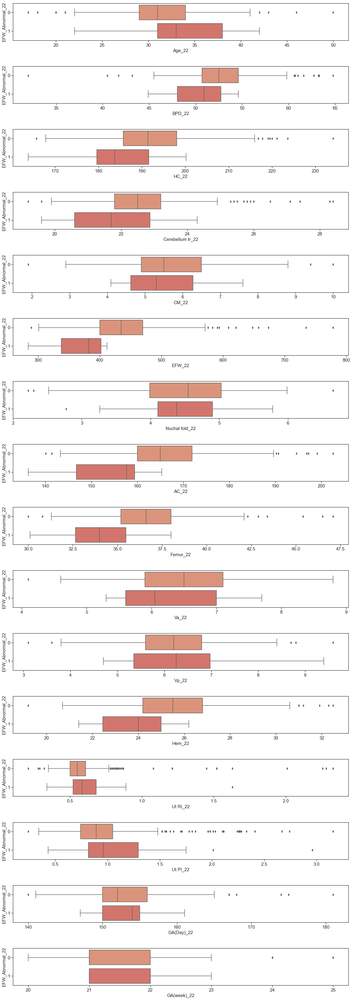

In [16]:
visualize_val_df(value_cols_22, 'EFW_Abnormal_22', df_22)

In [17]:
df_22.columns

Index(['Baby Gender_22', 'Age_22', 'Ethnics_22', 'BPD_22', 'HC_22',
       'Cerebellum tr_22', 'CM_22', 'EFW_22', 'Nuchal fold_22', 'AC_22',
       'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22',
       'IUGR_22', 'GA(Day)_22', 'GA(week)_22', 'EFW_Abnormal_22',
       'BPD_Abnormal_22', 'HC_Abnormal_22', 'AC_Abnormal_22', 'FL_Abnormal_22',
       'CM_Abnormal_22', 'NF_Abnormal_22', 'PI_Abnormal_22', 'RI_Abnormal_22'],
      dtype='object')

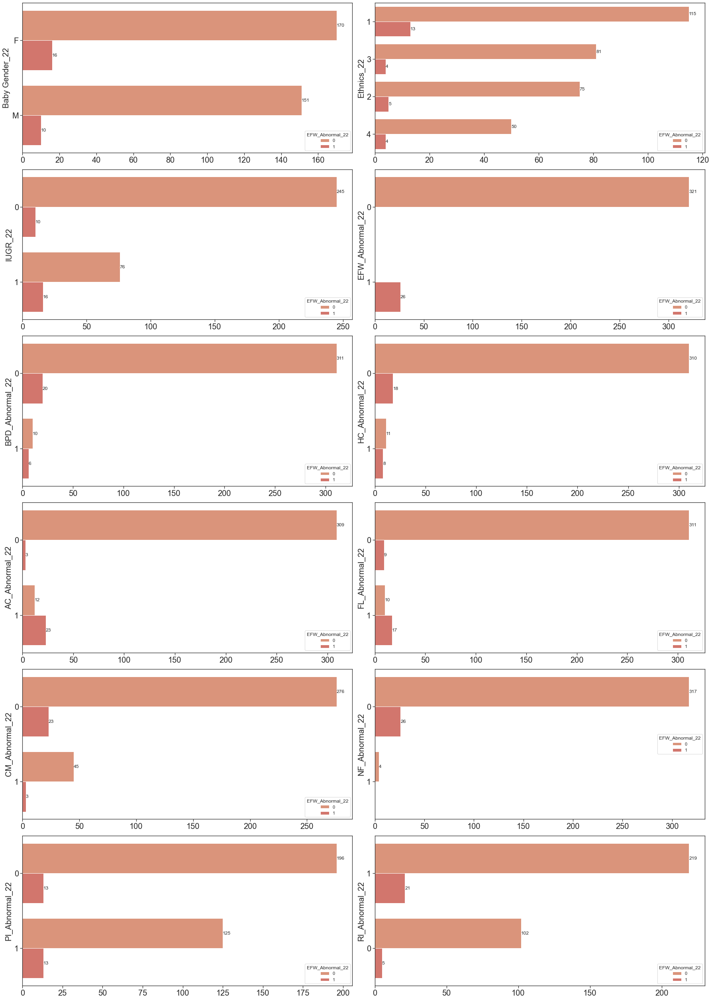

In [18]:
visualize_cat(cat_cols_22, df_22, hue='EFW_Abnormal_22')

In [19]:
check_df(df_22)

No null exist in this dataframe.


# DF32

- create the same stuff in df32, then merge, then visualize again!

In [20]:
df_32 = pd.read_excel('data/antenatal_info.xlsx', sheet_name='Wk 32')
#drop unnecessary columns - OFD(325/333 - 0.9759 Na), Umb PI(225/333 - 0.6756 NA)
#drop GA wk or day
df_32.drop(['Patient Identifier', 'OFD', 'PERCENTILE', 'Umb PI', 'percentile', 'GA SCAN (DAY)', 'GA SCAN (WK)', 'Doc Remark'], axis=1, inplace=True)

#get rid of the 14 null rows
df_32 = df_32[~df_32['HC'].isnull()] 

#rename column for readability
df_32.rename(columns={"PERCENTILE": "OFD_P", "PERCENTILE.1": "HC_P"}, inplace=True)
df_32.rename(columns={"PERCENTILE.2": "AC_P", 'PERCENTILE.3': 'Femur_P'}, inplace=True)
df_32.rename(columns={"PERCENTILE.4": "EFW_P", "PERCENTILE.5": "HC/AC_P"}, inplace=True)
df_32.rename(columns={"PERCENTILE.6": "Umb_S/D_P", 'percentile.1':'Umb_RI_P'}, inplace=True)
df_32.rename(columns={'Percentile': 'Right_Mid_Cerebral_Artery_RI_P'}, inplace=True)
df_32.rename(columns={'Percentile.1':'Right_Mid_Cerebral_Artery_PI_P'}, inplace=True)
df_32.rename(columns={"Doc Remark  (0=Normal, 1=IUGR)": "IUGR"}, inplace=True)


#GA (wk) here is actually GA (Day)
df_32.rename(columns={'GA (wk)':'GA(Day)'}, inplace=True)

#convert all missing value to None
df_32['HC/AC_P'].replace('N', None, inplace=True)

#convert them to correct dtypes
df_32['HC/AC_P'] = df_32['HC/AC_P'].astype('float64')
df_32['IUGR'] = df_32['IUGR'].astype('category')

#dropping again 
'''
Right Mid Cerebral Artery RI: 151 NA
Right_Mid_Cerebral_Artery_RI_P: 151 NA
Right Mid Cerebral Artery PI: 151 NA
Right_Mid_Cerebral_Artery_PI_P: 151 NA
'''
df_32.drop(['Right Mid Cerebral Artery RI', 'Right_Mid_Cerebral_Artery_RI_P', 'Right Mid Cerebral Artery PI', 'Right_Mid_Cerebral_Artery_PI_P'], axis=1, inplace=True)

#error in the data column ['Umb RI'], I guess 44=0.44 (index 179),  65=0.65 (index 302)
'''
array([ 0.53,  0.51,  0.67,  0.64,  0.57,  0.55,  0.72,  0.68,  0.56,
        0.66,  0.6 ,  0.49,  0.62,  0.69,  0.65,  0.48,  0.63,  0.58,
        0.52,  0.61,  0.54,  0.59,  0.7 ,  0.71,  0.5 , 44.  ,  0.75,
        0.77,  0.81,  0.73, 65.  ])
'''

df_32.loc[179, 'Umb RI'] = 0.44
df_32.loc[302, 'Umb RI'] = 0.65

#error in ac
df_32.loc[318, 'AC'] = 279.8
df_32.loc[174, 'AC'] = 267.0
#error in hc/ac
df_32.loc[10, 'HC/AC'] = 1.13
#error in fl/ac
df_32.loc[65, 'FL/AC'] = 0.25

#convert HC_GA to correct one
df_32['HC_GA'] = df_32['HC'] / df_32['GA(Day)']

#drop the outliers
df_32 = df_32[df_32['EFW'] > 100]

#percentile
for col in list(df_32.filter(regex='_P')):
    df_32[col] = df_32[col].apply(lambda x: int(x<=10)) #1 = abnormal
    df_32[col] = df_32[col].astype('category')
    
#add week
df_32['GA(week)'] = df_32['GA(Day)'] // 7

#get gender
df_32 = df_32.merge(df_22['Baby Gender_22'], left_index=True, right_index=True)
df_32.rename(columns={'Baby Gender_22':'Baby Gender'}, inplace=True)

pass

In [21]:
df_32['EFW_Abnormal'] = 0
df_32['HC_Abnormal'] = 0
df_32['AC_Abnormal'] = 0
df_32['FL_Abnormal'] = 0
df_32['AFI_Abnormal'] = 0
df_32['S/D_Abnormal'] = 0
df_32['RI_Abnormal'] = 0

In [22]:
# df_32.groupby('GA(week)').mean() #the afi mean here more similar to brazil one. so im using brazil AFI result as bench mark.

In [23]:
df_32.columns

Index(['HC', 'HC_P', 'AC', 'AC_P', 'FEMUR', 'Femur_P', 'EFW', 'EFW_P', 'HC/AC',
       'HC/AC_P', 'FL/HC', 'FL/AC', 'AFI', 'Umb RI', 'Umb_RI_P', 'Umb S/D',
       'Umb_S/D_P', 'GA(Day)', 'IUGR', 'HC_GA', 'GA(week)', 'Baby Gender',
       'EFW_Abnormal', 'HC_Abnormal', 'AC_Abnormal', 'FL_Abnormal',
       'AFI_Abnormal', 'S/D_Abnormal', 'RI_Abnormal'],
      dtype='object')

In [24]:
#Make abnormal + normal (<=10 centile, >10 centile)

for i, row in df_32.iterrows():
    #from df22
    gender = row['Baby Gender']
    
    ga = row['GA(week)']
    efw = row['EFW']
    hc = row['HC']
    ac = row['AC']
    fl = row['FEMUR']
    afi = row['AFI']
    ri = row['Umb RI']
    sd = row['Umb S/D']
    
    #from research
    if gender == 'M': #male
        efw_centile_10 = float(df_efw[df_efw_male['Gestational Age'] == ga]['Centile_10'])
    elif gender == 'F':
        efw_centile_10 = float(df_efw[df_efw_female['Gestational Age'] == ga]['Centile_10'])
    else:
        efw_centile_10 = float(df_efw[df_efw['Gestational Age'] == ga]['Centile_10'])
        
    #10 or 05 here because some table only show 5 or 10 centile    
    hc_centile_10 = float(df_hc[df_hc['Gestational Age'] == ga]['Centile_10'])
    ac_centile_10 = float(df_ac[df_ac['Gestational Age'] == ga]['Centile_10'])
    fl_centile_10 = float(df_fl[df_fl['Gestational Age'] == ga]['Centile_10'])
    
    afi_centile_05 = float(df_afi_brazil[df_afi_brazil['Gestational Age'] == ga]['Centile_05'])
    ri_centile_05 = float(df_ri[df_ri['Gestational Age'] == ga]['Centile_05'])
    sd_centile_05 = float(df_sd_ratio[df_sd_ratio['Gestational Age'] == ga]['Centile_05'])
    
    #value increases as GA increases
    list1 = [efw_centile_10, hc_centile_10, ac_centile_10, fl_centile_10]
    list2 = [efw, hc, ac, fl]
    list3 = ['EFW_Abnormal', 'HC_Abnormal', 'AC_Abnormal', 'FL_Abnormal']

    for centile_10, ori_val, percentile in zip(list1, list2, list3):
        if centile_10 == None:
            df_32.at[i, percentile] = None
        elif centile_10 >= ori_val: #abnormal
            df_32.at[i, percentile] = 1
            
    #value decreases as GA increases       
    list1 = [afi_centile_05, ri_centile_05, sd_centile_05]
    list2 = [afi, ri, sd]
    list3 = ['AFI_Abnormal', 'RI_Abnormal', 'S/D_Abnormal']
    
    for centile_05, ori_val, percentile in zip(list1, list2, list3):
        if centile_05 == None:
            df_32.at[i, percentile] = None
        elif centile_05 < ori_val: #abnormal
            df_32.at[i, percentile] = 1

In [25]:
#change to correct dtypes
df_32['EFW_Abnormal'] = df_32['EFW_Abnormal'].astype('category')
df_32['HC_Abnormal'] = df_32['HC_Abnormal'].astype('category')
df_32['AC_Abnormal'] = df_32['AC_Abnormal'].astype('category')
df_32['FL_Abnormal'] = df_32['FL_Abnormal'].astype('category')
df_32['AFI_Abnormal'] = df_32['AFI_Abnormal'].astype('category')
df_32['S/D_Abnormal'] = df_32['S/D_Abnormal'].astype('category')
df_32['RI_Abnormal'] = df_32['RI_Abnormal'].astype('category')

In [26]:
df_32.columns

Index(['HC', 'HC_P', 'AC', 'AC_P', 'FEMUR', 'Femur_P', 'EFW', 'EFW_P', 'HC/AC',
       'HC/AC_P', 'FL/HC', 'FL/AC', 'AFI', 'Umb RI', 'Umb_RI_P', 'Umb S/D',
       'Umb_S/D_P', 'GA(Day)', 'IUGR', 'HC_GA', 'GA(week)', 'Baby Gender',
       'EFW_Abnormal', 'HC_Abnormal', 'AC_Abnormal', 'FL_Abnormal',
       'AFI_Abnormal', 'S/D_Abnormal', 'RI_Abnormal'],
      dtype='object')

In [27]:
sns.set_palette('flare')
value_cols_32 = df_32.select_dtypes(include=['float64', 'int64']).columns
cat_cols_32 = df_32.select_dtypes(include=['category']).columns

In [28]:
# df_32.filter(regex='_P').describe() #freq = number of 1
# df_32.filter(regex='_Abnormal').describe()

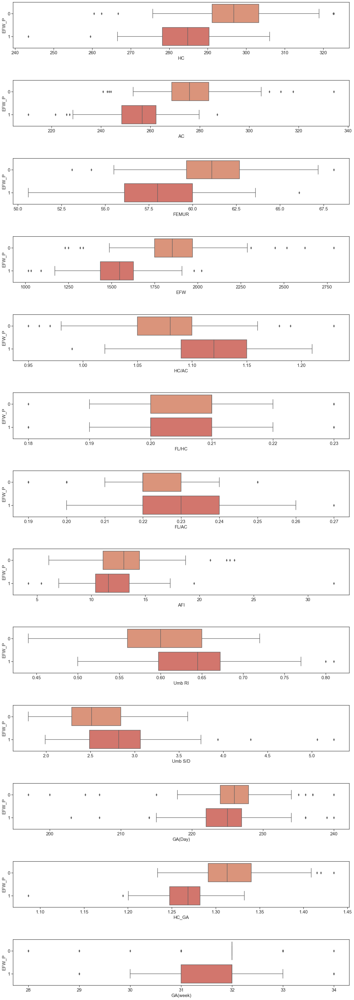

In [29]:
visualize_val_df(value_cols_32, 'EFW_P', df_32)

C:\Users\yc_go\anaconda3\envs\fyp\lib\site-packages\pandas\io\formats\format.py:1429: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())


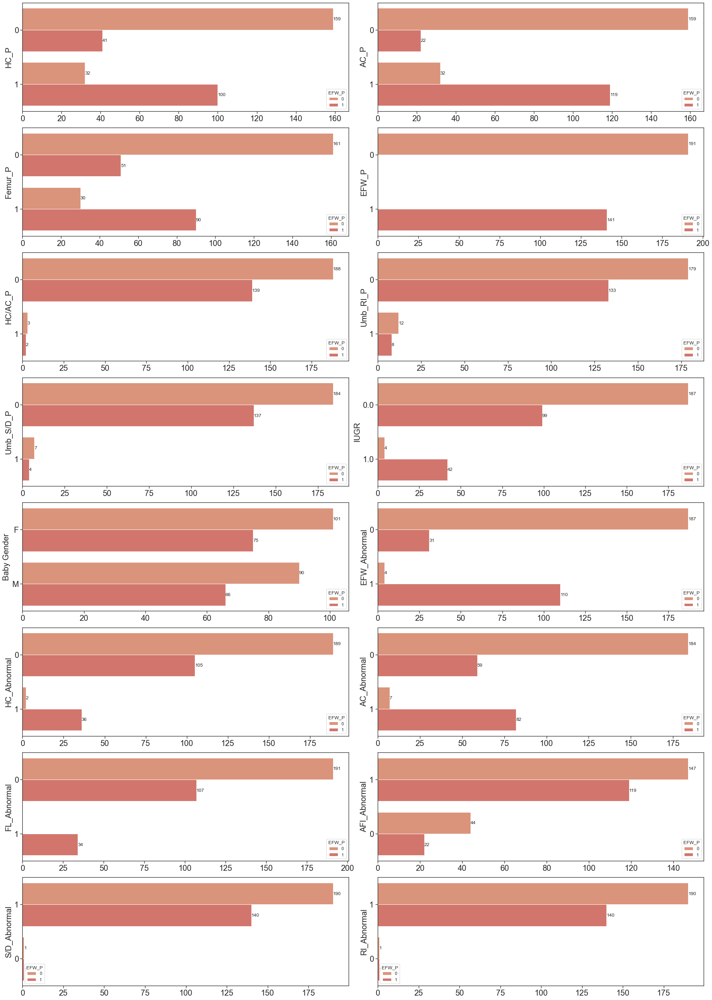

In [30]:
visualize_cat(cat_cols_32, df_32, hue='EFW_P')

## Overall data needed to be filled in df_32

### columns needed to fill in missing data:
AFI:64, (float64) [  4,   5,   9,  11,  17,  23,  26,  31,  37,  45,  46,  49,  53, 57,  59,  61,  84,  87,  90,  93,  95,  96, 100, 106, 108, 111,112, 119, 120, 125, 145, 152, 181, 184, 189, 190, 192, 193, 198, 211, 212, 216, 221, 226, 229, 238, 245, 251, 253, 256, 261, 270, 276, 290, 307, 311, 317, 318, 319, 323, 328, 330, 336, 341]

Umb RI:2, (float64)[54, 256] - Fill

Umb S/D:2, (float64) [54, 256] - Fill

In [31]:
check_df(df_32)

AFI: null=64, dtypes=float64
Umb RI: null=2, dtypes=float64
Umb S/D: null=2, dtypes=float64


In [32]:
df_32.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 332 entries, 0 to 346
Data columns (total 29 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   HC            332 non-null    float64 
 1   HC_P          332 non-null    category
 2   AC            332 non-null    float64 
 3   AC_P          332 non-null    category
 4   FEMUR         332 non-null    float64 
 5   Femur_P       332 non-null    category
 6   EFW           332 non-null    float64 
 7   EFW_P         332 non-null    category
 8   HC/AC         332 non-null    float64 
 9   HC/AC_P       332 non-null    category
 10  FL/HC         332 non-null    float64 
 11  FL/AC         332 non-null    float64 
 12  AFI           268 non-null    float64 
 13  Umb RI        330 non-null    float64 
 14  Umb_RI_P      332 non-null    category
 15  Umb S/D       330 non-null    float64 
 16  Umb_S/D_P     332 non-null    category
 17  GA(Day)       332 non-null    float64 
 18  IUGR      

In [33]:
df_32

,HC,HC_P,AC,AC_P,FEMUR,Femur_P,EFW,EFW_P,HC/AC,HC/AC_P,FL/HC,FL/AC,AFI,Umb RI,Umb_RI_P,Umb S/D,Umb_S/D_P,GA(Day),IUGR,HC_GA,GA(week),Baby Gender,EFW_Abnormal,HC_Abnormal,AC_Abnormal,FL_Abnormal,AFI_Abnormal,S/D_Abnormal,RI_Abnormal
0,296.4,0,279.4,0,60.5,0,1870.0,0,1.06,0,0.20,0.22,12.1,0.53,0,2.14,0,227.0,0.0,1.305727,32.0,M,0,0,0,0,1,1,1
1,300.2,0,277.0,0,61.6,0,1894.0,0,1.08,0,0.21,0.22,14.1,0.51,1,2.04,0,225.0,0.0,1.334222,32.0,F,0,0,0,0,1,1,1
2,289.9,0,274.3,0,57.6,0,1709.0,1,1.06,0,0.20,0.21,13.1,0.67,0,3.06,0,228.0,0.0,1.271491,32.0,M,0,0,0,0,1,1,1
3,288.0,0,265.8,0,59.7,0,1676.0,0,1.08,0,0.21,0.22,11.1,0.64,0,2.76,0,215.0,0.0,1.339535,30.0,F,0,0,0,0,1,1,1
4,307.4,0,275.2,0,60.7,0,1883.0,0,1.12,0,0.20,0.22,NaN,0.53,0,2.12,0,227.0,0.0,1.354185,32.0,M,0,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,283.2,1,273.5,0,62.4,0,1805.0,0,1.04,0,0.22,0.23,NaN,0.72,0,3.60,0,226.0,0.0,1.253097,32.0,F,0,0,0,0,0,1,1
342,274.0,1,248.4,1,58.0,0,1425.0,1,1.10,0,0.21,0.23,11.8,0.63,0,2.67,0,217.0,0.0,1.262673,31.0,F,1,1,1,0,1,1,1
343,302.1,0,269.6,1,61.7,0,1831.0,0,1.12,0,0.20,0.23,11.6,0.59,0,2.45,0,230.0,0.0,1.313478,32.0,M,0,0,0,0,1,1,1
345,291.3,0,273.0,0,59.6,0,1757.0,0,1.07,0,0.20,0.22,15.3,0.56,0,2.26,0,224.0,0.0,1.300446,32.0,M,0,0,0,0,1,1,1


In [34]:
#Use GAN to impute all
'''
AFI:64, (float64) [ 4, 5, 9, 11, 17, 23, 26, 31, 37, 45, 46, 49, 53, 57, 59, 61, 84, 87, 90, 93, 95, 96, 
                    100, 106, 108, 111,112, 119, 120, 125, 145, 152, 181, 184, 189, 190, 192, 193, 198, 
                    211, 212, 216, 221, 226, 229, 238, 245, 251, 253, 256, 261, 270, 276, 290, 307, 311, 
                    317, 318, 319, 323, 328, 330, 336, 341]
Umb RI:2, (float64)[54, 256] - Fill
Umb S/D:2, (float64) [54, 256] - Fill
'''

#all i use default first:
#batch_size =128, hint_rate=0.9, alpha=100, iter=10000
BATCH_SIZE=128
HINT_RATE=0.9
ALPHA=100
ITERATION=10000
gain_parameters = {'batch_size': BATCH_SIZE,
                    'hint_rate': HINT_RATE,
                    'alpha': ALPHA,
                    'iterations': ITERATION}

# Impute missing data
df_32_numpy = df_32.drop('Baby Gender', axis=1).to_numpy().astype('float')
imputed_data_x = gain(df_32_numpy, gain_parameters)

df_32_new = pd.DataFrame(imputed_data_x, columns = df_32.drop('Baby Gender', axis=1).columns)

#Keep track of patient_no
df_32.reset_index(inplace=True) #reset the index

#replace imputed columns
df_32['AFI'] = df_32_new['AFI']
df_32['Umb RI'] = df_32_new['Umb RI']
df_32['Umb S/D'] = df_32_new['Umb S/D']

#convert back the index
df_32.set_index('index', inplace=True)
df_32.index.name = None

100%|███████████████████████████████████████████████████████████████████████████| 10000/10000 [00:25<00:00, 392.77it/s]


In [35]:
df_32.describe()

,HC,AC,FEMUR,EFW,HC/AC,FL/HC,FL/AC,AFI,Umb RI,Umb S/D,GA(Day),HC_GA,GA(week)
count,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000
mean,291.831325,267.264458,59.820482,1724.602410,1.093946,0.205211,0.224277,11.127213,0.616043,2.675586,225.246988,1.295657,31.825301
std,11.609952,16.239449,2.982760,255.339141,0.045096,0.008877,0.011650,4.071467,0.060879,0.457840,5.146714,0.043786,0.716376
min,243.400000,210.600000,50.600000,1018.000000,0.950000,0.180000,0.190000,4.200000,0.440000,1.800000,197.000000,1.086607,28.000000
25%,285.100000,256.950000,57.975000,1568.750000,1.060000,0.200000,0.220000,8.500000,0.570000,2.340000,224.000000,1.268988,32.000000
50%,291.500000,267.000000,60.100000,1731.000000,1.090000,0.200000,0.220000,11.500000,0.620000,2.610000,226.000000,1.292666,32.000000
75%,299.700000,277.225000,61.700000,1891.000000,1.120000,0.210000,0.230000,13.600000,0.660000,2.950000,228.000000,1.322250,32.000000
max,322.800000,334.300000,68.100000,2790.000000,1.230000,0.230000,0.270000,32.400000,0.810000,5.250000,240.000000,1.434667,34.000000


In [36]:
check_df(df_32)

No null exist in this dataframe.


In [37]:
#rename cols 
for col in df_32.columns:
    df_32.rename({col: col+'_32'}, axis='columns', inplace=True)

In [38]:
df_32.columns

Index(['HC_32', 'HC_P_32', 'AC_32', 'AC_P_32', 'FEMUR_32', 'Femur_P_32',
       'EFW_32', 'EFW_P_32', 'HC/AC_32', 'HC/AC_P_32', 'FL/HC_32', 'FL/AC_32',
       'AFI_32', 'Umb RI_32', 'Umb_RI_P_32', 'Umb S/D_32', 'Umb_S/D_P_32',
       'GA(Day)_32', 'IUGR_32', 'HC_GA_32', 'GA(week)_32', 'Baby Gender_32',
       'EFW_Abnormal_32', 'HC_Abnormal_32', 'AC_Abnormal_32', 'FL_Abnormal_32',
       'AFI_Abnormal_32', 'S/D_Abnormal_32', 'RI_Abnormal_32'],
      dtype='object')

# DF35

## Overall data needed to be filled in df_35

### columns needed to fill in missing data:
- AFI: null=50, dtypes=float64
- Right Mid Cerebral Artery RI: null=32, dtypes=float64
- Right Mid Cerebral Artery PI: null=32, dtypes=float64

In [39]:
df_35 = pd.read_excel('data/antenatal_info.xlsx', sheet_name='Wk 35')

#get rid of empty data
df_35 = df_35[df_35['35th Scan done?'] == 'Yes'] #get yes only

#further filter EFW
df_35 = df_35[~df_35['EFW'].isnull()]

#GA (wk) = GA(Day)
df_35['GA(Day)'] = df_35['GA (wk) =']

#145/224=0.647 ('Umb PI', 'percentile')
#>90% 'Unnamed: 30', 'Unnamed: 31', 'Unnamed: 32'
#remove cols ['Umb PI', 'percentile', 'Unnamed: 30', 'Unnamed: 31', 'Unnamed: 32']
df_35.drop(['Umb PI', 'percentile', 'Unnamed: 30', 'Unnamed: 31', 'Unnamed: 32', 'GA SCAN (DAY)', 'GA SCAN (WK)', 'GA (wk) ='], axis=1, inplace=True)

#drop unnecessary cols
df_35.drop(['Patient Identifier', '35th Scan done?', 'Doc Remark'], axis=1, inplace=True)

#rename column for readability
df_35.rename(columns={"PERCENTILE": "HC_P", "PERCENTILE.1": "AC_P"}, inplace=True)
df_35.rename(columns={"PERCENTILE.2": "FEMUR_P", 'PERCENTILE.3': 'EFW_P'}, inplace=True)
df_35.rename(columns={"PERCENTILE.4": "HC/AC_P"}, inplace=True)
df_35.rename(columns={'percentile.1':'Umb_RI_P'}, inplace=True)
df_35.rename(columns={'PERCENTILE.5': 'Umb_S/D_P'}, inplace=True)
df_35.rename(columns={'Percentile.1':'Right_Mid_Cerebral_Artery_PI_P'}, inplace=True)
df_35.rename(columns={"Doc Remark  (0=Normal, 1=IUGR)": "IUGR"}, inplace=True)
df_35.rename(columns={"Percentile": "Right_Mid_Cerebral_Artery_RI_P"}, inplace=True)

#correcting ac_p
df_35.loc[254, 'AC_P'] = 1
df_35.loc[279, 'AC_P'] = 1
df_35.loc[339, 'AC_P'] = 1

#percentile
for col in list(df_35.filter(regex='_P')):
    df_35[col] = df_35[col].apply(lambda x: int(x<=10)) #1 = abnormal
    df_35[col] = df_35[col].astype('category')

#df_35['AC'] index 236 from 2911 to 291.1
df_35.loc[236, 'AC'] = 291.1
df_35.loc[155, 'AC'] = 301.5 #from 30.15

#outliers
#drop 45, 132 (GAweek = 26, EFW outliers)
df_35.drop(index=[45,132], inplace=True)

#RI
df_35.loc[270, 'Right Mid Cerebral Artery RI'] = 0.7 #from 70

#convert to correct dtypes
df_35['AC'] = df_35['AC'].astype('float')
df_35['IUGR'] = df_35['IUGR'].astype('category')

In [40]:
#add week
df_35['GA(week)'] = df_35['GA(Day)'] // 7

#get gender
df_35 = df_35.merge(df_22['Baby Gender_22'], left_index=True, right_index=True)

In [41]:
df_35 ['EFW_Abnormal'] = 0

for i, row in df_35.iterrows():
    #from df22
    gender = row['Baby Gender_22']
    efw = row['EFW']
    ga = row['GA(week)']

    #from research
    if gender == 'M': #male
        efw_centile_10 = float(df_efw[df_efw_male['Gestational Age'] == ga]['Centile_10'])
    elif gender == 'F':
        efw_centile_10 = float(df_efw[df_efw_female['Gestational Age'] == ga]['Centile_10'])
    else:
        efw_centile_10 = float(df_efw[df_efw['Gestational Age'] == ga]['Centile_10'])
    
    #value increases as GA increases
    list1 = [efw_centile_10]
    list2 = [efw]
    list3 = ['EFW_Abnormal']

    for centile_10, ori_val, percentile in zip(list1, list2, list3):
        if centile_10 == None:
            df_35.at[i, percentile] = None
        elif centile_10 >= ori_val: #abnormal
            df_35.at[i, percentile] = 1
            
df_35['EFW_Abnormal'] = df_35['EFW_Abnormal'].astype('category')

In [42]:
df_35['HC/AC'] = round(df_35['HC'] / df_35['AC'], 2)
df_35['FL/HC'] = round(df_35['FEMUR'] / df_35['HC'], 2)
df_35['FL/AC'] = round(df_35['FEMUR'] / df_35['AC'], 2)

In [43]:
sns.set_palette('flare')
value_cols_35 = df_35.select_dtypes(include=['float64', 'int64']).columns
cat_cols_35 = df_35.select_dtypes(include=['category']).columns

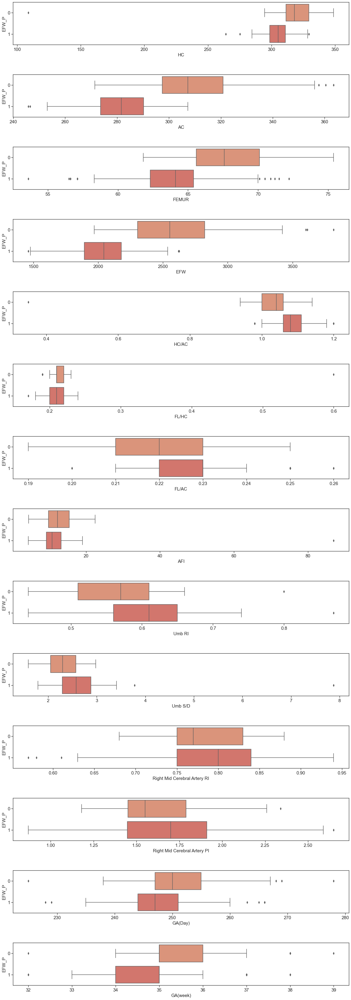

In [44]:
visualize_val_df(value_cols_35, 'EFW_P', df_35)

C:\Users\yc_go\anaconda3\envs\fyp\lib\site-packages\pandas\io\formats\format.py:1429: FutureWarning: Index.ravel returning ndarray is deprecated; in a future version this will return a view on self.
  for val, m in zip(values.ravel(), mask.ravel())


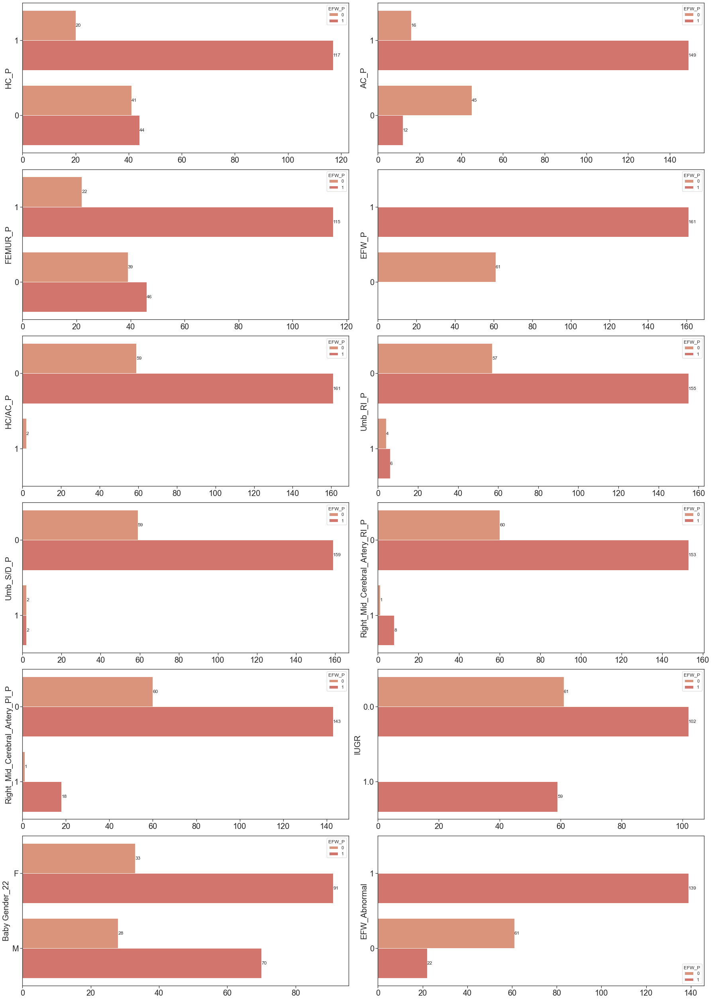

In [45]:
# visualize_cat(cat_cols, df_35, hue='EFW_Abnormal')
visualize_cat(cat_cols_35, df_35, hue='EFW_P')

In [46]:
check_df(df_35)

AFI: null=51, dtypes=float64
Umb RI: null=1, dtypes=float64
Umb S/D: null=1, dtypes=float64
Right Mid Cerebral Artery RI: null=33, dtypes=float64
Right Mid Cerebral Artery PI: null=33, dtypes=float64


In [47]:
df_35.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 222 entries, 2 to 346
Data columns (total 26 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   HC                              222 non-null    float64 
 1   HC_P                            222 non-null    category
 2   AC                              222 non-null    float64 
 3   AC_P                            222 non-null    category
 4   FEMUR                           222 non-null    float64 
 5   FEMUR_P                         222 non-null    category
 6   EFW                             222 non-null    float64 
 7   EFW_P                           222 non-null    category
 8   HC/AC                           222 non-null    float64 
 9   HC/AC_P                         222 non-null    category
 10  FL/HC                           222 non-null    float64 
 11  FL/AC                           222 non-null    float64 
 12  AFI                   

In [48]:
#Use GAN to impute all
'''
AFI: null=50, dtypes=float64
Right Mid Cerebral Artery RI: null=32, dtypes=float64
Right Mid Cerebral Artery PI: null=32, dtypes=float64
Umb RI: null=1, dtypes=float64
Umb S/D: null=1, dtypes=float64
'''

#all i use default first:
#batch_size =128, hint_rate=0.9, alpha=100, iter=10000
BATCH_SIZE=128
HINT_RATE=0.9
ALPHA=100
ITERATION=10000
gain_parameters = {'batch_size': BATCH_SIZE,
                    'hint_rate': HINT_RATE,
                    'alpha': ALPHA,
                    'iterations': ITERATION}

# Impute missing data
df_35_numpy = df_35.drop('Baby Gender_22', axis=1).to_numpy().astype('float')
imputed_data_x = gain(df_35_numpy, gain_parameters)

df_35_new = pd.DataFrame(imputed_data_x, columns = df_35.drop('Baby Gender_22', axis=1).columns)

#Keep track of patient_no
df_35.reset_index(inplace=True) #reset the index

#replace imputed columns
df_35['AFI'] = df_35_new['AFI']
df_35['Right Mid Cerebral Artery RI'] = df_35_new['Right Mid Cerebral Artery RI']
df_35['Right Mid Cerebral Artery PI'] = df_35_new['Right Mid Cerebral Artery PI']
df_35['Umb RI'] = df_35_new['Umb RI']
df_35['Umb S/D'] = df_35_new['Umb S/D']

#convert back the index
df_35.set_index('index', inplace=True)
df_35.index.name = None

100%|███████████████████████████████████████████████████████████████████████████| 10000/10000 [00:20<00:00, 479.90it/s]


In [49]:
#rename cols 
for col in df_35.columns:
    df_35.rename({col: col+'_35'}, axis='columns', inplace=True)

## DF_22 ->DF_32

In [50]:
df_22_32 = df_22.merge(df_32[['EFW_32', 'EFW_Abnormal_32','EFW_P_32', 'GA(week)_32']], left_index=True, right_index=True)

In [51]:
df_22_32.columns

Index(['Baby Gender_22', 'Age_22', 'Ethnics_22', 'BPD_22', 'HC_22',
       'Cerebellum tr_22', 'CM_22', 'EFW_22', 'Nuchal fold_22', 'AC_22',
       'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22',
       'IUGR_22', 'GA(Day)_22', 'GA(week)_22', 'EFW_Abnormal_22',
       'BPD_Abnormal_22', 'HC_Abnormal_22', 'AC_Abnormal_22', 'FL_Abnormal_22',
       'CM_Abnormal_22', 'NF_Abnormal_22', 'PI_Abnormal_22', 'RI_Abnormal_22',
       'EFW_32', 'EFW_Abnormal_32', 'EFW_P_32', 'GA(week)_32'],
      dtype='object')

In [52]:
df_22_32.describe()

,Age_22,BPD_22,HC_22,Cerebellum tr_22,CM_22,EFW_22,Nuchal fold_22,AC_22,Femur_22,Va_22,Vp_22,Hem_22,Ut RI_22,Ut PI_22,GA(Day)_22,GA(week)_22,EFW_32,GA(week)_32
count,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000,332.000000
mean,31.454819,52.584940,191.819880,22.505723,5.695482,436.632530,4.511289,165.514157,36.506325,6.504247,6.247319,25.433012,0.597648,0.991973,153.114458,21.412651,1724.602410,31.825301
std,4.497842,3.556146,10.078653,1.327332,1.235897,65.942096,0.762706,10.559419,2.447143,0.850334,0.987445,2.109661,0.244358,0.437184,4.549709,0.687539,255.339141,0.716376
min,17.000000,32.000000,163.800000,19.200000,1.900000,284.000000,2.220000,136.300000,30.000000,4.100000,3.100000,19.200000,0.210000,0.240000,140.000000,20.000000,1018.000000,28.000000
25%,29.000000,50.575000,185.300000,21.800000,4.900000,394.000000,4.005000,158.875000,35.000000,5.860000,5.600000,24.075000,0.500000,0.740000,150.000000,21.000000,1568.750000,32.000000
50%,31.000000,52.300000,191.200000,22.400000,5.500000,431.000000,4.540000,164.600000,36.400000,6.500000,6.200000,25.400000,0.550000,0.890000,153.000000,21.000000,1731.000000,32.000000
75%,34.000000,54.500000,197.275000,23.200000,6.425000,468.000000,5.022500,171.600000,37.825000,7.100000,6.825000,26.625000,0.610000,1.050000,156.000000,22.000000,1891.000000,32.000000
max,50.000000,64.800000,234.100000,28.400000,10.000000,779.000000,6.660000,202.600000,47.100000,8.800000,9.600000,32.500000,2.330000,3.160000,181.000000,25.000000,2790.000000,34.000000


In [53]:
sns.set_palette('flare')
value_cols_22_32 = df_22_32.select_dtypes(include=['float64', 'int64']).columns
cat_cols_22_32 = df_22_32.select_dtypes(include=['category']).columns

In [56]:
concat

,[EFW_32_P] how much more % of <=10 centile to reach >10 centile
Age_22,0.023487
BPD_22,0.032644
HC_22,0.025504
Cerebellum tr_22,0.020510
CM_22,0.065268
EFW_22,0.089920
Nuchal fold_22,0.075099
AC_22,0.036843
Femur_22,0.038095
Va_22,0.020653


C:\Users\yc_go\AppData\Local\Temp/ipykernel_8360/3599481846.py:4: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  concat = pd.concat([(df2.mean() - df1.mean()) / df1.mean()], axis=1, keys=['[EFW_32_P] how much more % of <=10 centile to reach >10 centile'])


Text(0, 0.5, 'Percentage Difference')

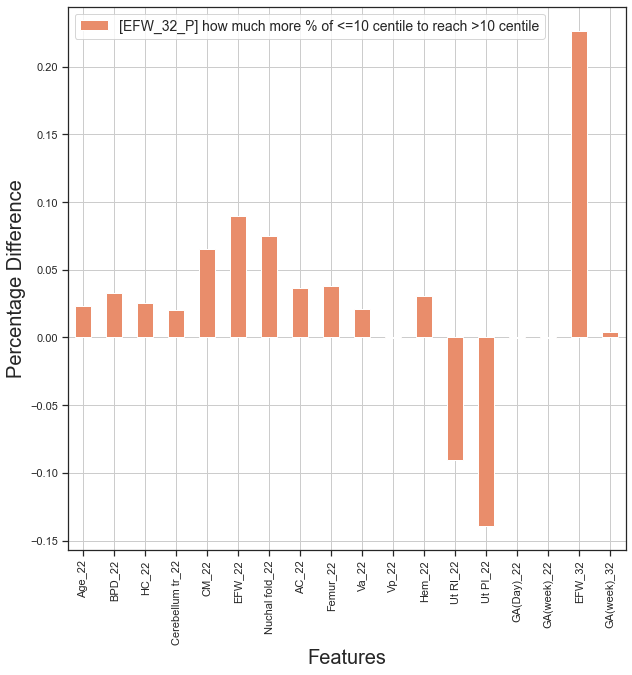

In [63]:
df1 = df_22_32[df_22_32['EFW_P_32'] == 1]
df2 = df_22_32[df_22_32['EFW_P_32'] == 0]

concat = pd.concat([(df2.mean() - df1.mean()) / df1.mean()], axis=1, keys=['[EFW_32_P] how much more % of <=10 centile to reach >10 centile'])
ax = concat.plot(kind='bar', grid=True, figsize=(10, 10))
ax.legend(loc='upper left', fontsize=14)
ax.set_xlabel("Features", fontsize=20)
ax.set_ylabel("Percentage Difference", fontsize=20)

In [64]:
df_22_32.columns

Index(['Baby Gender_22', 'Age_22', 'Ethnics_22', 'BPD_22', 'HC_22',
       'Cerebellum tr_22', 'CM_22', 'EFW_22', 'Nuchal fold_22', 'AC_22',
       'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22',
       'IUGR_22', 'GA(Day)_22', 'GA(week)_22', 'EFW_Abnormal_22',
       'BPD_Abnormal_22', 'HC_Abnormal_22', 'AC_Abnormal_22', 'FL_Abnormal_22',
       'CM_Abnormal_22', 'NF_Abnormal_22', 'PI_Abnormal_22', 'RI_Abnormal_22',
       'EFW_32', 'EFW_Abnormal_32', 'EFW_P_32', 'GA(week)_32'],
      dtype='object')

In [187]:
def visualize_cat_percentile(cols, df, hue=None):
    '''
    visulizing categorical data.
    '''

    fig, ax = plt.subplots(math.floor(len(cols)/2) , 2, figsize=(25,35))
    fig.subplots_adjust(top=20)
    minus =0 
    n = df.shape[0]
    for index, col in enumerate(cols):
        if col == hue:
            minus+=1
            continue
        b = sns.countplot(y=col, data=df, ax=ax[(index-minus)//2, (index-minus)%2], 
                      order = df[col].value_counts().index, hue=hue)
        
        correct = (df[(df[col] == 0) & (df[hue] == 0)]).shape[0] + (df[ (df[col] == 1) & (df[hue] == 1)]).shape[0]
        
        if col not in ['Baby Gender_22', 'Ethnics_22']:
            b.set_xlabel(f'{round((correct/n)*100, 2)}% correct', fontsize = 20.0) # X label
        else:
            b.set_xlabel(f'INVALID', fontsize = 20.0) # X label
        b.set_ylabel(col, fontsize = 20.0) # Y label
        b.tick_params(labelsize=20)

        for container in b.containers:
            b.bar_label(container,  fontsize=20)
        
        b.legend([f'{hue}: 0|>10 centiles', f'{hue}: 1|<=10 centiles'],fontsize=15, loc='best')
        
    fig.tight_layout()
    plt.show()

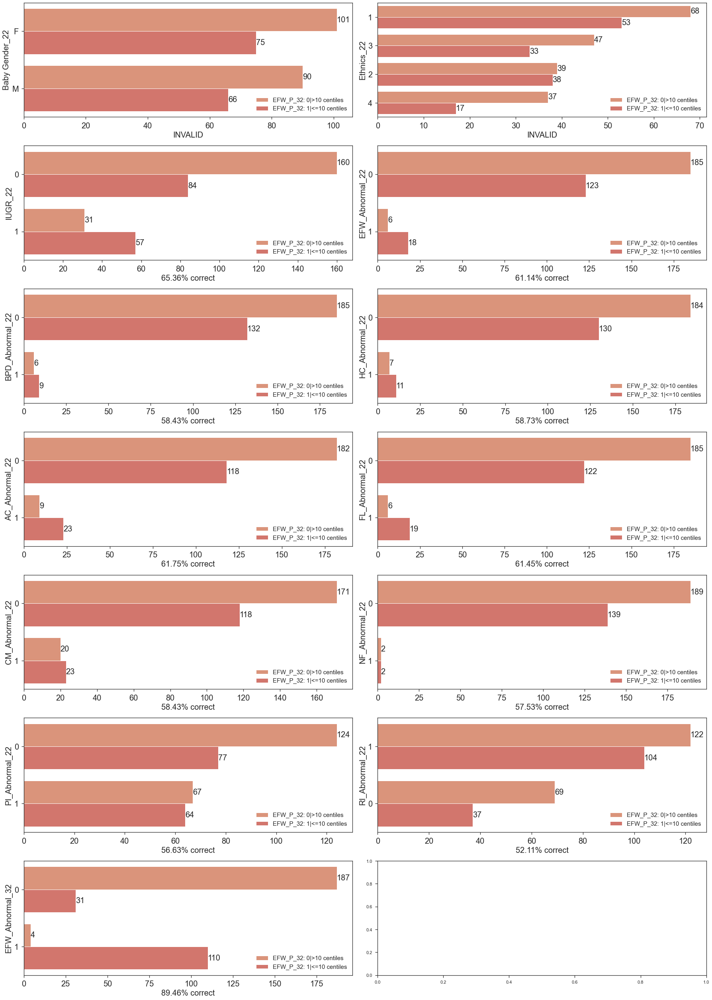

In [188]:
visualize_cat_percentile(cat_cols_22_32, df_22_32, hue='EFW_P_32')

AC, FEMUR, and EFW_22 abnormal tend to lead EFW_32 abnormal

## DF_22 + DF_32 -> DF_35

- previously I used:
    - ['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'FEMUR_32', 'CM_22', 'Nuchal fold_22', 'Va_22', 'Hem_22', 'Age_22', 'EFW_35']

In [66]:
df_22_32_temp = df_22.merge(df_32, left_index= True, right_index=True) #join based on left index and right index
df_22_32_35 = df_22_32_temp.merge(df_35[['EFW_35', 'EFW_Abnormal_35','EFW_P_35', 'IUGR_35', 'GA(week)_35']], left_index= True, right_index=True) #join based on left index and right index

In [67]:
df_22_32_35.drop('Baby Gender_32', axis=1, inplace=True)

C:\Users\yc_go\AppData\Local\Temp/ipykernel_8360/1261289053.py:8: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  concat_22_32_35 = pd.concat([(df2_p.mean() - df1_p.mean()) / df1_p.mean()], axis=1, keys=['[EFW_35_P] how much more % of <=10 centile to reach 10 centile'])


Text(0, 0.5, 'Percentage Difference')

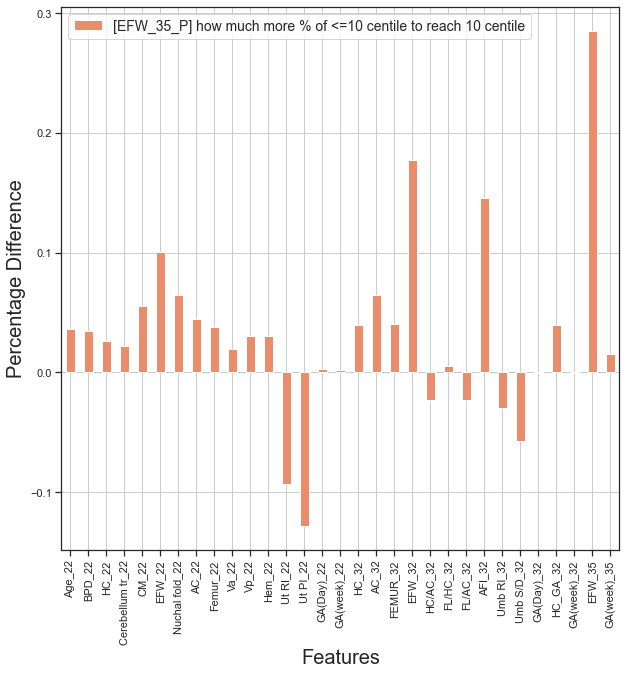

In [68]:
sns.set_palette('flare')
value_cols_223235 = df_22_32_35.select_dtypes(include=['float64', 'int64']).columns
cat_cols_223235 = df_22_32_35.select_dtypes(include=['category']).columns

df1_p = df_22_32_35[df_22_32_35['EFW_P_35'] == 1]
df2_p = df_22_32_35[df_22_32_35['EFW_P_35'] == 0]
                                                                                          
concat_22_32_35 = pd.concat([(df2_p.mean() - df1_p.mean()) / df1_p.mean()], axis=1, keys=['[EFW_35_P] how much more % of <=10 centile to reach 10 centile'])
ax_22_32_35 = concat_22_32_35.plot(kind='bar', figsize=(10, 10), grid=True)
ax_22_32_35.legend(loc='upper left', fontsize=14)
ax_22_32_35.set_xlabel("Features", fontsize=20)
ax_22_32_35.set_ylabel("Percentage Difference", fontsize=20)

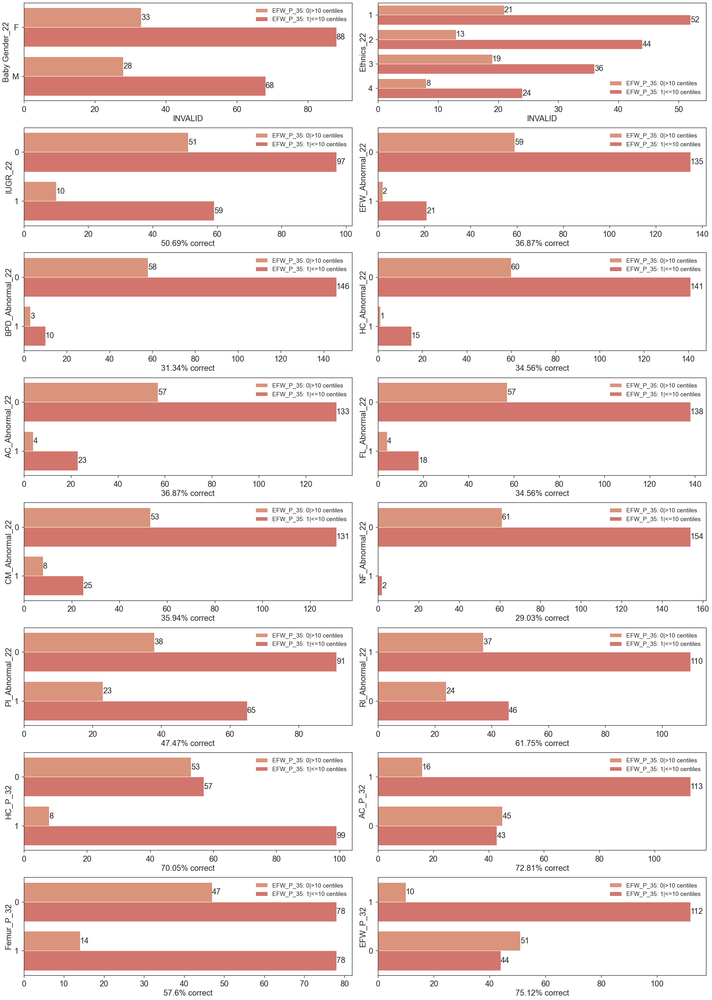

In [192]:
visualize_cat_percentile(cat_cols_223235[:len(cat_cols_223235)//2 + 1], df_22_32_35, hue='EFW_P_35')

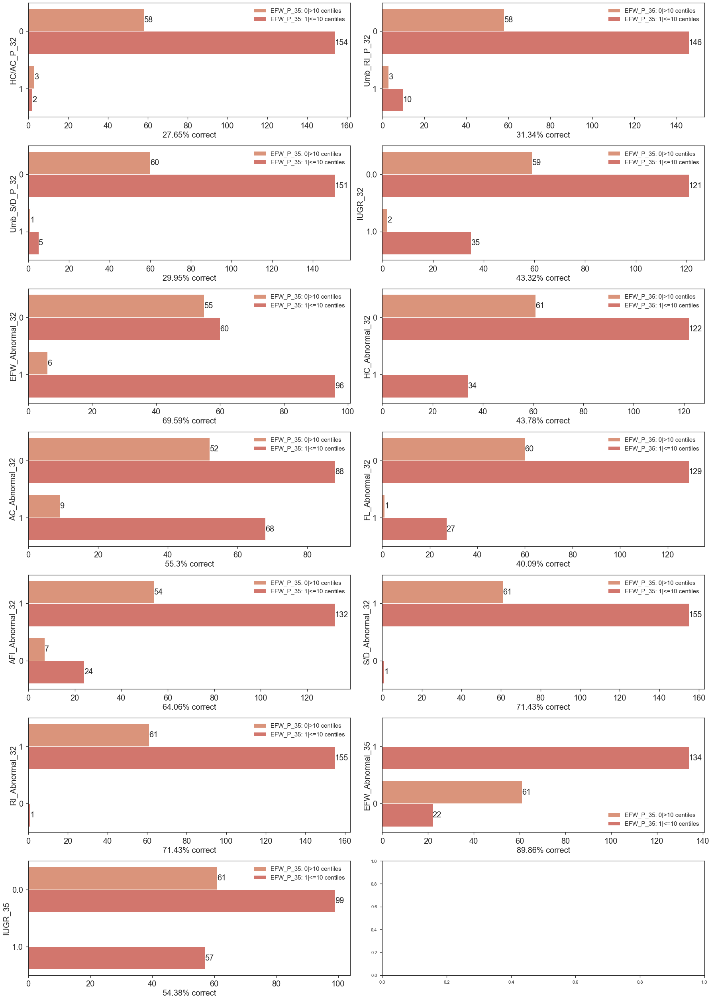

In [193]:
visualize_cat_percentile(cat_cols_223235[(len(cat_cols_223235)//2) + 1:], df_22_32_35, hue='EFW_P_35')

## DF_32 -> DF_35

In [194]:
df_32_35 = df_32.merge(df_35[['EFW_35', 'EFW_Abnormal_35', 'IUGR_35', 'GA(week)_35']], left_index= True, right_index=True) #join based on left index and right index

### Interpret these graphs

# Prediction - NOW

## DF_22 -> 32

In [195]:
from pycaret.regression import *

<AxesSubplot:>

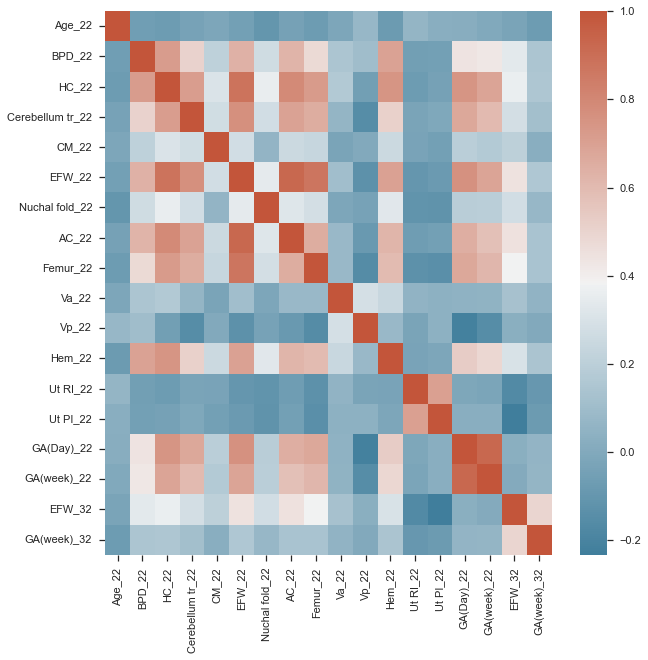

In [196]:
# correlation graph
f, ax = plt.subplots(figsize=(10,10))
corr = df_22_32.corr()
# corr = df_22.drop(columns_to_drop, axis=1).corr()
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, cmap=cmap)

In [197]:
#STEP 1 - 30 features

#Everything that is best
#numeric_features=['GA(week)_22']
exp_reg101 = setup(data = df_22_32.drop(['EFW_Abnormal_32', 'EFW_P_32'], axis=1), target = 'EFW_32', session_id=12) 

,Description,Value
0,session_id,12
1,Target,EFW_32
2,Original Data,"(332, 30)"
3,Missing Values,False
4,Numeric Features,16
5,Categorical Features,13
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(232, 36)"


In [198]:
# len(df_22_32.drop(['EFW_Abnormal_32', 'EFW_P_32'], axis=1).columns)

In [199]:
# get_config('X').columns

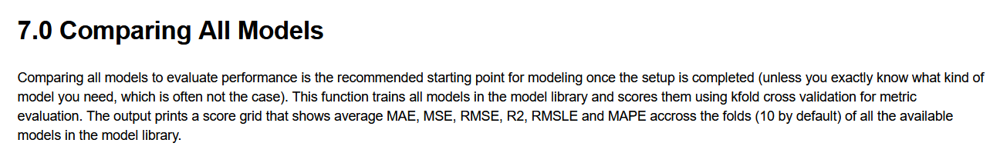

- RMSE is average, not the best

In [200]:
compare_models()
#bench mark huber 	Huber Regressor 	125.7031 	27145.5016 	162.6137 	0.5661 	0.0935 	0.0732 	0.0150
#pca - worse.
#feature selection - worse
#normalize - worse
#this should be using all training and test set to crossvalidate (default = 10 folds)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
huber,Huber Regressor,125.7031,27145.5016,162.6137,0.5661,0.0935,0.0732,0.0150
br,Bayesian Ridge,126.9486,27627.9750,164.3955,0.5491,0.0940,0.0741,0.0070
lasso,Lasso Regression,130.6038,29647.3413,169.9445,0.5038,0.0964,0.0761,0.0090
en,Elastic Net,136.5584,30988.5232,174.7454,0.4919,0.1020,0.0809,0.0090
ridge,Ridge Regression,131.7263,30296.7212,171.9122,0.4861,0.0973,0.0768,0.0070
llar,Lasso Least Angle Regression,133.6093,31994.7685,175.6430,0.4835,0.0990,0.0776,0.0090
omp,Orthogonal Matching Pursuit,143.5135,35731.8239,185.6086,0.4304,0.1041,0.0828,0.0070
lr,Linear Regression,135.0916,32921.8231,178.2441,0.4224,0.1005,0.0789,0.0220
et,Extra Trees Regressor,143.9408,36378.5153,187.7403,0.4145,0.1080,0.0850,0.0910
ada,AdaBoost Regressor,151.4002,39918.8169,195.6054,0.3823,0.1133,0.0893,0.0350


HuberRegressor(alpha=0.0001, epsilon=1.35, fit_intercept=True, max_iter=100,
               tol=1e-05, warm_start=False)

In [201]:
model_ = create_model('huber')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,112.3712,23727.7849,154.0383,0.4345,0.0885,0.0670
1,91.0578,15099.7091,122.8809,0.5134,0.0719,0.0556
2,177.0067,50113.6130,223.8607,0.5628,0.1189,0.0969
3,124.6937,22211.7202,149.0360,0.5567,0.0906,0.0754
4,121.2173,30026.2643,173.2809,0.5279,0.0950,0.0677
5,128.3671,24868.4866,157.6975,0.6527,0.0896,0.0748
6,160.1571,36937.1224,192.1903,0.6352,0.1049,0.0869
7,110.2778,21705.3541,147.3274,0.6467,0.0907,0.0678
8,118.8971,23526.0821,153.3821,0.5825,0.0987,0.0756
9,112.9849,23238.8795,152.4430,0.5485,0.0866,0.0644


In [204]:
tuned_model = tune_model(model_, choose_better=True)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,115.2599,22735.9837,150.7846,0.4582,0.0854,0.0688
1,98.2253,16765.9026,129.4832,0.4597,0.0769,0.0609
2,178.4892,49798.5774,223.1559,0.5655,0.1185,0.0977
3,122.6427,22168.1377,148.8897,0.5576,0.0898,0.0741
4,126.4874,31050.5003,176.2115,0.5118,0.0962,0.0706
5,127.4015,26854.8950,163.8746,0.6250,0.0944,0.0748
6,168.7717,40160.8150,200.4016,0.6034,0.1087,0.0917
7,107.9449,22200.1116,148.9970,0.6386,0.0915,0.0668
8,124.1386,24666.2891,157.0551,0.5623,0.1001,0.0787
9,114.4615,25113.2898,158.4717,0.5121,0.0895,0.0659


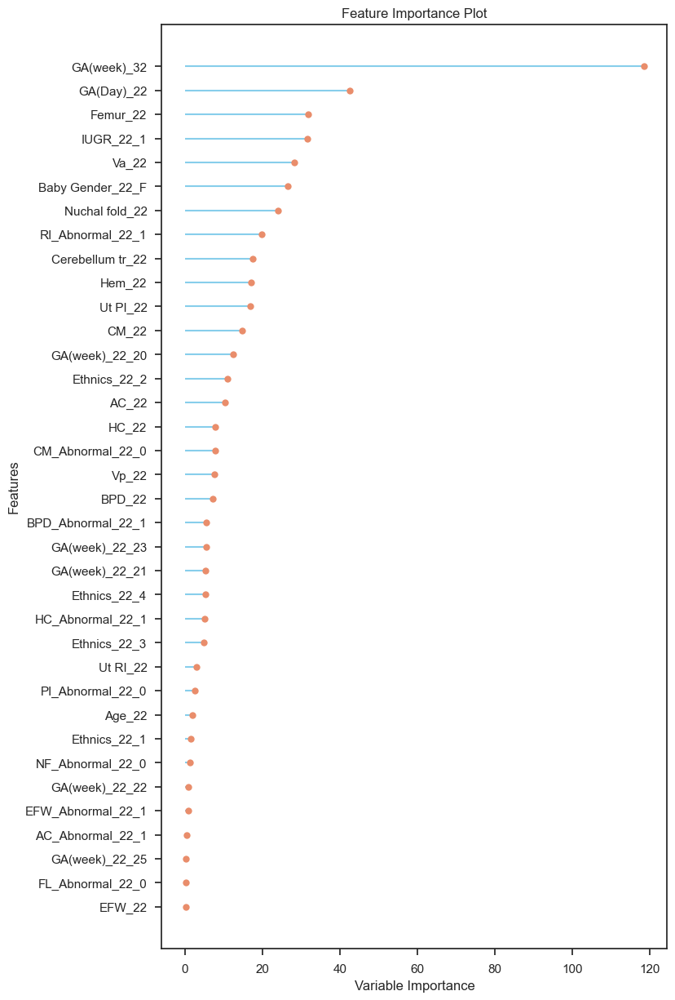

In [205]:
plot_model(tuned_model, plot='feature_all')

# Index(['Age_22', 'BPD_22', 'HC_22', 'Cerebellum tr_22', 'CM_22', 'EFW_22',
#        'Nuchal fold_22', 'AC_22', 'Femur_22', 'Va_22', 'Vp_22', 'Hem_22',
#        'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'GA(week)_32', 'Baby Gender_22_F',
#        'Ethnics_22_1', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4',
#        'IUGR_22_1', 'GA(week)_22_20', 'GA(week)_22_21', 'GA(week)_22_22',
#        'GA(week)_22_23', 'GA(week)_22_25', 'EFW_Abnormal_22_1',
#        'BPD_Abnormal_22_1', 'HC_Abnormal_22_1', 'AC_Abnormal_22_1',
#        'FL_Abnormal_22_0', 'CM_Abnormal_22_0', 'NF_Abnormal_22_0',
#        'PI_Abnormal_22_0', 'RI_Abnormal_22_1'],
#       dtype='object')

# ['GA(week)_32', 'GA(Day)_22', 'Femur_22', 'IUGR_22_1', 'Va_22', 'Baby Gender_22_F', 'Nuchal fold_22', 'RI_Abnormal_22_1', 'Cerebellum tr_22', 'Hem_22']
# ['Ut PI_22', 'CM_22', 'Ethnics_22_1', 'AC_22', 'HC_22']

In [206]:
predict_model(tuned_model)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Huber Regressor,114.8100,22252.9102,149.1741,0.6125,0.0875,0.0675


,Age_22,BPD_22,HC_22,Cerebellum tr_22,CM_22,EFW_22,Nuchal fold_22,AC_22,Femur_22,Va_22,...,BPD_Abnormal_22_1,HC_Abnormal_22_1,AC_Abnormal_22_1,FL_Abnormal_22_0,CM_Abnormal_22_0,NF_Abnormal_22_0,PI_Abnormal_22_0,RI_Abnormal_22_1,EFW_32,Label
0,31.0,52.299999,186.000000,23.000000,5.9,415.0,4.43,162.399994,36.299999,6.4,...,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1894.0,1748.187623
1,36.0,58.500000,207.699997,23.400000,5.4,512.0,5.22,176.000000,38.799999,7.3,...,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1946.0,1995.856556
2,29.0,52.400002,184.600006,22.500000,6.5,423.0,3.96,164.100006,36.799999,6.1,...,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1748.0,1647.782236
3,33.0,54.900002,198.100006,22.299999,5.5,447.0,4.05,169.199997,36.099998,8.1,...,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1581.0,1879.254405
4,36.0,52.299999,184.399994,22.400000,4.9,393.0,2.30,159.300003,35.200001,7.3,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1481.0,1527.795225
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,33.0,53.400002,191.899994,24.000000,7.4,478.0,5.20,173.800003,38.200001,4.6,...,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,2288.0,1963.394777
96,35.0,49.099998,183.199997,22.400000,5.8,396.0,4.32,164.300003,34.099998,5.7,...,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1778.0,1665.929400
97,24.0,54.200001,189.800003,23.000000,7.3,426.0,5.59,168.199997,35.200001,6.2,...,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1474.0,1445.159656
98,35.0,55.799999,203.899994,22.900000,8.0,541.0,3.93,185.300003,38.700001,7.0,...,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1865.0,1903.126433


In [ ]:
# tuned_model_ = tune_model(model_)
# final_model = finalize_model(tuned_model_)
# import datetime
# save_model(final_model,'Huber_22_32 ' + datetime.datetime.now().strftime('%d-%b-%Y'))

**From 15 columns here - top 15 feature importances**
- ['GA(week)_32', 'GA(Day)_22', 'Femur_22', 'IUGR_22_1', 'Va_22', 'Baby Gender_22_F', 'Nuchal fold_22', 'RI_Abnormal_22_1', 'Cerebellum tr_22', 'Hem_22', 'Ut PI_22', 'CM_22', 'Ethnics_22_1', 'AC_22', 'HC_22']

**to - Manual testing around to pick best relevant features without affecting the result much.**
0.5673r2

- ['GA(week)_32', 'GA(Day)_22', 'Femur_22', 'IUGR_22', 'Va_22', 'Baby Gender_22', 'Nuchal fold_22', 'CM_22', 'AC_22', 'HC_22', 'EFW_32']

**To Predict**
- ['EFW_32']

In [ ]:
def filter_feature(df, col_test, target, df_result = pd.DataFrame(columns=['Model', 'R2', 'RMSE', 'Feature Removed', 'Help?', 'Comments'])):
    
    '''
    if the features affect >=0.01 r2, only that it get accepted.
    '''
    r2_tolerate = 0.01
    
    #get threshold
    r2_threshold, rmse_threshold = 0, 0

    df = df[col_test + [target]] 
    
    exp_reg101 = setup(data = df, target = target , session_id=12, silent=True) 
    compare_models()
    score = pull()

    best_row = score.iloc[0]

    model_threshold = best_row['Model']
    r2_threshold = best_row['R2']
    rmse_threshold = best_row['RMSE']

    df_add = pd.DataFrame([[model_threshold, r2_threshold, rmse_threshold, 'None', 'None', 'Threshold']], 
                          columns=['Model', 'R2', 'RMSE', 'Feature Removed', 'Help?', 'Comments'])
    df_result = df_result.append(df_add)
    
    #get results
    cols_to_use = []
    for index, col in enumerate(col_test):
        col_to_use = col_test[:index] + col_test[index+1:] + [target]
        exp_reg101 = setup(data = df[col_to_use], target = target , session_id=12, silent=True) 
        compare_models()
        score = pull()

        best_row = score.iloc[0]

        best_model = best_row['Model']
        best_r2 = best_row['R2']
        best_rmse = best_row['RMSE']
        
        help_ = (r2_threshold-r2_tolerate>best_r2 and rmse_threshold<best_rmse) #bench mark r2 > test r2, means that the feature removed aid
        
        if help_:
            cols_to_use.append(col)
        
        df_add = pd.DataFrame([[best_model, best_r2, best_rmse, col, help_, 'Compare']], 
                              columns=['Model', 'R2', 'RMSE', 'Feature Removed', 'Help?', 'Comments'])
        
        df_result = df_result.append(df_add)
        
    print('DONE!')
    return df_result.reset_index(drop=True), cols_to_use

In [207]:
#STEP 2 - 15 features

col_test = ['GA(week)_32', 'GA(Day)_22', 'Femur_22', 'IUGR_22', 'Va_22', 'Baby Gender_22', 'Nuchal fold_22', 'RI_Abnormal_22', 'Cerebellum tr_22', 'Hem_22', 'Ut PI_22', 'CM_22', 'Ethnics_22', 'AC_22', 'HC_22']
exp_reg101 = setup(data = df_22_32[col_test + ['EFW_32']], target = 'EFW_32', session_id=12) 

,Description,Value
0,session_id,12
1,Target,EFW_32
2,Original Data,"(332, 16)"
3,Missing Values,False
4,Numeric Features,11
5,Categorical Features,4
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(232, 18)"


In [79]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lasso,Lasso Regression,124.9324,27406.1263,162.7696,0.5706,0.0927,0.0727,0.0080
ridge,Ridge Regression,125.8002,27617.5487,163.3962,0.5673,0.0932,0.0732,0.0060
lr,Linear Regression,126.0431,27657.6771,163.4954,0.5668,0.0933,0.0734,0.6440
lar,Least Angle Regression,126.0431,27657.6583,163.4954,0.5668,0.0933,0.0734,0.0130
br,Bayesian Ridge,124.8912,27651.7217,163.7311,0.5649,0.0936,0.0728,0.0070
huber,Huber Regressor,125.1593,27894.0291,164.8136,0.5563,0.0944,0.0730,0.0190
llar,Lasso Least Angle Regression,130.3411,30146.7525,169.3102,0.5381,0.0958,0.0756,0.0070
en,Elastic Net,134.5838,31046.2277,174.1462,0.5032,0.1011,0.0795,0.0070
et,Extra Trees Regressor,147.8744,37312.7151,187.8273,0.4362,0.1081,0.0868,0.0680
rf,Random Forest Regressor,149.9830,40595.7126,196.7452,0.3731,0.1134,0.0883,0.0950


Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
      normalize=False, positive=False, precompute=False, random_state=12,
      selection='cyclic', tol=0.0001, warm_start=False)

In [81]:
df_22_32.columns

Index(['Baby Gender_22', 'Age_22', 'Ethnics_22', 'BPD_22', 'HC_22',
       'Cerebellum tr_22', 'CM_22', 'EFW_22', 'Nuchal fold_22', 'AC_22',
       'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22',
       'IUGR_22', 'GA(Day)_22', 'GA(week)_22', 'EFW_Abnormal_22',
       'BPD_Abnormal_22', 'HC_Abnormal_22', 'AC_Abnormal_22', 'FL_Abnormal_22',
       'CM_Abnormal_22', 'NF_Abnormal_22', 'PI_Abnormal_22', 'RI_Abnormal_22',
       'EFW_32', 'EFW_Abnormal_32', 'EFW_P_32', 'GA(week)_32'],
      dtype='object')

In [95]:
col_test = ['GA(week)_32', 'GA(Day)_22', 'Femur_22', 'IUGR_22', 'Va_22', 'Baby Gender_22', 'Nuchal fold_22', 'RI_Abnormal_22', 'Cerebellum tr_22', 'Hem_22', 'Ut PI_22', 'CM_22', 'Ethnics_22', 'AC_22', 'HC_22']
df_22_32_result, cols_to_use = filter_feature(df_22_32, col_test, 'EFW_32')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
lasso,Lasso Regression,124.9322,27795.0471,163.8894,0.5630,0.0934,0.0726,0.0070
lar,Least Angle Regression,125.3492,27890.5049,164.2391,0.5607,0.0939,0.0730,0.0130
ridge,Ridge Regression,125.7108,28003.0698,164.5137,0.5597,0.0939,0.0731,0.0070
lr,Linear Regression,125.8129,28046.5956,164.6301,0.5591,0.0940,0.0732,0.0160
br,Bayesian Ridge,125.5151,27993.1589,164.6407,0.5584,0.0940,0.0731,0.0070
huber,Huber Regressor,126.6001,28384.8547,166.1155,0.5474,0.0955,0.0741,0.0170
llar,Lasso Least Angle Regression,130.1164,30089.2060,169.1140,0.5391,0.0957,0.0754,0.0080
en,Elastic Net,135.2252,31503.1266,175.3099,0.4953,0.1017,0.0798,0.0080
et,Extra Trees Regressor,146.0034,36814.8369,186.4297,0.4461,0.1070,0.0854,0.0780
rf,Random Forest Regressor,149.5836,39380.5720,194.6840,0.3849,0.1123,0.0880,0.1050


In [208]:
df_22_32_result

NameError: name 'df_22_32_result' is not defined

In [98]:
cols_to_use

['GA(week)_32', 'GA(Day)_22', 'Femur_22', 'IUGR_22', 'Va_22', 'AC_22']

In [210]:
#STEP 3 - 6 features
cols_to_use = ['GA(week)_32', 'GA(Day)_22', 'Femur_22', 'IUGR_22', 'Va_22', 'AC_22']
exp_reg101 = setup(data = df_22_32[cols_to_use +['EFW_32']], target = 'EFW_32', session_id=12) 

,Description,Value
0,session_id,12
1,Target,EFW_32
2,Original Data,"(332, 7)"
3,Missing Values,False
4,Numeric Features,5
5,Categorical Features,1
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(232, 6)"


In [82]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
ridge,Ridge Regression,125.7668,28268.2915,165.3427,0.5543,0.0942,0.0731,0.0070
lr,Linear Regression,125.8373,28273.3359,165.3592,0.5542,0.0942,0.0731,0.6930
lasso,Lasso Regression,125.6891,28282.7916,165.3605,0.5542,0.0941,0.0730,0.0090
lar,Least Angle Regression,125.8373,28273.3289,165.3592,0.5542,0.0942,0.0731,0.0180
br,Bayesian Ridge,125.7034,28309.5801,165.4724,0.5533,0.0942,0.0730,0.0060
huber,Huber Regressor,125.8218,28542.0255,166.3242,0.5481,0.0952,0.0735,0.0110
llar,Lasso Least Angle Regression,131.1674,30389.2627,170.0167,0.5344,0.0962,0.0761,0.0080
en,Elastic Net,137.0345,32198.7035,177.2135,0.4838,0.1026,0.0808,0.0080
et,Extra Trees Regressor,146.9635,37043.6999,189.1256,0.3993,0.1082,0.0859,0.0640
ada,AdaBoost Regressor,152.2471,39251.6473,194.8768,0.3792,0.1132,0.0903,0.0350


Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=12, solver='auto', tol=0.001)

In [99]:
df_22_32_result, cols_to_use = filter_feature(df_22_32, cols_to_use, 'EFW_32')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
br,Bayesian Ridge,145.5315,36749.8933,187.4563,0.4315,0.1073,0.0845,0.0070
lasso,Lasso Regression,145.3369,36765.2092,187.5267,0.4313,0.1074,0.0844,0.0070
ridge,Ridge Regression,145.2851,36753.8150,187.5241,0.4313,0.1075,0.0844,0.0060
lr,Linear Regression,145.2348,36773.3219,187.5987,0.4309,0.1076,0.0843,0.0180
lar,Least Angle Regression,145.2348,36773.3193,187.5987,0.4309,0.1076,0.0843,0.0190
huber,Huber Regressor,145.1795,37652.3155,189.5438,0.4206,0.1095,0.0842,0.0130
llar,Lasso Least Angle Regression,149.8050,38448.5700,190.9245,0.4125,0.1086,0.0871,0.0070
en,Elastic Net,158.0696,41476.5029,199.7215,0.3520,0.1157,0.0931,0.0070
et,Extra Trees Regressor,157.5981,42821.2173,204.1861,0.3105,0.1177,0.0922,0.0730
gbr,Gradient Boosting Regressor,162.4745,45192.4530,208.3084,0.2795,0.1197,0.0951,0.0250


In [100]:
df_22_32_result

,Model,R2,RMSE,Feature Removed,Help?,Comments
0,Ridge Regression,0.5543,165.3427,None,None,Threshold
1,Lasso Regression,0.3661,193.5909,GA(week)_32,True,Compare
2,Lasso Least Angle Regression,0.3953,192.2574,GA(Day)_22,True,Compare
3,Lasso Regression,0.5142,172.8239,Femur_22,True,Compare
4,Lasso Regression,0.5187,170.6971,IUGR_22,True,Compare
5,Ridge Regression,0.5420,167.7373,Va_22,True,Compare
6,Bayesian Ridge,0.4315,187.4563,AC_22,True,Compare


In [80]:
cols_to_use = ['GA(week)_32', 'GA(Day)_22', 'Femur_22', 'IUGR_22', 'Va_22', 'AC_22']

In [ ]:
#experiment the same stuff on df_22_32_35 and df_32_35, then write into slides. 

In [211]:
model_ = create_model('ridge')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,107.7012,19842.0566,140.8618,0.5271,0.0828,0.0666
1,96.5510,16251.2705,127.4805,0.4763,0.0744,0.0592
2,180.0759,55952.3594,236.5425,0.5119,0.1229,0.0969
3,120.1252,21230.0977,145.7055,0.5763,0.0852,0.0710
4,125.1742,33498.2070,183.0251,0.4733,0.0997,0.0689
5,116.0311,24160.4570,155.4363,0.6626,0.0876,0.0672
6,164.8605,39133.2266,197.8212,0.6135,0.1068,0.0891
7,115.1280,23329.3262,152.7394,0.6203,0.0963,0.0709
8,121.2756,23133.7695,152.0979,0.5895,0.0946,0.0764
9,110.7455,26152.1445,161.7162,0.4919,0.0914,0.0645


In [212]:
tuned_model = tune_model(model_, choose_better=True)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,105.7390,19602.7305,140.0098,0.5328,0.0825,0.0654
1,97.7243,16495.3672,128.4343,0.4685,0.0750,0.0599
2,179.7691,56005.6367,236.6551,0.5114,0.1231,0.0968
3,119.6786,21151.3906,145.4352,0.5779,0.0851,0.0707
4,126.3860,33605.5742,183.3182,0.4716,0.0995,0.0697
5,117.4478,24409.2070,156.2345,0.6591,0.0882,0.0681
6,163.6436,38968.9688,197.4056,0.6152,0.1063,0.0883
7,113.6778,22948.3477,151.4871,0.6265,0.0941,0.0697
8,122.3053,23418.6621,153.0316,0.5844,0.0959,0.0773
9,112.6393,26960.7930,164.1974,0.4762,0.0927,0.0653


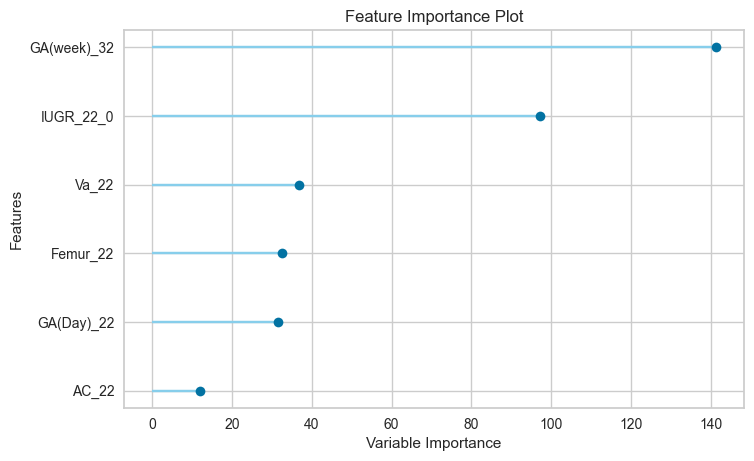

In [85]:
plot_model(model_, plot='feature')

In [214]:
predict_model(tuned_model)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Ridge Regression,124.5116,24339.0957,156.0099,0.5762,0.0914,0.0733


,GA(week)_32,GA(Day)_22,Femur_22,Va_22,AC_22,IUGR_22_0,EFW_32,Label
0,32.0,152.0,36.299999,6.4,162.399994,1.0,1894.0,1756.534546
1,33.0,155.0,38.799999,7.3,176.000000,0.0,1946.0,1983.717407
2,32.0,155.0,36.799999,6.1,164.100006,1.0,1748.0,1687.737183
3,32.0,151.0,36.099998,8.1,169.199997,1.0,1581.0,1925.565063
4,32.0,153.0,35.200001,7.3,159.300003,1.0,1481.0,1685.258667
...,...,...,...,...,...,...,...,...
95,32.0,152.0,38.200001,4.6,173.800003,1.0,2288.0,1888.768921
96,32.0,153.0,34.099998,5.7,164.300003,1.0,1778.0,1650.641479
97,31.0,155.0,35.200001,6.2,168.199997,0.0,1474.0,1450.040405
98,32.0,158.0,38.700001,7.0,185.300003,0.0,1865.0,1845.196899


In [86]:
final_model = finalize_model(tuned_model)
import datetime
save_model(final_model,'ridge_22_32_sing' + datetime.datetime.now().strftime('%d-%b-%Y'))

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=[], target='EFW_32',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 numeric_strategy=...
                 ('dummy', Dummify(target='EFW_32')),
                 ('fix_perfect', Remove_100(target='EFW_32')),
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrou

In [ ]:
#load + predict codes
'''
b = load_model('Lasso_22_32 14-Nov-2021')
test_df_df = a[['GA(week)_32', 'GA(Day)_22', 'Femur_22', 'IUGR_22', 'Va_22', 'Baby Gender_22', 'Nuchal fold_22', 'CM_22', 'AC_22', 'HC_22']]
b.predict(test_df_df)

a = df_22_32.head(1)
a[['GA(week)_32', 'GA(Day)_22', 'Femur_22', 'IUGR_22', 'Va_22', 'Baby Gender_22', 'Nuchal fold_22', 'CM_22', 'AC_22', 'HC_22']]
'''

In [156]:
b = load_model('ridge_22_32_sing_19-Dec-2021')

Transformation Pipeline and Model Successfully Loaded


In [164]:
b.predict(pd.DataFrame())

KeyError: "None of [Index(['GA(week)_32', 'GA(Day)_22', 'Femur_22', 'IUGR_22', 'Va_22', 'AC_22'], dtype='object')] are in the [columns]"

# DF_22 + 32 -> 35

In [215]:
df_22_32_35

,Baby Gender_22,Age_22,Ethnics_22,BPD_22,HC_22,Cerebellum tr_22,CM_22,EFW_22,Nuchal fold_22,AC_22,...,AC_Abnormal_32,FL_Abnormal_32,AFI_Abnormal_32,S/D_Abnormal_32,RI_Abnormal_32,EFW_35,EFW_Abnormal_35,EFW_P_35,IUGR_35,GA(week)_35
2,M,26,1,49.8,186.0,21.1,5.4,410,2.93,166.0,...,0,0,1,1,1,2261.0,0,0,0.0,35
5,M,36,1,61.0,217.8,25.3,8.8,658,5.88,196.8,...,0,0,0,1,1,3603.0,0,0,0.0,36
7,F,30,4,57.1,193.7,21.9,4.6,437,3.84,166.4,...,1,0,1,1,1,1737.0,1,1,1.0,34
9,M,37,1,49.5,192.5,22.4,5.7,397,4.05,157.2,...,1,0,0,1,1,1922.0,1,1,1.0,34
10,M,32,4,50.0,193.8,24.1,6.4,456,5.82,164.6,...,0,0,1,1,1,2181.0,0,0,0.0,34
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339,F,32,4,52.0,185.5,20.6,5.1,377,3.93,153.0,...,1,0,1,1,1,1879.0,1,1,1.0,35
341,F,29,4,50.2,186.1,22.6,4.1,405,4.78,160.5,...,0,0,0,1,1,2501.0,1,1,1.0,37
342,F,29,2,47.4,172.5,22.2,5.2,383,4.19,163.0,...,1,0,1,1,1,1966.0,1,1,0.0,34
345,M,29,3,60.7,221.1,27.1,5.3,648,6.66,199.1,...,0,0,1,1,1,2161.0,1,1,1.0,35


### About MAPE

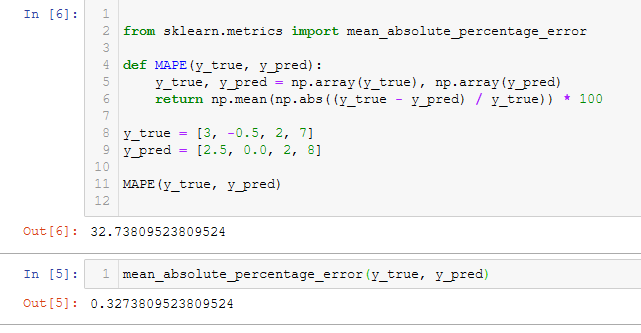

## All

In [96]:
drop_ =['IUGR_35', 'EFW_Abnormal_35', 'EFW_P_35']
exp_reg103 = setup(data = df_22_32_35.drop(drop_, axis=1), target = 'EFW_35', session_id=12, numeric_features=['GA(week)_35', 'GA(week)_22']) 

,Description,Value
0,session_id,12
1,Target,EFW_35
2,Original Data,"(217, 58)"
3,Missing Values,False
4,Numeric Features,30
5,Categorical Features,27
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(151, 58)"


In [97]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
et,Extra Trees Regressor,131.3982,30572.4815,168.5306,0.7152,0.0741,0.0597,0.0870
llar,Lasso Least Angle Regression,127.9576,28818.0494,165.9562,0.7098,0.0718,0.0576,0.0110
omp,Orthogonal Matching Pursuit,122.4161,26985.4822,160.6616,0.7098,0.0694,0.0553,0.0060
en,Elastic Net,127.6784,30018.1045,167.2879,0.6998,0.0735,0.0577,0.0090
lasso,Lasso Regression,130.1999,30424.4735,171.4884,0.6638,0.0749,0.0589,0.0090
br,Bayesian Ridge,140.9119,35851.8262,183.6097,0.6403,0.0806,0.0638,0.0090
gbr,Gradient Boosting Regressor,140.0936,35163.3721,183.2206,0.6338,0.0790,0.0628,0.0410
rf,Random Forest Regressor,141.2185,34545.1989,179.5258,0.6311,0.0787,0.0638,0.1040
ridge,Ridge Regression,135.1547,32883.4891,179.1265,0.6291,0.0782,0.0612,0.0070
ada,AdaBoost Regressor,144.5643,37385.0148,186.5754,0.6252,0.0810,0.0652,0.0330


ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=-1, oob_score=False,
                    random_state=12, verbose=0, warm_start=False)

## Abnormal only

In [98]:
#Best here
drop_ = [i for i in df_22_32_35.columns if '_P' in i]
drop_+=('IUGR_35', 'EFW_Abnormal_35')

exp_reg102 = setup(data = df_22_32_35.drop(drop_, axis=1), target = 'EFW_35', session_id=12, numeric_features=['GA(week)_35', 'GA(week)_22', 'Nuchal fold_22'])

,Description,Value
0,session_id,12
1,Target,EFW_35
2,Original Data,"(217, 51)"
3,Missing Values,False
4,Numeric Features,30
5,Categorical Features,20
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(151, 51)"


In [99]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
llar,Lasso Least Angle Regression,126.0576,28322.4320,164.0768,0.7143,0.0708,0.0566,0.0090
omp,Orthogonal Matching Pursuit,120.7175,26848.1560,159.2931,0.7136,0.0686,0.0544,0.0080
et,Extra Trees Regressor,135.0169,31378.4213,170.6828,0.7055,0.0751,0.0611,0.0700
en,Elastic Net,127.5149,30037.7872,167.3558,0.6995,0.0734,0.0576,0.0080
lasso,Lasso Regression,127.9820,29682.4153,168.2874,0.6819,0.0736,0.0578,0.0080
ridge,Ridge Regression,131.1629,30913.3985,172.3995,0.6628,0.0756,0.0594,0.0070
br,Bayesian Ridge,141.3781,36003.3590,184.1111,0.6386,0.0809,0.0640,0.0100
rf,Random Forest Regressor,139.4399,33989.0604,177.9513,0.6380,0.0780,0.0631,0.0960
ada,AdaBoost Regressor,146.2299,36538.6444,185.2379,0.6367,0.0802,0.0658,0.0340
gbr,Gradient Boosting Regressor,143.5813,35696.1502,184.5853,0.6268,0.0796,0.0645,0.0300


LassoLars(alpha=1.0, copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
          fit_path=True, jitter=None, max_iter=500, normalize=True,
          positive=False, precompute='auto', random_state=12, verbose=False)

## Percentile Only best

In [216]:
from pycaret.regression import *

In [217]:
#use Percentile only

drop_ = [i for i in df_22_32_35.columns if 'Abnormal' in i]
drop_ += ['IUGR_35', 'EFW_P_35']

df_22_32_35_cleaned = df_22_32_35.drop(drop_, axis=1)
exp_reg102 = setup(data = df_22_32_35_cleaned, target = 'EFW_35', session_id=12, numeric_features=['GA(week)_35', 'GA(week)_22'])

#GA(week) here as category result in slighly better performance.

,Description,Value
0,session_id,12
1,Target,EFW_35
2,Original Data,"(217, 42)"
3,Missing Values,False
4,Numeric Features,30
5,Categorical Features,11
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(151, 44)"


In [38]:
df_22_32_35_cleaned.columns

Index(['Baby Gender_22', 'Age_22', 'Ethnics_22', 'BPD_22', 'HC_22',
       'Cerebellum tr_22', 'CM_22', 'EFW_22', 'Nuchal fold_22', 'AC_22',
       'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22',
       'IUGR_22', 'GA(Day)_22', 'GA(week)_22', 'HC_32', 'HC_P_32', 'AC_32',
       'AC_P_32', 'FEMUR_32', 'Femur_P_32', 'EFW_32', 'EFW_P_32', 'HC/AC_32',
       'HC/AC_P_32', 'FL/HC_32', 'FL/AC_32', 'AFI_32', 'Umb RI_32',
       'Umb_RI_P_32', 'Umb S/D_32', 'Umb_S/D_P_32', 'GA(Day)_32', 'IUGR_32',
       'HC_GA_32', 'GA(week)_32', 'EFW_35', 'GA(week)_35'],
      dtype='object')

In [39]:
df_22_32_35_cleaned.describe()

,Age_22,BPD_22,HC_22,Cerebellum tr_22,CM_22,EFW_22,Nuchal fold_22,AC_22,Femur_22,Va_22,Vp_22,Hem_22,Ut RI_22,Ut PI_22,GA(Day)_22,GA(week)_22,HC_32,AC_32,FEMUR_32,EFW_32,HC/AC_32,FL/HC_32,FL/AC_32,AFI_32,Umb RI_32,Umb S/D_32,GA(Day)_32,HC_GA_32,GA(week)_32,EFW_35,GA(week)_35
count,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000,217.000000
mean,31.557604,52.144700,190.679724,22.400461,5.520737,428.732719,4.421889,164.115207,36.260829,6.452442,6.198618,25.140092,0.610779,0.998018,153.165899,21.433180,288.691244,262.949770,59.291244,1656.483871,1.100138,0.205484,0.225714,11.268001,0.620357,2.691938,224.589862,1.285517,31.741935,2207.829493,35.179724
std,4.702014,3.723621,10.370116,1.334982,1.245467,67.425078,0.753993,10.837807,2.540193,0.868917,0.986881,2.135439,0.268014,0.437042,4.571463,0.698149,11.413607,16.380686,3.084019,255.297087,0.045272,0.009273,0.012530,3.948266,0.059434,0.451990,5.555485,0.042706,0.780398,388.519666,1.022865
min,18.000000,32.000000,163.800000,19.200000,1.900000,284.000000,2.520000,136.300000,30.000000,4.100000,3.600000,19.200000,0.210000,0.240000,141.000000,20.000000,243.400000,210.600000,50.600000,1018.000000,0.950000,0.180000,0.190000,4.382357,0.500000,1.800599,197.000000,1.086607,28.000000,1461.000000,32.000000
25%,28.000000,50.400000,184.200000,21.700000,4.700000,385.000000,3.930000,157.300000,34.700000,5.700000,5.600000,23.800000,0.500000,0.750000,151.000000,21.000000,281.900000,253.200000,57.400000,1488.000000,1.070000,0.200000,0.220000,9.400000,0.580000,2.360000,223.000000,1.262500,31.000000,1975.000000,35.000000
50%,31.000000,52.000000,189.700000,22.300000,5.300000,420.000000,4.410000,163.000000,36.000000,6.400000,6.100000,25.100000,0.550000,0.890000,152.000000,21.000000,289.200000,261.900000,59.600000,1632.000000,1.100000,0.210000,0.220000,11.600000,0.620000,2.650000,225.000000,1.280804,32.000000,2158.000000,35.000000
75%,34.000000,54.000000,195.900000,23.100000,6.300000,463.000000,4.880000,169.800000,37.600000,7.100000,6.800000,26.400000,0.610000,1.060000,156.000000,22.000000,294.500000,271.200000,61.100000,1773.000000,1.130000,0.210000,0.230000,13.500000,0.660000,2.950000,227.000000,1.305677,32.000000,2335.000000,36.000000
max,50.000000,64.800000,223.600000,28.300000,10.000000,735.000000,6.660000,199.100000,47.100000,8.800000,9.600000,32.300000,2.330000,3.160000,175.000000,25.000000,322.800000,334.300000,68.100000,2790.000000,1.230000,0.230000,0.270000,32.340976,0.810000,5.250000,239.000000,1.434667,34.000000,3818.000000,39.000000


In [101]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
llar,Lasso Least Angle Regression,125.1622,27721.0923,162.3074,0.7235,0.0704,0.0563,0.7890
et,Extra Trees Regressor,133.0476,30473.6203,167.6970,0.7205,0.0745,0.0605,0.0900
omp,Orthogonal Matching Pursuit,121.5557,27018.9534,160.1362,0.7109,0.0691,0.0547,0.0090
en,Elastic Net,127.6921,29913.1667,167.0888,0.7011,0.0736,0.0578,0.0080
lasso,Lasso Regression,131.1290,29975.1400,170.3180,0.6685,0.0753,0.0596,0.0080
br,Bayesian Ridge,137.9004,34811.2549,180.6649,0.6549,0.0795,0.0625,0.0100
ridge,Ridge Regression,135.3614,31544.4348,175.0352,0.6509,0.0777,0.0616,0.0090
gbr,Gradient Boosting Regressor,143.4098,35850.2488,184.9183,0.6279,0.0798,0.0642,0.0450
rf,Random Forest Regressor,140.9584,35016.4493,180.9528,0.6218,0.0794,0.0637,0.1270
huber,Huber Regressor,147.4348,38015.0027,188.1736,0.6186,0.0843,0.0670,0.0180


LassoLars(alpha=1.0, copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
          fit_path=True, jitter=None, max_iter=500, normalize=True,
          positive=False, precompute='auto', random_state=12, verbose=False)

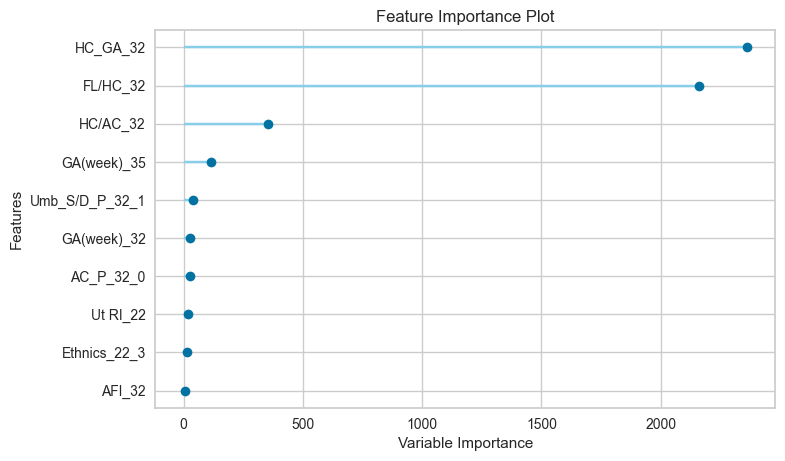

In [102]:
model_ = create_model('llar')
plot_model(model_, plot='feature')

In [218]:
#features selected: 
col_test = ['HC_GA_32', 'FL/HC_32', 'HC/AC_32', 'GA(week)_35']

In [219]:
exp_reg102 = setup(data = df_22_32_35_cleaned[col_test + ['EFW_35']], target = 'EFW_35', session_id=12, numeric_features=['GA(week)_35'])

,Description,Value
0,session_id,12
1,Target,EFW_35
2,Original Data,"(217, 5)"
3,Missing Values,False
4,Numeric Features,4
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(151, 4)"


In [105]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
llar,Lasso Least Angle Regression,122.5121,27993.9797,163.4035,0.7208,0.0700,0.0546,0.0080
et,Extra Trees Regressor,131.4759,31921.7602,170.6914,0.7158,0.0749,0.0591,0.0600
br,Bayesian Ridge,122.7159,27223.3599,161.8356,0.7156,0.0696,0.0549,0.0080
lr,Linear Regression,122.8126,27093.3631,161.5822,0.7152,0.0696,0.0550,0.0180
lar,Least Angle Regression,122.8126,27093.3078,161.5820,0.7152,0.0696,0.0550,0.0180
huber,Huber Regressor,126.5023,31105.2428,171.3911,0.7092,0.0726,0.0560,0.0130
gbr,Gradient Boosting Regressor,139.1563,34488.0040,179.5797,0.6865,0.0777,0.0624,0.0120
rf,Random Forest Regressor,138.9599,34645.7239,180.2428,0.6780,0.0781,0.0621,0.0890
ada,AdaBoost Regressor,139.0211,35858.2051,182.0657,0.6737,0.0784,0.0622,0.0300
lasso,Lasso Regression,136.7879,34601.2180,181.2682,0.6710,0.0778,0.0613,0.0080


LassoLars(alpha=1.0, copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
          fit_path=True, jitter=None, max_iter=500, normalize=True,
          positive=False, precompute='auto', random_state=12, verbose=False)

In [123]:
def filter_feature_for_223235(df, col_test, target, df_result = pd.DataFrame(columns=['Model', 'R2', 'RMSE', 'Feature Removed', 'Help?', 'Comments'])):
    
    '''
    if the features affect >=0.01 r2, only that it get accepted.
    '''
    r2_tolerate = 0.01
    
    #get threshold
    r2_threshold, rmse_threshold = 0, 0

    df = df[col_test + [target]] 
    
    exp_reg101 = setup(data = df, target = target , session_id=12, silent=True, numeric_features=['GA(week)_35']) 
    compare_models()
    score = pull()

    best_row = score.iloc[0]

    model_threshold = best_row['Model']
    r2_threshold = best_row['R2']
    rmse_threshold = best_row['RMSE']

    df_add = pd.DataFrame([[model_threshold, r2_threshold, rmse_threshold, 'None', 'None', 'Threshold']], 
                          columns=['Model', 'R2', 'RMSE', 'Feature Removed', 'Help?', 'Comments'])
    df_result = df_result.append(df_add)
    
    #get results
    cols_to_use = []
    for index, col in enumerate(col_test):
        col_to_use = col_test[:index] + col_test[index+1:] + [target]
        exp_reg101 = setup(data = df[col_to_use], target = target , session_id=12, silent=True) 
            
        compare_models()
        score = pull()

        best_row = score.iloc[0]

        best_model = best_row['Model']
        best_r2 = best_row['R2']
        best_rmse = best_row['RMSE']
        
        help_ = (r2_threshold-r2_tolerate>best_r2 and rmse_threshold<best_rmse) #bench mark r2 > test r2, means that the feature removed aid
        
        if help_:
            cols_to_use.append(col)
        
        df_add = pd.DataFrame([[best_model, best_r2, best_rmse, col, help_, 'Compare']], 
                              columns=['Model', 'R2', 'RMSE', 'Feature Removed', 'Help?', 'Comments'])
        
        df_result = df_result.append(df_add)
        
    print('DONE!')
    return df_result.reset_index(drop=True), cols_to_use

In [124]:
df_22_32_35_result, cols_to_use = filter_feature_for_223235(df_22_32_35_cleaned, col_test, 'EFW_35')

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
llar,Lasso Least Angle Regression,169.7898,52151.4892,221.1186,0.5083,0.0993,0.0782,0.0070
lr,Linear Regression,167.9345,51440.8488,220.2330,0.5081,0.0989,0.0775,0.0170
lar,Least Angle Regression,167.9347,51440.9015,220.2331,0.5081,0.0989,0.0775,0.0110
br,Bayesian Ridge,168.4103,51591.1552,220.6984,0.5070,0.0992,0.0777,0.0070
huber,Huber Regressor,177.7628,55403.3036,228.6749,0.4801,0.1030,0.0816,0.0080
lasso,Lasso Regression,187.7457,59992.8387,238.4317,0.4340,0.1084,0.0870,0.0060
knn,K Neighbors Regressor,194.2027,64233.7756,245.0639,0.4047,0.1110,0.0894,0.0090
ada,AdaBoost Regressor,198.1568,63261.5372,248.0855,0.3393,0.1123,0.0921,0.0330
gbr,Gradient Boosting Regressor,198.0366,68399.7960,256.6671,0.3318,0.1145,0.0906,0.0140
rf,Random Forest Regressor,204.1234,68084.1380,255.9421,0.3190,0.1144,0.0935,0.0850


DONE!


In [125]:
df_22_32_35_result

,Model,R2,RMSE,Feature Removed,Help?,Comments
0,Lasso Least Angle Regression,0.7208,163.4035,None,None,Threshold
1,Huber Regressor,0.4754,240.9704,HC_GA_32,True,Compare
2,Gradient Boosting Regressor,0.6665,186.9160,FL/HC_32,True,Compare
3,Gradient Boosting Regressor,0.6259,192.7314,HC/AC_32,True,Compare
4,Lasso Least Angle Regression,0.5083,221.1186,GA(week)_35,True,Compare


In [127]:
cols_to_use

['HC_GA_32', 'FL/HC_32', 'HC/AC_32', 'GA(week)_35']

In [220]:
exp_reg102 = setup(data = df_22_32_35_cleaned[['HC_GA_32', 'FL/HC_32', 'HC/AC_32', 'GA(week)_35'] +['EFW_35']], target = 'EFW_35', session_id=12, numeric_features=['GA(week)_35'])

,Description,Value
0,session_id,12
1,Target,EFW_35
2,Original Data,"(217, 5)"
3,Missing Values,False
4,Numeric Features,4
5,Categorical Features,0
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(151, 4)"


In [107]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
llar,Lasso Least Angle Regression,122.5121,27993.9797,163.4035,0.7208,0.0700,0.0546,0.0080
et,Extra Trees Regressor,131.4759,31921.7602,170.6914,0.7158,0.0749,0.0591,0.0680
br,Bayesian Ridge,122.7159,27223.3599,161.8356,0.7156,0.0696,0.0549,0.0060
lr,Linear Regression,122.8126,27093.3631,161.5822,0.7152,0.0696,0.0550,0.0200
lar,Least Angle Regression,122.8126,27093.3078,161.5820,0.7152,0.0696,0.0550,0.0120
huber,Huber Regressor,126.5023,31105.2428,171.3911,0.7092,0.0726,0.0560,0.0280
gbr,Gradient Boosting Regressor,139.1563,34488.0040,179.5797,0.6865,0.0777,0.0624,0.0140
rf,Random Forest Regressor,138.9599,34645.7239,180.2428,0.6780,0.0781,0.0621,0.0930
ada,AdaBoost Regressor,139.0211,35858.2051,182.0657,0.6737,0.0784,0.0622,0.0330
lasso,Lasso Regression,136.7879,34601.2180,181.2682,0.6710,0.0778,0.0613,0.0060


LassoLars(alpha=1.0, copy_X=True, eps=2.220446049250313e-16, fit_intercept=True,
          fit_path=True, jitter=None, max_iter=500, normalize=True,
          positive=False, precompute='auto', random_state=12, verbose=False)

In [221]:
model_ = create_model('llar')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,99.2294,17584.0311,132.6048,0.8512,0.0562,0.0429
1,96.3559,17017.3631,130.4506,0.8811,0.0573,0.0453
2,142.4086,35052.2805,187.2225,0.5390,0.0818,0.0643
3,162.0621,48922.5181,221.1844,0.7694,0.0776,0.0599
4,143.2713,26489.1172,162.7548,0.7400,0.0788,0.0711
5,97.0719,16086.9645,126.8344,0.6749,0.0601,0.0449
6,122.8430,25736.3731,160.4256,0.7207,0.0700,0.0548
7,163.2371,52849.7445,229.8907,0.8211,0.0860,0.0653
8,94.1291,16933.8280,130.1300,0.6558,0.0628,0.0464
9,104.5129,23267.5774,152.5371,0.5548,0.0691,0.0507


In [222]:
model_ = tune_model(model_, choose_better=True)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,99.2294,17584.0311,132.6048,0.8512,0.0562,0.0429
1,96.3559,17017.3631,130.4506,0.8811,0.0573,0.0453
2,142.4086,35052.2805,187.2225,0.5390,0.0818,0.0643
3,162.0621,48922.5181,221.1844,0.7694,0.0776,0.0599
4,143.2713,26489.1172,162.7548,0.7400,0.0788,0.0711
5,97.0719,16086.9645,126.8344,0.6749,0.0601,0.0449
6,122.8430,25736.3731,160.4256,0.7207,0.0700,0.0548
7,163.2371,52849.7445,229.8907,0.8211,0.0860,0.0653
8,94.1291,16933.8280,130.1300,0.6558,0.0628,0.0464
9,104.5129,23267.5774,152.5371,0.5548,0.0691,0.0507


In [223]:
predict_model(model_)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Least Angle Regression,159.8067,48598.3387,220.4503,0.7513,0.0875,0.0671


,HC_GA_32,FL/HC_32,HC/AC_32,GA(week)_35,EFW_35,Label
0,1.297391,0.20,1.12,36.0,2585.0,2291.309627
1,1.341593,0.22,1.18,35.0,2667.0,2350.080469
2,1.194196,0.22,1.02,35.0,2095.0,2004.988026
3,1.271556,0.21,1.08,36.0,2363.0,2321.082198
4,1.214530,0.21,1.05,36.0,2093.0,2118.921663
...,...,...,...,...,...,...
61,1.255947,0.21,1.09,35.0,2457.0,2078.637707
62,1.285153,0.22,1.05,35.0,2554.0,2365.847496
63,1.293392,0.20,1.04,36.0,2187.0,2444.755946
64,1.266071,0.21,1.13,35.0,2001.0,2039.915133


In [138]:
final_model = finalize_model(tuned_model)
import datetime
save_model(final_model,'llar_22_32_35_sing' + datetime.datetime.now().strftime('%d-%b-%Y'))

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True, features_todrop=[],
                                       id_columns=[], ml_usecase='regression',
                                       numerical_features=['GA(week)_35'],
                                       target='EFW_35', time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numerical=None,
                                 nume...
                 ('clean_names', Clean_Colum_Names()),
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  LassoLars(alpha=1.0, copy_X=True, eps=2.220446049250313e-1

In [148]:
# a = load_model('Gbr_22_32_35 14-Nov-2021')

# Predictions of fetal weight - PREVIOUS - APPENDIX

In [28]:
#Best: Log 10 (weight) = 1.335-0.0034*AC*FL+ 0.0316*BPD+0.0457*AC +0.1623*FL  --> AC = AC, FL = Femur length, BPD - Bipe diam
#Without BPD: Log 10 (weight) = 1.304+0.05281*Ac+0.1938*FL -0.004*AC*FL

# hadlock_1

## Predict Wk32 fetal weight using Wk22 data

### Testing using autoML, pycaret

In [130]:
from pycaret.regression import *

In [29]:
df_32['GA(Week)_32'] = df_32['GA(Day)_32']//7

In [31]:
df_train = df_22.drop([132])#outliers
df_train = df_train.merge(df_32[['GA(Week)_32', 'EFW_32']], left_index= True, right_index=True) #join based on left index and right index
df_train = df_train.drop('IUGR_22', axis=1)

In [32]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 331 entries, 0 to 346
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Baby Gender_22    331 non-null    category
 1   Age_22            331 non-null    int64   
 2   Ethnics_22        331 non-null    category
 3   BPD_22            331 non-null    float64 
 4   HC_22             331 non-null    float64 
 5   Cerebellum tr_22  331 non-null    float64 
 6   CM_22             331 non-null    float64 
 7   EFW_22            331 non-null    int64   
 8   Nuchal fold_22    331 non-null    float64 
 9   AC_22             331 non-null    float64 
 10  Femur_22          331 non-null    float64 
 11  Va_22             331 non-null    float64 
 12  Vp_22             331 non-null    float64 
 13  Hem_22            331 non-null    float64 
 14  Ut RI_22          331 non-null    float64 
 15  Ut PI_22          331 non-null    float64 
 16  GA(Day)_22        331 non-

In [44]:
train_this = df_train[['EFW_22' ,'GA(Day)_22' ,'Baby Gender_22', \
                      'CM_22','Ut PI_22', 'Va_22', 'Nuchal fold_22', \
                      'Hem_22', 'BPD_22', 'GA(Week)_32', 'EFW_32']]

In [45]:
exp_reg101 = setup(data = train_this, target = 'EFW_32', session_id=12) 

,Description,Value
0,session_id,12
1,Target,EFW_32
2,Original Data,"(331, 11)"
3,Missing Values,False
4,Numeric Features,9
5,Categorical Features,1
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(231, 10)"


In [46]:
compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
br,Bayesian Ridge,123.4657,27903.0722,165.3194,0.5542,0.0951,0.0728,0.0080
lasso,Lasso Regression,123.3760,27848.6475,165.1398,0.5539,0.0949,0.0726,0.0080
ridge,Ridge Regression,123.1875,27851.2154,165.1716,0.5527,0.0949,0.0725,0.0080
lr,Linear Regression,123.2008,27868.0102,165.2227,0.5521,0.0950,0.0725,0.0140
lar,Least Angle Regression,123.2008,27868.0180,165.2228,0.5521,0.0950,0.0725,0.0140
huber,Huber Regressor,124.0154,27652.0686,164.9335,0.5480,0.0944,0.0728,0.0150
llar,Lasso Least Angle Regression,131.4940,30849.4801,172.8996,0.5290,0.0991,0.0775,0.0080
en,Elastic Net,136.0562,31684.8102,176.3192,0.5026,0.1036,0.0814,0.0100
et,Extra Trees Regressor,138.4661,34778.2337,182.7313,0.4821,0.1049,0.0816,0.0620
ada,AdaBoost Regressor,153.9294,41195.7032,199.0274,0.4075,0.1169,0.0926,0.0330


BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, alpha_init=None,
              compute_score=False, copy_X=True, fit_intercept=True,
              lambda_1=1e-06, lambda_2=1e-06, lambda_init=None, n_iter=300,
              normalize=False, tol=0.001, verbose=False)

In [47]:
lasso = create_model('ridge')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,90.2284,17755.3770,133.2493,0.5010,0.0762,0.0543
1,116.2710,25493.6621,159.6673,0.1612,0.0930,0.0718
2,154.6592,43147.7148,207.7203,0.6597,0.1083,0.0846
3,133.3987,32063.4531,179.0627,0.4252,0.1079,0.0798
4,136.6188,39299.9805,198.2422,0.2802,0.1076,0.0772
5,117.2996,22716.0547,150.7185,0.7378,0.0878,0.0682
6,140.5301,33371.5000,182.6787,0.6418,0.0972,0.0737
7,118.2750,20937.8223,144.6991,0.6753,0.0817,0.0691
8,120.7400,22641.6230,150.4713,0.7504,0.1014,0.0810
9,103.8539,21084.9668,145.2066,0.6945,0.0883,0.0650


In [48]:
tuned_lasso = tune_model(lasso)

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,90.3618,17546.6660,132.4638,0.5069,0.0760,0.0545
1,115.4602,25203.2617,158.7554,0.1708,0.0926,0.0713
2,154.9464,43392.1133,208.3077,0.6578,0.1089,0.0851
3,131.0993,30663.1133,175.1089,0.4503,0.1041,0.0784
4,137.3701,39550.1641,198.8722,0.2756,0.1078,0.0775
5,117.9388,24022.8340,154.9930,0.7227,0.0906,0.0688
6,141.9435,33683.4414,183.5305,0.6384,0.0974,0.0744
7,117.0341,20066.7637,141.6572,0.6889,0.0809,0.0688
8,122.0657,23220.9238,152.3841,0.7440,0.1030,0.0822
9,105.7030,21191.1445,145.5718,0.6929,0.0887,0.0663


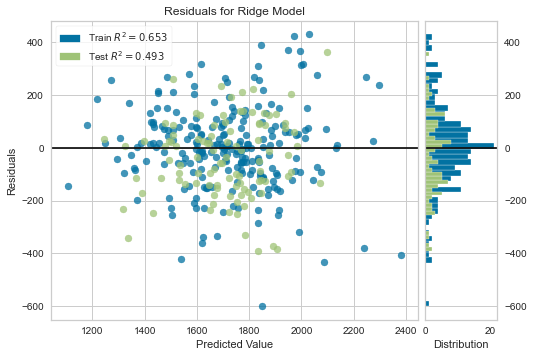

In [49]:
plot_model(tuned_lasso)

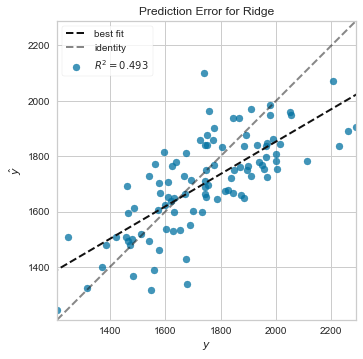

In [50]:
plot_model(tuned_lasso, plot = 'error')

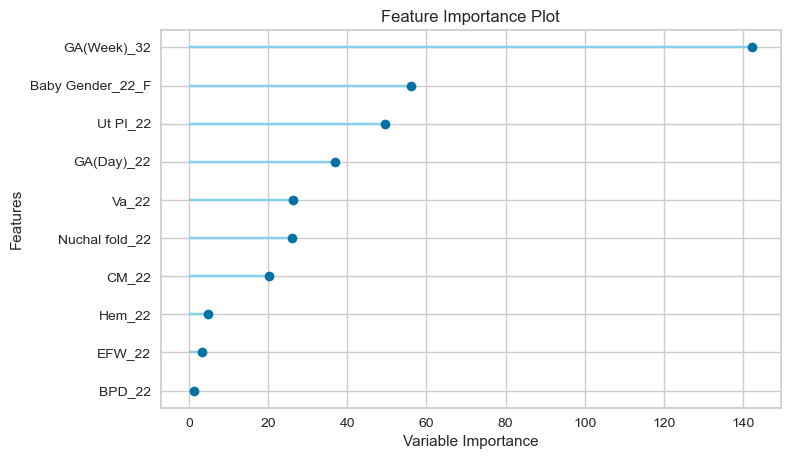

In [51]:
plot_model(tuned_lasso, plot='feature')

In [113]:
predict_model(tuned_lasso)

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,Ridge Regression,126.1682,24381.3457,156.1453,0.4563,0.0927,0.0751


,EFW_22,GA(Day)_22,CM_22,Ut PI_22,Va_22,Nuchal fold_22,Hem_22,BPD_22,Baby Gender_22_F,EFW_32,Label
0,289.0,143.0,4.7,1.71,7.5,4.100,21.000000,45.500000,1.0,1630.0,1585.076660
1,436.0,151.0,3.7,0.86,5.3,4.510,25.400000,51.400002,0.0,1803.0,1688.478516
2,445.0,151.0,6.4,1.07,6.7,5.050,27.400000,54.299999,0.0,1872.0,1841.797363
3,461.0,151.0,5.2,1.05,6.4,4.900,26.200001,52.700001,0.0,1773.0,1863.264160
4,396.0,145.0,6.0,1.07,7.4,3.640,25.000000,52.299999,0.0,1976.0,1887.606445
...,...,...,...,...,...,...,...,...,...,...,...
94,541.0,158.0,8.0,0.62,7.0,3.930,26.900000,55.799999,0.0,1865.0,1967.414062
95,413.0,154.0,5.6,0.88,8.7,5.020,24.000000,50.799999,1.0,1614.0,1718.750488
96,504.0,153.0,4.1,1.21,7.6,5.580,26.200001,52.900002,0.0,1895.0,1967.854004
97,420.0,150.0,6.7,0.59,5.6,5.388,25.299999,51.700001,1.0,1689.0,1874.310547


In [114]:
final_lasso = finalize_model(lasso)

## Manually

Basically autoML achieved the same results as mine, just the cross validated results different in numerical, but the model ranking looks similar.

In [116]:
#test features and train model
label_name = 'EFW_32'

#random forest regressor - no need scale/normalize data, but need to turn them to 1-hot encoding
df_train = df_22.drop([246,101,34,190])#outliers
df_train = df_train.merge(df_32[label_name], left_index= True, right_index=True) #join based on left index and right index
df_train = df_train.drop('IUGR_22', axis=1)
                         
#1-hot encoding
X = pd.get_dummies(df_train, drop_first=True)

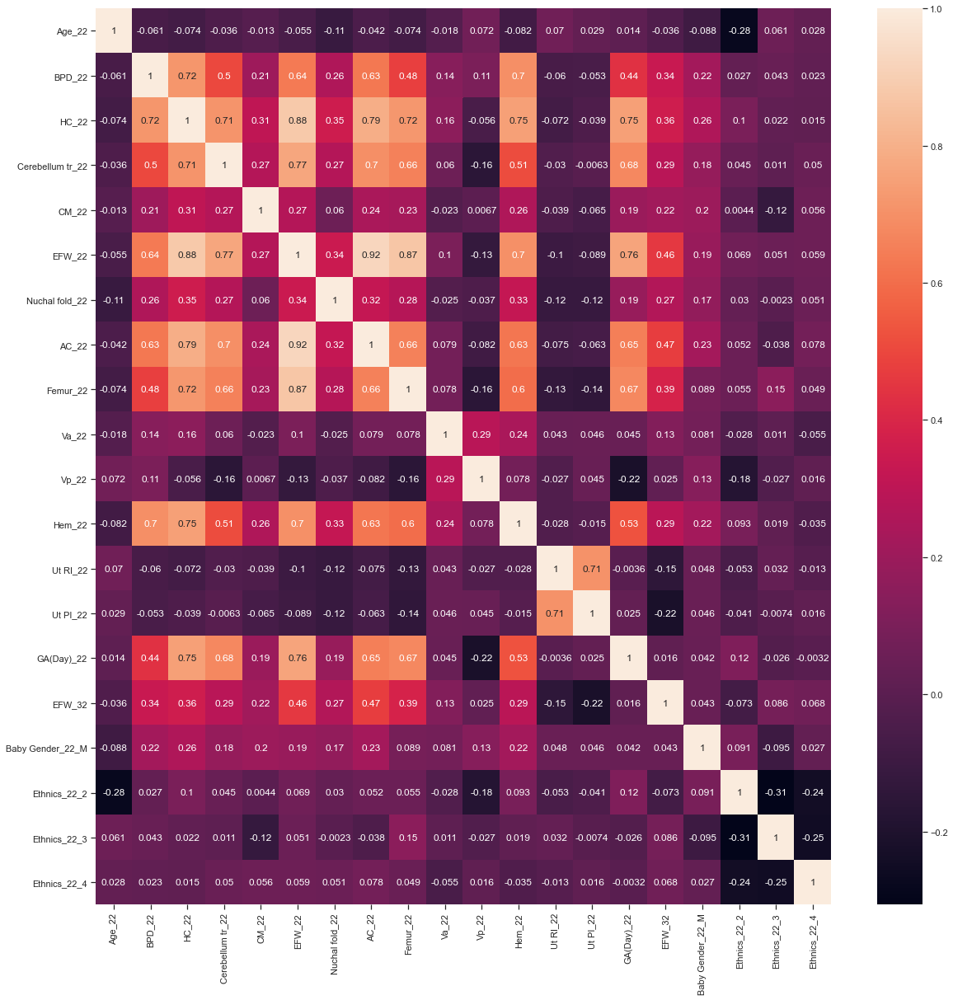

In [35]:
plot_heat_map(X)

IndexError: index 1 is out of bounds for axis 0 with size 1

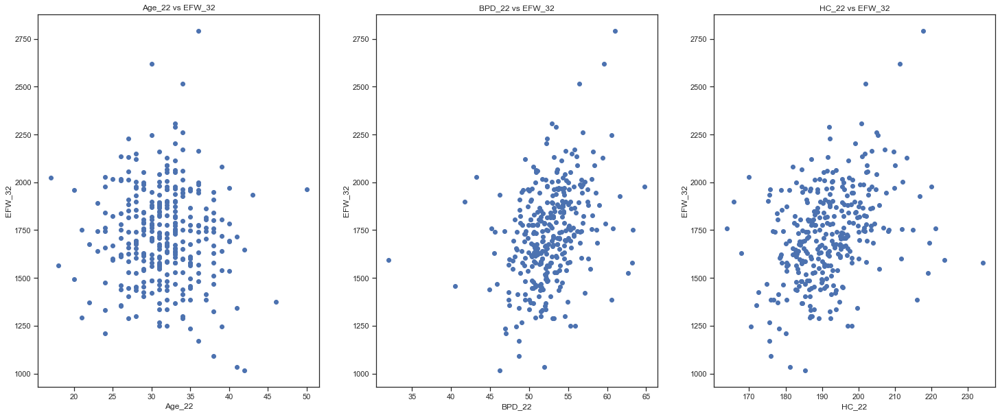

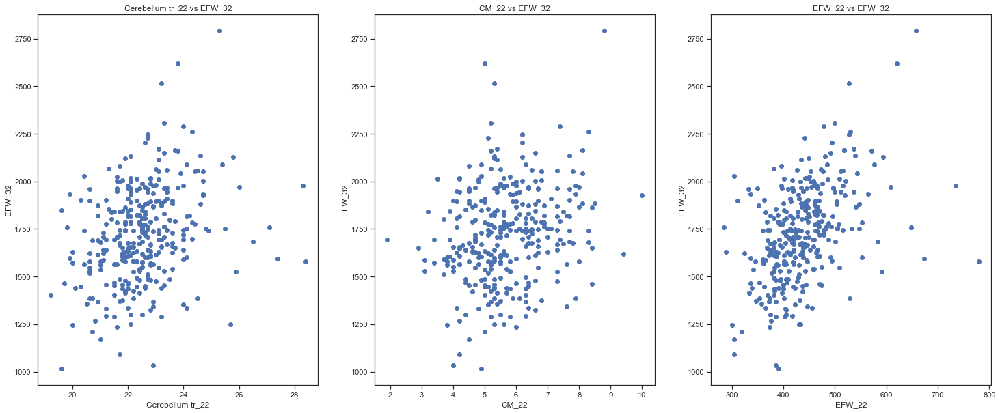

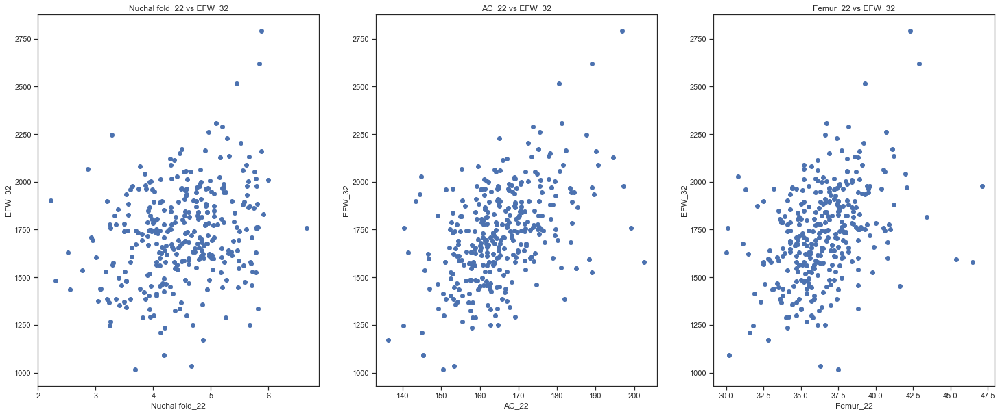

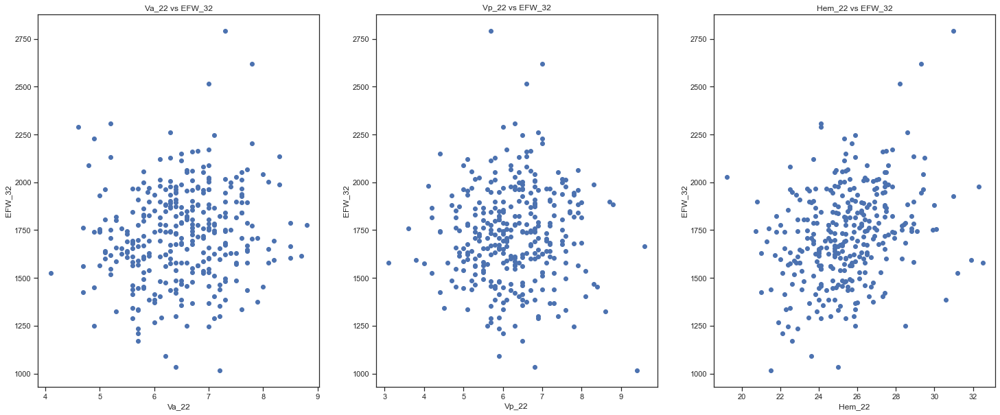

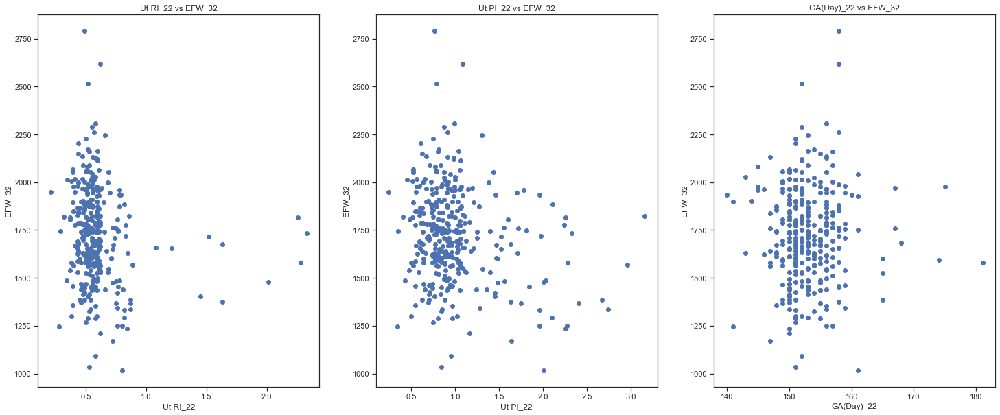

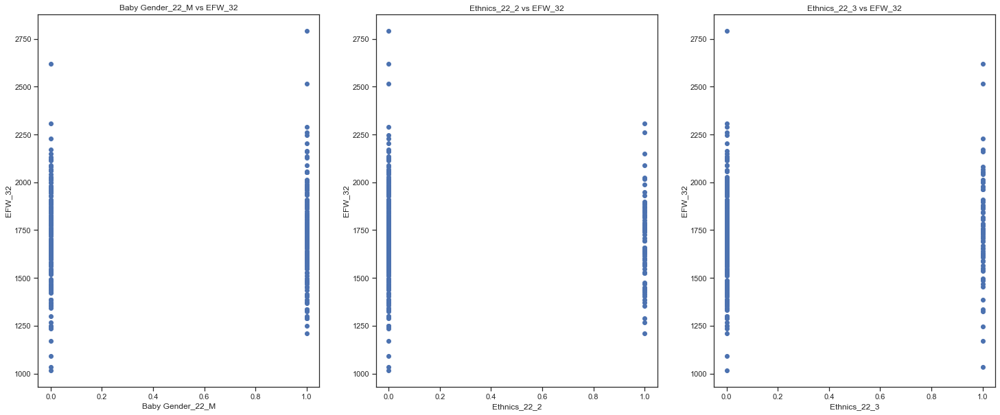

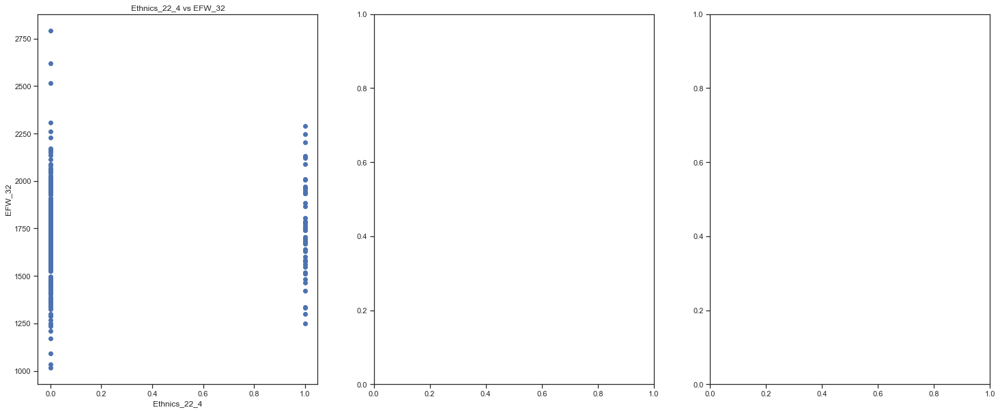

In [36]:
features_graph(X)

### Become worse when use higher degree.

In [74]:
# from sklearn.preprocessing import PolynomialFeatures
# polynomial_features= PolynomialFeatures(degree=2)
# x_poly = polynomial_features.fit_transform(X.drop([label_name], axis=1))
# model = LinearRegression()
# model.fit(x_poly, X[label_name])
# cv = cross_validate(model, x_poly, X[label_name], cv=10, return_train_score=True, scoring='r2')
# print(cv)

### Here, I will compare which features selection method can generate the best results.

#### Stepwise selection

In [40]:
SL_in = 0.05
SL_out = 0.05
col_stepwise = stepwise_selection(X.drop(label_name, axis=1), X[label_name], SL_in, SL_out)
col_stepwise.append(label_name)

c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis,

['AC_22']
['AC_22', 'GA(Day)_22']
['AC_22', 'GA(Day)_22', 'EFW_22']
['GA(Day)_22', 'EFW_22']


c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis,

['GA(Day)_22', 'EFW_22', 'Baby Gender_22_M']
['GA(Day)_22', 'EFW_22', 'Baby Gender_22_M', 'CM_22']
['GA(Day)_22', 'EFW_22', 'Baby Gender_22_M', 'CM_22', 'Ut PI_22']


c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis,

In [41]:
print('columns used:')
print(col_stepwise)

columns used:
['GA(Day)_22', 'EFW_22', 'Baby Gender_22_M', 'CM_22', 'Ut PI_22', 'EFW_32']


In [42]:
#model setup
models = [LinearRegression(normalize=True), 
          Lasso(alpha=0.2, normalize=True),
          Ridge(alpha=0.2,fit_intercept=True, normalize=True, solver='cholesky'),
          RandomForestRegressor(n_estimators = 10, random_state = 42),
          AdaBoostRegressor(random_state=42, n_estimators=50), 
          GradientBoostingRegressor(n_estimators = 50, random_state = 42), 
          make_pipeline(StandardScaler(), SVR(kernel='linear', C=1000, epsilon=100, gamma='scale')), 
          KNeighborsRegressor(n_neighbors=5),
          linear_model.BayesianRidge(),
         ]

#### Backward elimination
https://www.geeksforgeeks.org/ml-multiple-linear-regression-backward-elimination-technique/     
https://gist.github.com/vb100/6af31cbf9950e598d01cd6add98a3814

In [80]:
# SL = 0.05
# X_22_32, columns_drop_list = backward_elimination(X.drop(label_name, axis=1), X[label_name],  SL, const=True)

# #add y into X_Modeled
# X_22_32[label_name] = X[label_name]
# # print('\ncolumns to be dropped:\n', columns_drop_list)
# print('columns used:', X_22_32.columns)

                            OLS Regression Results                            
Dep. Variable:                 EFW_32   R-squared:                       0.547
Model:                            OLS   Adj. R-squared:                  0.531
Method:                 Least Squares   F-statistic:                     34.72
Date:                Thu, 10 Jun 2021   Prob (F-statistic):           4.67e-48
Time:                        09:12:49   Log-Likelihood:                -2145.6
No. Observations:                 328   AIC:                             4315.
Df Residuals:                     316   BIC:                             4361.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
HC_22                3.5520      2.325  

In [81]:
# #cross validate the model to check
# #cross_validate_models(models, columns, df_32_X), columns = list of y you wanna predict, return a dict as a result
# #cv - backward eli
# print('Prediction of WK32 using WK22 backward elimination')
# cross_validate_models(models, X_22_32.drop(['IUGR_22_1', 'Baby Gender_22_M'], axis=1), label_name)

Prediction of WK32 using WK22 backward elimination
Cross validation Result for EFW_32:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.435916,0.109791,0.500574,0.024523,-183.317215,17.304762,0.094398,-175.977311,4.302435,0.449624,0.106559,1726.679878
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.435838,0.101153,0.496977,0.024607,-183.539154,16.885382,0.091999,-176.609854,4.287248,0.449163,0.098543,1726.679878
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.388888,0.081579,0.440693,0.023905,-191.664649,17.563407,0.091636,-186.247205,4.204454,0.402454,0.079811,1726.679878
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.225516,0.126189,0.850771,0.013000,-215.522040,21.808293,0.101188,-96.146998,4.584325,0.242395,0.123434,1726.679878
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.281841,0.096602,0.609396,0.021801,-207.953775,20.807821,0.100060,-155.620090,4.516403,0.296421,0.095508,1726.679878
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.303841,0.107082,0.780905,0.013952,-204.464344,20.053051,0.098076,-116.527626,3.560596,0.318600,0.105207,1726.679878
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.191862,0.053953,0.226830,0.022925,-221.209380,20.909312,0.094523,-219.034589,5.160839,0.207386,0.049337,1726.679878
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.123251,0.147561,0.435140,0.026607,-228.941493,20.928825,0.091416,-187.189137,5.667823,0.139740,0.144725,1726.679878


The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -183.31721479973737
The error:10.6%
10.6


(LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True),
 -183.31721479973737)

In [45]:
#stepwise - I tried to append columns to see whether the r2 grow but the ori is the highest
print('Prediction of WK32 using WK22 stepwise elimination')
# cross_validate_models(models, X[col_stepwise].drop(['Baby Gender_22_M'], axis=1), label_name)

Prediction of WK32 using WK22 stepwise elimination
Cross validation Result for EFW_32:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.450703,0.099113,0.491439,0.022838,-181.061813,16.334625,0.090216,-177.589391,4.035365,0.463099,0.096757,1726.679878
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.450081,0.093001,0.489876,0.022917,-181.349354,16.472776,0.090834,-177.861741,4.030204,0.462326,0.090923,1726.679878
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.378669,0.062139,0.412819,0.021553,-193.698164,18.264497,0.094294,-190.849385,4.104180,0.391286,0.061531,1726.679878
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.218809,0.128029,0.853160,0.011950,-216.235197,19.151272,0.088567,-95.378582,4.168298,0.236322,0.126920,1726.679878
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.273916,0.086815,0.556233,0.023288,-209.283605,21.087323,0.100760,-165.891714,4.958567,0.288104,0.086585,1726.679878
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.311657,0.094878,0.717004,0.014452,-203.371007,18.576375,0.091342,-132.465855,3.460022,0.324973,0.090291,1726.679878
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.449523,0.098011,0.489580,0.023219,-181.250235,16.048938,0.088546,-177.912140,4.069030,0.461448,0.096556,1726.679878
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.159647,0.151049,0.470887,0.024488,-224.016261,20.844259,0.093048,-181.175429,5.602994,0.173944,0.149455,1726.679878
8,"BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, al...",0.450401,0.099357,0.489741,0.023018,-181.106872,16.284040,0.089914,-177.885268,4.060438,0.462651,0.097036,1726.679878


The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.06181267857997
The error:10.5%
10.5


(LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True),
 -181.06181267857997)

In [87]:
print('Prediction of WK32 using WK22 stepwise elimination')
cross_validate_models(models, X[col_stepwise].drop('IUGR_22_1',axis=1), label_name)

Prediction of WK32 using WK22 stepwise elimination
Cross validation Result for EFW_32:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.466586,0.094730,0.507893,0.022040,-178.450271,15.845486,0.088795,-174.693576,3.974114,0.478348,0.092937,1726.679878
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.465338,0.089481,0.505667,0.022138,-178.830630,16.070462,0.089864,-175.087813,3.965084,0.476933,0.087795,1726.679878
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.380429,0.059453,0.415782,0.021128,-193.457394,18.187462,0.094013,-190.368024,4.042444,0.392066,0.058185,1726.679878
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.269767,0.110785,0.857672,0.012671,-209.463244,20.943314,0.099986,-93.900537,4.703126,0.283791,0.109699,1726.679878
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.304983,0.086459,0.570896,0.020554,-204.756995,20.892156,0.102034,-163.146110,4.898188,0.321128,0.085619,1726.679878
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.322718,0.096603,0.734205,0.013559,-201.912164,20.800216,0.103016,-128.387104,3.723536,0.335677,0.095186,1726.679878
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.108459,0.034319,0.135577,0.013038,-232.614694,22.979316,0.098787,-231.641885,5.635792,0.124423,0.027489,1726.679878
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.160217,0.145888,0.470528,0.023838,-224.087025,21.281050,0.094968,-181.235636,5.382394,0.174884,0.143693,1726.679878


The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.45027099517864
The error:10.299999999999999%
10.299999999999999


(LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True),
 -178.45027099517864)

In [88]:
# ##my features
# my_df = test_features(models, X, label_name)

Loop 1:


KeyboardInterrupt: 

### After comparing, I decided to write my own feature selection methods.

In [54]:
# feature selections
# models = [LinearRegression(normalize=True), 
#           Lasso(alpha=0.2, normalize=True),
#           Ridge(alpha=0.2,fit_intercept=True, normalize=True, solver='cholesky'),
#           make_pipeline(StandardScaler(), SVR(kernel='linear', C=1000, epsilon=100, gamma='scale')), 
#           linear_model.BayesianRidge(),]

# my_for_df, best_feature_rmse, best_feature_to_return = test_features_forward(models, X, label_name, ['EFW_22'])

Loop 1:


<ipython-input-3-9aa4f4e1f627>:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_32:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.167908,0.117103,0.209888,0.026286,-223.446838,19.026828,0.085151,-221.400197,4.831146,0.182959,0.114613,1726.679878
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.168566,0.111989,0.209718,0.026291,-223.449802,19.051021,0.085259,-221.423911,4.830623,0.183560,0.109510,1726.679878
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.168789,0.088301,0.204058,0.025556,-223.819325,19.479957,0.087034,-222.219501,4.838278,0.183572,0.085661,1726.679878
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.165353,0.136855,0.205566,0.028039,-223.400090,18.962453,0.084881,-221.997866,4.871773,0.180972,0.133736,1726.679878
4,"BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, al...",0.168090,0.114539,0.209843,0.026295,-223.469641,19.040340,0.085203,-221.406426,4.831343,0.183114,0.112061,1726.679878


  0%|                                                                                           | 0/18 [00:00<?, ?it/s]

The best model is 
 Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=100,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False) 
 with rmse score: -223.40009018465528
The error:12.9%
12.9
features to test: ['Age_22', 'BPD_22', 'HC_22', 'Cerebellum tr_22', 'CM_22', 'Nuchal fold_22', 'AC_22', 'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'Baby Gender_22_M', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4']


  0%|                                                                                           | 0/18 [00:01<?, ?it/s]


KeyboardInterrupt: 

In [44]:
#Mine
'''
['EFW_22', 'GA(Day)_22', 'Baby Gender_22_M', 'CM_22', 'Ut PI_22', 'Va_22', 'Nuchal fold_22', 'Hem_22', 'BPD_22'] - mine
['GA(Day)_22', 'EFW_22', 'Baby Gender_22_M', 'CM_22', 'Ut PI_22', 'EFW_32'] - stepwise

have to remove IUGR_22_1 since it is future feature.
'''

my_cols = ['EFW_22', 'GA(Day)_22', 'Baby Gender_22_M', 'CM_22', 'Ut PI_22', 'Va_22', 'Nuchal fold_22', 'Hem_22', 'BPD_22', 'EFW_32'] #IUGR not possible

print('Prediction of WK32 using WK22 using my elimination')
cross_validate_models(models, X[my_cols], label_name)

Prediction of WK32 using WK22 using my elimination
Cross validation Result for EFW_32:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.472853,0.097627,0.529201,0.022460,-177.370887,17.020830,0.095962,-170.867243,4.262828,0.486333,0.095395,1726.679878
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.469185,0.090293,0.525201,0.022570,-178.194592,16.774304,0.094135,-171.591403,4.242056,0.482073,0.088713,1726.679878
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.393554,0.071915,0.444344,0.021135,-191.169085,18.033408,0.094332,-185.654661,4.163760,0.406886,0.071013,1726.679878
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.222656,0.121520,0.850832,0.012931,-215.975800,21.221293,0.098258,-96.140879,4.784951,0.238726,0.116714,1726.679878
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.288698,0.091358,0.608556,0.018594,-207.094577,21.423121,0.103446,-155.819926,4.529220,0.303581,0.089683,1726.679878
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.280144,0.096729,0.780048,0.012933,-208.170829,20.266444,0.097355,-116.776038,3.698603,0.294299,0.094265,1726.679878
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.480197,0.095346,0.526101,0.022671,-176.130056,16.727602,0.094973,-171.428575,4.285289,0.492354,0.094185,1726.679878
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.146605,0.155407,0.457727,0.024967,-225.590492,20.671387,0.091632,-183.411366,5.502243,0.161301,0.154399,1726.679878
8,"BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, al...",0.471191,0.098508,0.524061,0.023033,-177.640185,16.986699,0.095624,-171.796316,4.353421,0.484224,0.096261,1726.679878


The best model is 
 Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=100,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False) 
 with rmse score: -176.13005629435443
The error:10.2%
10.2


In [165]:
print('Columns used:\n', my_cols)

Columns used:
 ['EFW_22', 'GA(Day)_22', 'Baby Gender_22_M', 'CM_22', 'Ut PI_22', 'Va_22', 'Nuchal fold_22', 'Hem_22', 'BPD_22', 'EFW_32']


# Hyperparameter tuning

https://machinelearningmastery.com/hyperparameter-optimization-with-random-search-and-grid-search/

### Chose Linear, Lasso, Ridge, SVR to perform hypertuning

In [170]:
#General params
cv = RepeatedKFold(n_splits=5, n_repeats=15, random_state=42)

#### For Backward Eli

In [34]:
# #linear_reg
# linear_reg_best_params_backward = linear_regression_hypertune(X_22_32.drop(label_name, axis=1), X_22_32[label_name], cv)

Fitting 75 folds for each of 4 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1809s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0354s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0648s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1057s.) Setting batch_size=16.


Best Score (neg_mean_absolute_error): -141.3919828083676
Best Hyperparameters: {'normalize': True, 'fit_intercept': True}


[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    2.6s finished


In [35]:
# #Ridge
# ridge_best_params_backward = ridge_hypertune(X_22_32.drop(label_name, axis=1), X_22_32[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0190s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0519s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0678s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1217s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 528 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 768 t

Best Score in neg_root_mean_squared_error: -185.86237043151905
Best Hyperparameters: {'alpha': 8.879374434074535, 'fit_intercept': True, 'normalize': False, 'solver': 'sparse_cg'}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  2.8min finished


In [36]:
# #lasso 
# lasso_best_params_backward = lasso_hypertune(X_22_32.drop(label_name, axis=1), X_22_32[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0120s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0449s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0838s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1406s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.6s
[Parallel(n_jobs=-1)]: Done 528 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 768 t

Best Score: -141.3919832579902
Best Hyperparameters: {'alpha': 1.0405895699434454e-05, 'fit_intercept': True, 'normalize': False, 'selection': 'cyclic'}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  1.9min finished


In [37]:
# #Support Vector Regressor
# svr_best_params_backward = svr_hypertune(X_22_32.drop(label_name, axis=1), X_22_32[label_name], cv)

Fitting 75 folds for each of 240 candidates, totalling 18000 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1746s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0329s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  38 tasks      | elapsed:    1.7s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0618s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  68 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1217s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Done 332 tasks      | elapsed:    2.6s
[Parallel(n_jobs=4)]: Done 540 tasks      | elapsed:    3.3s
exception calling callback for <Future at 0x173

KeyboardInterrupt: 

In [99]:
# #Final Cross Validate using tuned params - backward
# #cross_validate_models(models, columns, df_32_X), columns = list of y you wanna predict, return a dict as a result
# #Finalized Params
# models = [LinearRegression(normalize=True, fit_intercept=True), 
#           Ridge(alpha=0.03128871367903606,fit_intercept=True, normalize=True, solver='cholesky'),
#           Lasso(alpha=0.057418232283616887, normalize=True, fit_intercept=True, selection='cyclic'),
#           make_pipeline(StandardScaler(), SVR(kernel='linear', C=10, epsilon=10, gamma='scale', )), 
#          ]
# #cv
# print('Prediction of WK32 using WK22 backward elimination after tuning.')
# cross_validate_models(models, X_22_32, label_name)

#### For stepwise elimination

In [81]:
# #linear_reg
# linear_reg_best_params_stepwise = linear_regression_hypertune(X[col_stepwise].drop(label_name, axis=1), X[label_name], cv)

NameError: name 'cv' is not defined

In [220]:
# #Ridge
# ridge_best_params_stepwise = ridge_hypertune(X[col_stepwise].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0110s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0758s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0359s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0588s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1346s.) Setting batch_size=32.
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.3s
[Parallel(n

Best Score in neg_root_mean_squared_error: -181.2782431101997
Best Hyperparameters: {'alpha': 5.820097823045092, 'fit_intercept': True, 'normalize': False, 'solver': 'sparse_cg'}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  2.3min finished


In [221]:
# #lasso 
# lasso_best_params_stepwise = lasso_hypertune(X[col_stepwise].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0110s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0389s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0369s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1287s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1626s.) Setting batch_size=32.
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.4s
[Parallel(n

Best Score: -138.28402977299797
Best Hyperparameters: {'alpha': 1.0405895699434454e-05, 'fit_intercept': True, 'normalize': False, 'selection': 'cyclic'}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  1.4min finished


In [91]:
# print(col_stepwise)

['GA(Day)_22', 'EFW_22', 'IUGR_22_1', 'Baby Gender_22_M', 'CM_22', 'Va_22', 'EFW_32']


In [97]:
# #Final Cross Validate using tuned params -stepwise eli

# #ridge
# #{'alpha': 5.820097823045092, 'fit_intercept': True, 'normalize': False, 'solver': 'sparse_cg'}

# #lasso
# #{'alpha': 1.0405895699434454e-05, 'fit_intercept': True, 'normalize': False, 'selection': 'cyclic'}

# models = [LinearRegression(normalize=True, fit_intercept=True), 
#           Ridge(alpha=5.820097823045092, normalize=False, fit_intercept=True, solver='sparse_cg'),
#           Lasso(alpha=1.0405895699434454e-05, normalize=False, fit_intercept=True, selection='cyclic'),
#          ]
# #cv
# # cross_validate_models(models, X.drop(['AC_22', 'Femur_22'], axis=1), label_name)
# print('Prediction of WK32 using WK22 stepwise elimination after tuning.')
# cross_validate_models(models, X[col_stepwise].drop('IUGR_22_1', axis=1), label_name)

Prediction of WK32 using WK22 stepwise elimination after tuning.
Cross validation Result for EFW_32:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.466586,0.094730,0.507893,0.022040,-178.450271,15.845486,0.088795,-174.693576,3.974114,0.478348,0.092937,1726.679878
1,"Ridge(alpha=5.820097823045092, copy_X=True, fi...",0.466626,0.093719,0.507137,0.022001,-178.459274,15.753421,0.088275,-174.828513,3.992650,0.478339,0.092007,1726.679878
2,"Lasso(alpha=1.0405895699434454e-05, copy_X=Tru...",0.466586,0.094730,0.507893,0.022040,-178.450271,15.845486,0.088795,-174.693576,3.974114,0.478348,0.092937,1726.679878


The best model is 
 Lasso(alpha=1.0405895699434454e-05, copy_X=True, fit_intercept=True,
      max_iter=1000, normalize=False, positive=False, precompute=False,
      random_state=None, selection='cyclic', tol=0.0001, warm_start=False) 
 with rmse score: -178.4502708530055
The error:10.299999999999999%
10.299999999999999


(Lasso(alpha=1.0405895699434454e-05, copy_X=True, fit_intercept=True,
       max_iter=1000, normalize=False, positive=False, precompute=False,
       random_state=None, selection='cyclic', tol=0.0001, warm_start=False),
 -178.4502708530055)

#### My features - best

In [80]:
#General params
cv = RepeatedKFold(n_splits=5, n_repeats=15, random_state=42)

my_cols = ['EFW_22', 'GA(Day)_22', 'Baby Gender_22_M', 'CM_22', 'Ut PI_22', 'Va_22', 'Nuchal fold_22', 'Hem_22', 'BPD_22', 'EFW_32'] #IUGR not possible

In [171]:
#linear_reg
linear_reg_best_params_mine = linear_regression_hypertune(X[my_cols].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 4 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1851s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0329s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0349s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0713s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 266 t

Best Score (neg_mean_absolute_error): -138.31706281875208
Best Hyperparameters: {'normalize': True, 'fit_intercept': True}


[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    2.3s finished


In [172]:
#Ridge
ridge_best_params_mine = ridge_hypertune(X[my_cols].drop(label_name, axis=1), X[label_name], cv)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0120s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s


Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0369s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0469s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0738s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1805s.) Setting batch_size=32.
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 560 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 1040 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 1520 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done 2064 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 2608 tasks      | elapsed:    3.7s
[Parallel(n_jobs=-1)]: Done 3216 tasks    

Best Score in neg_root_mean_squared_error: -177.13576768247452
Best Hyperparameters: {'alpha': 12.340769010376022, 'fit_intercept': True, 'normalize': False, 'solver': 'auto'}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  2.3min finished


In [173]:
#lasso 
lasso_best_params_mine = lasso_hypertune(X[my_cols].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0120s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0618s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0668s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1227s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.5s
[Parallel(n_jobs=-1)]: Done 528 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 768 t

Best Score: -138.31706364947283
Best Hyperparameters: {'alpha': 1.0405895699434454e-05, 'fit_intercept': True, 'normalize': False, 'selection': 'cyclic'}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  1.7min finished


In [50]:
#Support Vector Regressor
svr_best_params_mine = svr_hypertune(X[my_cols].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 240 candidates, totalling 18000 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1888s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0269s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  38 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0529s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  68 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1137s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    1.9s
[Parallel(n_jobs=4)]: Done 332 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Done 540 tasks      | elapsed:    3.0s
[Parallel(n_jobs=4)]: Done 748 tasks      | ela

Best Score: -137.70466827020846
Best Hyperparameters: {'clf__C': 1000, 'clf__epsilon': 100, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


In [51]:
#Bayesian Ridge
b_ridge_best_params_mine = b_ridge_hypertune(X[my_cols].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1911s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0459s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0574s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1207s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 288 t

Best Score in neg_root_mean_squared_error: -177.5096819832317
Best Hyperparameters: {'alpha_1': 9.732339537431798, 'alpha_2': 0.5029667266319318, 'fit_intercept': True, 'lambda_1': 0.00035232317780219824, 'lambda_2': 0.17444373949516154, 'normalize': True}


In [174]:
print(my_cols)

['EFW_22', 'GA(Day)_22', 'Baby Gender_22_M', 'CM_22', 'Ut PI_22', 'Va_22', 'Nuchal fold_22', 'Hem_22', 'BPD_22', 'EFW_32']


In [118]:
#v1 ----------------------
#ridge
#{'alpha': 8.879374434074535, 'fit_intercept': True, 'normalize': False, 'solver': 'sparse_cg'}
#lasso
#{'alpha': 1.0405895699434454e-05, 'fit_intercept': True, 'normalize': False, 'selection': 'cyclic'}

#v2 ----------------------------
#lr
# 'normalize': True, 'fit_intercept': True
#ridge
# 'alpha': 12.340769010376022, 'fit_intercept': True, 'normalize': False, 'solver': 'auto'
#lasso
# 'alpha': 1.0405895699434454e-05, 'fit_intercept': True, 'normalize': False, 'selection': 'cyclic'}
#svr
#'clf__C': 1000, 'clf__epsilon': 100, 'clf__gamma': 'scale', 'clf__kernel': 'linear'
#b_ridge
#'alpha_1': 9.732339537431798, 'alpha_2': 0.5029667266319318, 'fit_intercept': True, 'lambda_1': 0.00035232317780219824, 'lambda_2': 0.17444373949516154, 'normalize': True

models = [LinearRegression(normalize=True, fit_intercept=True), 
          Ridge(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=None, normalize=False, random_state=12, solver='auto', tol=0.001),
#           Ridge(alpha=12.340769010376022, normalize=False, fit_intercept=True, solver='auto'),
          Lasso(alpha=1.0, copy_X=True, fit_intercept=True, max_iter=1000,
          normalize=False, positive=False, precompute=False, random_state=12,
          selection='cyclic', tol=0.0001, warm_start=False),
#           Lasso(alpha=1.0405895699434454e-05, normalize=False, fit_intercept=True, selection='cyclic'),
          make_pipeline(StandardScaler(), SVR(kernel='linear', C=1000, epsilon=100, gamma='scale')),
          linear_model.BayesianRidge(alpha_1=9.732339537431798, alpha_2=0.5029667266319318, fit_intercept=True, lambda_1=0.00035232317780219824, lambda_2=0.17444373949516154, normalize=True),
         ]

print('Prediction of WK32 using WK22 my elimination after tuning.')
# cross_validate_models(models, X[my_cols], label_name)
cross_validate_models(models, X[my_cols], label_name)

#conclude:
#with IUGR and baby gender:  best rmse
#with baby gender: better
#nothing: worse

Prediction of WK32 using WK22 my elimination after tuning.
Cross validation Result for EFW_32:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.472853,0.097627,0.529201,0.022460,-177.370887,17.020830,0.095962,-170.867243,4.262828,0.486333,0.095395,1726.679878
1,"Ridge(alpha=1.0, copy_X=True, fit_intercept=Tr...",0.473098,0.097645,0.529191,0.022461,-177.329015,17.019917,0.095979,-170.869120,4.262803,0.486554,0.095409,1726.679878
2,"Lasso(alpha=1.0, copy_X=True, fit_intercept=Tr...",0.472548,0.097426,0.528928,0.022469,-177.431959,17.009794,0.095867,-170.916772,4.262225,0.485912,0.095235,1726.679878
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.480197,0.095346,0.526101,0.022671,-176.130056,16.727602,0.094973,-171.428575,4.285289,0.492354,0.094185,1726.679878
4,"BayesianRidge(alpha_1=9.732339537431798, alpha...",0.472743,0.093545,0.528428,0.022562,-177.509682,16.983079,0.095674,-171.007084,4.273286,0.486059,0.091492,1726.679878


The best model is 
 Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=100,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False) 
 with rmse score: -176.13005629435443
The error:10.2%
10.2


(Pipeline(memory=None,
          steps=[('standardscaler',
                  StandardScaler(copy=True, with_mean=True, with_std=True)),
                 ('svr',
                  SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=100,
                      gamma='scale', kernel='linear', max_iter=-1,
                      shrinking=True, tol=0.001, verbose=False))],
          verbose=False),
 -176.13005629435443)

In [ ]:
#Xg boost cv
# data_dmatrix = xgb.DMatrix(data=X.drop(label_name,axis=1),label=X[label_name])

# params = {"objective":"reg:squarederror",'colsample_bytree': 0.3,'learning_rate': 0.1,
#                 'max_depth': 5, 'alpha': 10}

# cv_results = xgb.cv(dtrain=data_dmatrix, params=params, nfold=3,
#                     num_boost_round=100,early_stopping_rounds=10,metrics="rmse", as_pandas=True)

# cv_results.tail()

In [ ]:
# xgboost final model template
# X_train, X_test, y_train, y_test = train_test_split(X.drop(label_name,axis=1), X[label_name], test_size=0.20, random_state=42)
# xg_reg = xgb.XGBRegressor(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,
#                 max_depth = 5, alpha = 10)

# xg_reg.fit(X_train,y_train)

# preds = xg_reg.predict(X_test)

# rmse = np.sqrt(mean_squared_error(y_test, preds))
# print("RMSE: %f" % (rmse))



In [ ]:
#sample tree
# X_train, X_test, y_train, y_test = train_test_split(X.drop(label_name,axis=1), X[label_name], test_size=0.20, random_state=42)
# data_dmatrix_train = xgb.DMatrix(data=X_train,label=y_train)
# data_dmatrix_test = xgb.DMatrix(data=X_test,label=y_test)

# import os
# os.environ["PATH"] += os.pathsep + 'C:/Program Files/Graphviz/bin/' #visualize graph

# xg_reg = xgb.train(params=params, dtrain=data_dmatrix_train, num_boost_round=100)
# preds = xg_reg.predict(data_dmatrix_test)
# rmse = np.sqrt(mean_squared_error(y_test, preds))
# print("RMSE: %f" % (rmse))
# xgb.plot_tree(xg_reg,num_trees=6) #which tree you want to plot
# plt.rcParams['figure.figsize'] = [10, 5]
# plt.show()

## Predict Wk32 AC and FL - Failed

- I tried to models to predict AC and FL to feed into Hadlock Formulae to get the final EFW, unfortunately it doesn't perform well.

In [ ]:
hadlock_1(ac_cm, fl_cm)

In [37]:
df_32

,HC_32,AC_32,FEMUR_32,EFW_32,HC/AC_32,FL/HC_32,FL/AC_32,AFI_32,Umb RI_32,Umb S/D_32,GA(Day)_32,IUGR_32,HC_GA_32
0,296.4,279.4,60.5,1870.0,1.06,0.20,0.22,12.100000,0.53,2.14,227.0,0.0,1.249278
1,300.2,277.0,61.6,1894.0,1.08,0.21,0.22,14.100000,0.51,2.04,225.0,0.0,1.334222
2,289.9,274.3,57.6,1709.0,1.06,0.20,0.21,13.100000,0.67,3.06,228.0,0.0,1.271491
3,288.0,265.8,59.7,1676.0,1.08,0.21,0.22,11.100000,0.64,2.76,215.0,0.0,1.339535
4,307.4,275.2,60.7,1883.0,1.12,0.20,0.22,13.638169,0.53,2.12,227.0,0.0,1.354185
...,...,...,...,...,...,...,...,...,...,...,...,...,...
341,283.2,273.5,62.4,1805.0,1.04,0.22,0.23,13.152448,0.72,3.60,226.0,0.0,1.253097
342,274.0,248.4,58.0,1425.0,1.10,0.21,0.23,11.800000,0.63,2.67,217.0,0.0,1.262673
343,302.1,269.6,61.7,1831.0,1.12,0.20,0.23,11.600000,0.59,2.45,230.0,0.0,1.313478
345,291.3,273.0,59.6,1757.0,1.07,0.20,0.22,15.300000,0.56,2.26,224.0,0.0,1.300446


In [ ]:
plot_heat_map(X)

In [70]:
#test features and train model
label_name = 'AC_32'

#random forest regressor - no need scale/normalize data, but need to turn them to 1-hot encoding
df_train = df_22.drop(['GA at birth (days)_22','BW (g)_22', 'BW Centile_22', '3 Scans_22'], axis=1)
df_train = df_train.merge(df_32[label_name], left_index= True, right_index=True) #join based on left index and right index

#1-hot encoding
X = pd.get_dummies(df_train, drop_first=True)

#backward
SL = 0.05
X_22_32AC, columns_drop_list = backward_elimination(X.drop(label_name, axis=1), X[label_name],  SL)
#add y into X_Modeled
X_22_32AC[label_name] = X[label_name]
print('\ncolumns to be dropped:\n', columns_drop_list)

#stepwise return nothing
# col_stepwise = stepwise_selection(X.drop(label_name, axis=1), X[label_name])
# col_stepwise.append(label_name)
# print('columns used:')
# print(col_stepwise)

                                 OLS Regression Results                                
Dep. Variable:                  AC_32   R-squared (uncentered):                   0.700
Model:                            OLS   Adj. R-squared (uncentered):              0.691
Method:                 Least Squares   F-statistic:                              75.19
Date:                Sun, 16 May 2021   Prob (F-statistic):                    4.35e-78
Time:                        17:14:34   Log-Likelihood:                         -2207.3
No. Observations:                 332   AIC:                                      4435.
Df Residuals:                     322   BIC:                                      4473.
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
                       coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

In [71]:
#cross validate the model to check
#cross_validate_models(models, columns, df_32_X), columns = list of y you wanna predict, return a dict as a result

#Initial model setup
models = [LinearRegression(normalize=True), 
          Lasso(alpha=0.2, normalize=True),
          Ridge(alpha=0.2,fit_intercept=True, normalize=True, solver='cholesky'),
          RandomForestRegressor(n_estimators = 10, random_state = 42),
          AdaBoostRegressor(random_state=42, n_estimators=50), 
          GradientBoostingRegressor(n_estimators = 50, random_state = 42), 
          make_pipeline(StandardScaler(), SVR(kernel='linear', C=0.5, epsilon=0.1)), 
          KNeighborsRegressor(n_neighbors=5)
         ]
#cv - backward eli
print('Prediction of WK32 using WK22 stepwise elimination')
cross_validate_models(models, X_22_32AC, label_name)

Prediction of WK32 using WK22 stepwise elimination
Cross validation Result for AC_32:


,Models,test_r2,train_r2,test_neg_rmse,train_neg_rmse,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-6.008573,0.074019,-145.566797,-180.484880,282.087349
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-3.109504,0.055955,-137.940627,-181.302607,282.087349
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-2.958747,0.064280,-137.137257,-181.299330,282.087349
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",-24.820490,0.786421,-171.952529,-85.601205,282.087349
4,"AdaBoostRegressor(base_estimator=None, learnin...",-1.986324,0.976724,-127.444170,-13.594359,282.087349
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",-48.311151,0.982345,-191.555099,-16.844706,282.087349
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.226676,0.023607,-121.618247,-185.356257,282.087349
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",-28.959387,0.195340,-182.608942,-167.890545,282.087349


The best model is 
 Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=0.5, cache_size=200, coef0=0.0, degree=3, epsilon=0.1,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False) 
 with test_r2 score: 0.22667623649490243


In [72]:
X_22_32AC

,HC_22,CM_22,EFW_22,Nuchal fold_22,AC_22,Vp_22,Hem_22,GA(Day)_22,Baby Gender_22_M,Va_22,AC_32
0,193.9,7.3,441,4.74,170.7,6.7,26.5,153,1,6.5,279.4
1,186.0,5.9,415,4.43,162.4,6.6,23.6,152,0,6.4,277.0
2,186.0,5.4,410,2.93,166.0,6.9,23.4,152,1,7.9,274.3
3,195.0,6.5,417,4.05,163.8,7.2,26.3,153,0,6.7,265.8
4,192.1,8.1,400,4.91,159.8,7.9,26.6,150,1,6.2,275.2
...,...,...,...,...,...,...,...,...,...,...,...
341,186.1,4.1,405,4.78,160.5,5.9,23.4,149,0,6.6,273.5
342,172.5,5.2,383,4.19,163.0,4.4,21.0,151,0,4.7,248.4
343,188.0,6.4,448,5.91,163.7,5.3,26.3,153,1,5.8,269.6
345,221.1,5.3,648,6.66,199.1,3.6,28.8,167,1,6.9,273.0


## Predict Wk35 fetal weight using Wk22 data  -FAILED
- The results is not good.
- Since all quite low, I don't tune them

In [153]:
#test features and train model
label_name = 'EFW_35'

#random forest regressor - no need scale/normalize data, but need to turn them to 1-hot encoding
df_train = df_22

#only 224 rows existed in df_35[EFW]
#hence, use merge
df_train = df_train.merge(df_35[label_name], left_index= True, right_index=True) #join based on left index and right index
#drop the outliers- None

#1-hot encoding
X = pd.get_dummies(df_train, drop_first=True)
# y = df_train['EFW_y']
# #drop the EFW from X
# X.drop('EFW_y', axis=1, inplace=True)

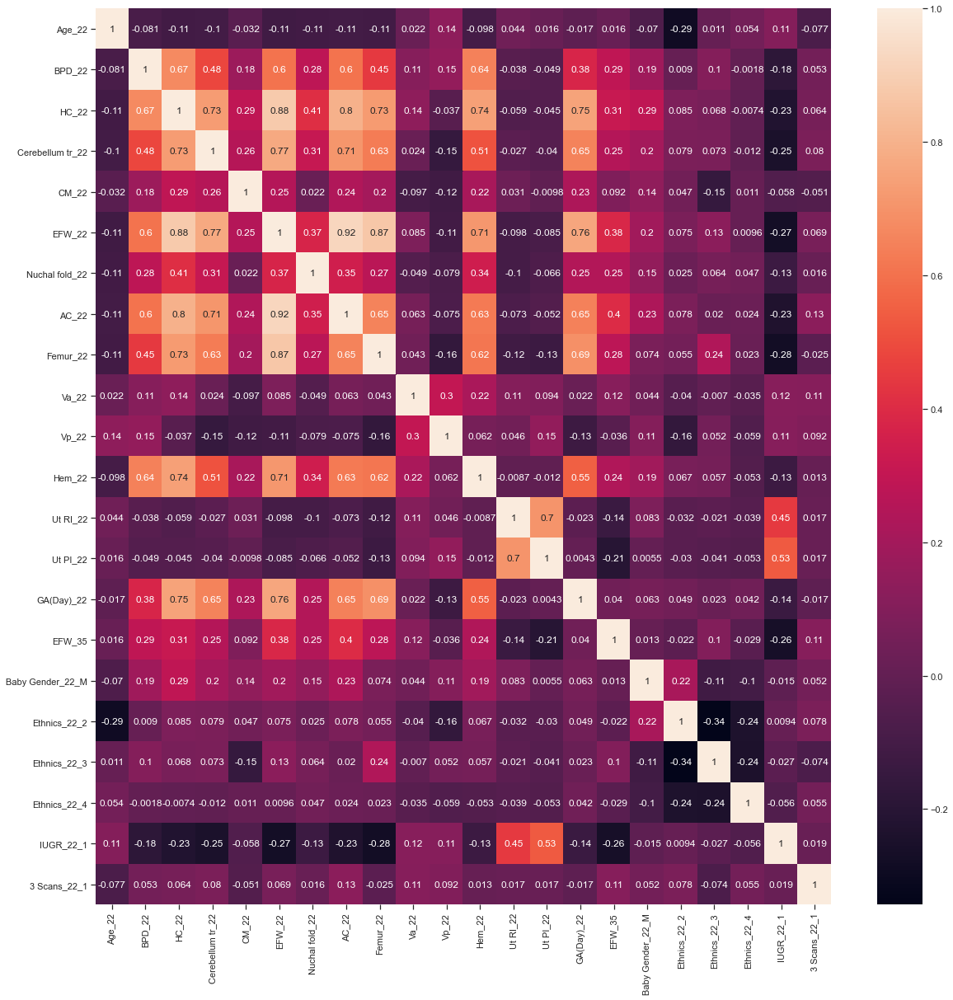

In [71]:
plot_heat_map(X)

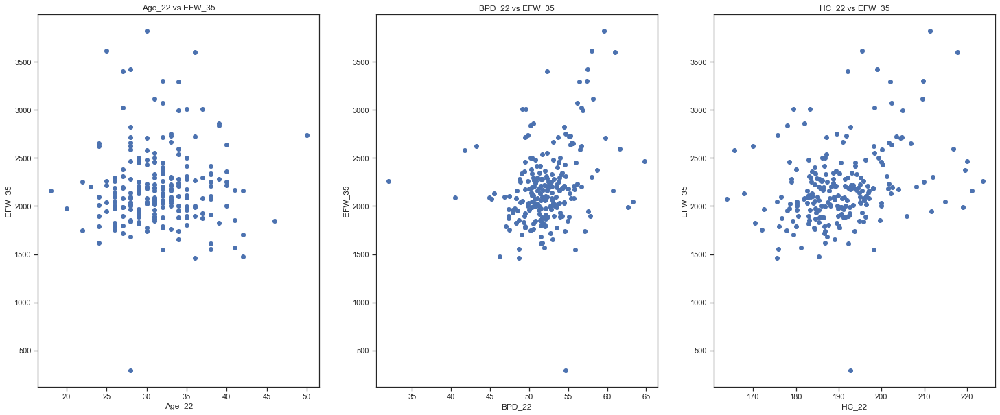

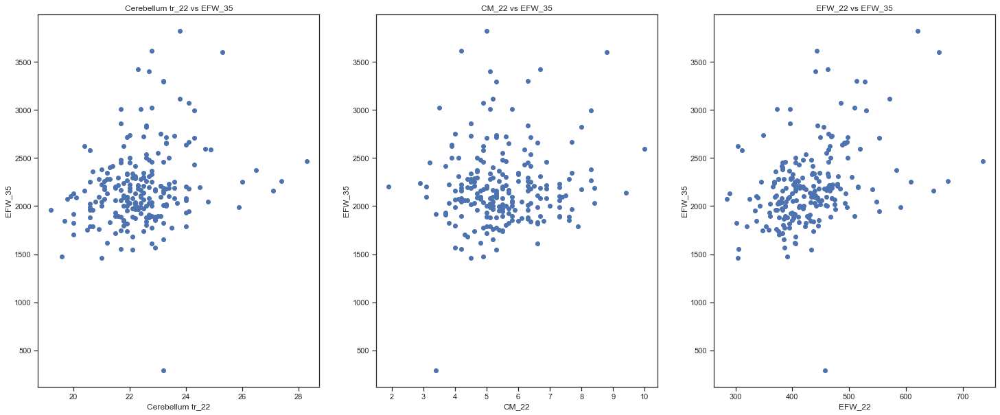

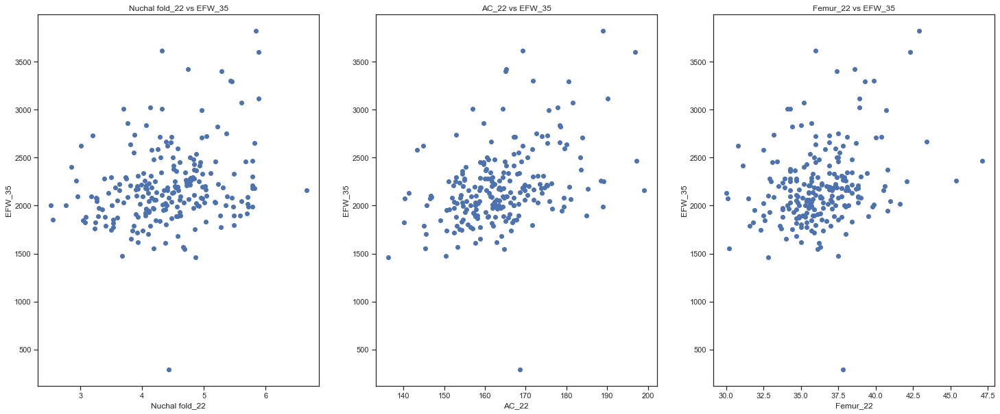

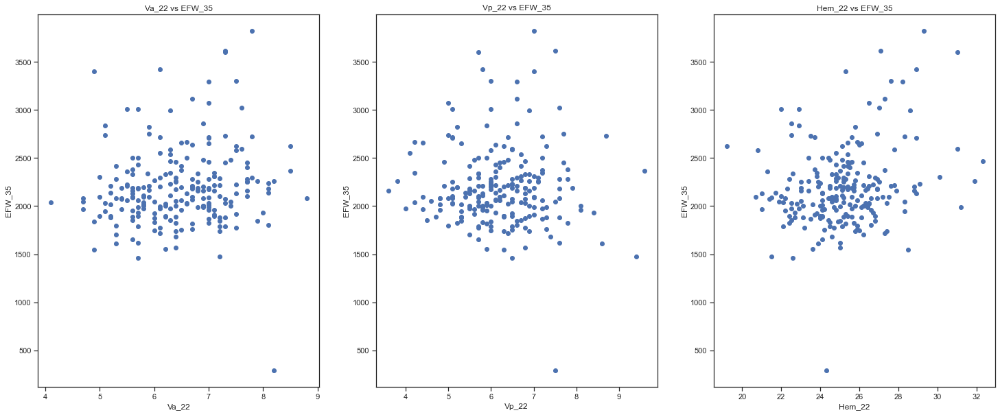

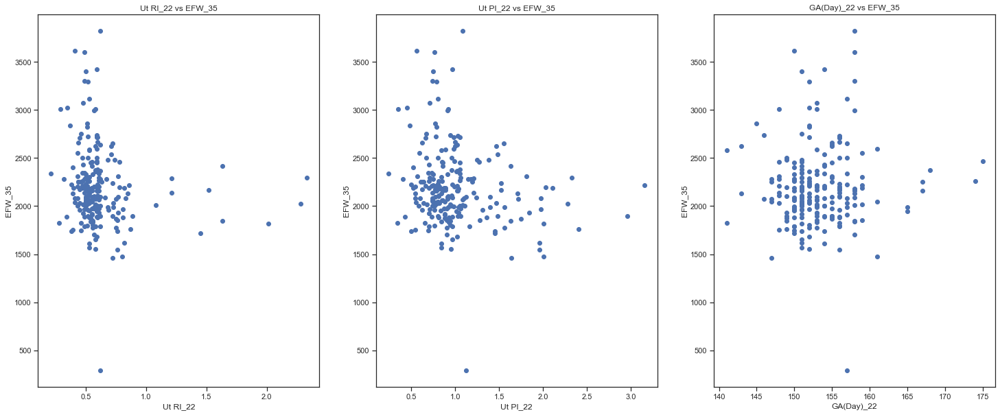

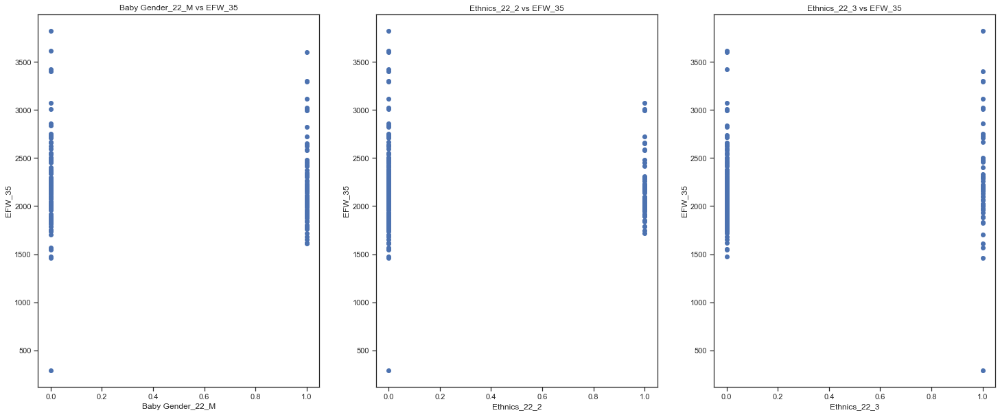

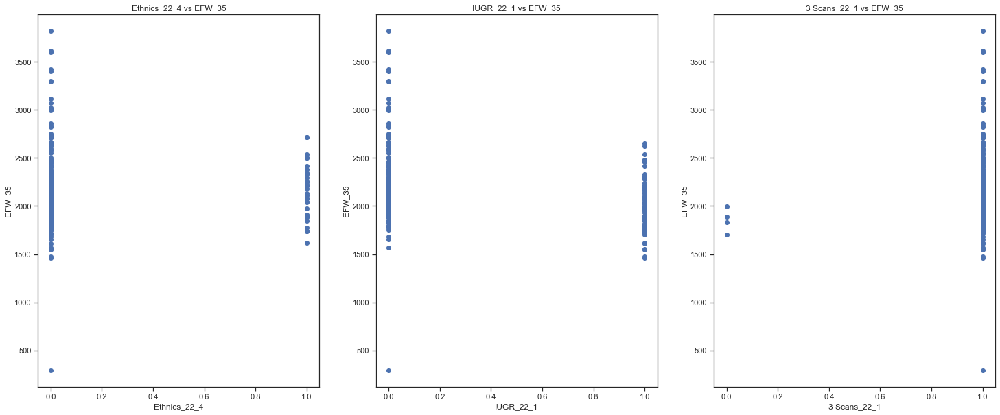

In [27]:
features_graph(X)

In [156]:
#backward elim
SL = 0.05
X_22_35, columns_drop_list = backward_elimination(X.drop(label_name, axis=1), X[label_name],  SL, const=True)

#add y into X_Modeled
X_22_35[label_name] = X[label_name]
print('\ncolumns to be dropped:\n', columns_drop_list)

                            OLS Regression Results                            
Dep. Variable:                 EFW_35   R-squared:                       0.376
Model:                            OLS   Adj. R-squared:                  0.340
Method:                 Least Squares   F-statistic:                     10.54
Date:                Sun, 25 Apr 2021   Prob (F-statistic):           3.19e-16
Time:                        18:01:00   Log-Likelihood:                -1603.9
No. Observations:                 223   AIC:                             3234.
Df Residuals:                     210   BIC:                             3278.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Age_22               8.8826      4.843  

In [157]:
X_22_35

,Age_22,HC_22,EFW_22,Nuchal fold_22,Femur_22,Va_22,Ut RI_22,Ut PI_22,GA(Day)_22,Baby Gender_22_M,IUGR_22_1,const,Hem_22,EFW_35
2,26,186.0,410,2.93,34.7,7.9,0.47,0.70,152,1,0,1,23.4,2261.0
5,36,217.8,658,5.88,42.3,7.3,0.49,0.76,158,1,0,1,31.0,3603.0
7,30,193.7,437,3.84,36.5,6.4,0.76,1.45,154,0,1,1,27.4,1737.0
9,37,192.5,397,4.05,35.4,6.0,0.48,0.70,153,1,0,1,23.8,1922.0
10,32,193.8,456,5.82,38.8,5.7,0.54,0.85,156,1,0,1,22.3,2181.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339,32,185.5,377,3.93,35.3,5.2,0.53,0.81,151,0,0,1,22.7,1879.0
341,29,186.1,405,4.78,35.9,6.6,0.52,0.80,149,0,0,1,23.4,2501.0
342,29,172.5,383,4.19,34.2,4.7,0.49,0.71,151,0,0,1,21.0,1966.0
345,29,221.1,648,6.66,40.5,6.9,0.55,0.86,167,1,0,1,28.8,2161.0


In [158]:
#cross validate the model to check - backward eli
#cross_validate_models(models, columns, df_32_X), columns = list of y you wanna predict, return a dict as a result

#Initial model setup
models = [LinearRegression(normalize=True), 
          Lasso(alpha=0.2, normalize=True),
          Ridge(alpha=0.2,fit_intercept=True, normalize=True, solver='cholesky'),
          RandomForestRegressor(n_estimators = 10, random_state = 42),
          AdaBoostRegressor(random_state=42, n_estimators=50), 
          GradientBoostingRegressor(n_estimators = 50, random_state = 42), 
          make_pipeline(StandardScaler(), SVR(kernel='linear', C=0.5, epsilon=0.1)),
          KNeighborsRegressor(n_neighbors=5)
         ]
#cv
cross_validate_models(models, X_22_35, label_name)

Cross validation Result for EFW_35:


,Models,test_r2,train_r2,test_neg_rmse,train_neg_rmse,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.254862,0.383917,-338.646215,-318.979262,2192.439462
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.257205,0.381906,-338.634122,-319.499229,2192.439462
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.230255,0.323961,-347.492090,-334.192660,2192.439462
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",-0.077803,0.833730,-405.736793,-165.162124,2192.439462
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.041350,0.630015,-384.186906,-247.166527,2192.439462
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",-0.007459,0.835319,-393.427834,-164.722368,2192.439462
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.029013,0.064466,-392.653009,-393.318949,2192.439462
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",-0.049123,0.328893,-403.551251,-332.982526,2192.439462


The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with test_r2 score: 0.25720496951453165


## Predict Wk35 fetal weight using Wk32 data
- However, I found out that the prediction of wk35 using wk22+wk32 data is the best

In [110]:
#test features and train model
label_name = 'EFW_35'

#random forest regressor - no need scale/normalize data, but need to turn them to 1-hot encoding
df_train = df_32

#only 224 rows existed in df_35[EFW]
#hence, use merge
df_train = df_train.merge(df_35[label_name], left_index= True, right_index=True) #join based on left index and right index
#drop the outliers- None

#1-hot encoding
X = pd.get_dummies(df_train, drop_first=True)
# y = df_train['EFW']
# #drop the EFW from X
# X.drop('EFW', axis=1, inplace=True)

In [44]:
X

,HC_32,AC_32,FEMUR_32,EFW_32,HC/AC_32,FL/HC_32,FL/AC_32,AFI_32,Umb RI_32,Umb S/D_32,GA(Day)_32,HC_GA_32,EFW_35,IUGR_32_1.0
2,289.9,274.3,57.6,1709.0,1.06,0.20,0.21,13.100000,0.67,3.06,228.0,1.271491,2261.0,0
5,318.0,334.3,64.3,2790.0,0.95,0.20,0.19,12.437663,0.57,2.30,224.0,1.419643,3603.0,0
7,289.2,249.3,55.5,1423.0,1.16,0.19,0.22,13.500000,0.72,3.56,217.0,1.332719,1737.0,0
9,276.9,251.7,56.1,1415.0,1.10,0.20,0.22,12.505170,0.56,2.27,222.0,1.247297,1922.0,1
10,275.7,244.0,55.6,1336.0,14.13,0.20,0.23,13.100000,0.57,2.35,205.0,1.344878,2181.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
339,278.3,260.0,57.2,1519.0,1.07,0.21,0.22,9.400000,0.55,2.24,224.0,1.242411,1879.0,1
341,283.2,273.5,62.4,1805.0,1.04,0.22,0.23,12.781041,0.72,3.60,226.0,1.253097,2501.0,0
342,274.0,248.4,58.0,1425.0,1.10,0.21,0.23,11.800000,0.63,2.67,217.0,1.262673,1966.0,0
345,291.3,273.0,59.6,1757.0,1.07,0.20,0.22,15.300000,0.56,2.26,224.0,1.300446,2161.0,0


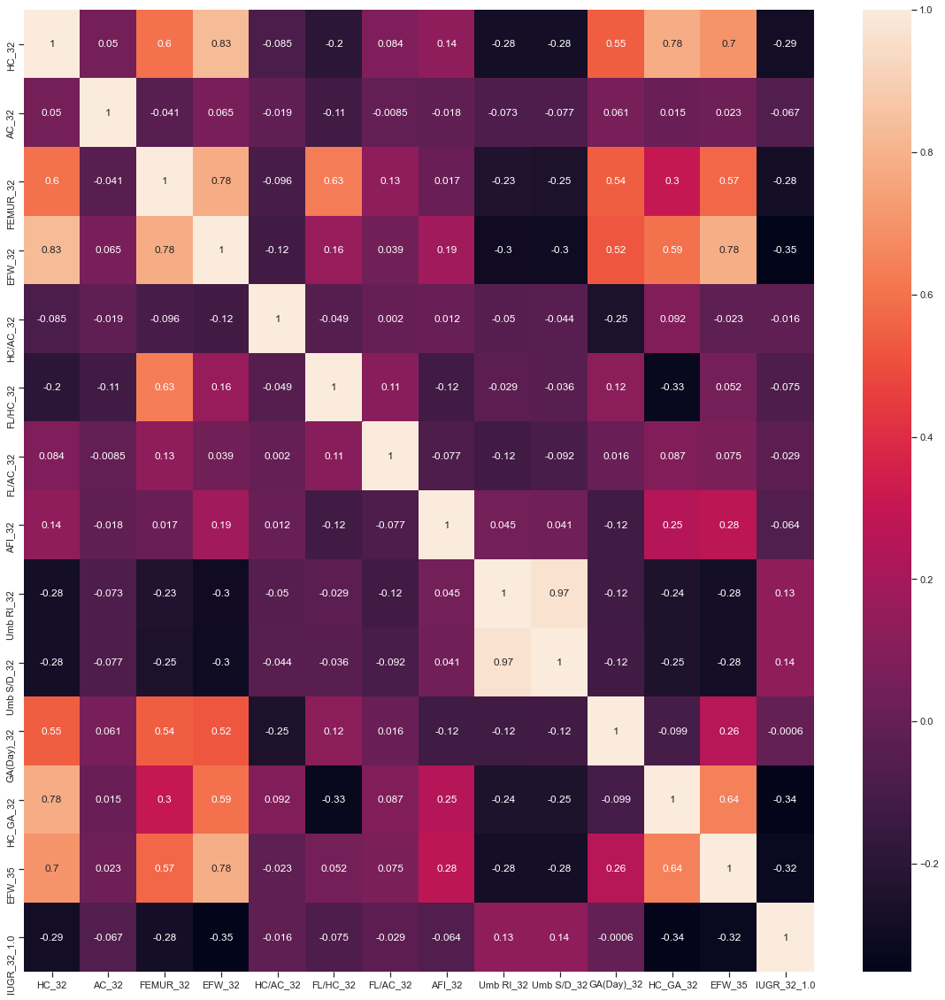

In [45]:
plot_heat_map(X)

IndexError: index 1 is out of bounds for axis 0 with size 1

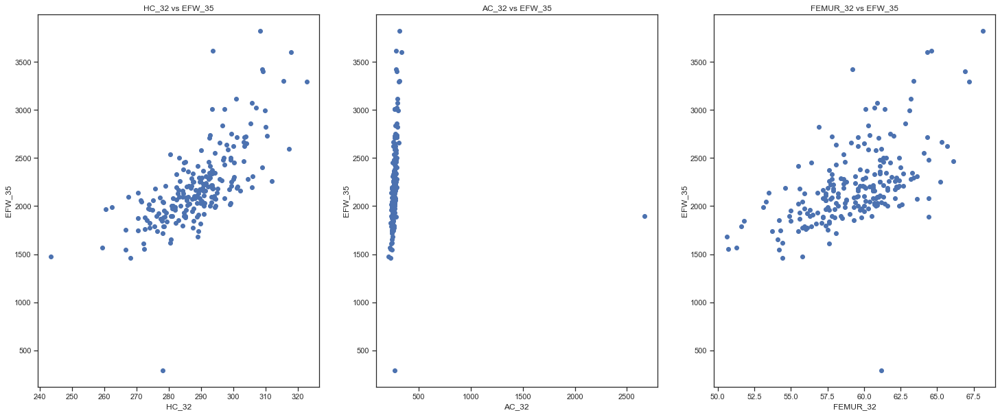

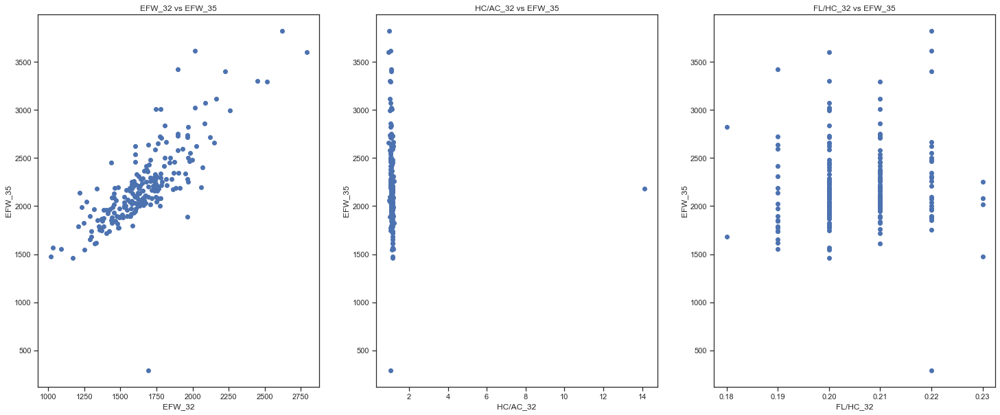

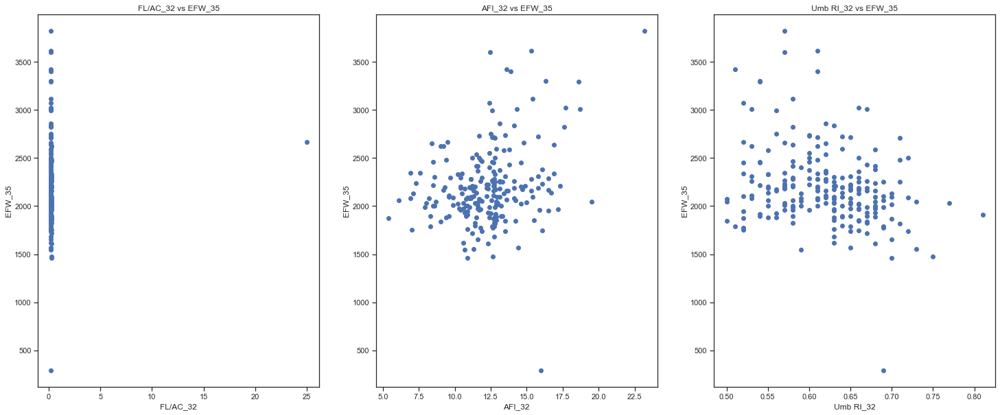

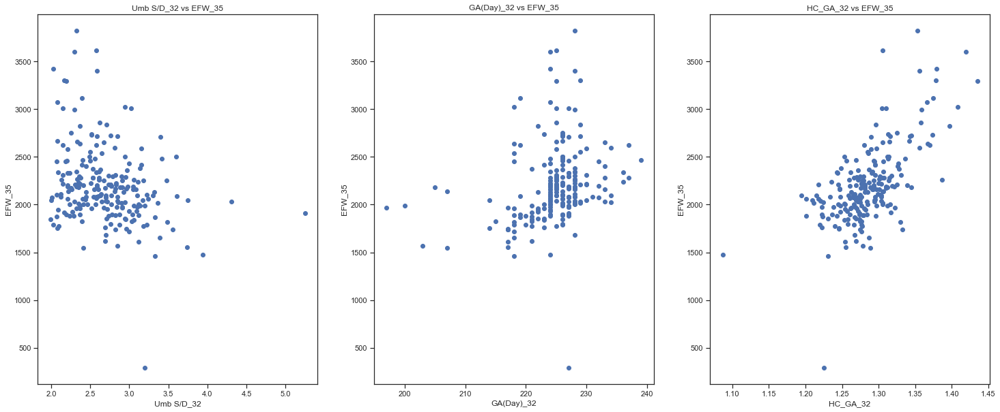

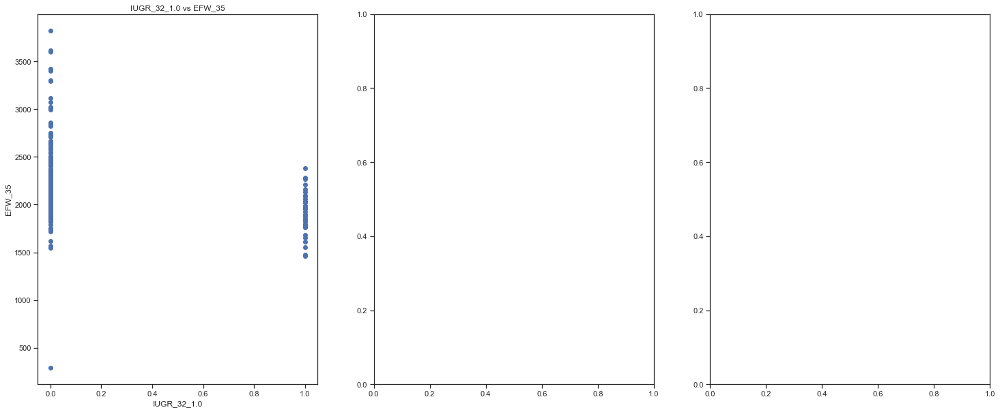

In [46]:
features_graph(X)

In [47]:
#stepwise
col_stepwise = stepwise_selection(X.drop(label_name, axis=1), X[label_name])
col_stepwise.append(label_name)
print('columns used in stepwise:')
print(col_stepwise)

['EFW_32']
['EFW_32', 'HC_GA_32']
['EFW_32', 'HC_GA_32', 'AFI_32']
columns used in stepwise:
['EFW_32', 'HC_GA_32', 'AFI_32', 'EFW_35']


c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis,

In [48]:
#back elimination better than feature importance analysis (r2 results)
SL = 0.05
X_32_35, columns_drop_list = backward_elimination(X.drop(label_name, axis=1), X[label_name],  SL)

#add y into X_Modeled
X_32_35[label_name] = X[label_name]
print('\ncolumns to be dropped:\n', columns_drop_list)

                                 OLS Regression Results                                
Dep. Variable:                 EFW_35   R-squared (uncentered):                   0.989
Model:                            OLS   Adj. R-squared (uncentered):              0.989
Method:                 Least Squares   F-statistic:                              2803.
Date:                Mon, 17 May 2021   Prob (F-statistic):                   2.38e-204
Time:                        13:57:15   Log-Likelihood:                         -1495.6
No. Observations:                 218   AIC:                                      3005.
Df Residuals:                     211   BIC:                                      3029.
Df Model:                           7                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [306]:
#using knn impute : test_r2 score: 0.647337572446456
#using GAN imputer: test_r2 score: 0.6495899669300248

#initial model setup
models = [LinearRegression(normalize=True), 
          Lasso(alpha=0.2, normalize=True),
          Ridge(alpha=0.2,fit_intercept=True, normalize=True, solver='cholesky'),
          RandomForestRegressor(n_estimators = 10, random_state = 42),
          AdaBoostRegressor(random_state=42, n_estimators=50), 
          GradientBoostingRegressor(n_estimators = 50, random_state = 42), 
          make_pipeline(StandardScaler(), SVR(kernel='linear', C=10, epsilon=10, gamma='scale', )), 
          KNeighborsRegressor(n_neighbors=5)
         ]
#cv
#After dropping columns - without const r2=0.5748540545598322, after dropping ethics: 0.5788139048963803
print('Prediction of WK35 using WK32 backward elimination.')
cross_validate_models(models, X_32_35, label_name)

Prediction of WK35 using WK32 backward elimination.
Cross validation Result for EFW_35:


,Models,test_r2,train_r2,test_neg_rmse,train_neg_rmse,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.649568,0.685583,-231.880034,-228.196564,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.649590,0.682486,-232.087915,-229.327098,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.641484,0.664758,-235.786315,-235.692667,2200.417431
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.511438,0.923440,-272.617345,-112.004162,2200.417431
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.562562,0.845714,-259.411401,-159.757577,2200.417431
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.513499,0.933497,-269.749375,-104.912298,2200.417431
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.645312,0.662779,-234.282525,-236.362354,2200.417431
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.507737,0.702061,-272.102447,-222.093357,2200.417431


The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with test_r2 score: 0.6495899669300248


In [307]:
#using KNN - stepwise elimination r2=0.6548485936167474
#using GAN - test_r2 score: 0.6564349296435553
print('Prediction of WK35 using WK32 stepwise elimination.')
cross_validate_models(models, X[col_stepwise], label_name)

Prediction of WK35 using WK32 stepwise elimination.
Cross validation Result for EFW_35:


,Models,test_r2,train_r2,test_neg_rmse,train_neg_rmse,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.653363,0.676670,-230.706618,-231.427574,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.653458,0.676593,-230.740670,-231.455075,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.651788,0.666152,-232.635580,-235.205903,2200.417431
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.524881,0.924525,-269.371230,-111.140782,2200.417431
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.511507,0.841382,-271.694643,-161.962286,2200.417431
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.566992,0.921819,-257.370409,-113.764981,2200.417431
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.656435,0.667289,-230.728995,-234.773317,2200.417431
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.456171,0.677056,-283.851069,-231.086536,2200.417431


The best model is 
 Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=10, cache_size=200, coef0=0.0, degree=3, epsilon=10,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False) 
 with test_r2 score: 0.6564349296435553


### SVR, LR, Lasso, Ridge - For Stepwise

In [311]:
#General params
cv = RepeatedKFold(n_splits=5, n_repeats=15, random_state=42)

#### Stepwise tune

In [312]:
#svr
svr_best_params_stepwise = svr_hypertune(X[col_stepwise].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 240 candidates, totalling 18000 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1814s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0180s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  38 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0389s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  68 tasks      | elapsed:    1.6s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0738s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1636s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 396 tasks      | elapsed:    2.3s
[Parallel(n_jobs=4)]: Don

Best Score: -154.93000450359344
Best Hyperparameters: {'clf__C': 1000, 'clf__epsilon': 10, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


[Parallel(n_jobs=4)]: Done 17929 tasks      | elapsed:   37.8s
[Parallel(n_jobs=4)]: Done 18000 out of 18000 | elapsed:   37.9s finished


In [313]:
#lr
lr_best_params_stepwise = linear_regression_hypertune(X[col_stepwise].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 4 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1729s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0349s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0349s.) Setting batch_size=8.


Best Score (neg_mean_absolute_error): -156.26898285583474
Best Hyperparameters: {'normalize': False, 'fit_intercept': True}


[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0628s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 259 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    2.5s finished


In [314]:
#ridge
ridge_best_params_stepwise = ridge_hypertune(X[col_stepwise].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0120s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0349s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0379s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0638s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1406s.) Setting batch_size=32.
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.3s
[Parallel(n

Best Score in neg_root_mean_squared_error: -229.88189973074597
Best Hyperparameters: {'alpha': 0.053121562366700195, 'fit_intercept': True, 'normalize': False, 'solver': 'cholesky'}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  1.8min finished


In [315]:
#Lasso
lasso_best_params_stepwise = lasso_hypertune(X[col_stepwise].drop(label_name, axis=1), X[label_name], cv)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0130s.) Setting batch_size=2.


Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0429s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0449s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1207s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1356s.) Setting batch_size=32.
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 560 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 1040 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 1520 tasks      |

Best Score: -155.6886407123607
Best Hyperparameters: {'alpha': 0.5579310595219891, 'fit_intercept': True, 'normalize': False, 'selection': 'random'}


In [316]:
#-----------------------using KNN ------------------ test_r2 score: 0.6543531274172582
#svr
#'clf__C': 1000, 'clf__epsilon': 100, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}

#ridge
#{'alpha': 0.056496042087489935, 'fit_intercept': True, 'normalize': False, 'solver': 'auto'}

#lasso
#'alpha': 0.5579310595219891, 'fit_intercept': True, 'normalize': False, 'selection': 'random'

# #knn imputer best parameters: test_r2 score: 0.660157971179986
# models = [make_pipeline(StandardScaler(), SVR(kernel='linear', C=1000, epsilon=100, gamma='scale')), 
#           LinearRegression(normalize=True, fit_intercept=False), 
#           Ridge(alpha=0.056496042087489935,fit_intercept=True, normalize=False, solver='auto'),
#           Lasso(alpha=0.5579310595219891, fit_intercept=True, normalize=False, selection='random'),
#          ]

# cross_validate_models(models, X[col_stepwise], label_name)


#-----------------------------using GAN ----------------------- test_r2 score: 
#svr
#'clf__C': 1000, 'clf__epsilon': 10, 'clf__gamma': 'scale', 'clf__kernel': 'linear'

#lr
#'normalize': False, 'fit_intercept': True

#ridge
#'alpha': 0.053121562366700195, 'fit_intercept': True, 'normalize': False, 'solver': 'cholesky'

#lasso
#'alpha': 0.5579310595219891, 'fit_intercept': True, 'normalize': False, 'selection': 'random'


#GAN imputer best parameters:
models = [make_pipeline(StandardScaler(), SVR(kernel='linear', C=1000, epsilon=10, gamma='scale')), 
          LinearRegression(normalize=True, fit_intercept=False), 
          Ridge(alpha=0.053121562366700195,fit_intercept=True, normalize=False, solver='cholesky'),
          Lasso(alpha=0.5579310595219891, fit_intercept=True, normalize=False, selection='random'),
         ]

cross_validate_models(models, X[col_stepwise], label_name)

#why test rmse < train rmse:
#https://stats.stackexchange.com/questions/187335/validation-error-less-than-training-error
'''
One possibility: If you are using dropout regularization layer in your network, it is reasonable that 
the validation error is smaller than training error. Because usually dropout is activated when training 
but deactivated when evaluating on the validation set. You get a more smooth (usually means better) function 
in the latter case.
'''


Cross validation Result for EFW_35:


,Models,test_r2,train_r2,test_neg_rmse,train_neg_rmse,y_mean
0,"(StandardScaler(copy=True, with_mean=True, wit...",0.660158,0.672199,-228.067596,-233.016063,2200.417431
1,"LinearRegression(copy_X=True, fit_intercept=Fa...",0.615924,0.635335,-241.503174,-245.734452,2200.417431
2,"Ridge(alpha=0.053121562366700195, copy_X=True,...",0.654229,0.674818,-229.881900,-232.085613,2200.417431
3,"Lasso(alpha=0.5579310595219891, copy_X=True, f...",0.652423,0.675012,-230.538005,-232.022569,2200.417431


The best model is 
 Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=10,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False) 
 with test_r2 score: 0.660157971179986


## Predict Wk35 fetal weight using Wk22+WK32 data

In [58]:
#test features and train model
label_name = 'EFW_35'

#random forest regressor - no need scale/normalize data, but need to turn them to 1-hot encoding
df_train = df_22_32

#only 224 rows existed in df_35[EFW]
#hence, use merge
df_train = df_train.merge(df_35[label_name], left_index= True, right_index=True) #join based on left index and right index
#drop the outliers [132,44,154]
df_train = df_train.drop([132,44,154])


#1-hot encoding
X = pd.get_dummies(df_train, drop_first=True)
# y = df_train['EFW']
# #drop the EFW from X
# X.drop('EFW', axis=1, inplace=True)

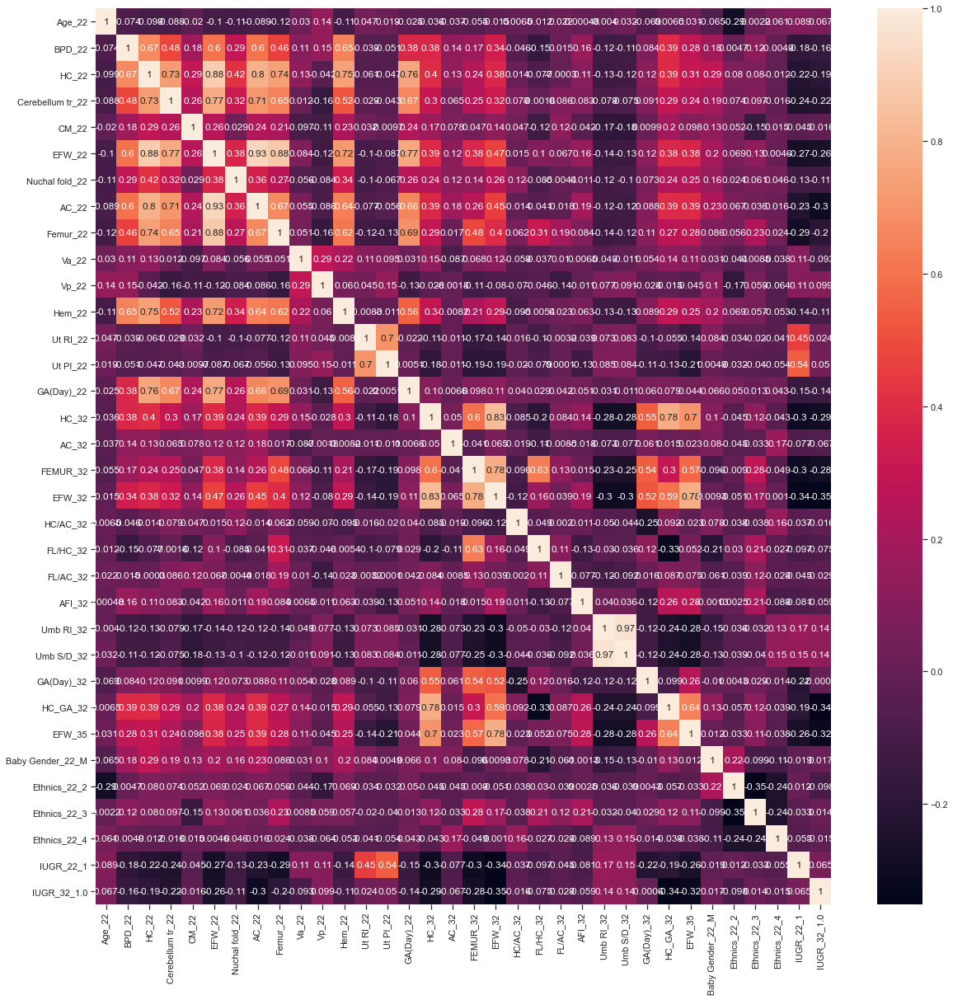

In [244]:
plot_heat_map(X)

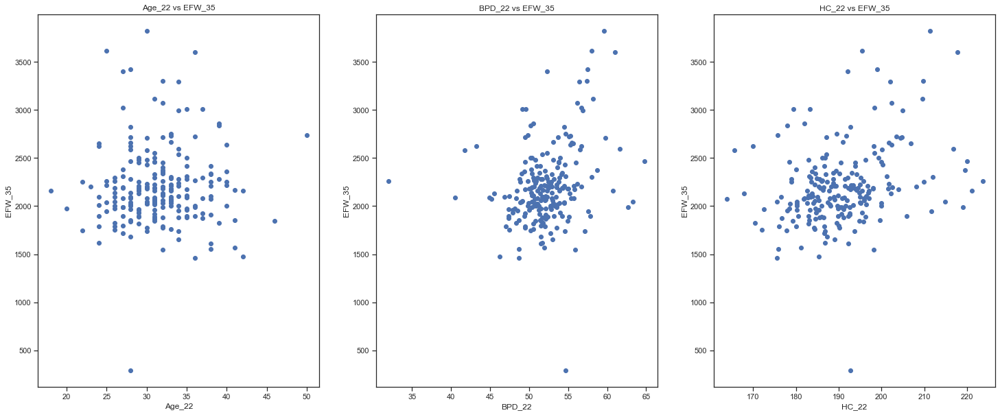

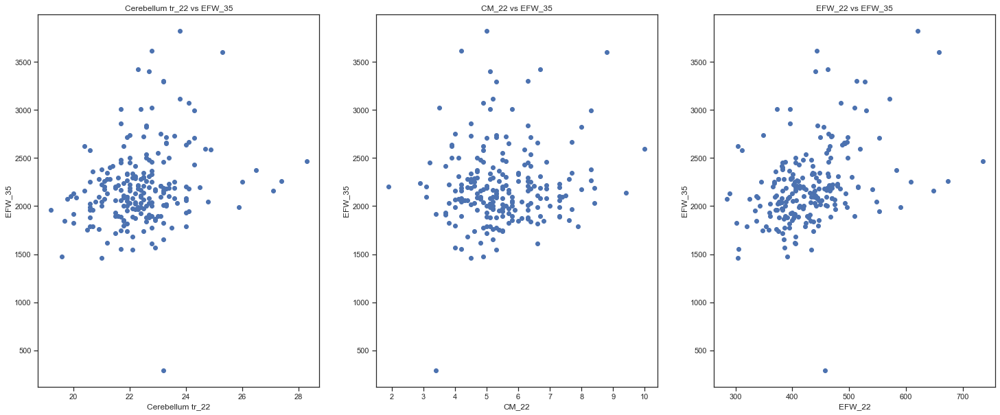

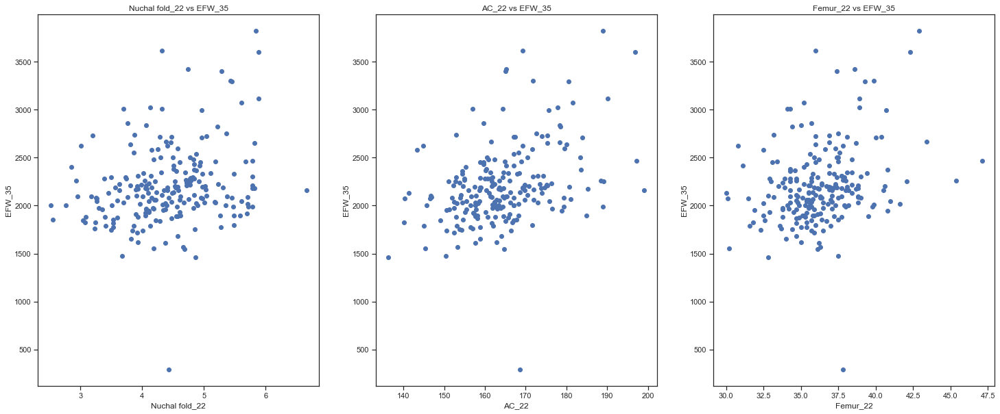

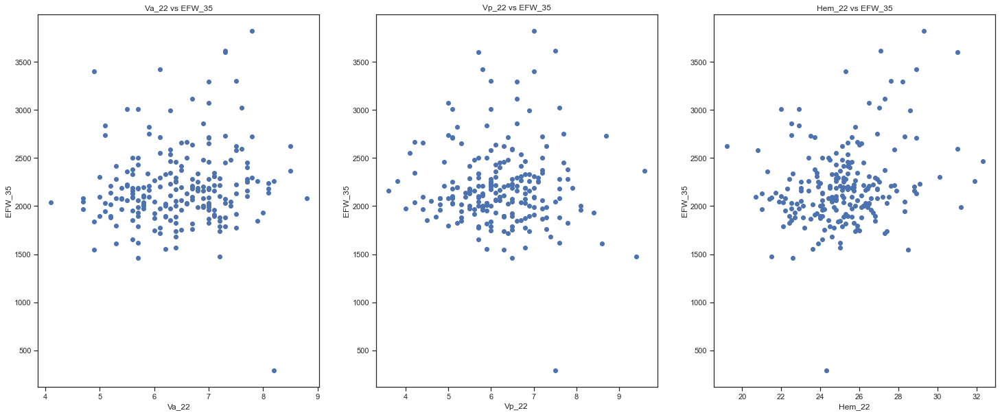

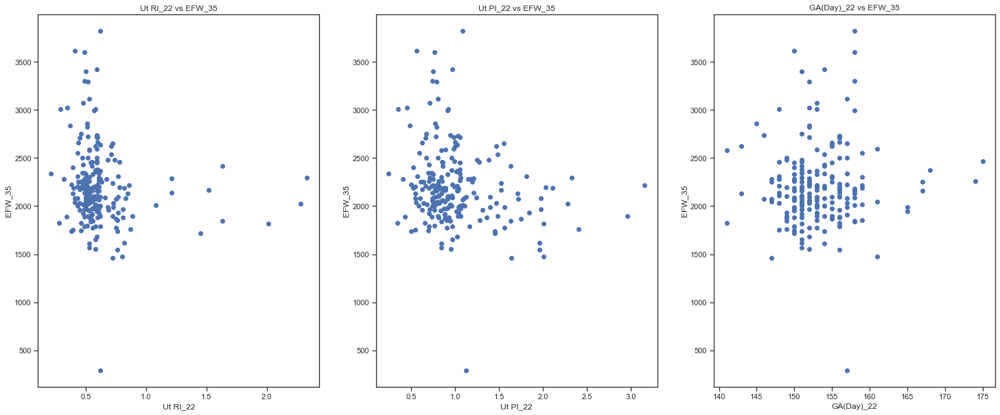

...

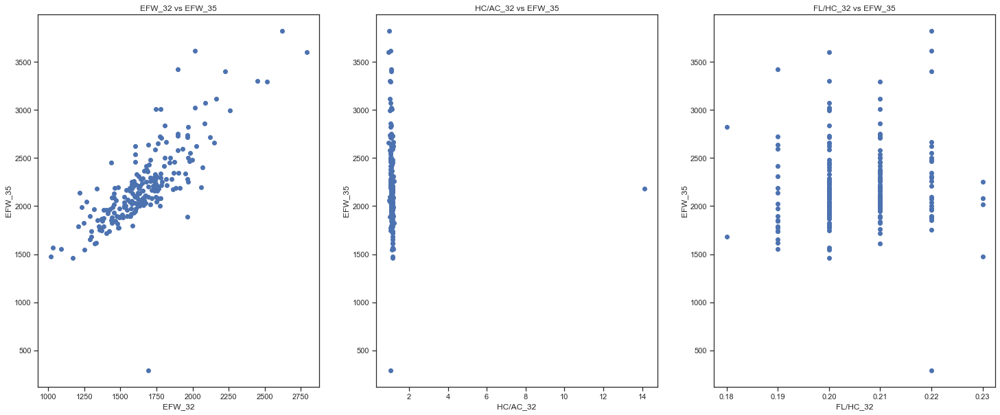

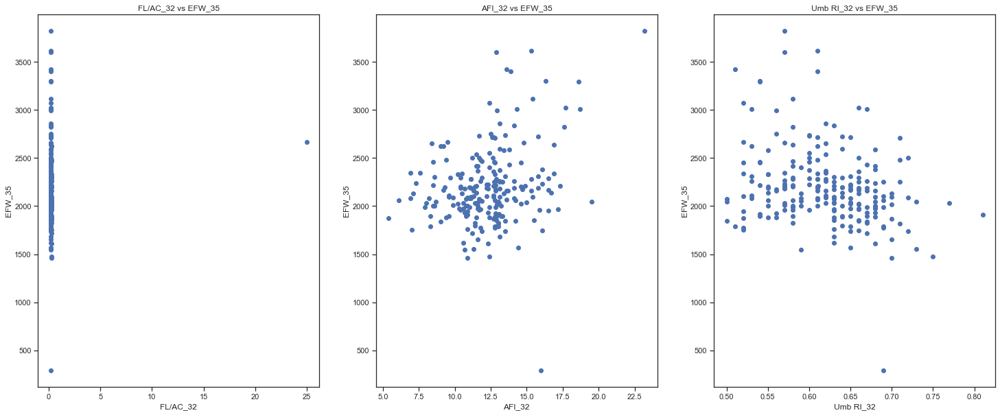

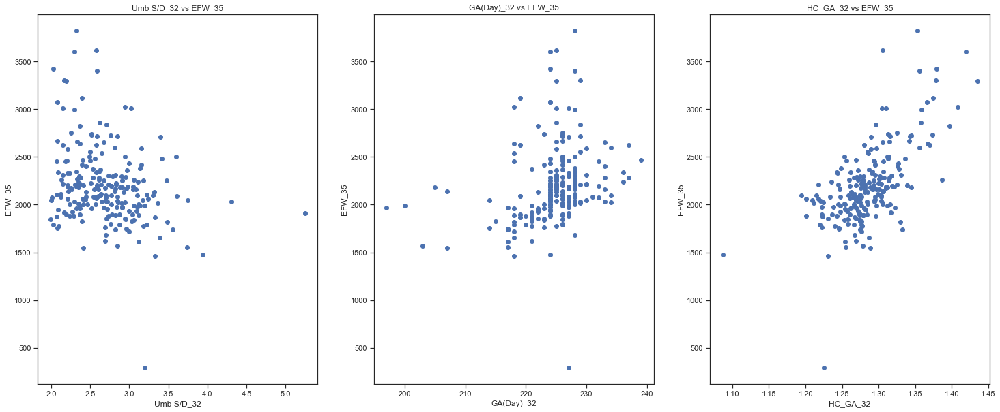

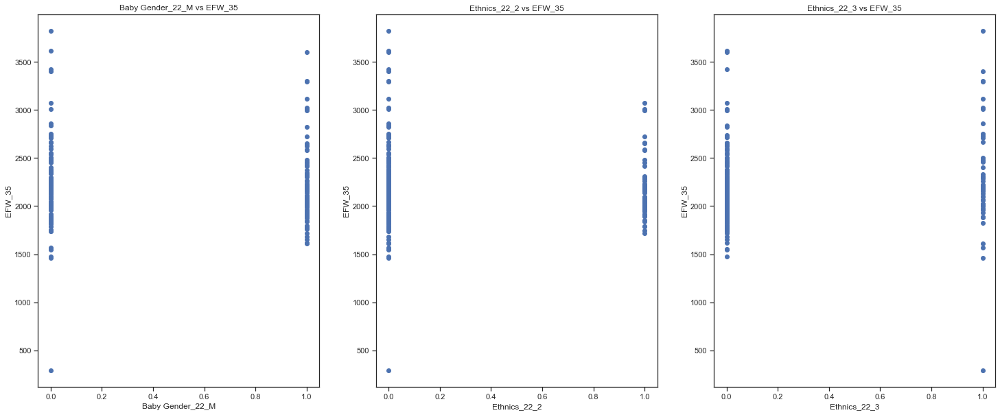

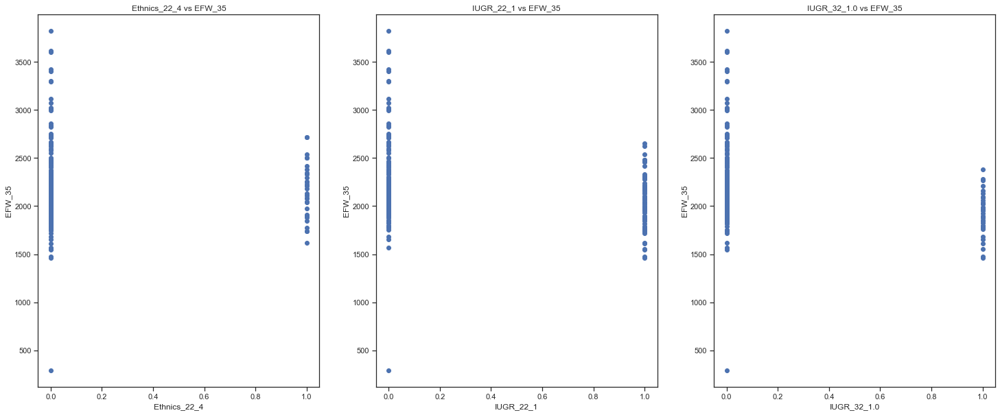

In [133]:
features_graph(X)

In [59]:
#stepwise
col_stepwise = stepwise_selection(X.drop(label_name, axis=1), X[label_name])
col_stepwise.append(label_name)

c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis,

['EFW_32']
['EFW_32', 'HC_GA_32']


c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis,

['EFW_32', 'HC_GA_32', 'AFI_32']
['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32']


c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis,

c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)
c:\users\yi chong\appdata\local\programs\python\python38\lib\site-packages\numpy\core\fromnumeric.py:2542: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis,

In [60]:
print('columns used:')
print(col_stepwise)

columns used:
['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'EFW_35']


In [124]:
# #back elimination better than feature importance analysis (r2 results)
# SL = 0.05
# X_2232_35, columns_drop_list = backward_elimination(X.drop(label_name, axis=1), X[label_name],  SL)

# #add y into X_Modeled
# X_2232_35[label_name] = X[label_name]
# print('\ncolumns to be dropped:\n', columns_drop_list)
# X_2232_35.drop('Ethnics_22_3', axis=1, inplace=True) #dropping result in increasing of accuracy

In [61]:
#model setup
models = [LinearRegression(normalize=True), 
          Lasso(alpha=0.2, normalize=True),
          Ridge(alpha=0.2,fit_intercept=True, normalize=True, solver='cholesky'),
          RandomForestRegressor(n_estimators = 10, random_state = 42),
          AdaBoostRegressor(random_state=42, n_estimators=50), 
          GradientBoostingRegressor(n_estimators = 50, random_state = 42), 
          make_pipeline(StandardScaler(), SVR(kernel='linear', C=10, epsilon=10, gamma='scale', )), 
          KNeighborsRegressor(n_neighbors=5),
          linear_model.BayesianRidge(),
         ]

In [118]:
# #backward elim (r2= 0.5788139048963803)
# #initial model setup

# #cv
# #After dropping columns - without const r2=0.5748540545598322, after dropping ethics: 0.5788139048963803
# print('Prediction of WK35 using WK22+WK32 backward elimination.')
# cross_validate_models(models, X_2232_35, label_name)

In [126]:
#stepwise elimination r2=0.6548485936167474
print('Prediction of WK35 using WK22+WK32 stepwise elimination.')
cross_validate_models(models, X[col_stepwise], label_name)

Prediction of WK35 using WK22+WK32 stepwise elimination.
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734032,0.098590,0.771996,0.018891,-180.292162,21.082875,0.116937,-175.420349,5.140185,0.740533,0.097321,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734214,0.096552,0.771807,0.018900,-180.418283,20.836070,0.115488,-175.493102,5.137554,0.740825,0.095301,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.727587,0.083737,0.760217,0.018608,-184.091796,19.568544,0.106298,-179.921778,4.908714,0.734920,0.081635,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.663212,0.092073,0.949002,0.006653,-205.793077,22.655378,0.110088,-82.849719,4.666127,0.671825,0.092928,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677500,0.078248,0.841769,0.014071,-201.918116,21.967553,0.108794,-146.132937,5.366649,0.688105,0.076373,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703600,0.085676,0.925006,0.007673,-192.761099,22.135251,0.114833,-100.552589,4.144277,0.712299,0.084551,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722871,0.088405,0.762371,0.020623,-185.370919,20.164471,0.108779,-179.059946,5.535330,0.732573,0.088063,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608112,0.110681,0.763069,0.021773,-221.565662,23.573371,0.106395,-178.780770,6.037030,0.622517,0.109542,2197.018605


The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.29216201232248
The error:8.200000000000001%
8.200000000000001


(LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True),
 -180.29216201232248)

In [196]:
#my features selection
models = [LinearRegression(normalize=True), 
          Lasso(alpha=0.2, normalize=True),
          Ridge(alpha=0.2,fit_intercept=True, normalize=True, solver='cholesky'),
          make_pipeline(StandardScaler(), SVR(kernel='linear', C=10, epsilon=10, gamma='scale', )), 
          linear_model.BayesianRidge(),
         ]
my_df = test_features(models, X, label_name) #by using backward, the best I get is these two columns
'''
EFW_32
HC_GA_32
'''

Loop 1:
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-596.625946,1440.979584,0.720416,0.039427,-5245.165269,7366.564005,1.404448,-215.145170,20.589508,-583.270188,1408.489732,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.504977,27.787389,0.711856,0.039578,-495.818548,895.906205,1.806924,-218.437859,20.528053,-5.349710,27.099014,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-184.454147,636.149703,0.699655,0.038909,-2379.295405,3732.489725,1.568737,-223.057756,20.086383,-180.152648,621.545917,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-379.039703,1403.626454,0.675481,0.045790,-3200.659309,5276.972242,1.648714,-231.790259,22.306767,-370.194877,1370.972698,2200.417431


  0%|                                                                                           | 0/33 [00:00<?, ?it/s]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -495.81854772351244
The error:22.5%
22.5
features to test: ['Age_22', 'BPD_22', 'HC_22', 'Cerebellum tr_22', 'CM_22', 'EFW_22', 'Nuchal fold_22', 'AC_22', 'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'HC_32', 'AC_32', 'FEMUR_32', 'EFW_32', 'HC/AC_32', 'FL/HC_32', 'FL/AC_32', 'AFI_32', 'Umb RI_32', 'Umb S/D_32', 'GA(Day)_32', 'HC_GA_32', 'Baby Gender_22_M', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4', 'IUGR_22_1', 'IUGR_32_1.0']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-667.476658,1553.966873,0.719174,0.039636,-5544.742041,7781.581277,1.403416,-215.617817,20.604986,-652.408237,1518.952219,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.649846,34.244297,0.710452,0.039907,-515.064260,985.718125,1.913777,-218.963450,20.597056,-6.467142,33.396503,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-181.893090,623.814535,0.697721,0.039258,-2364.307134,3711.527161,1.569816,-223.770461,20.160349,-177.645277,609.493916,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-376.369946,1358.176692,0.674900,0.045705,-3238.232211,5278.364189,1.630014,-231.993943,22.189673,-367.607233,1326.738252,2200.417431


  3%|██▌                                                                                | 1/33 [00:01<01:02,  1.94s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -515.0642599849981
The error:23.400000000000002%
23.400000000000002
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-454.560485,1116.449578,0.717548,0.040055,-4644.337110,6362.918481,1.370038,-216.242224,20.811004,-444.440776,1091.259632,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-4.151718,22.426680,0.709938,0.040041,-457.505551,786.387084,1.718858,-219.160230,20.691176,-4.026466,21.867542,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-185.779714,638.260549,0.698221,0.039278,-2390.435795,3750.917136,1.569135,-223.585483,20.199992,-181.453538,623.633234,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-398.316789,1452.223637,0.673135,0.045897,-3306.076743,5484.787983,1.659002,-232.632885,22.336507,-389.014086,1418.397069,2200.417431


  6%|█████                                                                              | 2/33 [00:03<01:00,  1.94s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -457.50555094343804
The error:20.8%
20.8
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-630.000424,1493.081387,0.719321,0.039609,-5360.531544,7684.590398,1.433550,-215.567683,20.671578,-615.685864,1459.390532,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.512593,29.591472,0.711618,0.039640,-521.252318,954.674187,1.831501,-218.528680,20.565899,-6.335754,28.873447,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-182.971099,632.774949,0.699406,0.038972,-2368.699173,3716.821682,1.569140,-223.150615,20.118483,-178.706040,618.248438,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-385.194164,1369.878112,0.675340,0.046103,-3285.113258,5352.761545,1.629399,-231.834671,22.402673,-376.188983,1337.977359,2200.417431


  9%|███████▌                                                                           | 3/33 [00:05<00:58,  1.94s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -521.2523184018485
The error:23.7%
23.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-601.589646,1447.504101,0.719824,0.039290,-5215.921093,7390.766113,1.416963,-215.375575,20.501088,-588.130980,1414.831462,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.037744,24.653483,0.711477,0.039658,-487.452521,850.775413,1.745350,-218.580356,20.548488,-4.894527,24.047749,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-183.356997,630.960897,0.699221,0.038968,-2375.656463,3727.385423,1.568992,-223.218481,20.098804,-179.081415,616.480115,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-355.893658,1208.834842,0.675020,0.046218,-3223.145767,5226.317776,1.621496,-231.946647,22.443213,-347.611334,1180.756692,2200.417431


 12%|██████████                                                                         | 4/33 [00:07<00:56,  1.95s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -487.4525206162926
The error:22.2%
22.2
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-586.151866,1434.038998,0.719228,0.039085,-5163.635054,7319.311506,1.417473,-215.611421,20.400582,-573.048888,1401.717481,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-4.310376,23.627089,0.710490,0.039152,-449.146819,793.920900,1.767620,-218.964103,20.285442,-4.185888,23.044871,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-184.077837,633.381501,0.698654,0.038539,-2378.374985,3730.373558,1.568455,-223.435206,19.882732,-179.785288,618.844032,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-363.108625,1248.480705,0.673131,0.046239,-3182.006442,5269.852729,1.656141,-232.620462,22.332295,-354.641241,1219.470485,2200.417431


 15%|████████████▌                                                                      | 5/33 [00:09<00:54,  1.96s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -449.1468193818912
The error:20.4%
20.4
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-531.215287,1235.617147,0.719343,0.039069,-4892.921185,7044.053739,1.439642,-215.564551,20.375779,-519.278055,1207.831609,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.505996,27.791784,0.711850,0.039579,-495.915295,895.967165,1.806694,-218.439990,20.528061,-5.350719,27.103296,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-186.549000,643.287715,0.699567,0.038951,-2391.790741,3754.915603,1.569918,-223.090243,20.105640,-182.199249,628.521298,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-369.772274,1352.710847,0.675764,0.045758,-3180.451220,5224.123766,1.642573,-231.688146,22.281805,-361.142221,1321.243002,2200.417431


 18%|███████████████                                                                    | 6/33 [00:11<00:52,  1.94s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -495.9152954012658
The error:22.5%
22.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-571.839476,1412.317317,0.718629,0.038754,-5114.630774,7159.362471,1.399781,-215.845609,20.212353,-559.107061,1380.548430,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.799345,29.762381,0.709984,0.039064,-503.506579,925.072576,1.837260,-219.157460,20.243106,-5.637093,29.024392,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-203.233452,685.102996,0.697055,0.038401,-2495.855115,3954.164774,1.584293,-224.031853,19.798932,-198.496498,669.436042,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-406.723497,1386.732184,0.677506,0.043648,-3462.771026,5525.927487,1.595811,-231.100586,21.509396,-397.262152,1354.763977,2200.417431


 21%|█████████████████▌                                                                 | 7/33 [00:13<00:50,  1.94s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -503.50657907720966
The error:22.900000000000002%
22.900000000000002
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-462.931127,1103.075691,0.718243,0.038629,-4545.868321,6690.200209,1.471710,-215.999236,20.169479,-452.552739,1078.418250,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-3.043520,18.343530,0.710040,0.038916,-420.686667,691.691661,1.644197,-219.139661,20.177990,-2.947590,17.887574,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-218.411613,749.639379,0.697152,0.038396,-2582.061584,4086.345817,1.582590,-223.994315,19.764067,-213.325647,732.438642,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-376.595326,1284.590241,0.675023,0.045162,-3324.573017,5386.274677,1.620140,-231.973492,22.117668,-367.797003,1254.716895,2200.417431


 24%|████████████████████                                                               | 8/33 [00:15<00:48,  1.95s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -420.6866666951691
The error:19.1%
19.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-585.949013,1397.970689,0.720007,0.039437,-5181.925447,7305.028646,1.409713,-215.302442,20.568302,-572.784491,1366.399504,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-1.862962,12.235169,0.710678,0.039717,-394.879707,554.554659,1.404364,-218.882800,20.526042,-1.795966,11.922917,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-193.508566,660.913221,0.698485,0.038962,-2453.613268,3835.278467,1.563114,-223.490087,20.040640,-188.996766,645.730928,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-386.093697,1458.660171,0.674998,0.045900,-3238.607906,5326.432348,1.644667,-231.959793,22.310846,-377.066751,1424.611908,2200.417431


 27%|██████████████████████▋                                                            | 9/33 [00:17<00:47,  1.96s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -394.8797070939997
The error:17.9%
17.9
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-548.493782,1303.045203,0.718962,0.039107,-5099.939486,7107.928152,1.393728,-215.718228,20.454264,-536.170834,1273.401840,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.676933,27.693418,0.710859,0.039046,-498.411507,908.341511,1.822473,-218.828745,20.289408,-5.516725,27.007423,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-183.835093,635.277674,0.698823,0.038107,-2370.932030,3724.910420,1.571074,-223.381634,19.735739,-179.545812,620.688787,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-367.905293,1305.343575,0.678729,0.043879,-3274.812431,5232.109855,1.597682,-230.655314,21.578343,-359.284314,1274.882915,2200.417431


 30%|████████████████████████▊                                                         | 10/33 [00:19<00:45,  1.98s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -498.4115074177589
The error:22.7%
22.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-649.309031,1615.009623,0.719625,0.039220,-5396.128522,7676.700111,1.422631,-215.457266,20.514093,-634.751342,1578.492069,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.733711,29.814765,0.710989,0.039295,-495.344208,913.866709,1.844912,-218.774960,20.423534,-5.571524,29.077402,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-179.404749,619.532123,0.698852,0.038671,-2351.305578,3677.081991,1.563847,-223.362432,19.997382,-175.221520,605.325323,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-360.798582,1319.735440,0.674433,0.046128,-3144.393374,5186.407270,1.649414,-232.165192,22.485986,-352.391897,1289.106057,2200.417431


 33%|███████████████████████████▎                                                      | 11/33 [00:21<00:43,  1.98s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -495.34420778885067
The error:22.5%
22.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-488.338344,1196.119737,0.718607,0.039932,-4801.234855,6687.450830,1.392861,-215.835512,20.775316,-477.404201,1169.126605,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-4.154749,21.697015,0.710676,0.039893,-462.436285,783.267002,1.693784,-218.882075,20.642137,-4.032246,21.161785,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-185.854381,641.517212,0.698841,0.039021,-2382.981619,3745.940863,1.571955,-223.360275,20.120784,-181.521674,626.790622,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-416.449440,1518.595525,0.679656,0.044593,-3416.802856,5517.485613,1.614809,-230.302955,21.869713,-406.715407,1483.250516,2200.417431


 36%|█████████████████████████████▊                                                    | 12/33 [00:23<00:41,  1.99s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -462.43628454415835
The error:21.0%
21.0
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-558.259946,1358.047771,0.720089,0.039381,-5078.135690,7104.684257,1.399073,-215.273861,20.579601,-545.800084,1327.448216,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.525188,28.030448,0.711677,0.039546,-495.024118,898.617914,1.815301,-218.507262,20.522765,-5.369470,27.336008,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-184.079144,633.497737,0.699495,0.038878,-2372.926978,3730.983350,1.572313,-223.118340,20.079936,-179.787346,618.964383,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-379.534371,1351.430677,0.675216,0.046032,-3258.396090,5315.763559,1.631405,-231.875833,22.350204,-370.677115,1320.011343,2200.417431


 39%|████████████████████████████████▎                                                 | 13/33 [00:25<00:39,  1.99s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -495.02411761959695
The error:22.5%
22.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-547.407820,1374.298090,0.717361,0.039959,-4952.737727,7061.565445,1.425790,-216.313302,20.712258,-535.206769,1343.261447,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-3.795823,18.637194,0.709226,0.040035,-459.786233,735.243659,1.599099,-219.427716,20.623592,-3.680906,18.173879,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-182.230894,625.099459,0.697526,0.039328,-2376.429524,3715.622554,1.563532,-223.841185,20.174355,-177.980519,610.733885,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-343.649477,1234.564352,0.672491,0.046930,-3092.354473,5064.925116,1.637886,-232.841280,22.647272,-335.651111,1205.910392,2200.417431


 42%|██████████████████████████████████▊                                               | 14/33 [00:27<00:37,  1.99s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -459.786232568002
The error:20.9%
20.9
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-709.551624,1694.934024,0.718477,0.040198,-5663.162240,7944.219139,1.402789,-215.883316,20.908320,-693.409993,1656.724427,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-9.810065,45.333630,0.709735,0.040368,-566.984501,1152.363632,2.032443,-219.232134,20.821062,-9.556450,44.254689,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-191.543297,676.695550,0.696343,0.039809,-2398.360255,3782.246234,1.577013,-224.277649,20.398788,-187.072248,661.104237,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-315.129703,1122.487493,0.674377,0.045997,-3029.860701,4864.469036,1.605509,-232.181882,22.329385,-307.748933,1096.258703,2200.417431


 45%|█████████████████████████████████████▎                                            | 15/33 [00:29<00:35,  1.99s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -566.9845009953209
The error:25.8%
25.8
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-540.704051,1333.564292,0.718807,0.039588,-4881.859683,7185.378696,1.471853,-215.758080,20.550531,-528.495821,1303.556497,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.374789,34.379947,0.711817,0.039576,-507.365015,977.348773,1.926323,-218.452792,20.526680,-6.198400,33.529356,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-182.519385,620.222576,0.699025,0.039068,-2380.215671,3735.695279,1.569478,-223.292801,20.159679,-178.258969,605.969847,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-364.101523,1347.634239,0.673540,0.046517,-3162.049647,5191.710771,1.641881,-232.478139,22.599190,-355.597599,1316.279216,2200.417431


 48%|███████████████████████████████████████▊                                          | 16/33 [00:31<00:33,  1.97s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -507.3650146467127
The error:23.1%
23.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-678.320335,1720.501850,0.719329,0.039657,-4864.725187,8623.587885,1.772677,-215.568634,20.742011,-662.419659,1681.139998,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.327312,27.512638,0.711652,0.039568,-488.106629,883.038332,1.809109,-218.515023,20.509185,-5.176603,26.832085,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-206.629290,652.578094,0.698601,0.039042,-2435.739581,4150.268785,1.703905,-223.453545,20.164703,-201.778468,637.612736,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-433.704476,1453.619461,0.674651,0.045863,-3349.475782,5952.051164,1.777010,-232.096196,22.397455,-423.456917,1419.789326,2200.417431


 52%|██████████████████████████████████████████▏                                       | 17/33 [00:33<00:31,  1.96s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -488.1066289065846
The error:22.2%
22.2
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-127.778062,359.739935,0.717996,0.039315,-2438.309498,3602.083088,1.477287,-216.087273,20.530332,-125.672859,355.955569,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.503648,27.788533,0.711831,0.039563,-495.761559,895.841595,1.807001,-218.447971,20.527016,-5.348361,27.100142,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-92.531589,342.701253,0.700083,0.038990,-1777.947727,2545.911636,1.431938,-222.899038,20.151268,-90.354070,334.810206,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-223.331988,833.311321,0.675827,0.045783,-2491.233150,3986.582277,1.600245,-231.664028,22.280761,-218.115822,813.827565,2200.417431


 55%|████████████████████████████████████████████▋                                     | 18/33 [00:35<00:29,  1.97s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -495.7615594250424
The error:22.5%
22.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-1486.786937,4230.090484,0.690478,0.039230,-6692.374094,11264.482582,1.683182,-226.383172,19.319284,-1451.083951,4130.300515,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-1215.698475,4003.583869,0.685358,0.039523,-5416.791227,10028.058074,1.851291,-228.256361,19.404526,-1187.186684,3911.098156,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-600.854811,1958.290629,0.675854,0.039357,-4153.258177,6906.413891,1.662891,-231.703273,19.217685,-586.883613,1913.188178,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-951.627347,3049.851047,0.647761,0.045736,-5122.622021,8797.809991,1.717443,-241.484985,21.183997,-929.449297,2979.069091,2200.417431


 58%|███████████████████████████████████████████████▏                                  | 19/33 [00:37<00:27,  1.95s/it]

The best model is 
 Ridge(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=None, normalize=True,
      random_state=None, solver='cholesky', tol=0.001) 
 with rmse score: -4153.258176695185
The error:188.7%
188.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-745.181549,1639.789426,0.719209,0.039703,-5398.141029,8890.286804,1.646916,-215.607122,20.673678,-728.781944,1602.785509,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-7.393218,34.947506,0.711041,0.039555,-524.662433,1035.286785,1.973244,-218.751369,20.528196,-7.188966,34.084430,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-194.798172,608.809211,0.698543,0.038615,-2379.490116,4113.147596,1.728584,-223.479884,19.974068,-190.347029,594.831966,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-376.925826,1230.080307,0.674401,0.045689,-3200.799114,5692.809159,1.778559,-232.185711,22.268564,-368.271168,1201.474234,2200.417431


 61%|█████████████████████████████████████████████████▋                                | 20/33 [00:39<00:25,  1.94s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -524.6624325126488
The error:23.799999999999997%
23.799999999999997
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-609.987892,1464.176329,0.717819,0.038647,-5282.873528,7441.917448,1.408687,-216.161646,20.179639,-596.303531,1431.116834,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-37.808722,109.963002,0.710573,0.039152,-1204.702829,2205.564813,1.830796,-218.932681,20.317832,-36.914602,107.428283,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-118.791768,415.545380,0.698148,0.038528,-1966.935710,2954.818097,1.502244,-223.625769,19.906574,-116.023428,406.059036,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-230.803925,863.866577,0.675154,0.044964,-2604.331564,4093.243613,1.571706,-231.924423,22.004188,-225.432327,843.793130,2200.417431


 64%|████████████████████████████████████████████████████▏                             | 21/33 [00:41<00:23,  1.94s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -1204.702828910094
The error:54.7%
54.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-102.714580,167.152383,0.717731,0.039294,-2388.857437,2780.289701,1.163858,-216.182414,20.460763,-100.417214,163.495144,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.394596,0.789128,0.709326,0.039331,-281.000114,127.397119,0.453370,-219.400761,20.342622,0.406432,0.776765,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-8.505335,13.510326,0.697610,0.038617,-851.959260,752.274960,0.882994,-223.826231,19.961895,-8.272567,13.191220,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-15.216585,23.608033,0.672862,0.045841,-1064.377731,1021.756069,0.959956,-232.733284,22.350279,-14.823778,23.042313,2200.417431


 67%|██████████████████████████████████████████████████████▋                           | 22/33 [00:43<00:21,  1.92s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -281.00011386042104
The error:12.8%
12.8
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-660.568212,1512.027427,0.711811,0.035278,-5602.765854,7714.778041,1.376959,-218.531642,18.775900,-645.648714,1477.929301,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-3.238114,22.418968,0.702181,0.035509,-448.156621,718.381635,1.602970,-222.170101,18.770113,-3.139129,21.861415,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-243.799034,813.520276,0.687290,0.034219,-2732.748167,4314.309215,1.578744,-227.698685,18.123687,-238.139948,794.980111,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-462.488961,1676.144332,0.663947,0.042240,-3504.089701,5850.876954,1.669728,-235.958326,20.663252,-451.722795,1637.335783,2200.417431


 70%|█████████████████████████████████████████████████████████▏                        | 23/33 [00:44<00:19,  1.92s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -448.1566208007896
The error:20.4%
20.4
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-600.868005,1446.234404,0.718988,0.039648,-5266.155377,7329.361856,1.391786,-215.699354,20.728226,-587.383769,1413.443678,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-4.558843,23.844701,0.711113,0.039775,-474.537492,823.137075,1.734609,-218.718532,20.611867,-4.424684,23.246202,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-187.618047,644.025360,0.699060,0.039062,-2402.079169,3765.065174,1.567419,-223.278740,20.155189,-183.244001,629.239959,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-366.313283,1325.073542,0.675550,0.045709,-3182.943789,5208.817848,1.636478,-231.766352,22.263660,-357.764676,1294.217536,2200.417431


 73%|███████████████████████████████████████████████████████████▋                      | 24/33 [00:46<00:17,  1.91s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -474.5374916037768
The error:21.6%
21.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-614.869930,1481.270624,0.719703,0.039421,-5312.385848,7421.485111,1.397015,-215.426121,20.627543,-601.098371,1447.751545,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.463397,27.744159,0.711844,0.039564,-494.334935,892.615030,1.805689,-218.442809,20.520997,-5.309210,27.057021,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-184.904773,636.856771,0.699804,0.038859,-2382.898746,3737.564900,1.568495,-223.003112,20.066216,-180.592907,622.238813,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-378.433265,1389.382331,0.675184,0.045952,-3215.800210,5283.936996,1.643117,-231.891379,22.321759,-369.601368,1357.059700,2200.417431


 76%|██████████████████████████████████████████████████████████████                    | 25/33 [00:48<00:15,  1.91s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -494.33493505584056
The error:22.5%
22.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-539.497148,1333.017365,0.718811,0.039550,-4901.527927,7142.747624,1.457249,-215.757630,20.537508,-527.350851,1303.037852,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-2.779918,23.021253,0.711712,0.039589,-392.060022,726.660530,1.853442,-218.492210,20.527410,-2.685954,22.438161,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-185.058711,637.336657,0.699016,0.039071,-2383.290688,3738.870296,1.568785,-223.293286,20.142725,-180.748212,622.712307,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-379.012634,1394.727408,0.674986,0.045889,-3201.409931,5284.351604,1.650633,-231.963519,22.326619,-370.171197,1362.295451,2200.417431


 79%|████████████████████████████████████████████████████████████████▌                 | 26/33 [00:50<00:13,  1.91s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -392.0600223899446
The error:17.8%
17.8
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-535.620420,1323.142450,0.718477,0.039591,-4884.939456,7123.925811,1.458345,-215.884803,20.534664,-523.556946,1293.384067,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-11.425720,37.080627,0.711661,0.039488,-759.613513,1144.186704,1.506275,-218.513307,20.479761,-11.151245,36.245701,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-183.374249,619.117304,0.694258,0.039737,-2384.173038,3762.716657,1.578206,-225.047273,20.257244,-179.112650,604.901259,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-342.349078,1285.048889,0.666698,0.047722,-3053.478814,5032.706094,1.648188,-234.892376,22.886186,-334.335776,1255.095877,2200.417431


 82%|███████████████████████████████████████████████████████████████████               | 27/33 [00:52<00:11,  1.90s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -759.6135134203895
The error:34.5%
34.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-620.714893,1488.654400,0.717993,0.039516,-5318.050633,7457.500493,1.402300,-216.090624,20.696385,-606.885477,1455.190154,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.003916,31.026713,0.709836,0.039592,-499.417743,928.211884,1.858588,-219.215439,20.597313,-5.836627,30.262647,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-187.159092,644.132112,0.697408,0.038919,-2391.093277,3755.472674,1.570609,-223.902581,20.142059,-182.798581,629.389447,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-364.297287,1290.787939,0.671954,0.046009,-3178.465273,5239.189067,1.648339,-233.069624,22.536439,-355.769369,1260.766972,2200.417431


 85%|█████████████████████████████████████████████████████████████████████▌            | 28/33 [00:54<00:09,  1.90s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -499.4177434517702
The error:22.7%
22.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-590.674050,1430.539002,0.720140,0.039372,-5214.869619,7325.481243,1.404730,-215.253654,20.559402,-577.452615,1398.232477,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.065163,26.040650,0.711665,0.039538,-486.756737,867.438161,1.782077,-218.511473,20.505921,-4.920464,25.393532,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-184.443361,637.547861,0.699454,0.038882,-2380.323897,3727.011138,1.565758,-223.133560,20.072536,-180.145277,622.923283,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-379.500871,1404.131572,0.675152,0.046019,-3220.978548,5283.919685,1.640470,-231.905207,22.391857,-370.642518,1371.481562,2200.417431


 88%|████████████████████████████████████████████████████████████████████████          | 29/33 [00:56<00:07,  1.89s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -486.75673737251384
The error:22.1%
22.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-734.778492,1801.605411,0.717948,0.040190,-5681.475640,8089.805629,1.423892,-216.089519,20.925493,-718.083995,1760.773161,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-3.645765,21.368469,0.708503,0.040570,-448.164540,764.908462,1.706758,-219.699118,20.932769,-3.532911,20.828202,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-200.384213,688.814370,0.696096,0.039926,-2465.554653,3873.870175,1.571196,-224.368717,20.478086,-195.734962,673.061078,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-367.292080,1304.487691,0.673674,0.046534,-3199.545623,5228.731549,1.634211,-232.427038,22.584566,-358.747734,1274.212126,2200.417431


 91%|██████████████████████████████████████████████████████████████████████████▌       | 30/33 [00:58<00:05,  1.89s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -448.1645403086277
The error:20.4%
20.4
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-672.875396,1591.848191,0.719675,0.039299,-5497.084056,7654.562472,1.392477,-215.436601,20.544290,-657.804738,1555.904937,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-9.044799,46.071817,0.711044,0.039479,-578.863997,1148.473061,1.984012,-218.752904,20.511501,-8.803818,44.931864,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-171.820328,588.267429,0.698810,0.038767,-2307.001518,3617.138901,1.567896,-223.380034,20.063799,-167.809187,574.759804,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-307.181302,1023.794562,0.675278,0.045213,-3006.423517,4862.377809,1.617330,-231.884398,22.185811,-300.007793,999.983719,2200.417431


 94%|█████████████████████████████████████████████████████████████████████████████     | 31/33 [01:00<00:03,  1.89s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -578.8639972953812
The error:26.3%
26.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-665.733575,1658.501276,0.718807,0.039999,-5487.636522,7776.592156,1.417111,-215.756699,20.794733,-650.763797,1620.947233,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-8.092970,34.575719,0.710485,0.040145,-558.485209,1046.697334,1.874172,-218.949920,20.736455,-7.881459,33.758067,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-179.971421,626.062106,0.698702,0.039326,-2344.045168,3686.053617,1.572518,-223.406576,20.235514,-175.779630,611.701919,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-417.337345,1532.125745,0.677655,0.045849,-3327.604280,5531.843199,1.662410,-231.002223,22.324099,-407.588201,1496.475923,2200.417431


 97%|███████████████████████████████████████████████████████████████████████████████▌  | 32/33 [01:01<00:01,  1.89s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -558.4852087288513
The error:25.4%
25.4
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-651.717195,1620.349165,0.720108,0.039342,-5333.263552,7724.436504,1.448351,-215.267410,20.553755,-637.060882,1583.647514,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.704934,25.710804,0.711653,0.039500,-510.069220,888.665463,1.742245,-218.518100,20.504472,-5.548521,25.096287,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-185.265534,635.090342,0.699788,0.038889,-2393.281868,3742.997558,1.563960,-223.008582,20.084095,-180.943239,620.508420,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-347.711126,1202.118295,0.675238,0.045823,-3152.579929,5161.962533,1.637377,-231.879184,22.355221,-339.584181,1174.109792,2200.417431


100%|██████████████████████████████████████████████████████████████████████████████████| 33/33 [01:03<00:00,  1.94s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -510.0692196554936
The error:23.200000000000003%
23.200000000000003
Loop 2:



<ipython-input-178-25cd37d0c6d5>:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-1.777142,7.047184,0.682514,0.036717,-440.530109,503.806519,1.143637,-229.384346,18.663297,-1.714789,6.885843,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.273941,1.224494,0.680920,0.036643,-300.009230,205.230705,0.684081,-229.962283,18.605193,0.292105,1.201645,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.214960,15.720200,0.667848,0.035626,-645.082152,818.155202,1.268296,-234.667909,18.246942,-6.042428,15.368728,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-9.254218,22.922945,0.655787,0.039148,-734.140680,990.931438,1.349784,-238.873638,19.481600,-8.985843,22.350109,2200.417431


  0%|                                                                                           | 0/15 [00:00<?, ?it/s]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -300.00922986759497
The error:13.600000000000001%
13.600000000000001
features to test: ['Age_22', 'HC_22', 'EFW_22', 'Nuchal fold_22', 'Va_22', 'GA(Day)_22', 'HC_32', 'EFW_32', 'HC/AC_32', 'FL/HC_32', 'HC_GA_32', 'Baby Gender_22_M', 'Ethnics_22_4', 'IUGR_22_1', 'IUGR_32_1.0']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-1.980313,7.237733,0.680366,0.037058,-454.242758,514.962195,1.133672,-230.155012,18.724970,-1.914370,7.072429,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.274094,1.248033,0.678756,0.037003,-299.914566,209.484700,0.698481,-230.736659,18.673763,0.292265,1.224747,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.316197,15.837440,0.664967,0.035984,-649.081337,826.926041,1.273994,-235.680747,18.316197,-6.140922,15.480776,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-8.858471,21.286715,0.653361,0.039704,-727.208462,985.461895,1.355130,-239.705968,19.590763,-8.602137,20.749021,2200.417431


  7%|█████▌                                                                             | 1/15 [00:01<00:23,  1.67s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -299.9145655939572
The error:13.600000000000001%
13.600000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-1.777489,7.116801,0.681860,0.036387,-438.187801,505.042471,1.152571,-229.624811,18.512082,-1.715078,6.954264,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.269571,1.270457,0.680495,0.036368,-300.007880,207.954075,0.693162,-230.118996,18.483384,0.287795,1.246836,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.199103,15.697811,0.667570,0.035462,-644.168495,817.290183,1.268752,-234.767745,18.172547,-6.027162,15.347240,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-9.286933,23.066184,0.655374,0.039073,-733.827482,991.847964,1.351609,-239.015328,19.418440,-9.018172,22.489316,2200.417431


 13%|███████████                                                                        | 2/15 [00:03<00:22,  1.70s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -300.00787971939235
The error:13.600000000000001%
13.600000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-1.895056,7.374544,0.681474,0.036522,-444.668075,512.059810,1.151555,-229.765078,18.578612,-1.830098,7.205396,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.222953,1.403084,0.680087,0.036474,-305.066588,217.342330,0.712442,-230.267758,18.546499,0.241975,1.378321,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.646819,16.702694,0.666079,0.035283,-659.255503,845.736655,1.282866,-235.301528,18.135430,-6.464185,16.329632,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-9.486006,23.153066,0.655068,0.038799,-742.182722,1011.844238,1.363336,-239.127926,19.319584,-9.212553,22.575133,2200.417431


 20%|████████████████▌                                                                  | 3/15 [00:05<00:20,  1.71s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -305.0665883416732
The error:13.900000000000002%
13.900000000000002
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-1.915946,7.555826,0.680388,0.036506,-444.416313,520.332076,1.170821,-230.150972,18.477436,-1.851303,7.386787,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.278338,1.232922,0.678787,0.036468,-298.300456,206.775759,0.693179,-230.728830,18.432806,0.296393,1.208734,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.476739,16.373667,0.665288,0.035463,-653.430201,834.533248,1.277157,-235.570259,18.093450,-6.297837,16.009842,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-9.067734,22.234544,0.655812,0.038688,-728.666709,986.751625,1.354188,-238.869632,19.303715,-8.800696,21.670340,2200.417431


 27%|██████████████████████▏                                                            | 4/15 [00:06<00:19,  1.74s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -298.3004564465484
The error:13.600000000000001%
13.600000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-1.606384,6.827788,0.681554,0.035754,-424.388564,489.676622,1.153840,-229.740669,18.229180,-1.547648,6.673488,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.335902,0.937884,0.680030,0.035718,-292.754255,178.322219,0.609119,-230.292310,18.191854,0.352825,0.919377,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.151000,15.616449,0.667010,0.034672,-641.348285,811.243460,1.264903,-234.971945,17.835208,-5.979749,15.266875,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-8.665831,21.783471,0.658652,0.037451,-716.462526,962.965890,1.344056,-237.887046,18.794420,-8.411442,21.234841,2200.417431


 33%|███████████████████████████▋                                                       | 5/15 [00:08<00:17,  1.78s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -292.7542550309187
The error:13.3%
13.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-1.682981,6.775793,0.680427,0.037390,-434.356609,490.455686,1.129154,-230.134184,18.923177,-1.622452,6.617199,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.190297,1.366702,0.678878,0.037300,-310.597639,220.148276,0.708789,-230.695077,18.866537,0.210223,1.340835,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.829025,17.184823,0.663851,0.036504,-664.242403,854.528010,1.286470,-236.075549,18.585672,-6.643626,16.802422,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-9.408076,22.944051,0.652198,0.040635,-737.682537,1002.544091,1.359045,-240.100129,19.940839,-9.139066,22.374592,2200.417431


 40%|█████████████████████████████████▏                                                 | 6/15 [00:10<00:16,  1.78s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -310.597638835418
The error:14.099999999999998%
14.099999999999998
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-0.052024,1.921772,0.681510,0.036586,-339.309775,273.038259,0.804687,-229.749769,18.606596,-0.024357,1.873080,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.213174,1.310697,0.680419,0.036489,-308.779794,218.859478,0.708788,-230.145219,18.547905,0.233601,1.282191,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-2.453683,7.228226,0.669406,0.035817,-496.456642,536.909603,1.081483,-234.114330,18.328124,-2.369528,7.070630,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-4.655336,12.658060,0.654744,0.039950,-584.608819,709.230113,1.213170,-239.232740,19.835053,-4.501681,12.335249,2200.417431


 47%|██████████████████████████████████████▋                                            | 7/15 [00:12<00:14,  1.77s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -308.77979386063555
The error:14.000000000000002%
14.000000000000002
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-32.746309,75.588726,0.628384,0.039508,-1204.977148,1881.270121,1.561250,-248.185086,18.943537,-31.950625,73.849979,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-32.189131,74.476709,0.627297,0.039413,-1194.635892,1864.545082,1.560764,-248.549396,18.883798,-31.407257,72.764352,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-22.518614,52.698819,0.615202,0.038988,-1035.670983,1547.695620,1.494389,-252.576800,18.727153,-21.964683,51.502325,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-28.339291,65.142720,0.582120,0.048791,-1142.273952,1746.104272,1.528621,-263.113562,21.469375,-27.606266,63.567847,2200.417431


 53%|████████████████████████████████████████████▎                                      | 8/15 [00:14<00:12,  1.75s/it]

The best model is 
 Ridge(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=None, normalize=True,
      random_state=None, solver='cholesky', tol=0.001) 
 with rmse score: -1035.6709830893712
The error:47.099999999999994%
47.099999999999994
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.607015,0.144305,0.681985,0.036709,-244.994767,62.472859,0.254997,-229.577296,18.664747,0.616924,0.144615,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.618765,0.138646,0.680469,0.036524,-241.628072,62.572542,0.258962,-230.127819,18.564489,0.628324,0.138835,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.615699,0.129190,0.666003,0.035077,-243.840875,63.731445,0.261365,-235.327835,18.006997,0.626044,0.129030,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.611476,0.138332,0.654022,0.039002,-244.694568,65.748471,0.268696,-239.489895,19.385014,0.623377,0.141629,2200.417431


 60%|█████████████████████████████████████████████████▊                                 | 9/15 [00:15<00:10,  1.75s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -241.62807171735966
The error:11.0%
11.0
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-0.559461,3.423722,0.681821,0.036665,-377.701561,339.282234,0.898281,-229.631984,18.590549,-0.528145,3.358145,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.505441,0.838347,0.680130,0.036584,-258.987635,130.602649,0.504281,-230.243292,18.514039,0.516877,0.824760,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.359188,13.930125,0.664313,0.035254,-614.861638,758.280277,1.233254,-235.914732,17.979710,-5.209646,13.626867,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-8.848701,22.690776,0.655376,0.038591,-715.246680,964.132867,1.347973,-239.008982,19.088134,-8.599514,22.145123,2200.417431


 67%|██████████████████████████████████████████████████████▋                           | 10/15 [00:17<00:08,  1.76s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -258.9876354916893
The error:11.799999999999999%
11.799999999999999
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-8.869610,25.917363,0.655347,0.039408,-661.138900,996.567137,1.507349,-238.967462,18.842933,-8.651332,25.342062,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-0.434197,3.727177,0.653954,0.039319,-348.817108,319.706397,0.916544,-239.453314,18.789669,-0.404136,3.651741,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-3.167883,9.384889,0.642178,0.038433,-530.267271,589.445288,1.111600,-243.535915,18.536254,-3.068271,9.190230,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-5.682334,15.918508,0.622841,0.041622,-618.985247,751.237066,1.213659,-250.021115,19.449698,-5.493404,15.508618,2200.417431


 73%|████████████████████████████████████████████████████████████▏                     | 11/15 [00:19<00:07,  1.78s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -348.8171078734432
The error:15.9%
15.9
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-1.971605,7.557262,0.681360,0.036619,-447.369258,522.789306,1.168586,-229.809885,18.686058,-1.904836,7.385563,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.295204,1.165721,0.679806,0.036527,-296.927859,201.083465,0.677213,-230.372585,18.622252,0.312542,1.145254,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.203899,15.695197,0.666250,0.035463,-644.149950,817.863217,1.269678,-235.241592,18.245635,-6.032573,15.349044,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-9.032814,23.436096,0.655588,0.039223,-720.210406,977.919806,1.357825,-238.944614,19.567102,-8.772339,22.860658,2200.417431


 80%|█████████████████████████████████████████████████████████████████▌                | 12/15 [00:21<00:05,  1.77s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -296.9278590613134
The error:13.5%
13.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-2.501858,9.217077,0.680977,0.036087,-463.722131,556.772102,1.200659,-229.953863,18.448426,-2.421568,9.000917,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.385121,0.898209,0.679452,0.036028,-285.176287,176.065348,0.617391,-230.505317,18.401296,0.400628,0.882819,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.583851,14.054828,0.666487,0.035018,-625.724257,779.438026,1.245657,-235.161309,18.055738,-5.425895,13.737309,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-8.376055,20.340974,0.652744,0.039113,-711.274356,944.335412,1.327667,-239.927279,19.358279,-8.126230,19.811772,2200.417431


 87%|███████████████████████████████████████████████████████████████████████           | 13/15 [00:22<00:03,  1.78s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -285.1762869406446
The error:13.0%
13.0
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-1.762991,6.803132,0.682075,0.036441,-444.240019,507.818370,1.143117,-229.546824,18.551670,-1.702008,6.650491,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.296529,1.152857,0.680532,0.036385,-297.063317,199.531631,0.671680,-230.105579,18.499018,0.314202,1.131071,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.291363,15.903387,0.667636,0.035315,-646.798056,823.938953,1.273874,-234.745519,18.118077,-6.116754,15.547811,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-8.804965,22.137810,0.654620,0.038696,-719.146755,964.828478,1.341629,-239.286256,19.317697,-8.545958,21.580779,2200.417431


 93%|████████████████████████████████████████████████████████████████████████████▌     | 14/15 [00:24<00:01,  1.77s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -297.0633166430963
The error:13.5%
13.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-1.786605,6.788682,0.682321,0.036758,-447.183359,504.294472,1.127713,-229.453322,18.669852,-1.724249,6.638261,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.295845,1.223678,0.680764,0.036678,-296.417084,205.705304,0.693972,-230.017687,18.608817,0.313098,1.201583,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-6.558516,16.464639,0.667856,0.035703,-656.010865,840.926413,1.281879,-234.661354,18.237620,-6.378695,16.096994,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",-8.898291,22.232550,0.655169,0.039417,-722.539460,972.010497,1.345270,-239.081613,19.530722,-8.639330,21.675439,2200.417431


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:26<00:00,  1.77s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -296.41708401796524
The error:13.5%
13.5
Loop 3:



<ipython-input-178-25cd37d0c6d5>:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.637104,0.131721,0.672716,0.034971,-235.793948,60.734218,0.257573,-232.924511,17.777469,0.646215,0.131459,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.637890,0.131581,0.671658,0.034916,-235.596441,60.898643,0.258487,-233.302368,17.743336,0.647001,0.131125,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.628538,0.123185,0.653506,0.033214,-239.700114,61.433697,0.256294,-239.709040,17.046227,0.638433,0.122239,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.635043,0.123894,0.651228,0.035134,-237.508271,62.077128,0.261368,-240.481311,17.686170,0.645601,0.126559,2200.417431


  0%|                                                                                            | 0/5 [00:00<?, ?it/s]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -235.59644068353435
The error:10.7%
10.7
features to test: ['EFW_22', 'GA(Day)_22', 'HC_32', 'EFW_32', 'HC_GA_32']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.640076,0.129899,0.672206,0.034983,-235.030924,61.028507,0.259662,-233.107576,17.789411,0.648996,0.129688,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.639855,0.130131,0.671231,0.034928,-235.119612,61.094788,0.259846,-233.455864,17.759016,0.648864,0.129704,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.628406,0.119111,0.651462,0.032984,-240.077811,61.171521,0.254799,-240.423294,17.000069,0.638135,0.118299,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.633699,0.119085,0.651797,0.035084,-238.426788,61.817659,0.259273,-240.282254,17.620889,0.645795,0.121907,2200.417431


 20%|████████████████▊                                                                   | 1/5 [00:01<00:06,  1.63s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -235.0309238895154
The error:10.7%
10.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.640821,0.128901,0.670709,0.035473,-234.875972,61.445127,0.261607,-233.635151,17.944340,0.649725,0.128885,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.640785,0.129242,0.669578,0.035447,-234.899560,61.556401,0.262054,-234.037918,17.924831,0.649760,0.129057,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.627241,0.121771,0.648393,0.033750,-240.396078,62.350435,0.259365,-241.476675,17.267523,0.637082,0.121209,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.630988,0.123258,0.646074,0.035588,-239.131006,63.273316,0.264597,-242.257567,17.877666,0.642680,0.126828,2200.417431


 40%|█████████████████████████████████▌                                                  | 2/5 [00:03<00:04,  1.61s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -234.87597212600173
The error:10.7%
10.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.637314,0.132495,0.669908,0.034499,-235.631129,60.232189,0.255621,-233.927201,17.543340,0.646546,0.131988,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.638574,0.131251,0.669553,0.034492,-235.384355,60.776763,0.258202,-234.053099,17.532106,0.647743,0.130825,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.639024,0.121441,0.658814,0.033552,-236.569409,63.092681,0.266698,-237.856575,17.201775,0.648511,0.121026,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.638639,0.122993,0.653008,0.036141,-236.492932,63.091213,0.266778,-239.849567,18.012288,0.649799,0.126155,2200.417431


 60%|██████████████████████████████████████████████████▍                                 | 3/5 [00:04<00:03,  1.61s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -235.38435472233667
The error:10.7%
10.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.505575,0.160990,0.558043,0.029525,-274.858009,55.572805,0.202187,-270.778629,14.980012,0.520438,0.156649,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.507351,0.154311,0.557667,0.029524,-274.779930,56.038531,0.203940,-270.893740,14.973055,0.522033,0.150345,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.511403,0.122590,0.544158,0.028547,-275.884083,59.115283,0.214276,-275.019727,14.900531,0.525196,0.120827,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.503765,0.115392,0.532073,0.034198,-278.651002,59.043003,0.211889,-278.600049,16.109228,0.518460,0.115989,2200.417431


 80%|███████████████████████████████████████████████████████████████████▏                | 4/5 [00:06<00:01,  1.61s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -274.7799304674427
The error:12.5%
12.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.595311,0.168271,0.636168,0.038538,-246.990174,62.641701,0.253620,-245.548674,18.078598,0.606457,0.165821,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.596241,0.165797,0.635774,0.038532,-246.942465,63.246542,0.256119,-245.681955,18.067908,0.607345,0.163541,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.598970,0.142472,0.625148,0.036966,-248.137814,63.264603,0.254958,-249.278543,17.541679,0.610286,0.140393,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.587477,0.133309,0.612370,0.038198,-252.570676,62.996368,0.249421,-253.474655,17.549863,0.605350,0.138057,2200.417431


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:08<00:00,  1.61s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -246.94246538078787
The error:11.200000000000001%
11.200000000000001
Loop 4:



<ipython-input-178-25cd37d0c6d5>:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.644396,0.128350,0.666061,0.035427,-233.719292,61.744820,0.264184,-235.283389,17.870081,0.653448,0.128334,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.644801,0.128236,0.666008,0.035426,-233.642282,62.038492,0.265528,-235.302095,17.868529,0.653866,0.128202,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.642580,0.118254,0.655302,0.034376,-235.769057,63.622660,0.269852,-239.075494,17.482218,0.651848,0.118104,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.643056,0.118068,0.652708,0.036422,-235.507175,63.089462,0.267888,-239.946768,18.042328,0.654971,0.121395,2200.417431


  0%|                                                                                            | 0/2 [00:00<?, ?it/s]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -233.64228179309478
The error:10.6%
10.6
features to test: ['EFW_32', 'HC_GA_32']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.376603,0.138319,0.414344,0.028804,-311.061461,56.398129,0.181309,-311.705338,14.106152,0.391615,0.138469,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.377098,0.136769,0.414301,0.028805,-311.035911,56.543518,0.181791,-311.716551,14.105636,0.392089,0.136905,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.374389,0.114949,0.402834,0.028004,-313.127954,59.009668,0.188452,-314.765037,14.128199,0.389345,0.114627,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.343016,0.090338,0.364825,0.032114,-322.108803,60.434589,0.187622,-324.657286,15.793466,0.362072,0.092490,2200.417431


 50%|██████████████████████████████████████████                                          | 1/2 [00:01<00:01,  1.43s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -311.03591103640537
The error:14.099999999999998%
14.099999999999998
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.594613,0.168885,0.616521,0.042823,-247.274554,67.062388,0.271206,-252.065096,19.276423,0.605796,0.167938,2200.417431
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.595064,0.167480,0.616478,0.042822,-247.282800,67.131785,0.271478,-252.079023,19.275252,0.606249,0.166543,2200.417431
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.587306,0.143079,0.599395,0.041634,-252.533800,68.102042,0.269675,-257.680777,18.858219,0.598849,0.142350,2200.417431
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.577612,0.135780,0.588433,0.040905,-256.018756,66.632021,0.260262,-261.192856,18.360708,0.597402,0.141212,2200.417431


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:02<00:00,  1.42s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -247.27455353447567
The error:11.200000000000001%
11.200000000000001


'\nEFW_32\nAFI_32\nCerebellum tr_22\nFEMUR_32\nHC_GA_32\nHC/AC_32\nEthnics_22_4\nCM_22\nAC_32\nEFW_22\nBPD_22\nHC_22\nFemur_22\nIUGR_22_1\n'

In [128]:
#my forward feature selections
my_for_df, best_feature_rmse, best_feature_to_return = test_features_forward(models, X, label_name, ['EFW_32', 'HC_GA_32'])

Loop 1:


<ipython-input-4-9aa4f4e1f627>:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.714580,0.094490,0.747714,0.018490,-187.760820,19.638698,0.104594,-184.579081,4.859556,0.721701,0.094383,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.714851,0.093477,0.747650,0.018493,-187.771687,19.706372,0.104949,-184.602423,4.859031,0.722041,0.093330,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.706541,0.078737,0.733982,0.017987,-191.988089,20.623622,0.107421,-189.565827,4.699244,0.714513,0.077561,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.628002,0.110615,0.943445,0.006922,-215.615872,22.789403,0.105694,-87.292947,5.008760,0.639035,0.109279,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.655160,0.091545,0.817833,0.018016,-208.279454,22.659800,0.108795,-156.758471,6.561453,0.666403,0.088771,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.670089,0.094615,0.897080,0.009849,-203.539011,24.184735,0.118821,-117.819952,4.501660,0.680977,0.094812,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.707145,0.080205,0.734487,0.019895,-191.686608,21.508064,0.112204,-189.353606,5.347493,0.718800,0.079857,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.599242,0.112479,0.750904,0.021177,-224.034223,23.240008,0.103734,-183.362499,6.071004,0.613617,0.111348,2197.018605


  0%|                                                                                           | 0/31 [00:00<?, ?it/s]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -187.76082036950038
The error:8.5%
8.5
features to test: ['Age_22', 'BPD_22', 'HC_22', 'Cerebellum tr_22', 'CM_22', 'EFW_22', 'Nuchal fold_22', 'AC_22', 'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'HC_32', 'AC_32', 'FEMUR_32', 'HC/AC_32', 'FL/HC_32', 'FL/AC_32', 'AFI_32', 'Umb RI_32', 'Umb S/D_32', 'GA(Day)_32', 'Baby Gender_22_M', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4', 'IUGR_22_1', 'IUGR_32_1.0']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.715993,0.093922,0.750672,0.018167,-187.359550,19.876382,0.106087,-183.498975,4.900258,0.723114,0.094142,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.716161,0.092949,0.750557,0.018173,-187.394832,19.951745,0.106469,-183.541027,4.899507,0.723347,0.093110,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.707995,0.078866,0.736812,0.017678,-191.526355,21.082979,0.110079,-188.559890,4.746000,0.715933,0.078068,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.624044,0.109580,0.943024,0.007452,-217.084540,23.844464,0.109840,-87.605931,5.643288,0.635506,0.109789,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.654847,0.086043,0.823429,0.018047,-208.773617,24.336980,0.116571,-154.316730,6.696678,0.667058,0.085346,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.664720,0.092632,0.900337,0.009962,-205.427823,24.973756,0.121569,-115.914164,4.408627,0.675618,0.092548,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.706615,0.080336,0.736423,0.020112,-191.847520,21.136716,0.110175,-188.665221,5.709603,0.718240,0.080175,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607705,0.112853,0.753955,0.021867,-221.532176,23.661836,0.106810,-182.219916,6.447772,0.621153,0.112907,2197.018605


  3%|██▋                                                                                | 1/31 [00:07<03:57,  7.92s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -187.359550363391
The error:8.5%
8.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.714106,0.094843,0.749731,0.018335,-187.868241,19.331669,0.102900,-183.839720,4.802958,0.721200,0.094627,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.714209,0.093882,0.749542,0.018336,-187.940751,19.476064,0.103629,-183.909354,4.800514,0.721393,0.093646,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.704342,0.079321,0.734542,0.017805,-192.704151,20.582852,0.106811,-189.368852,4.651510,0.712396,0.078128,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.655210,0.110745,0.946146,0.007489,-207.037546,22.469088,0.108527,-85.124941,5.491540,0.665952,0.111292,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.669941,0.097728,0.836936,0.015465,-203.060094,22.001487,0.108350,-148.290769,4.957623,0.682147,0.093892,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.681043,0.100625,0.911786,0.008614,-199.366794,24.424982,0.122513,-109.063776,4.065233,0.691678,0.098042,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.704692,0.080511,0.736337,0.019901,-192.477536,21.039246,0.109308,-188.690729,5.359160,0.716059,0.079843,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.596470,0.115343,0.745411,0.021742,-224.691139,23.365871,0.103991,-185.370657,6.162353,0.610932,0.114084,2197.018605


  6%|█████▎                                                                             | 2/31 [00:16<03:52,  8.02s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -187.86824050100412
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.712829,0.095486,0.749150,0.018243,-188.278085,19.405596,0.103069,-184.054667,4.764166,0.720194,0.094790,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.713409,0.094253,0.748956,0.018258,-188.202485,19.549074,0.103873,-184.125865,4.765259,0.720827,0.093670,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.703513,0.082120,0.733738,0.017764,-192.848920,20.932108,0.108541,-189.656957,4.633673,0.711694,0.080893,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.628352,0.128358,0.942951,0.007921,-214.507089,22.321505,0.104060,-87.617466,5.715572,0.639649,0.124336,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.666656,0.095705,0.838867,0.013828,-204.366140,22.288004,0.109059,-147.474219,5.105700,0.678283,0.091544,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.673323,0.098647,0.910303,0.008787,-202.269374,23.760256,0.117468,-109.975651,4.082138,0.684684,0.095279,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.704072,0.086237,0.733093,0.019641,-192.418448,21.951388,0.114082,-189.857697,5.276796,0.715192,0.086215,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601466,0.120008,0.748366,0.023290,-223.088343,24.596365,0.110254,-184.250604,6.702717,0.615200,0.119098,2197.018605


 10%|████████                                                                           | 3/31 [00:24<03:49,  8.20s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.20248527314666
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.712646,0.095844,0.748187,0.018493,-188.347300,19.742213,0.104818,-184.405390,4.864185,0.719826,0.095559,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.713453,0.094475,0.748036,0.018508,-188.193441,19.761842,0.105008,-184.460303,4.865306,0.720700,0.094197,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.703844,0.081635,0.733522,0.017999,-192.756985,20.778983,0.107799,-189.729921,4.701625,0.711947,0.080329,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.629433,0.096367,0.942409,0.006967,-216.111089,23.200894,0.107356,-88.108220,5.278139,0.640887,0.096436,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.644734,0.087641,0.818844,0.019339,-211.918868,23.828166,0.112440,-156.278279,6.981605,0.656628,0.085560,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.656555,0.092763,0.901109,0.009929,-208.062321,25.094675,0.120611,-115.484553,4.788129,0.667761,0.091955,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.704891,0.082242,0.734582,0.019959,-192.336596,21.575862,0.112178,-189.318498,5.363785,0.716506,0.082081,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.598973,0.112957,0.749630,0.021412,-224.037574,23.069475,0.102971,-183.824520,5.961240,0.613497,0.111675,2197.018605


 13%|██████████▋                                                                        | 4/31 [00:32<03:36,  8.00s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.1934414399295
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.718256,0.093166,0.753029,0.018148,-186.529129,19.222686,0.103055,-182.621620,4.740752,0.724882,0.093177,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718415,0.092068,0.752888,0.018153,-186.590189,19.359845,0.103756,-182.673679,4.738913,0.725154,0.092036,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.709502,0.076803,0.738607,0.017622,-191.093629,20.337931,0.106429,-187.910243,4.583552,0.717159,0.075661,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.643393,0.094840,0.944651,0.006746,-211.639301,21.387275,0.101055,-86.345787,4.811716,0.654385,0.094359,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.656424,0.089912,0.829239,0.018897,-207.912146,22.673434,0.109053,-151.716908,7.117503,0.668735,0.085542,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.679970,0.088143,0.907371,0.009605,-200.329690,20.745671,0.103558,-111.747110,4.581153,0.690249,0.087531,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.713818,0.078517,0.742724,0.018255,-189.402269,19.735902,0.104201,-186.413582,4.992741,0.721636,0.078655,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604942,0.112612,0.752453,0.021117,-222.339719,23.023490,0.103551,-182.793507,6.105606,0.619384,0.111510,2197.018605


 16%|█████████████▍                                                                     | 5/31 [00:40<03:26,  7.94s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -186.5291290978205
The error:8.5%
8.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.711499,0.097141,0.747985,0.018589,-188.651671,19.787289,0.104888,-184.477184,4.882710,0.718836,0.096873,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.712900,0.095785,0.747853,0.018607,-188.300056,19.889785,0.105628,-184.525471,4.886644,0.720204,0.095568,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.702115,0.085468,0.732791,0.018143,-193.130168,21.077968,0.109139,-189.989102,4.763867,0.710247,0.084714,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.627680,0.115295,0.943563,0.007745,-215.648501,24.085640,0.111689,-87.146344,5.388259,0.638507,0.112298,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.653901,0.088394,0.825526,0.017192,-208.886441,23.348195,0.111775,-153.404072,5.986354,0.665859,0.086640,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.659821,0.099550,0.905358,0.009793,-206.410285,23.576332,0.114221,-112.951577,4.728938,0.671011,0.098083,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.701893,0.088384,0.732289,0.020141,-193.044594,22.059307,0.114271,-190.135672,5.401727,0.712808,0.088825,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.602125,0.122603,0.747788,0.021484,-222.749066,24.136095,0.108356,-184.513786,6.524366,0.616156,0.122763,2197.018605


 19%|████████████████                                                                   | 6/31 [00:48<03:20,  8.01s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.3000555155123
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.713915,0.094803,0.749198,0.018606,-187.967373,19.611173,0.104333,-184.030852,4.905522,0.721146,0.094962,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.714174,0.093701,0.749108,0.018612,-187.991201,19.676400,0.104667,-184.063918,4.904842,0.721460,0.093790,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.705699,0.080733,0.735550,0.018113,-192.127978,20.461793,0.106501,-189.002086,4.739009,0.713758,0.079906,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.653053,0.097302,0.945496,0.006464,-208.841058,22.912653,0.109713,-85.721525,5.028096,0.663982,0.097736,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.665453,0.084541,0.831309,0.016553,-205.472181,22.960140,0.111743,-150.856051,6.502557,0.677123,0.080997,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.676294,0.093410,0.916018,0.008248,-201.455627,24.062150,0.119441,-106.435033,4.499969,0.687444,0.094349,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.703176,0.080094,0.732799,0.021146,-193.071542,21.168758,0.109642,-189.934077,5.642239,0.713297,0.079845,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.603553,0.112417,0.751745,0.020987,-222.772998,23.108291,0.103730,-183.057251,6.061456,0.617956,0.110962,2197.018605


 23%|██████████████████▋                                                                | 7/31 [00:56<03:12,  8.02s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -187.96737344931614
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.712106,0.098049,0.748572,0.018740,-188.403808,19.930528,0.105786,-184.258151,4.937357,0.719437,0.098059,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.712619,0.096774,0.748492,0.018743,-188.349146,19.940377,0.105869,-184.287617,4.936494,0.720000,0.096700,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.703848,0.084714,0.734293,0.018260,-192.595507,20.898927,0.108512,-189.449889,4.799234,0.711957,0.084063,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.617185,0.114861,0.940627,0.007436,-218.809010,23.241664,0.106219,-89.433077,5.306792,0.629335,0.114395,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.643482,0.097654,0.818706,0.020810,-211.636146,23.885849,0.112863,-156.287182,6.927630,0.655034,0.096503,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.651647,0.100275,0.903307,0.011047,-209.130477,24.437207,0.116851,-114.144634,5.603663,0.662278,0.100417,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.704769,0.085056,0.734639,0.020150,-192.239747,21.534999,0.112022,-189.295423,5.477832,0.716030,0.085629,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.605813,0.121348,0.746325,0.022393,-221.662247,22.729108,0.102539,-185.022845,6.556223,0.619381,0.121793,2197.018605


 26%|█████████████████████▍                                                             | 8/31 [01:03<03:00,  7.86s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.34914583092598
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.711983,0.094551,0.748528,0.018331,-188.630504,19.548750,0.103635,-184.283205,4.816916,0.719240,0.094289,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.712884,0.093497,0.748358,0.018345,-188.435459,19.611608,0.104076,-184.345245,4.818960,0.720189,0.093262,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.703137,0.081613,0.733200,0.017885,-192.988867,20.970271,0.108661,-189.847780,4.700554,0.711197,0.080670,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.642363,0.118077,0.945766,0.006864,-210.926204,23.760340,0.112648,-85.458106,4.635946,0.653777,0.112345,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.670495,0.095960,0.831939,0.015154,-203.178471,22.174873,0.109140,-150.596578,5.716203,0.682343,0.090839,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.680968,0.097830,0.907196,0.009348,-199.684268,22.916165,0.114762,-111.851846,4.279154,0.691734,0.095759,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.701935,0.085328,0.732062,0.020347,-193.186487,21.980258,0.113777,-190.213098,5.440352,0.713010,0.085389,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.598726,0.115117,0.751444,0.022261,-224.018602,22.302992,0.099559,-183.126720,6.033899,0.613669,0.113632,2197.018605


 29%|████████████████████████                                                           | 9/31 [01:12<02:56,  8.00s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.43545879511143
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.712901,0.096326,0.749988,0.018769,-188.214166,20.065815,0.106612,-183.736147,4.948377,0.719812,0.096546,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.713130,0.095242,0.749888,0.018775,-188.245964,20.078425,0.106661,-183.772918,4.947419,0.720128,0.095381,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.705292,0.081374,0.736299,0.018309,-192.264245,21.154018,0.110026,-188.729413,4.787167,0.713068,0.080787,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.649123,0.104937,0.944546,0.007584,-209.499389,22.825696,0.108954,-86.397074,5.532964,0.659101,0.104237,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.656697,0.087128,0.827286,0.018077,-207.951466,21.737631,0.104532,-152.604381,6.777253,0.668314,0.085313,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.684944,0.089253,0.909184,0.008300,-198.996035,24.033316,0.120773,-110.696441,4.171769,0.694102,0.088943,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.709247,0.085357,0.739678,0.020064,-190.628119,21.922807,0.115003,-187.481368,5.362247,0.719451,0.085601,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.603119,0.111830,0.753281,0.021166,-222.872192,22.850536,0.102528,-182.480938,6.012576,0.617403,0.110698,2197.018605


 32%|██████████████████████████▍                                                       | 10/31 [01:19<02:45,  7.88s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -188.21416642738754
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.712683,0.095356,0.748809,0.018665,-188.321491,19.700200,0.104609,-184.171877,4.879429,0.719883,0.095235,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.712981,0.094098,0.748690,0.018671,-188.352042,19.760101,0.104910,-184.215749,4.877544,0.720242,0.093943,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.704790,0.079011,0.734776,0.018121,-192.547923,20.602960,0.107002,-189.278211,4.696556,0.712854,0.077852,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.642059,0.096865,0.944473,0.006986,-212.163327,22.779349,0.107367,-86.476592,4.864817,0.653548,0.096628,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.659919,0.087042,0.829899,0.016242,-207.137038,23.381915,0.112881,-151.494409,6.455950,0.673318,0.082152,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.676550,0.091550,0.904227,0.009731,-201.546403,24.086170,0.119507,-113.643011,4.828734,0.687334,0.090239,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.707642,0.080384,0.736467,0.020190,-191.468804,21.228724,0.110873,-188.637116,5.380740,0.719090,0.080449,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.600573,0.113146,0.752473,0.021351,-223.563251,23.150494,0.103552,-182.774999,6.023424,0.615156,0.112170,2197.018605


 35%|█████████████████████████████                                                     | 11/31 [01:27<02:36,  7.82s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -188.32149130181432
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.713307,0.095408,0.749308,0.018417,-188.119852,19.781684,0.105155,-183.994340,4.844654,0.720752,0.094796,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.713792,0.094019,0.749147,0.018422,-188.087226,19.845800,0.105514,-184.053394,4.844007,0.721242,0.093493,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.704556,0.079941,0.734504,0.017858,-192.616698,20.914956,0.108583,-189.382107,4.683247,0.712693,0.078641,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.644521,0.115948,0.944142,0.007715,-210.163471,24.746864,0.117751,-86.692988,5.403970,0.655521,0.114303,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677794,0.098512,0.840115,0.014688,-200.464350,21.452941,0.107016,-146.868271,5.178852,0.689376,0.093607,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.680184,0.102889,0.910350,0.008718,-199.612642,23.678124,0.118620,-109.953933,4.120571,0.691444,0.099095,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.705700,0.081340,0.734781,0.019912,-192.118962,21.559303,0.112219,-189.248909,5.335964,0.717022,0.080861,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.599453,0.112155,0.749142,0.022015,-223.953961,23.195006,0.103570,-183.997555,6.236844,0.613557,0.111023,2197.018605


 39%|███████████████████████████████▋                                                  | 12/31 [01:36<02:33,  8.09s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.08722638542397
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.712649,0.095793,0.749039,0.018426,-188.361007,19.809890,0.105170,-184.093580,4.879344,0.719485,0.095835,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.713104,0.094606,0.748936,0.018432,-188.317187,19.852577,0.105421,-184.131290,4.878094,0.720045,0.094605,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.705107,0.079461,0.735509,0.017930,-192.433462,20.573954,0.106915,-189.020646,4.723312,0.712775,0.078426,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.638775,0.097661,0.944906,0.006629,-213.186357,24.465722,0.114762,-86.168633,4.975378,0.649435,0.097725,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.658489,0.081173,0.833825,0.015059,-207.855541,22.863157,0.109995,-149.760037,5.900710,0.670210,0.079298,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.658658,0.087574,0.913031,0.008017,-207.660271,23.976534,0.115460,-108.326259,4.205309,0.669375,0.085986,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.705761,0.081114,0.735892,0.020033,-192.112372,21.189319,0.110296,-188.847712,5.434000,0.716150,0.080990,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.602930,0.111802,0.752553,0.020847,-222.962583,22.906764,0.102738,-182.757361,5.948077,0.617234,0.110787,2197.018605


 42%|██████████████████████████████████▍                                               | 13/31 [01:44<02:25,  8.08s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.31718731568478
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.714329,0.094627,0.750327,0.018277,-187.867262,19.726593,0.105003,-183.621389,4.861685,0.721017,0.094597,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.714582,0.093439,0.750229,0.018282,-187.894137,19.758931,0.105160,-183.657440,4.860820,0.721377,0.093368,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.707141,0.078275,0.736881,0.017788,-191.832792,20.479550,0.106757,-188.530299,4.706809,0.714664,0.077169,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.639739,0.099412,0.944788,0.006481,-212.745202,24.226607,0.113876,-86.269200,4.910144,0.650310,0.098810,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.660969,0.082926,0.834035,0.014009,-207.095276,23.129128,0.111684,-149.697446,5.681952,0.671561,0.081391,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.658433,0.088107,0.914336,0.007445,-207.763893,24.368041,0.117287,-107.533393,4.071214,0.669145,0.086913,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.708736,0.080257,0.738189,0.019836,-191.106595,20.646195,0.108035,-188.024818,5.419436,0.718244,0.079787,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.602290,0.112034,0.751313,0.021214,-223.138854,22.917205,0.102704,-183.208317,6.004617,0.616486,0.111090,2197.018605


 45%|█████████████████████████████████████                                             | 14/31 [01:52<02:20,  8.28s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -187.8672615895696
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.711309,0.095118,0.748659,0.018354,-188.824945,19.734842,0.104514,-184.234335,4.827242,0.718529,0.094794,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.712270,0.093844,0.748537,0.018365,-188.619924,19.750401,0.104710,-184.278869,4.827915,0.719552,0.093526,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.704167,0.079669,0.734634,0.017870,-192.743912,20.708282,0.107439,-189.334962,4.683165,0.712258,0.078387,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.634186,0.102465,0.944678,0.006914,-214.237630,22.562358,0.105315,-86.319850,4.908231,0.645507,0.101907,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.656392,0.085232,0.827057,0.018154,-208.374441,23.840839,0.114413,-152.690880,6.457512,0.668944,0.081897,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.667973,0.091178,0.903664,0.009599,-204.390243,25.139109,0.122996,-113.967661,4.296183,0.679113,0.088960,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.703837,0.081730,0.735330,0.019713,-192.694732,21.580241,0.111992,-189.055593,5.344156,0.715523,0.081150,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.605360,0.114583,0.753767,0.021573,-222.132503,22.702060,0.102201,-182.283785,5.947700,0.619559,0.113439,2197.018605


 48%|███████████████████████████████████████▋                                          | 15/31 [02:01<02:15,  8.48s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.6199235337341
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.717716,0.093475,0.753067,0.018273,-186.759312,20.178983,0.108048,-182.609714,4.980636,0.724675,0.093795,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.716348,0.092811,0.751917,0.018324,-187.293104,19.888013,0.106187,-183.035024,4.970892,0.723486,0.092862,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.695366,0.083343,0.726586,0.017983,-195.416865,20.371828,0.104248,-192.192965,4.689447,0.703653,0.081446,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.622159,0.115758,0.942352,0.006809,-216.970285,22.953209,0.105790,-88.146032,4.996182,0.634126,0.113692,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.649736,0.103022,0.824794,0.017403,-209.431426,23.952144,0.114367,-153.713416,6.046086,0.661357,0.097677,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.661616,0.100572,0.908514,0.008943,-205.879714,23.617122,0.114713,-111.081623,4.386224,0.672101,0.100171,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.700291,0.083160,0.731116,0.019073,-193.756446,20.974316,0.108251,-190.579687,5.362252,0.712676,0.082474,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607031,0.112665,0.759139,0.021749,-221.714034,23.555937,0.106245,-180.272004,6.097957,0.621492,0.112372,2197.018605


 52%|██████████████████████████████████████████▎                                       | 16/31 [02:10<02:08,  8.55s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -186.75931152799006
The error:8.5%
8.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.445901,0.841535,0.748429,0.018505,-235.893923,127.086801,0.538746,-184.316283,4.884690,0.457755,0.821273,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.705334,0.104883,0.748262,0.018500,-190.688829,25.192649,0.132114,-184.377801,4.875091,0.712681,0.104353,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-4.966928,11.817093,0.734355,0.017991,-544.293588,702.476034,1.290620,-189.431894,4.688370,-4.816035,11.521807,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.625988,0.114359,0.942227,0.006731,-215.909346,22.677351,0.105032,-88.253371,4.799104,0.636319,0.114040,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.650184,0.089659,0.826619,0.018024,-210.042989,23.234812,0.110619,-152.901846,6.872962,0.663589,0.087992,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.671573,0.094330,0.903981,0.009165,-203.059880,24.493460,0.120622,-113.812121,4.440421,0.681561,0.095108,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-4.215264,10.556556,0.735654,0.019702,-513.594060,645.162625,1.256172,-188.936295,5.213351,-4.090797,10.317332,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601259,0.112101,0.759184,0.020859,-223.427374,23.044194,0.103140,-180.284441,6.121046,0.615799,0.111407,2197.018605


 55%|████████████████████████████████████████████▉                                     | 17/31 [02:18<01:55,  8.26s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -190.68882921965408
The error:8.7%
8.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.712775,0.094835,0.747889,0.018456,-188.371667,19.540388,0.103733,-184.515333,4.853460,0.719968,0.094672,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.714042,0.093561,0.747750,0.018456,-188.054856,19.594236,0.104194,-184.566362,4.848327,0.721237,0.093381,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.701596,0.082744,0.731907,0.017827,-193.399307,19.639402,0.101548,-190.308006,4.618863,0.709299,0.081315,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.643260,0.115838,0.944988,0.006704,-210.689755,22.591216,0.107225,-86.088128,4.652466,0.654174,0.112626,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.663079,0.089481,0.823044,0.019405,-205.724139,21.408789,0.104066,-154.432543,6.945118,0.674473,0.086916,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.684462,0.091943,0.905187,0.010421,-199.017856,24.987650,0.125555,-113.042947,5.348122,0.694638,0.090849,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.703176,0.081032,0.731499,0.019392,-192.924925,20.009957,0.103719,-190.432004,5.232544,0.712798,0.081248,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.603995,0.114916,0.757579,0.021252,-222.417585,22.728813,0.102190,-180.870926,5.986578,0.618492,0.113544,2197.018605


 58%|███████████████████████████████████████████████▌                                  | 18/31 [02:25<01:44,  8.06s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.05485593200098
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-0.138035,2.615955,0.749174,0.018530,-285.935534,245.509262,0.858618,-184.041828,4.906469,-0.113415,2.559184,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.111995,2.023916,0.749059,0.018537,-262.435947,203.864724,0.776817,-184.084106,4.906027,0.131294,1.980346,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-4.924251,12.635454,0.734972,0.018084,-524.196240,677.229255,1.291938,-189.210776,4.770712,-4.793357,12.369228,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.638616,0.109498,0.943314,0.007307,-212.469212,22.777098,0.107202,-87.367676,5.031654,0.649050,0.110208,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.662570,0.093325,0.824182,0.017705,-205.735090,21.855929,0.106233,-154.000044,6.470106,0.674108,0.090280,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.672067,0.096230,0.901232,0.009122,-202.681765,23.426341,0.115582,-115.432054,4.165458,0.682019,0.096249,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-5.357530,15.509057,0.736079,0.019927,-522.561968,710.471977,1.359594,-188.785020,5.470697,-5.200795,15.152325,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.600954,0.112263,0.750862,0.021440,-223.517358,22.958777,0.102716,-183.369284,6.007750,0.615296,0.111078,2197.018605


 61%|██████████████████████████████████████████████████▎                               | 19/31 [02:33<01:33,  7.82s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -202.68176509127235
The error:9.2%
9.2
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.716005,0.095747,0.751585,0.018133,-187.214733,19.481992,0.104062,-183.157827,4.809578,0.722695,0.095493,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.716176,0.094357,0.751435,0.018141,-187.276282,19.537183,0.104323,-183.213199,4.807538,0.722997,0.094085,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.709957,0.080347,0.739419,0.017752,-190.761520,20.361323,0.106737,-187.614740,4.667952,0.717468,0.079260,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.625339,0.109682,0.943305,0.007006,-216.575027,21.957954,0.101387,-87.404798,5.070057,0.636019,0.105532,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.656351,0.085799,0.819066,0.017165,-208.243515,23.411808,0.112425,-156.234291,6.170984,0.667695,0.083226,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.671754,0.094085,0.898055,0.009989,-202.899516,23.499878,0.115820,-117.247881,4.543690,0.681917,0.093427,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.715005,0.082913,0.741587,0.018510,-188.789224,20.901739,0.110715,-186.824598,5.178460,0.723427,0.083384,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.598406,0.112392,0.750616,0.021072,-224.277768,23.124632,0.103107,-183.471096,6.031408,0.612806,0.111268,2197.018605


 65%|████████████████████████████████████████████████████▉                             | 20/31 [02:39<01:22,  7.54s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -187.21473269440992
The error:8.5%
8.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-2.913068,12.894350,0.749048,0.018487,-425.882216,640.543804,1.504040,-184.088780,4.875533,-2.809378,12.540050,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-0.017654,5.630809,0.748933,0.018494,-238.348942,337.094445,1.414290,-184.131003,4.875741,0.011878,5.460842,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-9.072075,23.205005,0.735104,0.018029,-661.048676,1015.588498,1.536329,-189.163181,4.703025,-8.827129,22.615048,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.631526,0.111123,0.943363,0.006717,-214.863073,24.742607,0.115155,-87.379989,5.007273,0.642227,0.110009,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.653596,0.087294,0.817748,0.017832,-209.170262,24.096371,0.115200,-156.799303,6.609803,0.664244,0.085890,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.674282,0.093256,0.898680,0.010201,-202.391119,25.584310,0.126410,-116.888740,4.739471,0.684528,0.092834,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-9.859016,35.440780,0.735535,0.019757,-621.718954,1118.209207,1.798577,-188.981688,5.372752,-9.597118,34.561942,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.599972,0.112442,0.750700,0.021077,-223.796887,23.221108,0.103760,-183.438294,5.973199,0.614283,0.111408,2197.018605


 68%|███████████████████████████████████████████████████████▌                          | 21/31 [02:46<01:13,  7.38s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -202.39111919800143
The error:9.2%
9.2
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731064,0.095695,0.766468,0.018965,-181.564367,20.659468,0.113786,-177.543986,5.081558,0.738105,0.094399,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731274,0.094424,0.766375,0.018970,-181.626748,20.546073,0.113123,-177.579162,5.080583,0.738359,0.093149,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722257,0.080603,0.752728,0.018460,-186.179930,19.338592,0.103870,-182.726455,4.796920,0.730178,0.078193,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.664058,0.096091,0.949129,0.006502,-205.331747,24.657117,0.120084,-82.756257,4.737311,0.673706,0.095194,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678332,0.079454,0.839968,0.014202,-201.464427,22.117653,0.109784,-146.949414,4.919910,0.689226,0.078582,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705781,0.082966,0.923658,0.007381,-192.294974,22.903056,0.119104,-101.474324,3.971847,0.714546,0.082522,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.724996,0.082422,0.756546,0.020083,-184.982117,19.729995,0.106659,-181.273854,5.549771,0.734940,0.081848,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608112,0.110681,0.763069,0.021773,-221.565662,23.573371,0.106395,-178.780770,6.037030,0.622517,0.109542,2197.018605


 71%|██████████████████████████████████████████████████████████▏                       | 22/31 [02:55<01:09,  7.70s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.56436708815565
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.710114,0.096945,0.748167,0.018624,-189.178839,20.177215,0.106657,-184.411322,4.946998,0.717464,0.096721,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.711777,0.095005,0.748056,0.018618,-188.759678,20.120819,0.106595,-184.452229,4.941071,0.719107,0.094781,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.702767,0.078328,0.733946,0.018018,-193.254460,20.638487,0.106794,-189.579286,4.735405,0.710910,0.077338,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.637677,0.106693,0.942906,0.007218,-212.686339,20.892022,0.098229,-87.691611,5.157843,0.647995,0.106649,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.645643,0.086667,0.822244,0.017218,-211.487702,21.977790,0.103920,-154.866458,6.464785,0.657743,0.084634,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.659193,0.102349,0.903498,0.009450,-206.543326,24.644684,0.119320,-114.093813,4.814421,0.670208,0.102820,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.704581,0.080462,0.735916,0.019870,-192.472962,21.303784,0.110685,-188.840823,5.272531,0.715455,0.080603,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.603152,0.113952,0.752657,0.021196,-222.773100,23.139651,0.103871,-182.710943,5.959604,0.617827,0.112958,2197.018605


 74%|████████████████████████████████████████████████████████████▊                     | 23/31 [03:02<01:01,  7.63s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.75967757836088
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.710125,0.097832,0.748142,0.018645,-189.123970,20.163712,0.106616,-184.419528,4.944789,0.717497,0.097482,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.711833,0.095694,0.748029,0.018640,-188.701392,20.106463,0.106552,-184.461318,4.938987,0.719187,0.095371,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.702842,0.078508,0.733876,0.018035,-193.217877,20.578737,0.106505,-189.603462,4.733158,0.710990,0.077437,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.637447,0.105039,0.942383,0.007502,-212.988596,21.450677,0.100713,-88.085271,5.386522,0.647282,0.105114,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.640367,0.098196,0.823083,0.018906,-212.643159,23.521846,0.110617,-154.437274,6.859854,0.652476,0.092804,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.654662,0.102792,0.905451,0.009297,-207.921719,24.366301,0.117190,-112.924615,4.480021,0.665752,0.102530,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.705359,0.080837,0.736007,0.019773,-192.179354,21.053109,0.109549,-188.810277,5.247648,0.715940,0.080725,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.602176,0.112939,0.751147,0.021450,-223.112023,22.917852,0.102719,-183.265615,6.039761,0.616646,0.111908,2197.018605


 77%|███████████████████████████████████████████████████████████████▍                  | 24/31 [03:10<00:53,  7.61s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.70139238376282
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.717306,0.093611,0.752782,0.018300,-186.891975,20.159497,0.107867,-182.714976,4.979474,0.724278,0.093924,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717239,0.092672,0.752542,0.018317,-187.001398,20.057405,0.107258,-182.803320,4.977734,0.724314,0.092860,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.701897,0.080398,0.732155,0.017871,-193.442599,20.672055,0.106864,-190.220732,4.687527,0.710074,0.078995,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.625071,0.105307,0.942132,0.007905,-216.848392,22.045700,0.101664,-88.258405,5.624442,0.636456,0.103251,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.652840,0.085963,0.826591,0.017492,-209.380491,23.571127,0.112576,-152.933593,6.724014,0.664715,0.083887,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.670385,0.093617,0.903860,0.009049,-203.395770,23.878326,0.117398,-113.901668,4.712249,0.681555,0.092681,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.705209,0.080793,0.735014,0.019236,-192.278479,21.569139,0.112177,-189.181254,5.334652,0.716966,0.080415,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.612397,0.107547,0.756104,0.021321,-220.468510,23.573120,0.106923,-181.428831,6.177077,0.625530,0.106847,2197.018605


 81%|██████████████████████████████████████████████████████████████████▏               | 25/31 [03:17<00:44,  7.49s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -186.89197463343956
The error:8.5%
8.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.712143,0.096390,0.748645,0.018584,-188.469690,19.995869,0.106096,-184.235227,4.905702,0.719290,0.096123,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.712818,0.094982,0.748523,0.018591,-188.367708,19.964338,0.105986,-184.280051,4.904955,0.720048,0.094713,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.704506,0.079778,0.734984,0.018072,-192.614866,20.736325,0.107657,-189.206106,4.733291,0.712520,0.078490,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.635850,0.110330,0.943972,0.007327,-213.237677,22.419008,0.105136,-86.874322,5.474634,0.646324,0.107453,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.660709,0.080723,0.818682,0.019249,-207.131684,22.925317,0.110680,-156.340652,6.958795,0.671770,0.079648,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.670525,0.094840,0.898515,0.010007,-203.393193,24.344877,0.119694,-116.986945,4.782012,0.681294,0.094260,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.705187,0.081270,0.735744,0.019920,-192.283374,21.690874,0.112807,-188.902432,5.331037,0.716430,0.080859,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.602336,0.112884,0.752802,0.021550,-223.092472,23.179139,0.103899,-182.650058,6.108646,0.616414,0.111864,2197.018605


 84%|████████████████████████████████████████████████████████████████████▊             | 26/31 [03:24<00:37,  7.40s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.3677078468317
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.711428,0.095508,0.748172,0.018523,-188.759266,19.659804,0.104153,-184.410011,4.861914,0.718741,0.095351,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.712574,0.094123,0.748062,0.018534,-188.492296,19.688047,0.104450,-184.450165,4.861408,0.719923,0.093951,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.704029,0.079241,0.734385,0.018016,-192.786616,20.538401,0.106534,-189.421042,4.700712,0.712141,0.078035,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.643638,0.111088,0.944007,0.006452,-210.732489,21.353007,0.101328,-86.889031,4.901792,0.654101,0.108641,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.659221,0.080712,0.817562,0.018865,-207.603514,22.377632,0.107790,-156.834607,6.737247,0.670851,0.079255,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.674149,0.093463,0.899414,0.010136,-202.227496,23.972067,0.118540,-116.456025,4.670772,0.684461,0.093677,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.705515,0.083431,0.735215,0.019996,-191.926317,20.819222,0.108475,-189.094779,5.436498,0.716216,0.083125,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.600469,0.111833,0.751726,0.021319,-223.718077,23.017190,0.102885,-183.052853,6.061141,0.614791,0.110573,2197.018605


 87%|███████████████████████████████████████████████████████████████████████▍          | 27/31 [03:32<00:29,  7.33s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.4922962627747
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.712656,0.095052,0.748967,0.018539,-188.396693,19.908948,0.105676,-184.118124,4.920478,0.719735,0.094929,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.713016,0.093975,0.748870,0.018544,-188.380615,19.899865,0.105636,-184.153700,4.919116,0.720179,0.093833,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.705488,0.078746,0.735314,0.018032,-192.336031,20.570397,0.106950,-189.088769,4.753588,0.713309,0.077813,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.635789,0.105927,0.944385,0.007226,-213.491296,21.755344,0.101903,-86.544702,5.235802,0.646690,0.103176,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.655105,0.091245,0.816902,0.018983,-208.280813,22.110647,0.106158,-157.142425,7.143595,0.667671,0.087687,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.669625,0.093533,0.898523,0.010120,-203.791090,24.264508,0.119066,-116.975145,4.585377,0.680704,0.092717,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.710864,0.081928,0.737879,0.018887,-190.173802,20.856038,0.109668,-188.160243,5.276718,0.720476,0.082320,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.602576,0.113921,0.753198,0.021085,-222.959522,23.312775,0.104561,-182.512746,5.992120,0.617032,0.112779,2197.018605


 90%|██████████████████████████████████████████████████████████████████████████        | 28/31 [03:39<00:21,  7.28s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.3806152909871
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.713566,0.095088,0.749074,0.018498,-188.070168,19.391876,0.103110,-184.078037,4.856712,0.720618,0.095030,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.713781,0.093983,0.748961,0.018505,-188.102230,19.477996,0.103550,-184.119358,4.855781,0.720922,0.093885,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.705617,0.079549,0.735233,0.017992,-192.239704,20.452585,0.106391,-189.117337,4.686683,0.713502,0.078470,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.634311,0.107568,0.944423,0.006651,-213.865580,22.780610,0.106518,-86.554351,4.996654,0.645266,0.104802,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.660207,0.084835,0.817908,0.017287,-206.963753,21.956404,0.106088,-156.748655,6.526547,0.671214,0.082369,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.670790,0.094964,0.897524,0.010699,-203.224953,24.072736,0.118454,-117.534145,4.967522,0.681523,0.094952,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.706642,0.081003,0.737319,0.020445,-191.713503,20.545095,0.107166,-188.329850,5.596646,0.718009,0.081075,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.602253,0.113225,0.752053,0.020880,-223.086611,23.180001,0.103906,-182.944927,5.997601,0.616765,0.111879,2197.018605


 94%|████████████████████████████████████████████████████████████████████████████▋     | 29/31 [03:46<00:14,  7.19s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -188.07016770017083
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.712158,0.094918,0.747960,0.018489,-188.562058,19.659771,0.104262,-184.489043,4.870294,0.719180,0.094847,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.713408,0.093730,0.747849,0.018493,-188.249308,19.741529,0.104869,-184.529754,4.868666,0.720532,0.093611,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.703646,0.080021,0.733585,0.018030,-192.898616,20.776711,0.107708,-189.707516,4.729319,0.711479,0.079194,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.640359,0.110954,0.945279,0.006820,-211.954885,23.679398,0.111719,-85.880237,5.291021,0.652130,0.108757,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.659679,0.086187,0.818061,0.019644,-207.148277,22.977079,0.110921,-156.591339,6.817897,0.671148,0.085485,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.672247,0.095676,0.899291,0.009522,-202.746768,24.213839,0.119429,-116.556833,4.543144,0.683354,0.095479,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.703572,0.082375,0.733215,0.019633,-192.733588,21.227340,0.110138,-189.815098,5.313936,0.713813,0.082793,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.598969,0.112029,0.750938,0.021122,-224.134475,23.257069,0.103764,-183.351763,6.058224,0.613327,0.110911,2197.018605


 97%|███████████████████████████████████████████████████████████████████████████████▎  | 30/31 [03:53<00:07,  7.13s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -188.24930812861274
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.713943,0.094418,0.748379,0.018398,-187.996053,19.661589,0.104585,-184.337932,4.889534,0.720921,0.094250,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.714435,0.093176,0.748293,0.018400,-187.943420,19.700842,0.104823,-184.369386,4.888711,0.721504,0.092996,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.706428,0.076636,0.734349,0.017849,-192.200177,20.717557,0.107792,-189.439163,4.751115,0.714012,0.075665,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.633909,0.106048,0.944256,0.006814,-214.082392,21.920139,0.102391,-86.664010,4.962706,0.645268,0.105323,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.656834,0.081014,0.817282,0.017771,-208.347066,22.769575,0.109287,-156.992948,6.371827,0.667928,0.079210,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.671401,0.094000,0.897709,0.010069,-203.164804,23.895695,0.117617,-117.449202,4.577617,0.681863,0.094009,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.705410,0.079989,0.734795,0.020448,-192.307230,21.466497,0.111626,-189.233939,5.519378,0.717216,0.079467,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.600144,0.112223,0.751570,0.021220,-223.758403,22.934262,0.102496,-183.115311,6.100736,0.614420,0.111056,2197.018605


100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [04:00<00:00,  7.75s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -187.94342020653386
The error:8.6%
8.6
--------------------
In Loop 1:
the best rmse: -181.56436708815565
feature chosen to be added: AFI_32
col_approved now: ['EFW_32', 'HC_GA_32']
--------------------
Loop 2:



<ipython-input-4-9aa4f4e1f627>:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731064,0.095695,0.766468,0.018965,-181.564367,20.659468,0.113786,-177.543986,5.081558,0.738105,0.094399,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731274,0.094424,0.766375,0.018970,-181.626748,20.546073,0.113123,-177.579162,5.080583,0.738359,0.093149,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722257,0.080603,0.752728,0.018460,-186.179930,19.338592,0.103870,-182.726455,4.796920,0.730178,0.078193,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.664058,0.096091,0.949129,0.006502,-205.331747,24.657117,0.120084,-82.756257,4.737311,0.673706,0.095194,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678332,0.079454,0.839968,0.014202,-201.464427,22.117653,0.109784,-146.949414,4.919910,0.689226,0.078582,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705781,0.082966,0.923658,0.007381,-192.294974,22.903056,0.119104,-101.474324,3.971847,0.714546,0.082522,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.724996,0.082422,0.756546,0.020083,-184.982117,19.729995,0.106659,-181.273854,5.549771,0.734940,0.081848,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608112,0.110681,0.763069,0.021773,-221.565662,23.573371,0.106395,-178.780770,6.037030,0.622517,0.109542,2197.018605


  0%|                                                                                           | 0/30 [00:00<?, ?it/s]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.56436708815565
The error:8.3%
8.3
features to test: ['Age_22', 'BPD_22', 'HC_22', 'Cerebellum tr_22', 'CM_22', 'EFW_22', 'Nuchal fold_22', 'AC_22', 'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'HC_32', 'AC_32', 'FEMUR_32', 'HC/AC_32', 'FL/HC_32', 'FL/AC_32', 'Umb RI_32', 'Umb S/D_32', 'GA(Day)_32', 'Baby Gender_22_M', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4', 'IUGR_22_1', 'IUGR_32_1.0']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.732257,0.095854,0.769226,0.018734,-181.181418,21.080876,0.116352,-176.496269,5.157832,0.739232,0.094884,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732386,0.094514,0.769084,0.018743,-181.267482,20.929261,0.115461,-176.550611,5.156479,0.739413,0.093543,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723546,0.080945,0.755363,0.018222,-185.750084,19.829695,0.106755,-181.754085,4.869807,0.731389,0.078957,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.658673,0.092547,0.947527,0.006980,-207.253975,23.627928,0.114005,-84.037786,4.998074,0.668803,0.092935,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.674248,0.076880,0.842104,0.013054,-203.116394,21.833492,0.107493,-146.022281,5.303133,0.684974,0.074526,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.695231,0.085508,0.925229,0.007363,-195.740538,23.530044,0.120210,-100.410817,3.784178,0.704477,0.084710,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.723131,0.082220,0.757757,0.020058,-185.686631,19.985226,0.107629,-180.820632,5.547634,0.733578,0.082018,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609480,0.111678,0.758124,0.021487,-221.018217,23.004880,0.104086,-180.661488,6.149132,0.622699,0.111674,2197.018605


  3%|██▊                                                                                | 1/30 [00:08<04:20,  8.99s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.1814180608528
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.730944,0.096951,0.768992,0.018890,-181.484741,20.470782,0.112796,-176.578033,5.036601,0.737916,0.095680,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.730987,0.095389,0.768765,0.018897,-181.638493,20.373787,0.112167,-176.665120,5.034079,0.738042,0.094126,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720708,0.081166,0.753758,0.018349,-186.690639,19.273771,0.103239,-182.345758,4.745712,0.728712,0.078745,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.667586,0.106391,0.948485,0.007183,-203.404614,23.805963,0.117037,-83.254064,5.304655,0.676859,0.106841,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675269,0.083641,0.847060,0.013803,-202.196133,21.571299,0.106685,-143.658054,5.168406,0.686566,0.079752,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703796,0.090664,0.927742,0.007136,-192.396911,23.676665,0.123062,-98.715870,3.925582,0.712341,0.089529,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721186,0.082710,0.757929,0.020567,-186.312540,19.771593,0.106121,-180.743190,5.658602,0.731629,0.082204,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.602118,0.110609,0.756523,0.022727,-223.378321,23.703573,0.106114,-181.220144,6.130970,0.616678,0.110236,2197.018605


  7%|█████▌                                                                             | 2/30 [00:17<04:10,  8.95s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.48474137595596
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.729045,0.097027,0.767857,0.018790,-182.165807,20.404228,0.112009,-177.014925,4.993611,0.736388,0.095148,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.729619,0.095438,0.767634,0.018806,-182.124737,20.368405,0.111838,-177.100291,4.993783,0.736967,0.093732,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719384,0.083335,0.752553,0.018306,-187.023392,19.660396,0.105123,-182.794020,4.731998,0.727491,0.080863,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.656283,0.118387,0.947873,0.007261,-206.433807,22.504426,0.109015,-83.750468,5.384142,0.667562,0.115426,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679747,0.078009,0.851965,0.013918,-201.245797,22.728746,0.112940,-141.306413,5.078261,0.690287,0.073846,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701247,0.085462,0.929425,0.006932,-193.670676,23.011467,0.118818,-97.558003,3.844381,0.710369,0.083991,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721808,0.084530,0.754906,0.019945,-185.998045,20.229780,0.108763,-181.893604,5.614971,0.731522,0.084071,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601204,0.119151,0.747037,0.023411,-223.222401,24.469938,0.109621,-184.737434,6.716050,0.615331,0.118394,2197.018605


 10%|████████▎                                                                          | 3/30 [00:26<04:03,  9.00s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.12473697798072
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.728838,0.097194,0.766914,0.018989,-182.256170,20.777646,0.114002,-177.373207,5.094492,0.735956,0.095693,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.729738,0.095460,0.766738,0.019006,-182.104382,20.601062,0.113128,-177.439842,5.095362,0.736879,0.094042,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719542,0.082917,0.752320,0.018492,-186.992555,19.457132,0.104053,-182.877005,4.803075,0.727564,0.080443,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.652293,0.096881,0.947214,0.006321,-208.994678,23.062255,0.110349,-84.330661,4.633248,0.662101,0.097117,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.671745,0.079028,0.841766,0.014881,-203.754881,22.718912,0.111501,-146.113246,5.698684,0.682930,0.077600,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.693973,0.083729,0.926347,0.007452,-196.207142,22.724836,0.115821,-99.659576,4.149698,0.703205,0.082582,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.723038,0.082634,0.756323,0.020129,-185.670055,19.786740,0.106569,-181.356477,5.557792,0.733054,0.081949,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.605296,0.110307,0.761667,0.021671,-222.355332,23.340702,0.104970,-179.316355,6.079827,0.619876,0.109417,2197.018605


 13%|███████████                                                                        | 4/30 [00:35<03:51,  8.90s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.10438182349128
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733471,0.092652,0.770272,0.018327,-180.907578,20.013657,0.110629,-176.098095,4.895870,0.740072,0.091579,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733505,0.091732,0.770110,0.018336,-181.006764,20.043423,0.110733,-176.160334,4.893863,0.740207,0.090648,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724015,0.078144,0.756025,0.017857,-185.723445,19.058703,0.102619,-181.510900,4.639006,0.731688,0.075823,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673919,0.089736,0.949541,0.006958,-202.306814,21.870801,0.108107,-82.389804,5.060886,0.684132,0.090803,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682059,0.079710,0.849171,0.013823,-200.235592,21.072669,0.105239,-142.664759,5.368403,0.693601,0.077128,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.714771,0.081081,0.931498,0.006772,-189.083688,20.884501,0.110451,-96.114154,3.753835,0.722986,0.079990,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.727687,0.080326,0.761259,0.019019,-184.151308,18.751693,0.101828,-179.518954,5.029779,0.736115,0.079429,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607131,0.110574,0.761202,0.022077,-221.843309,23.350063,0.105255,-179.479408,6.102064,0.621700,0.109478,2197.018605


 17%|█████████████▊                                                                     | 5/30 [00:44<03:42,  8.88s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.9075777522208
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.727859,0.097953,0.766839,0.019028,-182.527929,20.720336,0.113519,-177.400237,5.085650,0.735191,0.096340,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.729341,0.096180,0.766638,0.019045,-182.180386,20.641066,0.113300,-177.476697,5.088298,0.736595,0.094763,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718029,0.085588,0.751456,0.018543,-187.344598,19.831441,0.105855,-183.196399,4.828997,0.726007,0.083670,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.658905,0.099381,0.947161,0.006966,-206.735906,23.164833,0.112050,-84.329174,4.862684,0.668680,0.099481,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.672725,0.083474,0.843516,0.014446,-202.949951,20.138553,0.099229,-145.300536,5.189976,0.683503,0.080355,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.696171,0.087485,0.926838,0.007393,-195.193468,23.055180,0.118115,-99.327732,4.085784,0.705154,0.085784,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719025,0.086793,0.752144,0.020213,-186.837977,20.121461,0.107695,-182.912349,5.597177,0.728171,0.086492,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601048,0.122539,0.747536,0.021408,-223.095755,24.145927,0.108231,-184.609027,6.534560,0.614887,0.122537,2197.018605


 20%|████████████████▌                                                                  | 6/30 [00:53<03:34,  8.95s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.18038639984297
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.730964,0.095456,0.768663,0.019049,-181.618971,20.721563,0.114094,-176.702393,5.166241,0.738010,0.094454,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731148,0.094196,0.768540,0.019058,-181.689403,20.597658,0.113367,-176.749237,5.165096,0.738239,0.093185,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722355,0.081674,0.755103,0.018543,-186.047555,19.260164,0.103523,-181.842038,4.870387,0.730223,0.079693,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670088,0.096052,0.949490,0.006457,-203.202412,22.400389,0.110237,-82.466864,4.779240,0.679959,0.097318,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.673963,0.078560,0.845570,0.013123,-202.879934,20.514013,0.101114,-144.398451,5.520682,0.685537,0.076099,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703196,0.081934,0.933528,0.006094,-193.064411,21.910599,0.113489,-94.709116,3.695243,0.712237,0.082219,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.724882,0.081565,0.756910,0.020446,-185.123782,19.820364,0.107065,-181.132184,5.724414,0.734114,0.081515,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608826,0.109235,0.762395,0.021468,-221.414252,23.409770,0.105728,-179.045202,6.028490,0.623423,0.107957,2197.018605


 23%|███████████████████▎                                                               | 7/30 [01:02<03:25,  8.95s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.61897135268467
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.727681,0.099057,0.766921,0.019151,-182.521914,20.917898,0.114605,-177.365919,5.127646,0.734952,0.097743,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.728686,0.097284,0.766803,0.019151,-182.349049,20.758656,0.113840,-177.411099,5.125681,0.735925,0.096031,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718825,0.085003,0.752320,0.018623,-187.107565,19.621742,0.104869,-182.874220,4.848543,0.726787,0.083221,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.648475,0.104959,0.946057,0.006741,-209.795366,23.799738,0.113443,-85.232270,4.873995,0.658384,0.105413,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.668953,0.082363,0.842721,0.014965,-204.321406,20.948197,0.102526,-145.666085,5.776138,0.680127,0.080686,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.695055,0.085360,0.927360,0.007139,-195.782810,23.373074,0.119383,-98.981221,3.952181,0.703802,0.085535,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721112,0.085132,0.754432,0.020092,-186.199254,19.711612,0.105863,-182.064070,5.593639,0.730450,0.084746,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610507,0.116589,0.751672,0.022026,-220.494240,22.430759,0.101729,-183.048215,6.172685,0.624323,0.116837,2197.018605


 27%|██████████████████████▏                                                            | 8/30 [01:11<03:16,  8.94s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.3490487885007
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.728602,0.095472,0.767238,0.018826,-182.438239,20.411307,0.111881,-177.252294,5.030459,0.735858,0.093935,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.729448,0.094174,0.767041,0.018842,-182.285663,20.347716,0.111625,-177.327264,5.032052,0.736693,0.092759,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719203,0.082636,0.751968,0.018367,-187.125684,19.716045,0.105363,-183.010702,4.786351,0.727149,0.080497,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.663319,0.101777,0.948257,0.006882,-205.004853,22.320428,0.108878,-83.456831,4.986433,0.673874,0.099791,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679268,0.091439,0.844601,0.013821,-200.478057,20.827397,0.103889,-144.822621,5.262463,0.690302,0.086367,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.700862,0.086947,0.927517,0.007076,-193.576849,21.967904,0.113484,-98.864590,3.729988,0.709646,0.085538,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718448,0.085660,0.751651,0.020334,-187.103659,20.236116,0.108155,-183.090964,5.550844,0.727531,0.085200,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604617,0.112650,0.757256,0.021821,-222.439617,22.602355,0.101611,-180.969948,5.924286,0.618890,0.111940,2197.018605


 30%|████████████████████████▉                                                          | 9/30 [01:20<03:07,  8.94s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.2856630192583
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731063,0.096526,0.769416,0.019048,-181.463947,21.043864,0.115967,-176.411901,5.112889,0.737822,0.095547,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731107,0.095374,0.769284,0.019058,-181.584049,20.953035,0.115390,-176.462485,5.111765,0.737928,0.094390,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722427,0.082355,0.755709,0.018609,-185.979344,19.964009,0.107345,-181.613406,4.837558,0.730114,0.080502,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670230,0.097540,0.949132,0.007026,-202.982640,21.173802,0.104313,-82.720795,5.064333,0.680273,0.096521,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675248,0.082718,0.845121,0.013271,-202.227742,21.016580,0.103925,-144.590105,5.066140,0.686528,0.079932,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.708480,0.083237,0.930315,0.007182,-191.240717,22.595137,0.118150,-96.931913,4.121917,0.716862,0.082630,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.725456,0.084601,0.758994,0.020078,-184.617394,20.412448,0.110566,-180.353182,5.461644,0.734442,0.084371,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.606910,0.110968,0.761511,0.022070,-221.873451,23.312024,0.105069,-179.363518,6.093567,0.621342,0.109802,2197.018605


 33%|███████████████████████████▎                                                      | 10/30 [01:29<02:58,  8.91s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.46394650612888
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.729475,0.096381,0.767747,0.019118,-182.033940,20.823937,0.114396,-177.050696,5.123833,0.736691,0.095026,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.729660,0.094941,0.767596,0.019129,-182.131355,20.660972,0.113440,-177.108431,5.121954,0.736901,0.093621,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720656,0.080949,0.753663,0.018595,-186.692621,19.343920,0.103614,-182.375768,4.817175,0.728748,0.078516,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670504,0.087181,0.949300,0.006818,-203.724839,23.054877,0.113167,-82.603683,5.013024,0.681454,0.088267,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678322,0.077589,0.847624,0.014281,-201.598852,21.818693,0.108228,-143.385857,5.445940,0.689822,0.074887,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701730,0.082847,0.928386,0.007332,-193.615572,23.182073,0.119732,-98.278446,4.284366,0.710810,0.081211,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722566,0.082988,0.756455,0.020278,-185.798785,20.271736,0.109106,-181.298934,5.462090,0.733349,0.082147,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607937,0.110845,0.761724,0.022080,-221.591752,23.389163,0.105551,-179.284400,6.174381,0.622230,0.109752,2197.018605


 37%|██████████████████████████████                                                    | 11/30 [01:38<02:48,  8.89s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -182.03393976077416
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.729585,0.096685,0.767852,0.018948,-182.011246,20.846699,0.114535,-177.014935,5.089026,0.736960,0.094984,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.730037,0.095037,0.767664,0.018956,-182.017674,20.702653,0.113740,-177.086893,5.087564,0.737374,0.093465,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720227,0.081586,0.753153,0.018391,-186.847071,19.653536,0.105185,-182.570454,4.794200,0.728295,0.079084,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.658996,0.109104,0.947628,0.007511,-206.090452,24.627913,0.119501,-83.921684,5.260103,0.669596,0.108519,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.686680,0.082427,0.849708,0.013279,-198.601065,21.392436,0.107716,-142.414759,4.958269,0.698103,0.078446,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701090,0.089050,0.927331,0.007168,-193.438982,23.600906,0.122007,-98.997577,3.987072,0.710529,0.087606,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721015,0.082987,0.755400,0.020252,-186.389260,20.354204,0.109203,-181.703066,5.740010,0.731297,0.082290,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.603214,0.111176,0.757202,0.021657,-222.987538,23.696752,0.106269,-180.997420,5.967392,0.617673,0.110520,2197.018605


 40%|████████████████████████████████▊                                                 | 12/30 [01:47<02:40,  8.93s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -182.01124635556434
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.728984,0.096887,0.767639,0.018900,-182.226188,20.676400,0.113466,-177.097435,5.082048,0.735685,0.095793,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.729490,0.095519,0.767508,0.018908,-182.193951,20.586252,0.112991,-177.147608,5.080772,0.736294,0.094438,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720575,0.081397,0.754092,0.018400,-186.699756,19.232729,0.103014,-182.220916,4.800689,0.728130,0.079085,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.664852,0.095897,0.948719,0.006384,-205.172253,23.973818,0.116847,-83.102683,4.622625,0.674910,0.096454,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.671544,0.082596,0.845233,0.013282,-203.672965,22.676763,0.111339,-144.559178,5.735564,0.682665,0.079165,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.694124,0.084897,0.930401,0.007029,-196.259759,24.088228,0.122736,-96.870217,3.887079,0.703289,0.082812,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.724377,0.084050,0.758364,0.020026,-185.077214,19.663423,0.106244,-180.592455,5.497440,0.733613,0.083582,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608089,0.110719,0.762993,0.021784,-221.570148,23.586377,0.106451,-178.809483,6.042371,0.622471,0.109581,2197.018605


 43%|███████████████████████████████████▌                                              | 13/30 [01:55<02:30,  8.88s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.19395096104788
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.730009,0.095772,0.768001,0.018877,-181.961773,20.644109,0.113453,-176.959904,5.106096,0.736695,0.094666,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.730229,0.094371,0.767880,0.018883,-182.027892,20.504029,0.112642,-177.006098,5.104651,0.736994,0.093266,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721765,0.080323,0.754446,0.018383,-186.384316,19.309413,0.103600,-182.090108,4.830292,0.729313,0.078126,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.663467,0.101454,0.948797,0.006017,-205.252323,25.689339,0.125160,-83.061790,4.323077,0.673376,0.100807,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.671504,0.081246,0.844938,0.013110,-203.733184,22.041296,0.108187,-144.682492,5.078590,0.682680,0.077618,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.693825,0.085132,0.930663,0.007078,-196.309892,23.752615,0.120996,-96.683078,3.818200,0.703250,0.082820,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.726194,0.083319,0.758851,0.020180,-184.499170,19.637729,0.106438,-180.410662,5.707073,0.735063,0.082738,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608040,0.110584,0.763177,0.021738,-221.592333,23.562265,0.106332,-178.740808,6.029869,0.622459,0.109430,2197.018605


 47%|██████████████████████████████████████▎                                           | 14/30 [02:05<02:24,  9.02s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.96177275261127
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.728018,0.096203,0.767543,0.018871,-182.576489,20.635585,0.113024,-177.134724,5.052719,0.735259,0.094553,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.728756,0.094786,0.767389,0.018882,-182.466512,20.492962,0.112311,-177.193431,5.052470,0.736020,0.093236,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720095,0.081293,0.753487,0.018384,-186.886033,19.363367,0.103611,-182.446047,4.781708,0.728191,0.078670,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.663056,0.092638,0.948806,0.006482,-205.855050,23.614947,0.114716,-83.017679,4.500963,0.673064,0.092094,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675648,0.078105,0.843601,0.013318,-202.460015,21.611853,0.106746,-145.315120,5.456720,0.687061,0.074625,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.700055,0.081916,0.926091,0.007124,-194.273018,23.158443,0.119206,-99.843197,3.760960,0.709002,0.080979,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721297,0.083199,0.757054,0.020299,-186.227705,20.027761,0.107544,-181.078106,5.605744,0.731641,0.082426,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604543,0.112581,0.757290,0.021750,-222.465657,22.898455,0.102930,-180.960717,6.038419,0.618996,0.111838,2197.018605


 50%|█████████████████████████████████████████                                         | 15/30 [02:14<02:14,  8.99s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.4665123600537
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.730682,0.096383,0.768924,0.018987,-181.668306,21.416798,0.117890,-176.606270,5.238348,0.737587,0.095360,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.730475,0.094599,0.767897,0.019070,-181.896926,20.694438,0.113770,-176.998148,5.228602,0.737550,0.093367,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.712829,0.084109,0.746810,0.018544,-189.178805,18.754738,0.099138,-184.906702,4.739335,0.721204,0.080643,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.661296,0.105841,0.948054,0.006218,-205.325629,23.229196,0.113133,-83.662814,4.515783,0.671437,0.105078,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676660,0.080119,0.846494,0.013178,-201.976077,21.464848,0.106274,-143.958473,5.323423,0.688214,0.076822,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701217,0.085262,0.930289,0.006638,-193.652407,22.558062,0.116487,-96.976007,3.784522,0.709293,0.084347,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720129,0.084470,0.752388,0.019585,-186.508882,19.393851,0.103984,-182.835500,5.426338,0.729569,0.083512,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.615595,0.110051,0.767018,0.021642,-219.309951,23.381091,0.106612,-177.289489,6.328572,0.629499,0.110143,2197.018605


 53%|███████████████████████████████████████████▋                                      | 16/30 [02:23<02:05,  8.98s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.66830599460135
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-0.364276,2.800333,0.767200,0.018954,-311.016117,291.806216,0.938235,-177.265170,5.111901,-0.336176,2.741021,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719182,0.124623,0.766854,0.018957,-185.171878,31.801592,0.171741,-177.396782,5.095483,0.726676,0.119451,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-4.226485,10.340995,0.752521,0.018572,-513.120534,653.197356,1.272990,-182.800266,4.805123,-4.093996,10.083420,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.650526,0.109232,0.946709,0.006074,-208.545706,23.322223,0.111833,-84.749465,4.259139,0.660088,0.109988,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.672537,0.080435,0.844064,0.014754,-203.172012,20.607479,0.101429,-145.042059,5.533608,0.684049,0.078171,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.699426,0.085707,0.927780,0.007429,-194.170399,22.879881,0.117834,-98.677264,4.159208,0.708073,0.086300,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-3.900965,9.838443,0.756190,0.020051,-497.562252,629.415046,1.264998,-181.407098,5.521137,-3.786753,9.621072,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604380,0.111656,0.761702,0.021138,-222.564240,23.320967,0.104783,-179.323972,6.138294,0.618407,0.111192,2197.018605


 57%|██████████████████████████████████████████████▍                                   | 17/30 [02:32<01:56,  8.98s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -185.1718783401088
The error:8.4%
8.4
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.729689,0.096626,0.767279,0.018914,-182.006098,20.513256,0.112706,-177.234397,5.065655,0.736736,0.095111,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.730018,0.095065,0.767163,0.018921,-182.048846,20.396570,0.112039,-177.278340,5.064324,0.737116,0.093603,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720821,0.085689,0.754036,0.018578,-186.298945,18.856953,0.101219,-182.235891,4.790854,0.728491,0.083026,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670246,0.100216,0.949474,0.006309,-202.911751,23.090535,0.113796,-82.494448,4.639180,0.679542,0.099917,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.687222,0.078703,0.845537,0.014100,-198.477764,20.138575,0.101465,-144.378847,5.561324,0.697742,0.076070,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701401,0.086038,0.927676,0.007160,-193.471685,22.538808,0.116497,-98.767119,4.189496,0.709998,0.085257,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722525,0.086905,0.757335,0.019565,-185.496119,19.372150,0.104434,-180.986656,5.319679,0.731552,0.085942,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610590,0.109997,0.764163,0.020914,-220.812542,23.074282,0.104497,-178.391615,6.049239,0.624978,0.108696,2197.018605


 60%|█████████████████████████████████████████████████▏                                | 18/30 [02:40<01:47,  8.94s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -182.00609820157865
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.538104,0.711766,0.767800,0.018932,-215.379300,108.513287,0.503824,-177.035964,5.103945,0.550748,0.691665,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.654952,0.445751,0.767645,0.018935,-194.463145,72.438560,0.372505,-177.094816,5.100512,0.664546,0.432069,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-3.188824,8.891921,0.753152,0.018343,-457.241445,556.371015,1.216799,-182.571624,4.776907,-3.093372,8.698517,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673504,0.095142,0.949162,0.006748,-202.186565,21.958549,0.108605,-82.725059,4.821618,0.682694,0.096362,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676515,0.076395,0.844632,0.014570,-202.166274,20.156846,0.099704,-144.795009,5.843678,0.688343,0.073894,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.714972,0.081053,0.928488,0.007126,-189.116159,21.552261,0.113963,-98.198831,3.799316,0.722341,0.081154,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-4.588556,13.531180,0.757147,0.019713,-494.801181,664.559721,1.343084,-181.056682,5.430997,-4.444272,13.188761,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608525,0.110321,0.762813,0.021813,-221.455560,23.543189,0.106311,-178.876055,6.012731,0.622824,0.109437,2197.018605


 63%|███████████████████████████████████████████████████▉                              | 19/30 [02:49<01:37,  8.89s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -189.11615940744858
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734032,0.098590,0.771996,0.018891,-180.292162,21.082875,0.116937,-175.420349,5.140185,0.740533,0.097321,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734214,0.096552,0.771807,0.018900,-180.418283,20.836070,0.115488,-175.493102,5.137554,0.740825,0.095301,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.727587,0.083737,0.760217,0.018608,-184.091796,19.568544,0.106298,-179.921778,4.908714,0.734920,0.081635,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.663212,0.092073,0.949002,0.006653,-205.793077,22.655378,0.110088,-82.849719,4.666127,0.671825,0.092928,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677500,0.078248,0.841769,0.014071,-201.918116,21.967553,0.108794,-146.132937,5.366649,0.688105,0.076373,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703600,0.085676,0.925006,0.007673,-192.761099,22.135251,0.114833,-100.552589,4.144277,0.712299,0.084551,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722871,0.088405,0.762371,0.020623,-185.370919,20.164471,0.108779,-179.059946,5.535330,0.732573,0.088063,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608112,0.110681,0.763069,0.021773,-221.565662,23.573371,0.106395,-178.780770,6.037030,0.622517,0.109542,2197.018605


 67%|██████████████████████████████████████████████████████▋                           | 20/30 [02:58<01:28,  8.87s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.29216201232248
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-24.399290,62.704281,0.769238,0.018976,-945.651744,1678.440491,1.774903,-176.482771,5.126415,-23.789219,61.164401,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-10.746984,34.053358,0.769074,0.018990,-651.761785,1152.226747,1.767865,-176.545152,5.123798,-10.456301,33.185586,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-1.405920,7.770642,0.755111,0.018526,-355.754351,520.531837,1.463178,-181.838057,4.807458,-1.336639,7.541563,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.667814,0.094982,0.949131,0.006615,-204.250800,24.511659,0.120008,-82.740978,4.604065,0.677028,0.095784,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676355,0.075605,0.841652,0.013737,-202.409842,22.312530,0.110234,-146.204788,5.461723,0.687108,0.073993,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703611,0.082672,0.925314,0.007008,-193.181151,24.330464,0.125946,-100.392393,4.176648,0.711853,0.081895,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-10.618833,34.811904,0.758982,0.020177,-670.560470,1174.159222,1.751012,-180.357886,5.612208,-10.348475,33.964488,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607801,0.110680,0.762700,0.021748,-221.646529,23.710110,0.106973,-178.921245,6.004579,0.622169,0.109678,2197.018605


 70%|█████████████████████████████████████████████████████████▍                        | 21/30 [03:07<01:19,  8.78s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -193.18115121872245
The error:8.799999999999999%
8.799999999999999
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.727207,0.096839,0.767178,0.019068,-182.862945,21.121723,0.115506,-177.271527,5.144991,0.734440,0.095515,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.728319,0.095155,0.767048,0.019074,-182.624955,20.887030,0.114371,-177.321003,5.141775,0.735548,0.093862,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719242,0.080198,0.753272,0.018533,-187.206823,19.451399,0.103903,-182.523578,4.831957,0.727295,0.077986,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.661602,0.095971,0.948515,0.006812,-206.019551,22.326386,0.108370,-83.227690,4.789676,0.671200,0.096910,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.672160,0.080881,0.842696,0.014596,-203.504100,21.799973,0.107123,-145.701941,5.921582,0.683409,0.078807,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.698522,0.088114,0.927098,0.006903,-194.386081,23.364106,0.120194,-99.175400,3.901673,0.707305,0.087399,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722057,0.083705,0.757837,0.020320,-185.875604,19.843984,0.106759,-180.784560,5.573059,0.732022,0.083076,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608003,0.110647,0.763043,0.021769,-221.598974,23.565110,0.106341,-178.790654,6.035726,0.622411,0.109523,2197.018605


 73%|████████████████████████████████████████████████████████████▏                     | 22/30 [03:15<01:10,  8.80s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.62495510906547
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.727369,0.097321,0.767090,0.019068,-182.770742,21.081370,0.115343,-177.304618,5.137985,0.734615,0.095909,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.728510,0.095485,0.766961,0.019074,-182.533998,20.845848,0.114203,-177.353985,5.134440,0.735749,0.094130,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719385,0.080214,0.753146,0.018521,-187.158801,19.373489,0.103514,-182.570313,4.823697,0.727444,0.077934,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.661687,0.098411,0.948206,0.006194,-206.004863,23.243541,0.112830,-83.529339,4.484841,0.671438,0.098638,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.668894,0.084308,0.842830,0.013830,-204.317297,22.064629,0.107992,-145.651560,5.398440,0.680734,0.080719,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.693276,0.090079,0.928210,0.007060,-196.190615,24.139288,0.123040,-98.400660,3.936299,0.702255,0.089460,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722508,0.084056,0.757629,0.020266,-185.693315,19.735109,0.106278,-180.862701,5.531001,0.732460,0.083425,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607322,0.110532,0.762889,0.021497,-221.807475,23.599688,0.106397,-178.855762,5.970250,0.621862,0.109511,2197.018605


 77%|██████████████████████████████████████████████████████████████▊                   | 23/30 [03:24<01:01,  8.84s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.53399757855007
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.730452,0.096440,0.768769,0.019004,-181.744736,21.397593,0.117734,-176.665599,5.236661,0.737368,0.095411,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.730480,0.095063,0.768526,0.019024,-181.863820,21.030733,0.115640,-176.758243,5.235510,0.737506,0.093929,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.716943,0.082437,0.750600,0.018488,-187.892961,19.303877,0.102739,-183.513235,4.772965,0.725221,0.079468,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.657489,0.100634,0.947573,0.006571,-207.025920,23.646902,0.114222,-84.028882,4.731384,0.667966,0.098727,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676237,0.081091,0.846029,0.012771,-202.030271,20.795143,0.102931,-144.189303,5.211311,0.686899,0.079357,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701502,0.086793,0.927587,0.006554,-193.413848,22.246214,0.115019,-98.846259,3.563603,0.710768,0.084985,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721189,0.084039,0.755484,0.019965,-186.184431,19.902666,0.106898,-181.676446,5.610159,0.731021,0.083408,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.617414,0.104531,0.766926,0.020983,-219.112896,23.750224,0.108393,-177.338631,6.136684,0.630699,0.104251,2197.018605


 80%|█████████████████████████████████████████████████████████████████▌                | 24/30 [03:33<00:52,  8.80s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.74473552171682
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.728571,0.097852,0.767252,0.019027,-182.288796,20.912427,0.114721,-177.242742,5.100082,0.735628,0.096341,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.729307,0.096063,0.767103,0.019036,-182.202980,20.707702,0.113652,-177.299631,5.099142,0.736417,0.094619,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720196,0.082114,0.753595,0.018523,-186.801769,19.457245,0.104160,-182.403062,4.809203,0.728148,0.079532,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.665315,0.093255,0.948852,0.006769,-204.957434,23.461146,0.114468,-82.969973,4.916399,0.675217,0.092926,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682596,0.077384,0.841498,0.014539,-200.374971,22.644593,0.113011,-146.241005,5.434264,0.693136,0.073603,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705140,0.085676,0.924343,0.007152,-192.332809,22.944806,0.119297,-101.021304,3.796593,0.713847,0.084338,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.723585,0.084727,0.757788,0.019881,-185.278233,19.632700,0.105963,-180.814246,5.508018,0.733388,0.083529,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607214,0.110989,0.762150,0.021809,-221.807539,23.579144,0.106305,-179.128178,6.053951,0.621722,0.109852,2197.018605


 83%|████████████████████████████████████████████████████████████████████▎             | 25/30 [03:42<00:43,  8.78s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.2029802366197
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.728528,0.096710,0.766781,0.019045,-182.387009,20.810420,0.114100,-177.422649,5.112577,0.735686,0.095433,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.729550,0.095091,0.766647,0.019053,-182.184445,20.664337,0.113425,-177.473722,5.110307,0.736735,0.093834,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720123,0.081153,0.753006,0.018530,-186.874772,19.344985,0.103518,-182.621825,4.821434,0.728135,0.078778,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.667047,0.094572,0.949268,0.006283,-204.345836,23.009571,0.112601,-82.658301,4.597443,0.677051,0.095053,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677523,0.086435,0.840178,0.014932,-201.225652,21.290012,0.105802,-146.858815,5.899214,0.688967,0.083707,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707384,0.084297,0.924573,0.007238,-191.680738,23.132989,0.120685,-100.865963,3.890418,0.716082,0.083502,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721380,0.084304,0.754895,0.020266,-186.067346,19.493027,0.104763,-181.882666,5.440929,0.730959,0.083925,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607344,0.110635,0.761930,0.021749,-221.791525,23.549700,0.106179,-179.212722,6.045255,0.621844,0.109521,2197.018605


 87%|███████████████████████████████████████████████████████████████████████           | 26/30 [03:51<00:35,  8.84s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.18444490394995
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.728127,0.096241,0.766825,0.018932,-182.601097,20.758954,0.113685,-177.408898,5.103134,0.735266,0.094958,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.729342,0.094646,0.766694,0.018938,-182.326203,20.668531,0.113360,-177.458808,5.102576,0.736482,0.093413,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720119,0.080460,0.752933,0.018416,-186.948503,19.398122,0.103762,-182.652032,4.823740,0.728031,0.078195,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.666143,0.094049,0.948601,0.006680,-204.785042,24.151577,0.117936,-83.178709,4.815396,0.675613,0.094167,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677516,0.079841,0.840773,0.014612,-201.686792,21.003545,0.104139,-146.577359,5.486248,0.688282,0.076693,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704142,0.084142,0.924595,0.007306,-192.748145,22.858911,0.118595,-100.847466,3.934715,0.713306,0.083055,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.723433,0.082703,0.755600,0.019733,-185.483861,19.690771,0.106159,-181.629547,5.229607,0.732749,0.082681,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607814,0.110913,0.762698,0.021705,-221.634710,23.539655,0.106209,-178.923031,6.022562,0.622160,0.109657,2197.018605


 90%|█████████████████████████████████████████████████████████████████████████▊        | 27/30 [04:00<00:26,  8.86s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.32620296862714
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.729317,0.096011,0.767247,0.018933,-182.165859,20.335768,0.111633,-177.246189,5.070743,0.736323,0.094829,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.729742,0.094556,0.767113,0.018942,-182.164255,20.246229,0.111143,-177.297156,5.068461,0.736812,0.093374,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720686,0.080963,0.753442,0.018423,-186.688252,19.092737,0.102271,-182.461258,4.778065,0.728558,0.078676,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.666093,0.096908,0.948764,0.006522,-204.474263,23.247271,0.113693,-83.071147,4.965483,0.675417,0.096964,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678958,0.075046,0.840712,0.013982,-201.631298,22.116811,0.109689,-146.634853,5.449482,0.689960,0.071410,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704530,0.082837,0.923996,0.007280,-192.733674,22.909611,0.118867,-101.256264,4.034991,0.713300,0.082250,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722217,0.083162,0.756875,0.020524,-185.892717,19.585597,0.105360,-181.139627,5.658489,0.732219,0.082880,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608027,0.110621,0.761913,0.022051,-221.586025,23.504669,0.106075,-179.214275,6.204834,0.622297,0.109298,2197.018605


 93%|████████████████████████████████████████████████████████████████████████████▌     | 28/30 [04:09<00:17,  8.88s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.1642554277364
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.728681,0.095797,0.766730,0.018935,-182.426065,20.736447,0.113670,-177.445377,5.100077,0.735653,0.094542,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.729832,0.094481,0.766588,0.018951,-182.148983,20.626770,0.113241,-177.499212,5.099363,0.736875,0.093236,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718936,0.082214,0.752344,0.018510,-187.251900,19.748521,0.105465,-182.868822,4.842516,0.726755,0.080205,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.679488,0.091091,0.950776,0.006242,-200.626469,23.783626,0.118547,-81.416473,4.685375,0.688776,0.090569,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678101,0.078966,0.842809,0.014495,-201.653352,21.424494,0.106244,-145.635589,5.315636,0.689189,0.076693,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711204,0.080183,0.928018,0.006931,-190.582610,22.600557,0.118587,-98.528584,3.629660,0.720007,0.079300,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722766,0.085521,0.755442,0.019805,-185.539294,19.970411,0.107634,-181.696330,5.552601,0.731452,0.085105,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607942,0.110577,0.762467,0.021637,-221.623144,23.567883,0.106342,-179.013900,6.055501,0.622399,0.109373,2197.018605


 97%|███████████████████████████████████████████████████████████████████████████████▎  | 29/30 [04:17<00:08,  8.85s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -182.14898270927418
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.730738,0.095442,0.767472,0.018860,-181.701548,20.659163,0.113698,-177.163989,5.108869,0.737634,0.094075,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731093,0.094070,0.767357,0.018866,-181.719374,20.537082,0.113015,-177.207675,5.107436,0.738040,0.092758,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722557,0.078203,0.753577,0.018311,-186.257271,19.265285,0.103434,-182.416266,4.834527,0.730134,0.075954,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.666461,0.091676,0.948839,0.006637,-204.775888,23.885602,0.116643,-82.989130,4.809631,0.675732,0.091853,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679597,0.079943,0.840442,0.014046,-200.986587,21.041308,0.104690,-146.740931,5.206475,0.690720,0.077060,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707013,0.084130,0.923919,0.007313,-191.858241,23.366380,0.121790,-101.304927,3.990584,0.715513,0.083384,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.725221,0.082263,0.757557,0.019708,-184.891938,19.417538,0.105021,-180.909708,5.619148,0.734074,0.081101,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607917,0.110701,0.763017,0.021759,-221.612490,23.522701,0.106143,-178.800496,6.024951,0.622322,0.109595,2197.018605


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [04:26<00:00,  8.89s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.70154793641893
The error:8.3%
8.3
--------------------
In Loop 2:
the best rmse: -180.29216201232248
feature chosen to be added: FL/HC_32
col_approved now: ['EFW_32', 'HC_GA_32', 'AFI_32']
--------------------
Loop 3:



<ipython-input-4-9aa4f4e1f627>:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734032,0.098590,0.771996,0.018891,-180.292162,21.082875,0.116937,-175.420349,5.140185,0.740533,0.097321,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734214,0.096552,0.771807,0.018900,-180.418283,20.836070,0.115488,-175.493102,5.137554,0.740825,0.095301,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.727587,0.083737,0.760217,0.018608,-184.091796,19.568544,0.106298,-179.921778,4.908714,0.734920,0.081635,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.663212,0.092073,0.949002,0.006653,-205.793077,22.655378,0.110088,-82.849719,4.666127,0.671825,0.092928,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677500,0.078248,0.841769,0.014071,-201.918116,21.967553,0.108794,-146.132937,5.366649,0.688105,0.076373,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703600,0.085676,0.925006,0.007673,-192.761099,22.135251,0.114833,-100.552589,4.144277,0.712299,0.084551,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722871,0.088405,0.762371,0.020623,-185.370919,20.164471,0.108779,-179.059946,5.535330,0.732573,0.088063,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608112,0.110681,0.763069,0.021773,-221.565662,23.573371,0.106395,-178.780770,6.037030,0.622517,0.109542,2197.018605


  0%|                                                                                           | 0/29 [00:00<?, ?it/s]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.29216201232248
The error:8.200000000000001%
8.200000000000001
features to test: ['Age_22', 'BPD_22', 'HC_22', 'Cerebellum tr_22', 'CM_22', 'EFW_22', 'Nuchal fold_22', 'AC_22', 'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'HC_32', 'AC_32', 'FEMUR_32', 'HC/AC_32', 'FL/AC_32', 'Umb RI_32', 'Umb S/D_32', 'GA(Day)_32', 'Baby Gender_22_M', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4', 'IUGR_22_1', 'IUGR_32_1.0']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734923,0.099238,0.774687,0.018724,-179.980999,21.446289,0.119159,-174.383534,5.210940,0.741392,0.098308,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735082,0.097027,0.774450,0.018736,-180.119992,21.188461,0.117635,-174.475464,5.208117,0.741659,0.096099,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.728619,0.084397,0.762793,0.018440,-183.724246,19.987348,0.108790,-178.954248,4.973475,0.735898,0.082728,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.662561,0.095775,0.948249,0.006897,-205.878125,23.460915,0.113955,-83.457973,5.009742,0.672764,0.095872,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.670322,0.082430,0.842893,0.013982,-203.997506,21.867609,0.107195,-145.624983,5.558393,0.683006,0.077926,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.698084,0.087030,0.926530,0.007164,-194.588655,22.812559,0.117235,-99.547473,4.038532,0.706605,0.086190,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722598,0.089272,0.764440,0.020785,-185.441840,20.584482,0.111002,-178.271483,5.610795,0.732708,0.089024,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609480,0.111678,0.758124,0.021487,-221.018217,23.004880,0.104086,-180.661488,6.149132,0.622699,0.111674,2197.018605


  3%|██▊                                                                                | 1/29 [00:09<04:18,  9.24s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.98099883372052
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733347,0.099245,0.773763,0.018812,-180.463888,20.891502,0.115766,-174.737210,5.097421,0.739842,0.098025,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733392,0.097186,0.773465,0.018821,-180.647505,20.689344,0.114529,-174.852397,5.093439,0.740024,0.095959,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725451,0.084198,0.760524,0.018497,-184.816523,19.463691,0.105314,-179.808264,4.867636,0.732906,0.082087,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.666476,0.106419,0.948039,0.006895,-203.839631,23.310124,0.114355,-83.632779,4.983111,0.675917,0.105805,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679906,0.081951,0.847702,0.012866,-200.836342,21.679682,0.107947,-143.390222,5.122025,0.691092,0.079116,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702616,0.091490,0.928818,0.007348,-192.763382,23.233517,0.120529,-97.966238,4.164962,0.710876,0.090065,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719775,0.087559,0.762987,0.020933,-186.526904,20.147795,0.108015,-178.818732,5.616016,0.729488,0.087298,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.602118,0.110609,0.756523,0.022727,-223.378321,23.703573,0.106114,-181.220144,6.130970,0.616678,0.110236,2197.018605


  7%|█████▋                                                                             | 2/29 [00:18<04:07,  9.17s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.46388764159872
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731935,0.099460,0.773176,0.018703,-180.961662,20.752288,0.114678,-174.966636,5.053112,0.738705,0.097727,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732492,0.097298,0.772869,0.018725,-180.967267,20.615595,0.113919,-175.085281,5.052639,0.739344,0.095696,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724523,0.086461,0.759872,0.018463,-185.002702,19.871400,0.107411,-180.054393,4.853590,0.732034,0.084327,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.658140,0.114389,0.947767,0.006874,-206.318436,22.995632,0.111457,-83.848280,4.901812,0.668664,0.111876,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683117,0.082022,0.851779,0.012313,-199.897786,22.788846,0.114002,-141.449446,4.602909,0.693862,0.078404,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702358,0.087062,0.931048,0.006579,-193.089652,22.550785,0.116789,-96.443448,3.847947,0.711079,0.085231,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719000,0.091093,0.759407,0.020527,-186.565993,20.311037,0.108868,-180.183469,5.497930,0.728570,0.090649,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601204,0.119151,0.747037,0.023411,-223.222401,24.469938,0.109621,-184.737434,6.716050,0.615331,0.118394,2197.018605


 10%|████████▌                                                                          | 3/29 [00:27<03:58,  9.16s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.96166166979918
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731876,0.099872,0.772460,0.018895,-180.978303,21.158000,0.116909,-175.240912,5.147556,0.738433,0.098448,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732754,0.097405,0.772186,0.018915,-180.883071,20.859435,0.115320,-175.346187,5.146195,0.739405,0.096050,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724889,0.086096,0.759813,0.018626,-184.900107,19.652748,0.106288,-180.073534,4.910440,0.732343,0.083872,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.652649,0.099821,0.947387,0.006437,-208.495476,21.241642,0.101881,-84.184915,4.681898,0.661777,0.098726,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.670990,0.080805,0.842621,0.012449,-203.828477,21.640611,0.106171,-145.788721,5.071841,0.682502,0.078241,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.694471,0.086647,0.927245,0.007602,-195.769624,22.401963,0.114430,-99.038694,4.375926,0.703317,0.085204,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720794,0.088817,0.761241,0.020591,-186.090953,19.875306,0.106804,-179.490072,5.545209,0.730300,0.088447,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.605296,0.110307,0.761667,0.021671,-222.355332,23.340702,0.104970,-179.316355,6.079827,0.619876,0.109417,2197.018605


 14%|███████████▍                                                                       | 4/29 [00:36<03:47,  9.11s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -180.88307108460359
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735344,0.095195,0.775165,0.018245,-180.045123,20.233920,0.112382,-174.204685,4.923831,0.741571,0.094121,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735395,0.093697,0.774918,0.018258,-180.179890,20.194870,0.112082,-174.300103,4.920918,0.741763,0.092615,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.728151,0.081489,0.762817,0.017994,-184.030953,19.226885,0.104476,-178.951647,4.716869,0.735353,0.079453,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675532,0.086035,0.949551,0.006962,-201.846537,20.617518,0.102145,-82.382823,5.040250,0.684625,0.087390,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682741,0.078728,0.848252,0.012749,-200.099396,20.700575,0.103451,-143.131678,5.093691,0.693650,0.074783,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.715235,0.081063,0.933192,0.006694,-188.961417,21.315522,0.112804,-94.916520,3.898021,0.723579,0.079328,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.725103,0.083337,0.765128,0.019817,-184.894256,19.382450,0.104830,-178.031739,5.344632,0.733902,0.083217,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607131,0.110574,0.761202,0.022077,-221.843309,23.350063,0.105255,-179.479408,6.102064,0.621700,0.109478,2197.018605


 17%|██████████████▎                                                                    | 5/29 [00:45<03:38,  9.11s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.04512279836578
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731267,0.100234,0.772644,0.018847,-181.148485,21.018482,0.116029,-175.170086,5.109959,0.738034,0.098582,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732448,0.097783,0.772299,0.018879,-180.953094,20.825959,0.115090,-175.302661,5.114908,0.739247,0.096333,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723290,0.088595,0.758899,0.018603,-185.298873,20.032964,0.108112,-180.418060,4.910703,0.730755,0.086722,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.656163,0.101176,0.946666,0.007124,-207.491973,23.636114,0.113913,-84.729757,5.063380,0.665924,0.101108,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.672931,0.080771,0.843222,0.013777,-203.129437,20.651085,0.101665,-145.455912,5.157134,0.683935,0.078049,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.696030,0.086495,0.928495,0.007232,-195.203297,22.135356,0.113396,-98.194444,4.040041,0.705008,0.085497,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717076,0.092317,0.758733,0.020562,-187.133059,20.354118,0.108768,-180.438283,5.575379,0.726771,0.091991,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601048,0.122539,0.747536,0.021408,-223.095755,24.145927,0.108231,-184.609027,6.534560,0.614887,0.122537,2197.018605


 21%|█████████████████▏                                                                 | 6/29 [00:54<03:30,  9.15s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -180.95309440761397
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734920,0.098479,0.774861,0.018974,-179.984285,21.170179,0.117622,-174.308320,5.242149,0.741422,0.097539,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735046,0.096389,0.774630,0.018988,-180.134150,20.908548,0.116072,-174.397771,5.239191,0.741653,0.095435,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.728788,0.084843,0.763437,0.018709,-183.554754,19.547393,0.106494,-178.702484,5.006917,0.736079,0.083182,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.665156,0.098573,0.949153,0.006142,-204.779447,22.929035,0.111969,-82.759840,4.430312,0.674893,0.098577,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675276,0.083991,0.846181,0.013245,-202.306108,22.215735,0.109812,-144.104009,5.489296,0.686944,0.079732,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701315,0.082296,0.934658,0.006109,-193.693298,22.220290,0.114719,-93.898828,3.812582,0.710369,0.081941,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722302,0.088866,0.762174,0.021205,-185.515052,19.992142,0.107766,-179.127330,5.992479,0.731556,0.088452,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608826,0.109235,0.762395,0.021468,-221.414252,23.409770,0.105728,-179.045202,6.028490,0.623423,0.107957,2197.018605


 24%|████████████████████                                                               | 7/29 [01:03<03:20,  9.11s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.98428541637838
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.730413,0.103025,0.772553,0.019122,-181.269689,21.490748,0.118557,-175.198609,5.206210,0.737145,0.101704,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731341,0.100347,0.772340,0.019128,-181.185885,21.158805,0.116780,-175.280953,5.202324,0.738124,0.099056,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723941,0.089848,0.760034,0.018851,-184.999860,20.011489,0.108170,-179.985222,4.992537,0.731358,0.088088,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.650374,0.102062,0.945959,0.007010,-209.445746,23.924494,0.114228,-85.295871,5.140789,0.659471,0.102004,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.668284,0.087817,0.843680,0.013924,-204.202186,20.664518,0.101196,-145.247736,5.391165,0.680068,0.085477,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.694691,0.091381,0.928150,0.007135,-195.482564,23.050095,0.117914,-98.436119,4.039446,0.703039,0.090840,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717925,0.093342,0.759948,0.020782,-186.772230,20.102502,0.107631,-179.972734,5.635671,0.727966,0.092933,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610507,0.116589,0.751672,0.022026,-220.494240,22.430759,0.101729,-183.048215,6.172685,0.624323,0.116837,2197.018605


 28%|██████████████████████▉                                                            | 8/29 [01:12<03:10,  9.06s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -181.18588528824552
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734123,0.096797,0.774956,0.018395,-180.356668,20.379638,0.112996,-174.282401,4.968964,0.740746,0.095083,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734352,0.095311,0.774525,0.018418,-180.434594,20.403773,0.113081,-174.449167,4.967075,0.741055,0.093750,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.726202,0.084362,0.760776,0.018216,-184.546769,19.767428,0.107113,-179.719284,4.789433,0.733608,0.082254,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.665261,0.100765,0.948548,0.006522,-204.593257,22.780261,0.111344,-83.239474,4.697091,0.675398,0.098571,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680375,0.083730,0.845782,0.013334,-200.449998,20.213272,0.100839,-144.270014,5.108049,0.691293,0.079716,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703540,0.084645,0.929495,0.007117,-192.728360,21.737355,0.112788,-97.491657,3.909923,0.712224,0.082971,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719237,0.089433,0.760308,0.020672,-186.583558,20.464622,0.109681,-179.841610,5.548305,0.728646,0.089105,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604617,0.112650,0.757256,0.021821,-222.439617,22.602355,0.101611,-180.969948,5.924286,0.618890,0.111940,2197.018605


 31%|█████████████████████████▊                                                         | 9/29 [01:21<03:01,  9.05s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.35666828860377
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734649,0.098915,0.775245,0.018883,-180.013910,21.379939,0.118768,-174.159163,5.155856,0.740860,0.097981,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734599,0.097103,0.775011,0.018898,-180.210541,21.181001,0.117535,-174.250045,5.152905,0.740935,0.096159,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.728505,0.084756,0.763571,0.018650,-183.670424,20.095508,0.109411,-178.651577,4.933045,0.735589,0.083248,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.669006,0.097757,0.949104,0.007087,-203.295818,21.465126,0.105586,-82.739489,5.145224,0.678870,0.096492,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.674425,0.078781,0.845861,0.013572,-202.767409,20.904910,0.103098,-144.229315,4.959413,0.685321,0.076556,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707356,0.083732,0.931411,0.006992,-191.610215,22.505427,0.117454,-96.160220,3.783184,0.715336,0.082931,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722779,0.090001,0.765581,0.020883,-185.253140,20.642347,0.111428,-177.831570,5.580748,0.732483,0.089864,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.606910,0.110968,0.761511,0.022070,-221.873451,23.312024,0.105069,-179.363518,6.093567,0.621342,0.109802,2197.018605


 34%|████████████████████████████▎                                                     | 10/29 [01:30<02:51,  9.03s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.01390974676437
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.732993,0.099013,0.773397,0.019052,-180.577051,21.235772,0.117600,-174.873840,5.193173,0.739655,0.097760,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733051,0.096890,0.773144,0.019067,-180.768878,20.935881,0.115816,-174.971715,5.189184,0.739803,0.095653,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.726538,0.083899,0.761312,0.018762,-184.420104,19.558949,0.106056,-179.504926,4.944391,0.734029,0.081841,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670671,0.089054,0.949134,0.006994,-203.523592,22.179079,0.108975,-82.731774,5.062195,0.681221,0.089195,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678177,0.072275,0.848602,0.013857,-201.954299,21.108288,0.104520,-142.939792,5.439545,0.689059,0.069969,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703376,0.081434,0.929355,0.007312,-193.187405,23.780159,0.123094,-97.608747,4.444766,0.712080,0.080018,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720521,0.089673,0.763559,0.021039,-186.100376,20.553131,0.110441,-178.596039,5.577094,0.730522,0.089091,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607937,0.110845,0.761724,0.022080,-221.591752,23.389163,0.105551,-179.284400,6.174381,0.622230,0.109752,2197.018605


 38%|███████████████████████████████                                                   | 11/29 [01:39<02:41,  8.99s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.5770510345803
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.732659,0.099292,0.773533,0.018833,-180.724824,21.197727,0.117293,-174.826375,5.134867,0.739464,0.097688,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733089,0.096994,0.773243,0.018847,-180.784147,20.953568,0.115904,-174.938559,5.131962,0.739934,0.095486,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725655,0.084535,0.760765,0.018505,-184.739390,19.862015,0.107514,-179.717534,4.896994,0.733147,0.082334,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.658932,0.107447,0.947566,0.007410,-206.273390,24.507019,0.118808,-83.991679,5.534379,0.669143,0.106011,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681506,0.082857,0.850054,0.013049,-200.209117,20.619905,0.102992,-142.257159,4.966375,0.692961,0.079347,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.700260,0.089196,0.928439,0.007634,-193.626297,22.685952,0.117164,-98.220859,4.403515,0.709267,0.087037,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719916,0.089338,0.762453,0.020501,-186.340758,20.564175,0.110358,-179.035414,5.590571,0.729914,0.088343,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.603214,0.111176,0.757202,0.021657,-222.987538,23.696752,0.106269,-180.997420,5.967392,0.617673,0.110520,2197.018605


 41%|█████████████████████████████████▉                                                | 12/29 [01:48<02:33,  9.05s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.72482400327482
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731818,0.099604,0.772864,0.018819,-181.027603,21.110132,0.116613,-175.086477,5.144068,0.738052,0.098519,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732368,0.097302,0.772644,0.018831,-181.043722,20.868136,0.115266,-175.171340,5.141428,0.738747,0.096245,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725890,0.084005,0.761155,0.018525,-184.671990,19.497293,0.105578,-179.570015,4.916019,0.732944,0.082061,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.664376,0.090830,0.948400,0.006605,-205.619463,23.834754,0.115917,-83.353762,4.695809,0.673803,0.091214,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.671673,0.077879,0.844976,0.014683,-203.933800,21.425264,0.105060,-144.614646,5.561751,0.682528,0.075296,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.694987,0.086524,0.931184,0.006865,-195.834521,23.468453,0.119838,-96.331957,3.957314,0.703752,0.083933,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722005,0.088870,0.763572,0.020652,-185.612061,20.033460,0.107932,-178.603600,5.540644,0.731318,0.088405,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608089,0.110719,0.762993,0.021784,-221.570148,23.586377,0.106451,-178.809483,6.042371,0.622471,0.109581,2197.018605


 45%|████████████████████████████████████▊                                             | 13/29 [01:57<02:24,  9.00s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.02760326074497
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.732869,0.098262,0.773150,0.018804,-180.755041,21.043560,0.116420,-174.976540,5.163398,0.739102,0.097152,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733040,0.096237,0.772940,0.018815,-180.883834,20.787520,0.114922,-175.057710,5.160507,0.739404,0.095127,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.726951,0.082924,0.761422,0.018515,-184.389883,19.580140,0.106189,-179.470206,4.938957,0.734006,0.081046,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.663305,0.097811,0.948523,0.006481,-205.392311,23.984813,0.116776,-83.265980,4.756545,0.673231,0.096919,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.667287,0.075332,0.845683,0.013658,-205.401482,22.280123,0.108471,-144.312874,5.271683,0.678670,0.073729,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.699135,0.085156,0.931456,0.006880,-194.453285,23.282059,0.119731,-96.139362,3.915514,0.707672,0.082913,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.723849,0.087324,0.763739,0.020379,-185.059077,19.970007,0.107912,-178.551637,5.633704,0.732531,0.086868,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608040,0.110584,0.763177,0.021738,-221.592333,23.562265,0.106332,-178.740808,6.029869,0.622459,0.109430,2197.018605


 48%|███████████████████████████████████████▌                                          | 14/29 [02:06<02:14,  8.98s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.75504118693496
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731379,0.098484,0.773158,0.018739,-181.210345,20.913421,0.115410,-174.973913,5.091255,0.738046,0.096911,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731914,0.096562,0.772902,0.018755,-181.207921,20.697616,0.114220,-175.072917,5.089531,0.738679,0.095067,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725767,0.084047,0.761069,0.018471,-184.706063,19.534548,0.105760,-179.603325,4.873284,0.733252,0.081736,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.667055,0.089581,0.949234,0.006706,-204.903080,23.235629,0.113398,-82.653899,4.763651,0.676146,0.089473,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.672888,0.079465,0.843859,0.013056,-203.230377,21.034365,0.103500,-145.198118,5.430049,0.684868,0.075772,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702029,0.085691,0.928156,0.006975,-193.328323,22.938033,0.118648,-98.440211,3.982429,0.711057,0.082911,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720374,0.089445,0.762491,0.020729,-186.152265,20.224257,0.108644,-179.012994,5.583615,0.730336,0.088797,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604543,0.112581,0.757787,0.021775,-222.465657,22.898455,0.102930,-180.774208,6.050133,0.618996,0.111838,2197.018605


 52%|██████████████████████████████████████████▍                                       | 15/29 [02:15<02:06,  9.02s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -181.20792056500758
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731364,0.100264,0.772586,0.019006,-181.136390,21.580173,0.119138,-175.191370,5.238078,0.738017,0.098741,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733233,0.097444,0.771978,0.018962,-180.711942,20.998081,0.116196,-175.426566,5.185022,0.739931,0.095982,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721741,0.086107,0.757222,0.018633,-185.959987,18.701685,0.100568,-181.044025,4.807206,0.729365,0.082870,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.660534,0.098597,0.947463,0.007115,-206.068965,22.349122,0.108455,-84.084969,5.017245,0.670706,0.097797,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676666,0.080350,0.846393,0.012568,-201.944630,20.800901,0.103003,-144.012661,5.059984,0.687457,0.077754,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702365,0.089906,0.931699,0.006540,-192.834545,22.101584,0.114614,-95.986901,3.752039,0.710323,0.088420,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720742,0.088573,0.759639,0.020312,-186.037094,19.373055,0.104135,-180.104124,5.575274,0.730054,0.087319,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.615595,0.110051,0.767018,0.021642,-219.309951,23.381091,0.106612,-177.289489,6.328572,0.629499,0.110143,2197.018605


 55%|█████████████████████████████████████████████▏                                    | 16/29 [02:24<01:57,  9.03s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -180.71194248328214
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-0.534436,5.094839,0.772256,0.018873,-299.414691,317.796786,1.061393,-175.320445,5.141855,-0.493400,4.966602,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.034197,3.448253,0.772028,0.018885,-253.490560,229.926503,0.907042,-175.407842,5.138834,0.059899,3.361506,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.518609,13.049843,0.761184,0.018602,-555.871910,743.305743,1.337189,-179.557387,4.942731,-5.354770,12.724826,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.649349,0.104645,0.947112,0.006057,-209.193276,22.450639,0.107320,-84.423040,4.197097,0.659375,0.105066,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.671853,0.076926,0.844966,0.013572,-203.665023,21.203815,0.104111,-144.653425,5.111912,0.682816,0.074094,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701429,0.089193,0.928801,0.007913,-193.173593,22.822515,0.118145,-97.945449,4.397919,0.709583,0.088876,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-6.419146,15.332299,0.763306,0.020579,-581.751719,796.082959,1.368424,-178.708665,5.617559,-6.240393,14.972205,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604380,0.111656,0.761702,0.021138,-222.564240,23.320967,0.104783,-179.323972,6.138294,0.618407,0.111192,2197.018605


 59%|████████████████████████████████████████████████                                  | 17/29 [02:33<01:47,  9.00s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -193.17359335218362
The error:8.799999999999999%
8.799999999999999
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735687,0.098810,0.775385,0.018871,-179.677158,21.678542,0.120653,-174.107884,5.256095,0.741898,0.098116,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733894,0.096655,0.773227,0.018980,-180.513398,20.822785,0.115353,-174.943273,5.227921,0.740473,0.095460,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720248,0.086741,0.755242,0.018615,-186.428600,18.996546,0.101897,-181.786173,4.835913,0.727836,0.084149,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.671910,0.102040,0.949678,0.006507,-202.398015,23.757070,0.117378,-82.305370,4.676320,0.681414,0.101301,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682622,0.079563,0.845569,0.013819,-200.049193,20.824625,0.104098,-144.370747,5.370314,0.692873,0.076541,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.699546,0.089020,0.928429,0.007480,-193.902367,22.608480,0.116597,-98.226946,4.164601,0.708141,0.087664,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720808,0.088696,0.760277,0.020158,-185.994448,19.585967,0.105304,-179.866484,5.491864,0.729744,0.087896,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610590,0.109997,0.764163,0.020914,-220.812542,23.074282,0.104497,-178.391615,6.049239,0.624978,0.108696,2197.018605


 62%|██████████████████████████████████████████████████▉                               | 18/29 [02:42<01:39,  9.02s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.67715753990743
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.376089,1.311071,0.772940,0.018890,-230.544707,157.860471,0.684728,-175.055744,5.170939,0.390902,1.279042,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.533634,0.848458,0.772708,0.018901,-210.939868,116.938559,0.554369,-175.145112,5.167032,0.545152,0.826932,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-3.305539,9.139238,0.760681,0.018617,-461.132252,566.771069,1.229086,-179.747290,4.939837,-3.208332,8.941343,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.669097,0.092283,0.948327,0.007491,-203.816731,22.945918,0.112581,-83.350352,5.148480,0.678073,0.092775,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678515,0.081516,0.845152,0.013066,-201.190997,19.895527,0.098889,-144.589555,5.262295,0.690026,0.078953,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.714470,0.084362,0.929517,0.007266,-189.055236,21.896464,0.115820,-97.476380,3.988697,0.722006,0.083833,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-5.398143,15.098303,0.762536,0.020466,-524.627611,715.430095,1.363691,-179.003450,5.561096,-5.237073,14.733404,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608525,0.110321,0.762813,0.021813,-221.455560,23.543189,0.106311,-178.876055,6.012731,0.622824,0.109437,2197.018605


 66%|█████████████████████████████████████████████████████▋                            | 19/29 [02:51<01:30,  9.02s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -189.05523555213367
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-29.915401,71.317869,0.773654,0.018857,-1063.068439,1888.510812,1.776472,-174.779690,5.170739,-29.200462,69.676715,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.590773,17.431809,0.773394,0.018893,-540.255502,848.630750,1.570795,-174.879443,5.168172,-5.437871,17.030060,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-90.900123,195.047655,0.761830,0.018466,-1761.460916,3195.071506,1.813876,-179.317280,4.932609,-88.763369,190.502927,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.663892,0.092394,0.948874,0.006508,-205.682071,24.017754,0.116771,-82.969476,4.606434,0.672872,0.092624,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677773,0.076762,0.842687,0.013412,-201.848420,21.545089,0.106739,-145.715649,4.865836,0.688121,0.074737,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704278,0.086969,0.926264,0.007197,-192.532454,23.400681,0.121541,-99.726925,3.996174,0.712483,0.085795,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-193.840472,434.877780,0.763343,0.020484,-2473.863446,4667.161379,1.886588,-178.695976,5.569271,-189.260322,424.709541,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607801,0.110680,0.762700,0.021748,-221.646529,23.710110,0.106973,-178.921245,6.004579,0.622169,0.109678,2197.018605


 69%|████████████████████████████████████████████████████████▌                         | 20/29 [03:00<01:20,  8.96s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -192.53245364868923
The error:8.799999999999999%
8.799999999999999
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.730024,0.099984,0.772638,0.018987,-181.640013,21.514324,0.118445,-175.171322,5.206713,0.736725,0.098599,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731237,0.097355,0.772413,0.018997,-181.430666,21.159372,0.116625,-175.258001,5.201797,0.737982,0.096047,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724516,0.083015,0.760640,0.018656,-185.172460,19.605945,0.105879,-179.762168,4.945275,0.731978,0.081083,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.660043,0.095561,0.948159,0.006884,-206.572898,22.980666,0.111247,-83.532013,5.021871,0.669666,0.095465,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.669192,0.081104,0.841923,0.013547,-204.362894,22.070732,0.107998,-146.076291,5.142760,0.681015,0.079126,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.698331,0.089577,0.928616,0.007073,-194.255262,22.803092,0.117387,-98.116736,4.034101,0.706512,0.088732,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720489,0.089593,0.762820,0.020725,-186.123075,20.461888,0.109937,-178.888803,5.580877,0.730005,0.089156,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608003,0.110647,0.763043,0.021769,-221.598974,23.565110,0.106341,-178.790654,6.035726,0.622411,0.109523,2197.018605


 72%|███████████████████████████████████████████████████████████▍                      | 21/29 [03:09<01:11,  8.97s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -181.4306659073043
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.730185,0.100395,0.772549,0.018988,-181.550416,21.471802,0.118269,-175.205223,5.199789,0.736897,0.098935,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731439,0.097629,0.772324,0.018995,-181.338363,21.120276,0.116469,-175.291991,5.194368,0.738189,0.096269,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724646,0.083012,0.760505,0.018644,-185.127854,19.519296,0.105437,-179.812945,4.935054,0.732114,0.081021,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.659337,0.095303,0.947969,0.006478,-206.942239,23.753073,0.114781,-83.699734,4.521973,0.668823,0.095473,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.668054,0.081906,0.842464,0.014520,-204.760346,22.065255,0.107761,-145.801695,5.545802,0.678900,0.081199,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.693580,0.093413,0.929394,0.007117,-195.721717,23.315159,0.119124,-97.578795,4.071573,0.702208,0.092492,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720057,0.089660,0.762449,0.020743,-186.262381,20.183755,0.108362,-179.029225,5.601039,0.729515,0.089102,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607322,0.110532,0.762889,0.021497,-221.807475,23.599688,0.106397,-178.855762,5.970250,0.621862,0.109511,2197.018605


 76%|██████████████████████████████████████████████████████████████▏                   | 22/29 [03:18<01:03,  9.01s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -181.33836270627856
The error:8.3%
8.3
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731279,0.100241,0.772526,0.019008,-181.166421,21.541553,0.118905,-175.214456,5.232381,0.737933,0.098713,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732488,0.097526,0.772258,0.019010,-180.973923,21.135926,0.116790,-175.317787,5.223229,0.739183,0.096144,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724235,0.084269,0.759542,0.018654,-185.227983,19.373041,0.104590,-180.173528,4.866000,0.731882,0.081550,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.657994,0.095716,0.948200,0.006667,-207.056106,22.520190,0.108764,-83.517555,4.798253,0.668017,0.095000,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678948,0.080333,0.846847,0.012170,-201.192863,21.171458,0.105230,-143.818239,5.105818,0.689633,0.078052,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701321,0.088493,0.928466,0.006645,-193.307382,21.862939,0.113099,-98.242217,3.765539,0.709965,0.086752,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719286,0.089007,0.762169,0.020404,-186.542999,20.377136,0.109236,-179.143864,5.545471,0.728777,0.088505,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.617414,0.104531,0.766926,0.020983,-219.112896,23.750224,0.108393,-177.338631,6.136684,0.630699,0.104251,2197.018605


 79%|█████████████████████████████████████████████████████████████████                 | 23/29 [03:27<00:54,  9.02s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -180.97392286517115
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731280,0.100174,0.772398,0.018956,-181.163131,21.336622,0.117776,-175.263586,5.170078,0.737795,0.098777,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732218,0.097709,0.772171,0.018965,-181.050426,21.006612,0.116026,-175.351388,5.166327,0.738853,0.096343,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725216,0.084829,0.760601,0.018669,-184.858679,19.737556,0.106771,-179.775840,4.935650,0.732572,0.082643,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.664663,0.092968,0.949240,0.007049,-205.290523,23.317728,0.113584,-82.638482,5.122893,0.673456,0.093299,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677765,0.081067,0.841123,0.014001,-201.542068,20.708760,0.102752,-146.431031,5.259019,0.688876,0.078687,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704113,0.085331,0.925656,0.007491,-192.581606,22.338858,0.115997,-100.123725,4.157049,0.712029,0.084580,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721255,0.090026,0.762646,0.020540,-185.796188,20.290238,0.109207,-178.958297,5.524792,0.730444,0.089155,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607214,0.110989,0.762150,0.021809,-221.807539,23.579144,0.106305,-179.128178,6.053951,0.621722,0.109852,2197.018605


 83%|███████████████████████████████████████████████████████████████████▊              | 24/29 [03:36<00:44,  8.99s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -181.05042556392954
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731537,0.099680,0.772273,0.018978,-181.106829,21.343645,0.117851,-175.311556,5.181706,0.738142,0.098408,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732546,0.097289,0.772046,0.018991,-180.959608,21.037685,0.116256,-175.399164,5.177988,0.739248,0.096040,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725460,0.084447,0.760461,0.018686,-184.787656,19.698301,0.106600,-179.828537,4.944993,0.732879,0.082361,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.666770,0.094992,0.949666,0.006582,-204.483775,23.432705,0.114594,-82.308235,4.669775,0.675582,0.095632,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677701,0.080924,0.840582,0.014501,-201.600226,21.131060,0.104817,-146.665121,5.382870,0.687770,0.078422,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704959,0.086940,0.925911,0.007641,-192.225995,22.513169,0.117118,-99.937737,4.099775,0.713424,0.085757,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720695,0.090532,0.762189,0.020802,-185.949999,20.167850,0.108458,-179.125244,5.528478,0.729684,0.089865,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607344,0.110635,0.761930,0.021749,-221.791525,23.549700,0.106179,-179.212722,6.045255,0.621844,0.109521,2197.018605


 86%|██████████████████████████████████████████████████████████████████████▋           | 25/29 [03:45<00:35,  8.99s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -180.95960821095164
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.730925,0.099911,0.772478,0.018945,-181.318512,21.240001,0.117142,-175.232892,5.165203,0.737634,0.098631,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732161,0.097372,0.772183,0.018956,-181.105434,20.989002,0.115894,-175.346456,5.161006,0.738909,0.096102,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725313,0.084146,0.760316,0.018653,-184.876165,19.696857,0.106541,-179.883701,4.935155,0.732760,0.082044,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.660959,0.090196,0.948740,0.007058,-206.658271,23.195776,0.112242,-83.040197,4.932023,0.670325,0.090520,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677612,0.076559,0.840994,0.015070,-201.912024,21.043550,0.104221,-146.479469,6.135748,0.688869,0.072894,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701032,0.087553,0.925944,0.007376,-193.565952,22.684861,0.117194,-99.930434,3.990334,0.709688,0.086539,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719796,0.089538,0.762468,0.020475,-186.356920,20.300079,0.108931,-179.024438,5.422352,0.729397,0.089046,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607814,0.110913,0.762698,0.021705,-221.634710,23.539655,0.106209,-178.923031,6.022562,0.622160,0.109657,2197.018605


 90%|█████████████████████████████████████████████████████████████████████████▌        | 26/29 [03:54<00:26,  8.98s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -181.10543410656754
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.732242,0.098685,0.772551,0.018841,-180.927241,20.787703,0.114895,-175.206335,5.121380,0.738719,0.097543,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732726,0.096470,0.772329,0.018852,-180.960307,20.574671,0.113697,-175.291998,5.117767,0.739331,0.095318,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.726099,0.083951,0.760705,0.018554,-184.588702,19.342720,0.104788,-179.738551,4.885005,0.733397,0.081976,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.663036,0.095522,0.948957,0.006723,-205.532107,22.859735,0.111222,-82.887290,4.800757,0.671794,0.095378,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676724,0.082494,0.841749,0.013824,-201.801872,21.375449,0.105923,-146.155280,5.374468,0.687078,0.080459,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702516,0.084955,0.925457,0.007405,-193.140235,22.089179,0.114369,-100.260741,4.020215,0.711085,0.083821,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721653,0.088201,0.762864,0.020810,-185.781679,19.749288,0.106304,-178.868884,5.601116,0.731463,0.087955,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608027,0.110621,0.761913,0.022051,-221.586025,23.504669,0.106075,-179.214275,6.204834,0.622297,0.109298,2197.018605


 93%|████████████████████████████████████████████████████████████████████████████▎     | 27/29 [04:03<00:17,  8.97s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.92724099255935
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731783,0.098516,0.772267,0.018835,-181.122823,21.068349,0.116321,-175.317521,5.145993,0.738247,0.097236,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732865,0.096479,0.772017,0.018857,-180.919000,20.861188,0.115307,-175.413470,5.145210,0.739438,0.095245,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724402,0.084836,0.759802,0.018614,-185.161309,19.869733,0.107310,-180.078538,4.933205,0.731658,0.083090,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.679108,0.089305,0.951289,0.006782,-200.931781,24.151791,0.120199,-80.951835,5.028921,0.688322,0.088546,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677628,0.080331,0.842900,0.014073,-201.635501,21.189244,0.105087,-145.603742,5.255784,0.688161,0.077699,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710073,0.082428,0.929597,0.007335,-190.795262,22.580737,0.118351,-97.412208,3.794939,0.718808,0.081362,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721632,0.089796,0.761877,0.020146,-185.676674,20.264993,0.109141,-179.261059,5.474684,0.730350,0.089277,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607942,0.110577,0.762467,0.021637,-221.623144,23.567883,0.106342,-179.013900,6.055501,0.622399,0.109373,2197.018605


 97%|███████████████████████████████████████████████████████████████████████████████▏  | 28/29 [04:12<00:08,  8.94s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -180.91899964219138
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733070,0.098819,0.772536,0.018829,-180.622370,21.039907,0.116486,-175.213936,5.150900,0.739532,0.097400,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733597,0.096502,0.772330,0.018836,-180.649999,20.807873,0.115183,-175.293118,5.148473,0.740156,0.095176,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.727042,0.081995,0.760353,0.018499,-184.421717,19.388400,0.105131,-179.874191,4.917561,0.734120,0.079961,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.667204,0.090496,0.949143,0.007009,-204.664936,23.061693,0.112680,-82.708439,4.878060,0.675416,0.091100,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677015,0.074709,0.840666,0.014789,-202.271884,22.629775,0.111878,-146.613474,5.354898,0.687371,0.072512,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704905,0.085017,0.925622,0.007606,-192.438663,23.127543,0.120181,-100.136082,3.998059,0.713223,0.083918,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722546,0.087943,0.761820,0.020117,-185.498447,19.949298,0.107544,-179.283506,5.485189,0.731641,0.087132,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607917,0.110701,0.763017,0.021759,-221.612490,23.522701,0.106143,-178.800496,6.024951,0.622322,0.109595,2197.018605


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [04:21<00:00,  9.01s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.62237008487892
The error:8.200000000000001%
8.200000000000001
--------------------
In Loop 3:
the best rmse: -179.67715753990743
feature chosen to be added: FEMUR_32
col_approved now: ['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32']
--------------------
Loop 4:



<ipython-input-4-9aa4f4e1f627>:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735687,0.098810,0.775385,0.018871,-179.677158,21.678542,0.120653,-174.107884,5.256095,0.741898,0.098116,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733894,0.096655,0.773227,0.018980,-180.513398,20.822785,0.115353,-174.943273,5.227921,0.740473,0.095460,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720248,0.086741,0.755242,0.018615,-186.428600,18.996546,0.101897,-181.786173,4.835913,0.727836,0.084149,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.671910,0.102040,0.949678,0.006507,-202.398015,23.757070,0.117378,-82.305370,4.676320,0.681414,0.101301,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682622,0.079563,0.845569,0.013819,-200.049193,20.824625,0.104098,-144.370747,5.370314,0.692873,0.076541,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.699546,0.089020,0.928429,0.007480,-193.902367,22.608480,0.116597,-98.226946,4.164601,0.708141,0.087664,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720808,0.088696,0.760277,0.020158,-185.994448,19.585967,0.105304,-179.866484,5.491864,0.729744,0.087896,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610590,0.109997,0.764163,0.020914,-220.812542,23.074282,0.104497,-178.391615,6.049239,0.624978,0.108696,2197.018605


  0%|                                                                                           | 0/28 [00:00<?, ?it/s]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.67715753990743
The error:8.200000000000001%
8.200000000000001
features to test: ['Age_22', 'BPD_22', 'HC_22', 'Cerebellum tr_22', 'CM_22', 'EFW_22', 'Nuchal fold_22', 'AC_22', 'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'HC_32', 'AC_32', 'HC/AC_32', 'FL/AC_32', 'Umb RI_32', 'Umb S/D_32', 'GA(Day)_32', 'Baby Gender_22_M', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4', 'IUGR_22_1', 'IUGR_32_1.0']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735850,0.099842,0.777483,0.018772,-179.594084,22.063368,0.122851,-173.293347,5.321852,0.742083,0.099388,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734615,0.097285,0.775439,0.018857,-180.261449,21.220298,0.117720,-174.088271,5.280197,0.741177,0.096393,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721692,0.087318,0.758182,0.018429,-185.932238,19.323704,0.103929,-180.692679,4.901435,0.729224,0.085153,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.668600,0.099255,0.948818,0.006577,-203.766772,24.805175,0.121733,-83.012931,4.749684,0.678013,0.099669,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.670404,0.087474,0.846657,0.013741,-203.617252,20.706809,0.101695,-143.856132,5.393932,0.682814,0.082670,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.695510,0.086946,0.929465,0.007274,-195.352516,23.070409,0.118096,-97.518131,4.105394,0.704325,0.085917,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721817,0.089368,0.762608,0.020276,-185.627425,19.971746,0.107590,-178.983326,5.587016,0.731263,0.088750,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610070,0.110513,0.760493,0.021086,-220.873028,23.222507,0.105140,-179.776132,5.940887,0.623310,0.110794,2197.018605


  4%|██▉                                                                                | 1/28 [00:09<04:16,  9.48s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.59408390277378
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734992,0.099533,0.777063,0.018799,-179.843276,21.493806,0.119514,-173.454360,5.211787,0.741195,0.098910,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733018,0.097352,0.774817,0.018912,-180.758158,20.687753,0.114450,-174.326749,5.182179,0.739617,0.096185,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718267,0.087172,0.755731,0.018513,-187.087221,18.877630,0.100903,-181.605590,4.797601,0.725978,0.084569,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.667404,0.115270,0.948472,0.007210,-202.982353,23.600418,0.116268,-83.259140,5.338999,0.676605,0.114442,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681309,0.083268,0.850782,0.013476,-200.052412,19.711159,0.098530,-141.887960,4.956766,0.692242,0.080095,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702598,0.090479,0.931496,0.007032,-192.632040,22.709666,0.117891,-96.102903,3.847750,0.711163,0.088942,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718074,0.088942,0.761158,0.020312,-186.959425,19.716443,0.105458,-179.528738,5.480084,0.727391,0.087872,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.605437,0.109885,0.759516,0.021776,-222.403222,23.357921,0.105025,-180.121838,5.995163,0.619856,0.109196,2197.018605


  7%|█████▉                                                                             | 2/28 [00:18<04:05,  9.46s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.84327595876965
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733506,0.099707,0.776510,0.018688,-180.376994,21.359144,0.118414,-173.672160,5.169834,0.739968,0.098625,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732137,0.097438,0.774254,0.018812,-181.071972,20.614177,0.113845,-174.547269,5.143907,0.738959,0.095898,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717449,0.089002,0.755182,0.018490,-187.256175,19.175705,0.102404,-181.810708,4.785514,0.725244,0.086327,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.664428,0.126497,0.947908,0.007531,-203.519906,24.359976,0.119693,-83.700463,5.532277,0.674581,0.123440,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.688343,0.086983,0.854932,0.013391,-197.934908,23.017448,0.116288,-139.903742,5.138445,0.699399,0.081498,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703567,0.088394,0.933568,0.006528,-192.464897,22.129099,0.114977,-94.654538,3.786307,0.712933,0.086809,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.716881,0.091338,0.758017,0.020189,-187.230373,19.968728,0.106653,-180.715880,5.451936,0.726015,0.090704,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601193,0.118899,0.747357,0.023438,-223.249356,24.499706,0.109741,-184.620879,6.795953,0.615231,0.118653,2197.018605


 11%|████████▉                                                                          | 3/28 [00:28<03:56,  9.47s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.37699437453713
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733490,0.100146,0.775770,0.018893,-180.378716,21.788605,0.120794,-173.957765,5.269845,0.739770,0.099302,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732434,0.097536,0.773562,0.019001,-180.976368,20.848634,0.115201,-174.813044,5.237344,0.739063,0.096238,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717752,0.088798,0.755104,0.018635,-187.167479,19.001641,0.101522,-181.837171,4.837214,0.725464,0.086107,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.659666,0.108099,0.947177,0.006834,-206.004889,24.105065,0.117012,-84.326529,4.922368,0.669405,0.106348,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.672651,0.084269,0.846170,0.012931,-203.039944,21.321140,0.105010,-144.118828,5.265075,0.684806,0.080004,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.694017,0.086349,0.930214,0.007344,-195.869435,22.105777,0.112860,-97.000298,4.252738,0.703169,0.085350,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718214,0.089691,0.759687,0.020390,-186.869965,19.352609,0.103562,-180.083396,5.527864,0.727241,0.088969,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607472,0.110279,0.762212,0.020798,-221.670350,22.739645,0.102583,-179.135336,6.034460,0.621859,0.109321,2197.018605


 14%|███████████▊                                                                       | 4/28 [00:37<03:45,  9.41s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.37871564932414
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736975,0.095388,0.778536,0.018226,-179.432288,20.701074,0.115370,-172.889834,5.028395,0.742892,0.094906,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735073,0.093805,0.776324,0.018329,-180.277108,20.193565,0.112014,-173.752168,5.000772,0.741387,0.092792,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720804,0.084389,0.757866,0.018005,-186.384160,18.711410,0.100392,-180.816849,4.655539,0.728247,0.081913,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.682934,0.091686,0.950244,0.007061,-199.206528,21.608295,0.108472,-81.801371,5.208353,0.693001,0.092961,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.684537,0.080341,0.852036,0.013282,-199.334460,20.485241,0.102768,-141.317597,5.517205,0.694965,0.078501,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.713272,0.081327,0.935157,0.006615,-189.522225,20.463164,0.107972,-93.507272,3.816726,0.721910,0.080166,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721156,0.083249,0.761708,0.019833,-186.268613,18.900744,0.101470,-179.332243,5.369769,0.729973,0.082981,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609843,0.110069,0.763229,0.021071,-221.013846,22.963223,0.103899,-178.743131,6.099064,0.624378,0.108830,2197.018605


 18%|██████████████▊                                                                    | 5/28 [00:46<03:35,  9.38s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.43228808901165
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733066,0.100080,0.776127,0.018807,-180.515207,21.621112,0.119774,-173.819740,5.226633,0.739507,0.099066,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732169,0.097788,0.773763,0.018950,-181.041099,20.807944,0.114935,-174.735672,5.208639,0.738934,0.096396,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.716429,0.090941,0.754471,0.018652,-187.485415,19.329374,0.103098,-182.072774,4.842527,0.724181,0.088565,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.660382,0.114069,0.947844,0.006777,-205.489408,24.856562,0.120963,-83.797591,4.869205,0.670325,0.111864,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676214,0.081128,0.846862,0.013125,-202.020027,20.667731,0.102305,-143.788698,5.483807,0.687898,0.077293,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.698645,0.089520,0.930603,0.007179,-194.032561,22.689642,0.116937,-96.738195,4.312110,0.707789,0.087662,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.713746,0.092466,0.757249,0.020672,-188.258383,19.855103,0.105467,-180.993134,5.590326,0.723219,0.091842,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.600851,0.122457,0.746245,0.021657,-223.158605,24.115768,0.108066,-185.076363,6.555255,0.614734,0.122487,2197.018605


 21%|█████████████████▊                                                                 | 6/28 [00:56<03:28,  9.47s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.5152067667007
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736426,0.098475,0.778121,0.018905,-179.446685,21.726618,0.121076,-173.039528,5.353145,0.742643,0.098067,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734724,0.096437,0.775954,0.018999,-180.236302,20.881160,0.115854,-173.883487,5.313079,0.741297,0.095539,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721750,0.087723,0.758658,0.018751,-185.796856,18.943768,0.101960,-180.504999,4.930934,0.729286,0.085634,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673279,0.100397,0.948711,0.006619,-202.000244,23.973563,0.118681,-83.080360,4.546263,0.682531,0.100093,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681888,0.082979,0.850441,0.014037,-200.216241,21.987729,0.109820,-142.058014,5.543422,0.692709,0.079604,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.700960,0.086861,0.936570,0.005884,-193.420588,21.741979,0.112408,-92.516414,3.660316,0.709733,0.087394,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719893,0.088712,0.760914,0.020684,-186.356726,19.734130,0.105894,-179.615472,5.755138,0.729081,0.088273,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610220,0.109765,0.763775,0.020796,-220.931119,23.074682,0.104443,-178.542368,6.008996,0.624611,0.108444,2197.018605


 25%|████████████████████▊                                                              | 7/28 [01:06<03:18,  9.44s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.4466846643552
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731994,0.102546,0.775764,0.019065,-180.743543,22.056529,0.122032,-173.955343,5.315454,0.738417,0.101740,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731074,0.100295,0.773597,0.019145,-181.276956,21.142542,0.116631,-174.795396,5.275323,0.737819,0.099050,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717039,0.092521,0.755634,0.018892,-187.184202,19.388276,0.103579,-181.633334,4.919792,0.724722,0.090402,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.659280,0.111868,0.947737,0.006370,-206.014831,25.234541,0.122489,-83.898526,4.615131,0.669121,0.111325,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.674409,0.083439,0.847116,0.013582,-202.483990,20.688016,0.102171,-143.643319,5.277750,0.684443,0.081185,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.694331,0.092131,0.930959,0.006990,-195.401522,22.751353,0.116434,-96.496033,4.209424,0.703289,0.091385,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.714038,0.093994,0.757967,0.020741,-188.053068,19.703077,0.104774,-180.719663,5.613515,0.723621,0.093327,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610386,0.116868,0.752701,0.021854,-220.486141,22.432525,0.101741,-182.676492,6.251774,0.624194,0.117140,2197.018605


 29%|███████████████████████▋                                                           | 8/28 [01:15<03:08,  9.42s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.74354285208096
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735372,0.097440,0.777845,0.018461,-179.856224,21.043307,0.117001,-173.155100,5.104280,0.741705,0.096365,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733897,0.095583,0.775629,0.018535,-180.568497,20.427058,0.113126,-174.017933,5.052356,0.740577,0.094076,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719692,0.086526,0.756660,0.018202,-186.635169,18.967058,0.101626,-181.264390,4.701570,0.727397,0.083737,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.667145,0.108935,0.949033,0.006691,-203.450737,23.656116,0.116274,-82.824950,4.816899,0.678035,0.107317,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.686526,0.085902,0.847526,0.014774,-198.453162,21.886498,0.110285,-143.421864,5.908128,0.697358,0.080695,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701921,0.090307,0.931540,0.007148,-192.858298,21.963414,0.113884,-96.061413,3.924637,0.711135,0.087841,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717614,0.089181,0.759801,0.020506,-187.118971,19.924020,0.106478,-180.037177,5.496762,0.726630,0.088412,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.605063,0.112975,0.759533,0.020907,-222.261068,22.593148,0.101651,-180.137319,5.671903,0.619207,0.112552,2197.018605


 32%|██████████████████████████▋                                                        | 9/28 [01:24<02:59,  9.44s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.8562242209708
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736141,0.099210,0.778542,0.018950,-179.449818,22.034506,0.122789,-172.871216,5.304584,0.742115,0.098835,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734259,0.097155,0.776369,0.019022,-180.316737,21.169414,0.117401,-173.719076,5.258738,0.740574,0.096261,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721327,0.087283,0.758683,0.018618,-185.985847,19.401464,0.104317,-180.497431,4.840137,0.728619,0.085251,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.672432,0.098957,0.949443,0.006579,-202.388935,22.948069,0.113386,-82.498762,4.877164,0.682331,0.097137,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683966,0.082149,0.850444,0.013841,-199.566326,22.115289,0.110817,-142.044660,5.241893,0.695219,0.077727,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705301,0.088055,0.934172,0.006956,-192.050533,23.688526,0.123345,-94.201057,4.038365,0.713324,0.087474,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719881,0.089356,0.763095,0.020821,-186.269197,20.008185,0.107415,-178.783800,5.689953,0.729226,0.089071,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609417,0.109842,0.765219,0.021177,-221.155541,23.034496,0.104155,-177.983071,6.127499,0.623844,0.108594,2197.018605


 36%|█████████████████████████████▎                                                    | 10/28 [01:34<02:50,  9.45s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.4498184132808
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734224,0.099161,0.776480,0.019017,-180.120024,21.734688,0.120668,-173.677270,5.295755,0.740616,0.098442,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732542,0.097023,0.774355,0.019120,-180.930284,20.912316,0.115582,-174.501263,5.252948,0.739271,0.095840,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719377,0.086990,0.756545,0.018783,-186.674807,18.991521,0.101736,-181.295455,4.869525,0.727136,0.084448,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676993,0.091817,0.949675,0.006872,-201.328243,23.100031,0.114738,-82.292941,5.168070,0.687625,0.091325,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.686233,0.075875,0.852044,0.013120,-199.097505,21.244031,0.106702,-141.309220,5.222718,0.697016,0.073915,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701152,0.084990,0.931939,0.006414,-193.640355,22.713537,0.117298,-95.828155,3.777488,0.710108,0.084026,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718195,0.089474,0.761349,0.020753,-186.838953,19.823368,0.106099,-179.445370,5.628799,0.727634,0.088908,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.611079,0.109781,0.763730,0.020875,-220.676766,23.016656,0.104300,-178.557647,6.051092,0.625457,0.108535,2197.018605


 39%|████████████████████████████████▏                                                 | 11/28 [01:43<02:40,  9.45s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.1200237204316
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734474,0.099407,0.776938,0.018790,-180.053886,21.729721,0.120685,-173.503310,5.230885,0.740952,0.098383,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732767,0.097114,0.774662,0.018914,-180.878879,20.945193,0.115797,-174.387253,5.210502,0.739577,0.095661,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718293,0.087362,0.755931,0.018538,-187.085064,19.242192,0.102853,-181.531300,4.837032,0.726075,0.084664,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.666049,0.114498,0.948449,0.006693,-203.722805,24.776858,0.121620,-83.311359,4.966264,0.676117,0.112497,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.686436,0.080286,0.851651,0.014751,-198.689527,19.758814,0.099446,-141.465567,5.894881,0.697594,0.076291,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702257,0.088417,0.931378,0.007035,-192.855657,22.186044,0.115040,-96.192295,4.049251,0.711896,0.086413,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718318,0.089108,0.760595,0.020156,-186.893733,20.290769,0.108568,-179.747251,5.506198,0.727606,0.088171,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.605656,0.110774,0.761100,0.021744,-222.246002,23.287665,0.104783,-179.531818,6.162011,0.619825,0.109956,2197.018605


 43%|███████████████████████████████████▏                                              | 12/28 [01:53<02:31,  9.45s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.053886434432
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733468,0.099472,0.776397,0.018762,-180.439816,21.609856,0.119762,-173.716173,5.247719,0.739407,0.098973,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732063,0.097307,0.774165,0.018882,-181.142369,20.849590,0.115101,-174.582071,5.224188,0.738395,0.096325,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718718,0.087194,0.756202,0.018542,-186.945473,19.045221,0.101876,-181.429920,4.849368,0.726020,0.084833,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670484,0.098474,0.948750,0.006625,-203.100495,25.239935,0.124273,-83.069500,4.698212,0.679657,0.097732,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675880,0.081980,0.849356,0.013599,-202.325743,22.881476,0.113092,-142.588951,5.623823,0.687149,0.079796,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.696493,0.087075,0.933391,0.006984,-195.199667,23.205034,0.118878,-94.765424,4.140476,0.705539,0.085101,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720228,0.088982,0.761138,0.020088,-186.157526,19.464354,0.104559,-179.544379,5.509159,0.728918,0.088357,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610498,0.110014,0.764157,0.020889,-220.838899,23.072820,0.104478,-178.394441,6.040018,0.624898,0.108714,2197.018605


 46%|██████████████████████████████████████                                            | 13/28 [02:02<02:21,  9.42s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.4398157663666
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734618,0.098234,0.776777,0.018765,-180.130077,21.658712,0.120239,-173.568936,5.287592,0.740548,0.097732,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732737,0.096239,0.774533,0.018887,-180.980838,20.782162,0.114831,-174.439705,5.263215,0.739058,0.095207,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719662,0.086024,0.756478,0.018526,-186.699773,19.003433,0.101786,-181.327667,4.866873,0.726978,0.083676,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.669491,0.100012,0.948725,0.006479,-203.273285,24.499107,0.120523,-83.106663,4.875974,0.678830,0.099821,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679167,0.081273,0.849332,0.013549,-201.204564,21.981083,0.109247,-142.608439,5.628161,0.690984,0.077422,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.697955,0.087357,0.934084,0.007163,-194.622068,22.905034,0.117690,-94.249039,4.110732,0.707394,0.084824,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721202,0.088234,0.761506,0.019712,-185.872691,19.504853,0.104937,-179.415588,5.498060,0.729398,0.087950,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610404,0.110011,0.764212,0.020882,-220.866131,23.070000,0.104452,-178.374043,6.039966,0.624819,0.108710,2197.018605


 50%|█████████████████████████████████████████                                         | 14/28 [02:12<02:12,  9.46s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.13007730838888
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.732911,0.098610,0.776514,0.018704,-180.656687,21.464604,0.118814,-173.671608,5.207984,0.739262,0.097669,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731571,0.096673,0.774297,0.018820,-181.311362,20.686065,0.114091,-174.531614,5.177490,0.738306,0.095234,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718391,0.086951,0.756145,0.018490,-187.045425,18.924224,0.101174,-181.451855,4.799426,0.726159,0.084068,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.672562,0.098285,0.948994,0.006521,-202.563164,23.796353,0.117476,-82.862613,4.584119,0.682461,0.097377,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.674555,0.075728,0.848019,0.014196,-202.946321,21.596703,0.106416,-143.211614,5.696235,0.685303,0.072295,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701487,0.083691,0.930583,0.006648,-193.522648,22.692508,0.117260,-96.771367,3.872864,0.710523,0.081467,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718231,0.089033,0.760920,0.020392,-186.877543,19.615329,0.104964,-179.618103,5.518846,0.727665,0.087964,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607686,0.114032,0.759653,0.022108,-221.458693,22.828126,0.103081,-180.061447,6.088097,0.621918,0.112757,2197.018605


 54%|███████████████████████████████████████████▉                                      | 15/28 [02:21<02:02,  9.45s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.65668655114928
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733241,0.101665,0.777014,0.018847,-180.363606,21.733509,0.120498,-173.470800,5.220242,0.739524,0.100480,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733140,0.097498,0.773348,0.019046,-180.739167,20.946483,0.115893,-174.894585,5.250989,0.739759,0.096148,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.716158,0.088762,0.753279,0.018576,-187.715756,18.630568,0.099249,-182.516309,4.765842,0.723947,0.085285,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.664062,0.103596,0.948678,0.006941,-204.678588,23.232264,0.113506,-83.102081,4.992215,0.673777,0.102514,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.674394,0.087912,0.849345,0.013593,-202.327320,21.202588,0.104794,-142.576926,5.068690,0.685410,0.085342,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.699186,0.089070,0.934363,0.006771,-193.915087,22.341071,0.115211,-94.079485,4.172312,0.707611,0.087446,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719080,0.089257,0.758820,0.020279,-186.546617,19.249523,0.103189,-180.414609,5.617354,0.728199,0.088038,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.615281,0.111695,0.767387,0.021390,-219.332799,23.423363,0.106794,-177.155520,6.302938,0.629279,0.110977,2197.018605


 57%|██████████████████████████████████████████████▊                                   | 16/28 [02:30<01:53,  9.43s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.3636057132858
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-5.765349,17.536836,0.775879,0.018828,-537.849358,804.250819,1.495309,-173.917422,5.279566,-5.617708,17.139421,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.149677,2.569462,0.773324,0.018919,-247.930625,209.756221,0.846028,-174.907098,5.209539,0.172321,2.504744,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.286420,12.555646,0.757031,0.018724,-549.874420,727.246990,1.322569,-181.117818,4.992681,-5.128349,12.242995,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.652926,0.113435,0.948094,0.006231,-207.515907,23.163115,0.111621,-83.629848,4.594541,0.663226,0.113190,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676966,0.082824,0.849816,0.012167,-201.710811,22.440116,0.111249,-142.403329,4.991095,0.688305,0.080049,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.698803,0.089980,0.931410,0.007683,-193.968026,22.969977,0.118421,-96.137269,4.447159,0.707352,0.090311,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-6.510395,15.402669,0.761368,0.020047,-586.184108,802.967643,1.369822,-179.458799,5.535836,-6.331375,15.042143,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.603719,0.112916,0.762659,0.021391,-222.694999,23.336416,0.104791,-178.955634,6.248585,0.617749,0.112485,2197.018605


 61%|█████████████████████████████████████████████████▊                                | 17/28 [02:40<01:43,  9.40s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -193.96802619743102
The error:8.799999999999999%
8.799999999999999
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-4.743694,12.942743,0.776626,0.018897,-508.953617,684.083692,1.344098,-173.624405,5.302307,-4.606751,12.650733,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.608273,0.577300,0.773945,0.018927,-200.448835,89.126428,0.444634,-174.666307,5.229376,0.617640,0.564349,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.798792,14.354915,0.756582,0.018959,-550.680794,737.527741,1.339302,-181.280526,5.037514,-5.644081,14.037345,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676695,0.097089,0.949381,0.007054,-201.022763,22.298121,0.110923,-82.522069,4.988815,0.685571,0.095591,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682401,0.082152,0.849509,0.013460,-199.921669,20.628091,0.103181,-142.522989,5.552973,0.693356,0.079998,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.712591,0.089147,0.931396,0.007430,-189.199641,21.769957,0.115063,-96.153706,4.209233,0.720660,0.088882,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-8.202678,20.354892,0.760487,0.020190,-614.868133,883.362715,1.436670,-179.785954,5.509169,-7.974660,19.859174,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610957,0.109650,0.763867,0.020945,-220.714230,23.041649,0.104396,-178.502472,6.016492,0.625262,0.108595,2197.018605


 64%|████████████████████████████████████████████████████▋                             | 18/28 [02:49<01:33,  9.37s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -189.1996414550776
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-297.632123,748.128076,0.777706,0.018904,-2935.770587,5836.260766,1.987983,-173.202511,5.340977,-290.679607,730.844636,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-3.604673,15.676059,0.775029,0.019079,-412.053162,714.760432,1.734632,-174.241374,5.278411,-3.498941,15.310985,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-283.273929,591.323758,0.757473,0.018280,-3008.743524,5666.957281,1.883496,-180.964348,4.954456,-276.672166,577.588901,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673061,0.100084,0.949763,0.006893,-202.140573,24.419182,0.120803,-82.211169,4.834354,0.682490,0.099484,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.685134,0.077408,0.846786,0.013657,-199.532495,22.827096,0.114403,-143.798566,5.359441,0.695253,0.075518,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703919,0.084945,0.928755,0.007201,-192.677653,23.240624,0.120619,-98.022392,4.279968,0.712260,0.084609,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-445.863367,956.544352,0.761342,0.019913,-3716.816363,7133.804189,1.919332,-179.469734,5.438974,-435.379514,934.130704,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610279,0.109905,0.763794,0.020909,-220.896028,23.191660,0.104989,-178.532015,6.028154,0.624653,0.108745,2197.018605


 68%|███████████████████████████████████████████████████████▋                          | 19/28 [02:58<01:24,  9.36s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -192.67765259939148
The error:8.799999999999999%
8.799999999999999
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731699,0.099814,0.776025,0.018951,-181.059589,22.139368,0.122277,-173.858425,5.328668,0.738101,0.099033,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.730915,0.097382,0.773834,0.019073,-181.533655,21.154525,0.116532,-174.707360,5.298572,0.737623,0.096139,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717256,0.086450,0.755897,0.018691,-187.439417,19.047434,0.101619,-181.540857,4.877189,0.724971,0.083970,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670561,0.102696,0.949631,0.006481,-202.854457,24.680611,0.121667,-82.334879,4.395485,0.679601,0.100435,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678933,0.078093,0.846485,0.013517,-201.390570,21.656342,0.107534,-143.961957,5.623518,0.690371,0.075932,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.695696,0.090021,0.930982,0.007229,-195.012353,22.316247,0.114435,-96.469228,4.384604,0.704162,0.089858,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717803,0.090074,0.760524,0.020156,-186.935556,19.741379,0.105605,-179.776209,5.567799,0.726899,0.089174,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610590,0.109997,0.764163,0.020914,-220.812542,23.074282,0.104497,-178.391615,6.049239,0.624978,0.108696,2197.018605


 71%|██████████████████████████████████████████████████████████▌                       | 20/28 [03:08<01:14,  9.36s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -181.05958920557885
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.731972,0.100120,0.775966,0.018943,-180.937016,22.082666,0.122046,-173.881137,5.318242,0.738374,0.099286,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731130,0.097644,0.773763,0.019064,-181.437425,21.112980,0.116365,-174.734746,5.289118,0.737841,0.096351,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717344,0.086521,0.755758,0.018678,-187.405493,18.973524,0.101243,-181.593058,4.868744,0.725072,0.083976,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.671223,0.100464,0.948963,0.006440,-202.921708,25.043787,0.123416,-82.890277,4.494410,0.680980,0.098772,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.672388,0.085844,0.848055,0.013911,-203.186615,23.252013,0.114437,-143.200347,5.620621,0.683788,0.081569,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.694694,0.092969,0.932027,0.007219,-195.193032,22.608028,0.115824,-95.731140,4.414906,0.703318,0.092424,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717385,0.090538,0.760319,0.020224,-187.066211,19.819109,0.105947,-179.850280,5.534431,0.726439,0.089553,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610726,0.110174,0.764148,0.020771,-220.761182,23.099384,0.104635,-178.401099,6.014844,0.625165,0.108911,2197.018605


 75%|█████████████████████████████████████████████████████████████▌                    | 21/28 [03:17<01:05,  9.39s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.9370162572776
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733472,0.101512,0.777269,0.018808,-180.290922,21.662097,0.120151,-173.371760,5.203736,0.739731,0.100331,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732504,0.097719,0.773247,0.018993,-180.952183,21.145810,0.116859,-174.935518,5.255560,0.739139,0.096423,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717832,0.087521,0.754987,0.018652,-187.218261,19.083342,0.101931,-181.880072,4.838102,0.725597,0.084562,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.667094,0.102700,0.948769,0.006679,-203.867119,24.117965,0.118302,-83.043973,4.756866,0.676609,0.101211,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681490,0.081000,0.850760,0.014720,-200.469572,22.433315,0.111904,-141.895620,6.121694,0.692255,0.079110,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701310,0.086196,0.931412,0.006605,-193.386269,21.500539,0.111179,-96.188667,3.881731,0.710081,0.083857,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717076,0.090007,0.760310,0.020151,-187.212030,20.052867,0.107113,-179.854280,5.489463,0.726260,0.089161,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.615639,0.106400,0.766421,0.021163,-219.556536,23.729080,0.108077,-177.524458,6.073133,0.628775,0.106204,2197.018605


 79%|████████████████████████████████████████████████████████████████▍                 | 22/28 [03:27<00:56,  9.38s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.29092195052556
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.732867,0.100609,0.775792,0.018954,-180.548601,21.879408,0.121183,-173.947562,5.280142,0.739098,0.099861,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731877,0.097844,0.773593,0.019057,-181.148019,20.984255,0.115840,-174.799657,5.252928,0.738479,0.096546,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717843,0.087661,0.755624,0.018665,-187.212937,19.227193,0.102702,-181.642810,4.865531,0.725437,0.084985,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673831,0.101624,0.949791,0.006801,-201.791104,24.089696,0.119379,-82.205725,4.921443,0.682912,0.101063,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681194,0.082345,0.846896,0.013407,-200.246482,20.920865,0.104476,-143.751442,5.266659,0.692238,0.078732,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701552,0.087896,0.928585,0.007188,-193.233304,22.691862,0.117432,-98.136577,4.076118,0.710313,0.086814,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718708,0.089205,0.760319,0.020233,-186.702107,19.831617,0.106221,-179.848085,5.489467,0.727674,0.088234,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609777,0.111128,0.763918,0.021001,-220.987443,22.951385,0.103858,-178.482551,6.065098,0.624189,0.109922,2197.018605


 82%|███████████████████████████████████████████████████████████████████▎              | 23/28 [03:36<00:46,  9.37s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.54860122374316
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733335,0.099718,0.775685,0.018944,-180.460022,21.915993,0.121445,-173.989697,5.295387,0.739652,0.099000,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732230,0.097370,0.773475,0.019069,-181.055675,21.034321,0.116176,-174.845457,5.268763,0.738904,0.096169,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717917,0.087692,0.755485,0.018703,-187.170103,19.173958,0.102441,-181.693811,4.873997,0.725606,0.085081,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675588,0.100451,0.950356,0.006706,-201.257885,23.567767,0.117102,-81.724397,4.751593,0.684696,0.099181,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683636,0.077603,0.845288,0.015852,-199.762828,21.379087,0.107022,-144.451002,6.220058,0.693859,0.075040,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702092,0.089379,0.929234,0.006920,-193.003485,22.583926,0.117013,-97.701185,4.130624,0.711039,0.088298,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718353,0.091099,0.759743,0.020398,-186.650712,19.447842,0.104194,-180.062065,5.502010,0.727072,0.090002,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610504,0.110009,0.764171,0.020900,-220.835884,23.090110,0.104558,-178.389103,6.048408,0.624897,0.108721,2197.018605


 86%|██████████████████████████████████████████████████████████████████████▎           | 24/28 [03:45<00:37,  9.37s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.46002179316955
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.732734,0.099789,0.775690,0.018898,-180.688610,21.872756,0.121052,-173.989075,5.284378,0.739104,0.099097,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731984,0.097407,0.773503,0.019009,-181.159554,20.999870,0.115919,-174.835931,5.255707,0.738691,0.096181,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718204,0.087462,0.755652,0.018673,-187.100677,19.120051,0.102191,-181.632249,4.859944,0.725971,0.084772,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.672252,0.100926,0.949896,0.006536,-202.376350,24.582129,0.121467,-82.124121,4.622876,0.682110,0.100109,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681422,0.076003,0.846477,0.013936,-200.615496,20.741378,0.103389,-143.940554,5.499105,0.692406,0.072457,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701934,0.086616,0.928580,0.007555,-193.201294,22.783698,0.117927,-98.116382,4.244218,0.710767,0.085519,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717696,0.089056,0.760320,0.019975,-187.065714,19.741950,0.105535,-179.852008,5.373055,0.726945,0.088141,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609895,0.110111,0.763701,0.020793,-221.005930,23.088890,0.104472,-178.570613,6.016372,0.624297,0.108822,2197.018605


 89%|█████████████████████████████████████████████████████████████████████████▏        | 25/28 [03:55<00:28,  9.36s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.68861006084296
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734493,0.098517,0.776180,0.018773,-180.134442,21.323979,0.118378,-173.799847,5.226043,0.740658,0.097956,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732554,0.096497,0.773890,0.018897,-181.004903,20.571256,0.113650,-174.687604,5.198228,0.739122,0.095401,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718572,0.087022,0.755638,0.018575,-186.976603,18.791004,0.100499,-181.638965,4.815596,0.726157,0.084539,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673359,0.097245,0.950046,0.006488,-202.104475,22.976798,0.113688,-82.005584,4.704726,0.682448,0.096183,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682301,0.079340,0.846617,0.013961,-200.170973,21.365822,0.106738,-143.873363,5.561058,0.692983,0.076043,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.700754,0.087882,0.928437,0.007183,-193.487289,22.261197,0.115053,-98.241968,4.175086,0.709440,0.086597,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719153,0.088765,0.760633,0.020330,-186.561888,19.204098,0.102937,-179.728725,5.564635,0.728369,0.088184,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610205,0.110899,0.764103,0.020972,-220.880485,22.970042,0.103993,-178.412930,6.059819,0.624573,0.109652,2197.018605


 93%|████████████████████████████████████████████████████████████████████████████▏     | 26/28 [04:04<00:18,  9.37s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.1344416682007
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733206,0.098676,0.775664,0.018812,-180.606447,21.692522,0.120109,-174.001790,5.266837,0.739373,0.097992,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732481,0.096548,0.773450,0.018932,-181.042072,20.852163,0.115179,-174.858811,5.237934,0.739019,0.095369,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717618,0.087500,0.755130,0.018626,-187.311065,19.262108,0.102835,-181.828314,4.862804,0.725118,0.085259,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.684974,0.099144,0.951518,0.006832,-198.319774,24.156943,0.121808,-80.758464,4.971235,0.694176,0.098689,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683830,0.080267,0.848230,0.014820,-199.605674,21.873026,0.109581,-143.088554,5.894751,0.694388,0.077913,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706626,0.085169,0.931568,0.007164,-191.687376,22.515070,0.117457,-96.046936,4.054486,0.715448,0.083869,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718457,0.090095,0.759458,0.019757,-186.709386,19.654921,0.105270,-180.186897,5.460172,0.726984,0.089474,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610443,0.110019,0.764100,0.020862,-220.845035,23.003587,0.104162,-178.416817,6.022635,0.624856,0.108711,2197.018605


 96%|███████████████████████████████████████████████████████████████████████████████   | 27/28 [04:13<00:09,  9.38s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.6064467697927
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734610,0.099154,0.775781,0.018836,-180.033807,21.595018,0.119950,-173.955108,5.258138,0.740786,0.098345,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733243,0.096608,0.773638,0.018924,-180.756863,20.789495,0.115014,-174.785645,5.226344,0.739774,0.095336,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720060,0.085066,0.755791,0.018483,-186.632059,18.915070,0.101350,-181.585639,4.851315,0.727393,0.082569,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.674078,0.098045,0.949933,0.006515,-201.856744,23.454398,0.116193,-82.088402,4.467768,0.682840,0.097542,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683304,0.078631,0.845007,0.013762,-199.882280,20.753294,0.103828,-144.652673,5.790247,0.693620,0.075501,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702843,0.086706,0.928313,0.007162,-192.843219,22.271733,0.115491,-98.328247,4.176021,0.711309,0.085482,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719560,0.088659,0.759964,0.019807,-186.458802,19.540957,0.104800,-179.991738,5.386025,0.728449,0.087203,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610242,0.110015,0.764331,0.020891,-220.912910,23.037288,0.104282,-178.328170,6.032831,0.624645,0.108730,2197.018605


100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [04:23<00:00,  9.41s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.03380699626788
The error:8.200000000000001%
8.200000000000001
--------------------
In Loop 4:
the best rmse: -179.43228808901165
feature chosen to be added: CM_22
col_approved now: ['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'FEMUR_32']
--------------------
Loop 5:



<ipython-input-4-9aa4f4e1f627>:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736975,0.095388,0.778536,0.018226,-179.432288,20.701074,0.115370,-172.889834,5.028395,0.742892,0.094906,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735073,0.093805,0.776324,0.018329,-180.277108,20.193565,0.112014,-173.752168,5.000772,0.741387,0.092792,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720804,0.084389,0.757866,0.018005,-186.384160,18.711410,0.100392,-180.816849,4.655539,0.728247,0.081913,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.682934,0.091686,0.950244,0.007061,-199.206528,21.608295,0.108472,-81.801371,5.208353,0.693001,0.092961,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.684537,0.080341,0.852036,0.013282,-199.334460,20.485241,0.102768,-141.317597,5.517205,0.694965,0.078501,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.713272,0.081327,0.935157,0.006615,-189.522225,20.463164,0.107972,-93.507272,3.816726,0.721910,0.080166,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721156,0.083249,0.761708,0.019833,-186.268613,18.900744,0.101470,-179.332243,5.369769,0.729973,0.082981,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609843,0.110069,0.763229,0.021071,-221.013846,22.963223,0.103899,-178.743131,6.099064,0.624378,0.108830,2197.018605


  0%|                                                                                           | 0/27 [00:00<?, ?it/s]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.43228808901165
The error:8.200000000000001%
8.200000000000001
features to test: ['Age_22', 'BPD_22', 'HC_22', 'Cerebellum tr_22', 'EFW_22', 'Nuchal fold_22', 'AC_22', 'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'HC_32', 'AC_32', 'HC/AC_32', 'FL/AC_32', 'Umb RI_32', 'Umb S/D_32', 'GA(Day)_32', 'Baby Gender_22_M', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4', 'IUGR_22_1', 'IUGR_32_1.0']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736920,0.096541,0.780496,0.018132,-179.420551,21.080959,0.117495,-172.123226,5.083675,0.742864,0.096292,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735528,0.094590,0.778389,0.018217,-180.109214,20.570169,0.114209,-172.948489,5.048332,0.741840,0.093867,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722089,0.085040,0.760662,0.017817,-185.939901,19.017597,0.102278,-179.771424,4.705579,0.729475,0.082985,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678160,0.092728,0.949208,0.007577,-200.847256,22.840201,0.113719,-82.613895,5.419120,0.688369,0.093760,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680693,0.083304,0.854565,0.012922,-200.623688,22.371165,0.111508,-140.113413,5.541499,0.692539,0.079887,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.708026,0.080469,0.935852,0.006504,-191.426819,21.430559,0.111952,-93.009552,3.902567,0.716679,0.078687,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721667,0.083263,0.763919,0.019853,-186.112718,19.275488,0.103569,-178.491479,5.367666,0.730596,0.083071,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609938,0.110622,0.759223,0.021113,-220.896106,23.221510,0.105124,-180.255914,5.998469,0.623176,0.110777,2197.018605


  4%|███                                                                                | 1/27 [00:09<04:15,  9.83s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.42055141723836
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735480,0.096320,0.779803,0.018184,-179.878873,20.581791,0.114420,-172.392749,5.001357,0.741446,0.095881,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733636,0.094618,0.777522,0.018296,-180.717578,20.107903,0.111267,-173.284363,4.974971,0.740011,0.093614,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718386,0.084894,0.758149,0.017932,-187.189609,18.585573,0.099287,-180.712480,4.631921,0.725957,0.082435,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.679349,0.101834,0.948859,0.007572,-199.834031,22.229803,0.111241,-82.916221,5.597667,0.689400,0.100715,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.686808,0.080878,0.854991,0.013055,-198.335328,18.269886,0.092116,-139.890584,5.254047,0.698395,0.076767,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709540,0.083985,0.936939,0.006787,-190.662207,21.532677,0.112936,-92.196648,4.003862,0.718077,0.082535,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717963,0.083713,0.762854,0.019766,-187.337144,18.803466,0.100372,-178.896791,5.276595,0.727128,0.083397,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604911,0.109901,0.758501,0.022071,-222.565772,23.582449,0.105957,-180.497038,6.080146,0.619410,0.109048,2197.018605


  7%|██████▏                                                                            | 2/27 [00:19<04:05,  9.82s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.87887290231728
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733973,0.097324,0.779103,0.018195,-180.378007,20.668732,0.114586,-172.667166,5.010203,0.740156,0.096532,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732935,0.095271,0.776825,0.018305,-180.938237,20.119583,0.111196,-173.556619,4.983593,0.739482,0.093982,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717782,0.086968,0.757648,0.017996,-187.278900,18.921675,0.101035,-180.898791,4.651707,0.725387,0.084527,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670666,0.112300,0.948473,0.007506,-202.354924,23.701464,0.117128,-83.244061,5.548170,0.682001,0.110828,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.684141,0.083832,0.857925,0.012759,-199.364220,21.390618,0.107294,-138.462252,5.135256,0.695612,0.078811,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.708581,0.083213,0.938553,0.006876,-191.066251,20.982172,0.109816,-90.992440,4.202936,0.717629,0.080974,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.716332,0.087444,0.758725,0.019763,-187.724551,19.214194,0.102353,-180.461852,5.391162,0.724738,0.087114,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601974,0.118273,0.747775,0.023478,-223.055829,24.550953,0.110066,-184.467871,6.865269,0.615955,0.117948,2197.018605


 11%|█████████▏                                                                         | 3/27 [00:29<03:57,  9.88s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.37800683464624
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734357,0.097189,0.778774,0.018277,-180.268627,20.817358,0.115480,-172.795138,5.052780,0.740359,0.096571,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733558,0.095157,0.776512,0.018381,-180.734682,20.280863,0.112213,-173.677237,5.021613,0.739931,0.094049,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718327,0.086485,0.757786,0.018044,-187.118667,18.642845,0.099631,-180.845685,4.661007,0.725879,0.083942,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673819,0.091776,0.947807,0.006911,-202.372497,22.720010,0.112268,-83.810063,5.057396,0.684201,0.091572,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675739,0.079893,0.851546,0.012030,-202.145173,19.966919,0.098775,-141.583232,4.982104,0.686462,0.076871,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707911,0.081769,0.936259,0.006743,-191.372663,20.640516,0.107855,-92.701308,4.204184,0.716606,0.080772,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718482,0.085002,0.760921,0.019958,-187.120796,18.779687,0.100361,-179.624819,5.337577,0.727375,0.084647,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.606590,0.111823,0.760935,0.021226,-221.864588,22.936599,0.103381,-179.609042,6.175316,0.621057,0.110576,2197.018605


 15%|████████████▎                                                                      | 4/27 [00:39<03:45,  9.80s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.2686272844981
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733899,0.097625,0.778898,0.018286,-180.388292,20.887891,0.115794,-172.746014,5.050411,0.740032,0.096953,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733197,0.095766,0.776565,0.018400,-180.814514,20.376768,0.112694,-173.656272,5.023025,0.739632,0.094679,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.717319,0.088773,0.757306,0.018126,-187.323489,19.009390,0.101479,-181.024472,4.692835,0.724838,0.086681,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675150,0.096777,0.947703,0.007007,-201.635977,23.320122,0.115655,-83.893727,5.089580,0.685316,0.096133,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.674969,0.078110,0.851755,0.013831,-202.636049,20.558962,0.101458,-141.439097,5.632275,0.687313,0.073265,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710601,0.084724,0.936184,0.006467,-190.180219,20.365314,0.107084,-92.763390,3.748796,0.719429,0.082248,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.716251,0.088117,0.759277,0.019797,-187.692011,19.089542,0.101707,-180.251848,5.372494,0.724827,0.087857,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.600878,0.122425,0.747286,0.021391,-223.155982,24.151922,0.108229,-184.703291,6.590954,0.614818,0.122448,2197.018605


 19%|███████████████▎                                                                   | 5/27 [00:49<03:36,  9.86s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.3882921872553
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737470,0.094993,0.781079,0.018230,-179.306007,20.768010,0.115824,-171.890762,5.122714,0.743392,0.094760,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735634,0.093527,0.778859,0.018324,-180.109717,20.245456,0.112406,-172.761291,5.085456,0.741945,0.092783,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722040,0.085311,0.761098,0.018107,-185.857396,18.627988,0.100227,-179.599445,4.746648,0.729426,0.083318,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.685459,0.090606,0.949655,0.007352,-198.581769,23.005365,0.115848,-82.253697,5.152023,0.695718,0.091503,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.685824,0.080547,0.854726,0.011704,-199.050368,21.901238,0.110029,-140.063050,4.869846,0.697679,0.075325,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710103,0.082331,0.941929,0.005330,-190.530616,20.775682,0.109041,-88.520746,3.363304,0.719011,0.081778,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719295,0.084540,0.762452,0.020494,-186.851796,19.000526,0.101688,-179.037173,5.710203,0.728205,0.084735,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609137,0.110444,0.762313,0.021159,-221.217418,22.988796,0.103919,-179.090341,6.181024,0.623726,0.109034,2197.018605


 22%|██████████████████▍                                                                | 6/27 [00:58<03:25,  9.80s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.30600728368654
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733694,0.099384,0.779229,0.018415,-180.350832,21.088778,0.116932,-172.612378,5.087758,0.739732,0.098940,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732369,0.097800,0.777070,0.018473,-180.983706,20.498127,0.113260,-173.456304,5.041531,0.738816,0.096851,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718878,0.089761,0.759206,0.018222,-186.731998,18.947188,0.101467,-180.308193,4.722489,0.726249,0.087939,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.671684,0.104935,0.947590,0.007109,-202.282522,23.129514,0.114343,-83.975060,5.151582,0.682069,0.105714,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.672059,0.081309,0.853886,0.013030,-203.368585,20.825819,0.102404,-140.438910,5.389290,0.683447,0.078559,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703998,0.086985,0.937308,0.006547,-192.408830,21.314118,0.110775,-91.932635,3.785105,0.712830,0.086507,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.716967,0.088921,0.761555,0.019546,-187.402848,18.974445,0.101250,-179.395215,5.272417,0.725896,0.088735,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609727,0.116330,0.752416,0.021847,-220.722216,22.461164,0.101762,-182.781942,6.230847,0.623716,0.116678,2197.018605


 26%|█████████████████████▌                                                             | 7/27 [01:08<03:15,  9.77s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.35083240588096
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735615,0.094922,0.780111,0.017982,-179.942687,20.396233,0.113348,-172.275868,4.948122,0.741704,0.094131,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734045,0.093428,0.777846,0.018070,-180.661343,19.982474,0.110607,-173.162290,4.909268,0.740518,0.092163,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719691,0.084590,0.758717,0.017744,-186.761830,18.775538,0.100532,-180.502777,4.580108,0.727252,0.081992,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.677289,0.103220,0.949249,0.007218,-200.407686,22.732108,0.113429,-82.605600,5.178147,0.687931,0.101111,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677771,0.085480,0.854333,0.012774,-201.176502,20.285642,0.100835,-140.226079,5.275244,0.689375,0.081064,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711495,0.082972,0.937009,0.006193,-189.941737,20.121788,0.105937,-92.163203,3.566955,0.720302,0.080534,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717621,0.084751,0.759963,0.019919,-187.419825,19.167603,0.102271,-179.990911,5.365015,0.726362,0.084223,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.606321,0.111486,0.760944,0.021109,-221.963410,22.681786,0.102187,-179.599023,5.686141,0.620413,0.111224,2197.018605


 30%|████████████████████████▌                                                          | 8/27 [01:18<03:05,  9.77s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.94268709460275
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736744,0.096597,0.781056,0.018477,-179.394172,21.225624,0.118318,-171.892517,5.138059,0.742505,0.096391,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734798,0.094915,0.778836,0.018551,-180.265170,20.617129,0.114371,-172.763484,5.096080,0.740921,0.094181,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721337,0.085480,0.760713,0.018174,-186.096499,19.177724,0.103053,-179.742495,4.712045,0.728547,0.083556,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.686646,0.091917,0.949175,0.006978,-198.146755,21.836867,0.110206,-82.693822,5.039328,0.695738,0.091502,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680207,0.077935,0.855946,0.013061,-200.852367,20.216047,0.100651,-139.418159,4.947017,0.691296,0.074922,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.716072,0.079697,0.939346,0.006220,-188.675413,21.570153,0.114324,-90.436309,3.888474,0.724064,0.078353,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722712,0.084586,0.764899,0.019958,-185.574174,19.388431,0.104478,-178.119294,5.473662,0.731365,0.084889,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609347,0.109993,0.764903,0.021782,-221.163818,23.121013,0.104542,-178.089016,6.319197,0.623900,0.108746,2197.018605


 33%|███████████████████████████▋                                                       | 9/27 [01:27<02:54,  9.72s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.3941717042536
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735131,0.095909,0.779357,0.018380,-180.015611,20.766348,0.115359,-172.563651,5.076356,0.741248,0.095375,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733403,0.094277,0.777180,0.018482,-180.811699,20.261944,0.112061,-173.413803,5.037955,0.739896,0.093249,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719630,0.084777,0.758908,0.018191,-186.731178,18.713615,0.100217,-180.421518,4.698292,0.727262,0.082338,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.686317,0.083721,0.950414,0.007353,-198.548272,21.068852,0.106115,-81.639909,5.443711,0.697235,0.083344,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.687487,0.075956,0.859562,0.012080,-198.510523,19.111712,0.096276,-137.684609,4.792563,0.699315,0.072043,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.712425,0.080206,0.937770,0.006185,-189.949622,21.456914,0.112961,-91.613160,3.725482,0.720985,0.079692,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718216,0.083818,0.762084,0.020499,-187.262753,19.328243,0.103215,-179.172357,5.532472,0.727771,0.083977,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610619,0.109885,0.762941,0.021056,-220.807007,23.027082,0.104286,-178.852832,6.111697,0.625064,0.108690,2197.018605


 37%|██████████████████████████████▎                                                   | 10/27 [01:37<02:45,  9.71s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.0156112523611
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734789,0.096460,0.779530,0.018201,-180.145081,20.925843,0.116161,-172.500193,5.034583,0.741001,0.095722,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733296,0.094536,0.777232,0.018320,-180.869629,20.425804,0.112931,-173.397698,5.014665,0.739850,0.093333,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718412,0.085298,0.758263,0.017985,-187.179451,19.030186,0.101668,-180.669256,4.683262,0.726040,0.082786,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.674964,0.106622,0.948381,0.007745,-201.053446,23.183201,0.115309,-83.292944,5.672482,0.685434,0.105742,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.687901,0.079143,0.857011,0.012275,-198.229049,20.606976,0.103955,-138.934983,5.047545,0.699001,0.074821,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710437,0.084497,0.936779,0.006164,-190.226541,20.214187,0.106264,-92.335819,3.532029,0.719276,0.082114,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717598,0.084126,0.762080,0.019558,-187.484926,19.595064,0.104515,-179.199025,5.356339,0.726791,0.083548,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.606564,0.110604,0.761687,0.021626,-221.970703,23.030258,0.103754,-179.312125,6.125522,0.620681,0.109813,2197.018605


 41%|█████████████████████████████████▍                                                | 11/27 [01:47<02:35,  9.70s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.14508139226177
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734712,0.096104,0.779432,0.018128,-180.208911,20.657352,0.114630,-172.540299,5.022301,0.740403,0.095785,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733241,0.094420,0.777152,0.018249,-180.909318,20.233668,0.111844,-173.430733,5.000574,0.739343,0.093611,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719188,0.084922,0.758721,0.017949,-186.925828,18.783368,0.100486,-180.497938,4.674015,0.726378,0.082663,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678527,0.096185,0.948370,0.007282,-200.487896,23.433064,0.116880,-83.326806,5.101785,0.689236,0.096150,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679774,0.075061,0.853977,0.014298,-201.458723,22.148511,0.109941,-140.344941,5.784711,0.690887,0.071435,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709658,0.082829,0.938679,0.006374,-190.804553,20.583984,0.107880,-90.915888,3.615945,0.718338,0.081256,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720107,0.083193,0.762508,0.019822,-186.644828,18.779688,0.100617,-179.030027,5.391584,0.728668,0.083071,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609695,0.110063,0.763221,0.021046,-221.058127,22.950410,0.103821,-178.746344,6.090051,0.624239,0.108832,2197.018605


 44%|████████████████████████████████████▍                                             | 12/27 [01:56<02:24,  9.67s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.2089107164278
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735899,0.094703,0.779911,0.018102,-179.894182,20.600503,0.114515,-172.353610,5.049408,0.741581,0.094412,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733891,0.093341,0.777611,0.018230,-180.756336,20.107856,0.111243,-173.252416,5.028465,0.739971,0.092491,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720199,0.083668,0.759087,0.017911,-186.660120,18.691165,0.100135,-180.361529,4.681828,0.727404,0.081436,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676688,0.098854,0.948797,0.006748,-200.890644,23.752788,0.118237,-83.016885,4.801076,0.687094,0.098994,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676846,0.078828,0.855688,0.013461,-202.051789,21.822202,0.108003,-139.549464,5.731536,0.688762,0.075988,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710507,0.082136,0.938996,0.006251,-190.457315,20.468036,0.107468,-90.684518,3.515910,0.718975,0.080134,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720396,0.082182,0.763046,0.019437,-186.613696,18.804831,0.100769,-178.839119,5.440377,0.728707,0.082399,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609916,0.110042,0.762951,0.021002,-220.986604,22.857617,0.103434,-178.850846,6.099373,0.624467,0.108784,2197.018605


 48%|███████████████████████████████████████▍                                          | 13/27 [02:06<02:15,  9.67s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.89418219658984
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733648,0.096282,0.779113,0.018200,-180.561424,20.781529,0.115094,-172.664426,5.040802,0.739734,0.095646,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732626,0.094374,0.776861,0.018306,-181.102361,20.216474,0.111630,-173.543307,5.010636,0.739112,0.093195,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718612,0.085150,0.758360,0.018000,-187.091313,18.754925,0.100245,-180.632082,4.666252,0.726234,0.082469,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.680876,0.089587,0.949439,0.007148,-200.205519,23.228262,0.116022,-82.453892,5.182840,0.691464,0.089164,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679641,0.076528,0.853837,0.013452,-201.067574,20.400875,0.101463,-140.444720,5.592539,0.691469,0.072720,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711231,0.081046,0.936335,0.006837,-190.234426,21.240805,0.111656,-92.629791,3.921939,0.719615,0.079723,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718402,0.083915,0.761591,0.019983,-187.196185,19.109692,0.102084,-179.373262,5.414211,0.727316,0.083472,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608349,0.112710,0.759558,0.022217,-221.322115,22.819156,0.103104,-180.096339,6.190411,0.622482,0.111588,2197.018605


 52%|██████████████████████████████████████████▌                                       | 14/27 [02:16<02:06,  9.71s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.5614238106574
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734238,0.098322,0.779873,0.018275,-180.222849,20.827035,0.115563,-172.361708,5.016722,0.740248,0.097399,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734404,0.094517,0.776425,0.018380,-180.481588,20.309946,0.112532,-173.711357,5.021262,0.740753,0.093387,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.716537,0.086571,0.755738,0.018033,-187.728651,18.421595,0.098129,-181.611201,4.608270,0.724171,0.083289,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.671630,0.095976,0.948469,0.007045,-202.701097,23.364652,0.115267,-83.279836,5.323244,0.681158,0.095589,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680607,0.086996,0.855058,0.012293,-200.275431,20.426770,0.101993,-139.901765,5.567475,0.693011,0.081681,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.712654,0.082892,0.939505,0.006202,-189.606462,20.145364,0.106248,-90.309133,3.749169,0.721057,0.081358,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719045,0.084562,0.759628,0.019744,-186.915831,18.511968,0.099039,-180.119213,5.344520,0.727866,0.083823,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.615424,0.111509,0.767010,0.021336,-219.314669,23.485472,0.107086,-177.300920,6.279267,0.629339,0.110805,2197.018605


 56%|█████████████████████████████████████████████▌                                    | 15/27 [02:26<01:56,  9.74s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.22284889011527
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-6.159163,18.365963,0.778968,0.018203,-545.943535,827.632101,1.515966,-172.721702,5.059105,-6.000168,17.943919,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.235725,2.194404,0.776365,0.018280,-241.247042,193.816121,0.803393,-173.737200,4.986637,0.255145,2.141003,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.334601,12.666546,0.759660,0.018145,-551.255889,730.323990,1.324837,-180.142579,4.825531,-5.177653,12.355763,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.669469,0.105214,0.947630,0.006576,-202.671326,22.062934,0.108861,-83.972543,4.690541,0.679774,0.105400,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680288,0.080800,0.854866,0.012289,-200.646757,20.987590,0.104600,-139.990559,5.412815,0.692306,0.078251,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710552,0.085236,0.937342,0.006632,-190.182264,21.307997,0.112040,-91.904578,3.821942,0.718574,0.085797,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-6.130869,14.719980,0.762822,0.019702,-574.066567,778.857579,1.356737,-178.916021,5.416334,-5.962805,14.379373,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604209,0.112558,0.763247,0.021311,-222.589887,23.339073,0.104852,-178.736091,6.250491,0.618306,0.112478,2197.018605


 59%|████████████████████████████████████████████████▌                                 | 16/27 [02:35<01:46,  9.73s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -190.1822640882503
The error:8.7%
8.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-4.747211,13.031315,0.779924,0.018248,-508.297226,682.805806,1.343320,-172.344998,5.073129,-4.610892,12.738552,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.613291,0.551632,0.777184,0.018254,-200.489710,85.225473,0.425087,-173.418251,4.994807,0.622343,0.537946,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.830443,14.447571,0.759306,0.018335,-551.451949,739.101648,1.340283,-180.271724,4.858184,-5.674821,14.126464,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.681715,0.091489,0.949053,0.007459,-199.598385,21.582489,0.108130,-82.757120,5.303062,0.691409,0.091970,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683233,0.081650,0.854886,0.013908,-199.682230,20.372779,0.102026,-139.918323,5.664066,0.694633,0.078761,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.720766,0.082071,0.937390,0.006470,-186.750103,20.498039,0.109762,-91.870348,3.732738,0.728661,0.081458,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-7.422211,19.313494,0.762166,0.019615,-588.640301,831.643015,1.412820,-179.164555,5.368573,-7.215216,18.852746,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610210,0.109725,0.762933,0.021096,-220.915512,22.931506,0.103802,-178.853856,6.064081,0.624665,0.108732,2197.018605


 63%|███████████████████████████████████████████████████▋                              | 17/27 [02:45<01:36,  9.70s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -186.75010346557866
The error:8.5%
8.5
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-307.040863,775.238998,0.781468,0.018246,-2980.415444,5901.320942,1.980033,-171.736547,5.098522,-299.884497,757.374136,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-2.714165,12.678736,0.778703,0.018420,-383.277947,642.970453,1.677557,-172.818944,5.037319,-2.627250,12.372200,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-286.189246,596.868663,0.760488,0.017616,-3023.980712,5697.253888,1.884025,-179.844183,4.761828,-279.511369,582.989924,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.681116,0.092347,0.949664,0.006687,-199.932942,22.606520,0.113071,-82.296754,4.751229,0.691071,0.093578,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679249,0.078710,0.852373,0.014079,-201.120701,19.658915,0.097747,-141.126398,5.611874,0.691004,0.074989,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.713880,0.081376,0.935575,0.006756,-189.340042,21.101204,0.111446,-93.191113,3.837116,0.722120,0.080196,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-408.549924,860.680012,0.763326,0.019418,-3579.264142,6843.068044,1.911864,-178.730810,5.337902,-398.934761,840.468807,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609461,0.109990,0.762856,0.021058,-221.115475,23.068085,0.104326,-178.884715,6.074489,0.623999,0.108885,2197.018605


 67%|██████████████████████████████████████████████████████▋                           | 18/27 [02:55<01:26,  9.63s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -189.3400415825729
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733033,0.095889,0.779406,0.018265,-180.824221,21.090879,0.116637,-172.548737,5.082918,0.739130,0.095432,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.731995,0.094198,0.777155,0.018387,-181.346713,20.452043,0.112779,-173.427607,5.055076,0.738438,0.093209,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718120,0.083723,0.758857,0.018047,-187.305272,18.719512,0.099941,-180.444874,4.680117,0.725651,0.081434,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.679229,0.095220,0.949215,0.007351,-200.375978,23.341700,0.116490,-82.621597,5.201051,0.689612,0.095602,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678794,0.081229,0.852525,0.013758,-201.171645,21.206292,0.105414,-141.083102,5.863401,0.690117,0.076307,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706802,0.086736,0.936534,0.006550,-191.358070,20.660829,0.107969,-92.512110,4.069632,0.715185,0.085914,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717789,0.083108,0.762014,0.019732,-187.378429,18.848326,0.100590,-179.218961,5.348374,0.726562,0.082844,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609843,0.110069,0.762929,0.021023,-221.013846,22.963223,0.103899,-178.858436,6.096280,0.624378,0.108830,2197.018605


 70%|█████████████████████████████████████████████████████████▋                        | 19/27 [03:04<01:16,  9.61s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.8242213937197
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733355,0.096101,0.779369,0.018239,-180.690942,20.991087,0.116171,-172.563491,5.065994,0.739445,0.095581,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732203,0.094442,0.777101,0.018364,-181.255017,20.391389,0.112501,-173.448777,5.039424,0.738647,0.093390,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718254,0.083729,0.758728,0.018020,-187.259341,18.625360,0.099463,-180.493562,4.667135,0.725796,0.081351,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678082,0.094635,0.948974,0.006915,-200.752328,22.723076,0.113190,-82.861049,5.037935,0.688932,0.094814,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675511,0.085033,0.853388,0.012094,-202.023618,21.078396,0.104336,-140.693560,4.912748,0.686606,0.081803,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706474,0.086094,0.937463,0.005991,-191.530350,20.517165,0.107122,-91.845777,3.558312,0.715028,0.085442,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717405,0.083707,0.761766,0.019572,-187.471320,18.827263,0.100427,-179.316118,5.300856,0.726225,0.083321,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610002,0.110207,0.764439,0.021359,-220.951077,22.936630,0.103809,-178.276252,6.210196,0.624527,0.108968,2197.018605


 74%|████████████████████████████████████████████████████████████▋                     | 20/27 [03:14<01:07,  9.65s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.69094206096676
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734423,0.098238,0.780074,0.018252,-180.160811,20.774084,0.115309,-172.282985,5.005488,0.740418,0.097318,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733716,0.094598,0.776321,0.018358,-180.721783,20.472196,0.113280,-173.752984,5.037462,0.740081,0.093523,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718286,0.085197,0.757553,0.018053,-187.211933,18.838386,0.100626,-180.933106,4.663572,0.725888,0.082407,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.677752,0.096436,0.948778,0.007283,-200.769089,22.870569,0.113915,-82.992079,5.154600,0.687921,0.096395,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677986,0.078173,0.856374,0.013899,-201.579866,21.152663,0.104934,-139.213609,6.207942,0.689427,0.074872,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.712343,0.083557,0.937288,0.006131,-189.712965,20.572617,0.108441,-91.973937,3.807825,0.720945,0.081924,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717931,0.084237,0.761612,0.019961,-187.348142,19.221913,0.102600,-179.366358,5.441258,0.726841,0.084028,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.617430,0.106354,0.767730,0.020450,-219.026551,23.619260,0.107837,-177.041403,5.924336,0.630630,0.105992,2197.018605


 78%|███████████████████████████████████████████████████████████████▊                  | 21/27 [03:23<00:57,  9.61s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.1608112355625
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733926,0.097079,0.778859,0.018307,-180.395922,20.915031,0.115940,-172.761297,5.055905,0.739872,0.096539,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733026,0.094918,0.776612,0.018406,-180.927422,20.375390,0.112616,-173.637926,5.028045,0.739355,0.093818,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718287,0.085317,0.758180,0.018064,-187.206753,18.942391,0.101184,-180.698435,4.688763,0.725741,0.082765,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.682086,0.094371,0.949435,0.007773,-199.314248,21.747866,0.109113,-82.420506,5.637281,0.692065,0.094438,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683435,0.080468,0.853351,0.013251,-199.786306,21.514174,0.107686,-140.687619,5.450041,0.694735,0.075748,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.715186,0.080398,0.934933,0.006464,-188.956972,21.110780,0.111723,-93.671516,3.621306,0.723319,0.079054,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719245,0.083647,0.762057,0.019603,-186.891730,19.125665,0.102336,-179.207484,5.391110,0.727840,0.083352,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609677,0.110075,0.763039,0.021116,-221.061788,22.945741,0.103798,-178.814427,6.121684,0.624111,0.108836,2197.018605


 81%|██████████████████████████████████████████████████████████████████▊               | 22/27 [03:33<00:48,  9.65s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.39592162264677
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734634,0.096119,0.778917,0.018280,-180.233418,20.966683,0.116331,-172.739446,5.071070,0.740647,0.095610,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733335,0.094426,0.776641,0.018402,-180.858665,20.417495,0.112892,-173.627034,5.045346,0.739744,0.093409,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718437,0.085276,0.758144,0.018079,-187.147081,18.913933,0.101065,-180.711587,4.696608,0.725979,0.082778,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.684829,0.090093,0.950381,0.007154,-198.801472,21.971111,0.110518,-81.675752,5.242827,0.695026,0.089754,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682101,0.080069,0.852240,0.013845,-200.126344,20.704391,0.103457,-141.209359,5.788782,0.693625,0.075976,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.714057,0.081746,0.935255,0.006686,-189.196119,20.604384,0.108905,-93.430559,3.834558,0.722716,0.079975,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718868,0.086333,0.761408,0.019528,-186.797351,19.024411,0.101845,-179.451299,5.243833,0.727480,0.085932,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609966,0.110114,0.763272,0.021074,-220.973778,22.941128,0.103818,-178.726963,6.106321,0.624440,0.108887,2197.018605


 85%|█████████████████████████████████████████████████████████████████████▊            | 23/27 [03:43<00:38,  9.65s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.2334175510774
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734174,0.096559,0.778941,0.018276,-180.377697,20.911957,0.115934,-172.729649,5.056966,0.740258,0.096069,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733168,0.094699,0.776712,0.018368,-180.909879,20.342649,0.112446,-173.599773,5.024353,0.739623,0.093665,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719062,0.085109,0.758488,0.018062,-186.953483,18.848264,0.100818,-180.582378,4.676375,0.726676,0.082533,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.680292,0.088016,0.949453,0.007151,-200.507025,23.016886,0.114793,-82.442364,5.096225,0.690919,0.088272,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680174,0.081862,0.851467,0.013989,-200.631900,19.915962,0.099266,-141.584034,6.010589,0.691999,0.079086,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.713314,0.082101,0.935081,0.007100,-189.430848,20.610790,0.108804,-93.534008,4.064708,0.721943,0.080684,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719301,0.083383,0.761844,0.019595,-186.911747,19.100055,0.102188,-179.284703,5.267596,0.728288,0.083060,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609916,0.110017,0.763628,0.021359,-220.999367,22.962015,0.103901,-178.584564,6.200075,0.624406,0.108783,2197.018605


 89%|████████████████████████████████████████████████████████████████████████▉         | 24/27 [03:52<00:28,  9.64s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.37769698458837
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735541,0.095108,0.779338,0.018123,-179.977145,20.275290,0.112655,-172.577007,4.997648,0.741424,0.094752,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733585,0.093641,0.776993,0.018249,-180.825397,19.900282,0.110052,-173.492339,4.971328,0.739894,0.092719,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719015,0.084663,0.758270,0.017961,-186.971406,18.474969,0.098812,-180.665899,4.632747,0.726459,0.082279,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.684182,0.091281,0.949696,0.006810,-198.740580,21.542441,0.108395,-82.269248,5.011968,0.693880,0.091466,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.687004,0.078035,0.853287,0.014429,-198.654272,20.684725,0.104124,-140.687005,5.939258,0.697673,0.075079,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.713859,0.081105,0.935073,0.006782,-189.335912,20.635132,0.108987,-93.556000,3.891094,0.722482,0.079974,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720727,0.083624,0.762542,0.019782,-186.377962,18.637327,0.099997,-179.018262,5.375825,0.729612,0.083237,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609789,0.110034,0.763968,0.021449,-221.029009,22.922724,0.103709,-178.452686,6.214891,0.624327,0.108800,2197.018605


 93%|███████████████████████████████████████████████████████████████████████████▉      | 25/27 [04:02<00:19,  9.62s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.97714483720551
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734437,0.095258,0.778814,0.018169,-180.381114,20.745685,0.115010,-172.782863,5.041302,0.740314,0.094803,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733620,0.093690,0.776549,0.018281,-180.820595,20.235928,0.111912,-173.666314,5.012354,0.739895,0.092693,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718132,0.085103,0.757766,0.018008,-187.283890,18.983790,0.101364,-180.854929,4.679788,0.725490,0.082988,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.695041,0.090545,0.950757,0.006849,-195.371949,22.416086,0.114735,-81.393184,5.176551,0.704961,0.091182,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682814,0.079965,0.854415,0.014527,-199.870253,20.421420,0.102173,-140.130543,5.766001,0.694358,0.075850,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.716799,0.080287,0.936196,0.006445,-188.312656,20.211736,0.107331,-92.753420,3.719456,0.725400,0.078803,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718737,0.084545,0.761248,0.019472,-187.009063,18.841921,0.100754,-179.521140,5.489481,0.726880,0.084620,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609932,0.110085,0.763563,0.020973,-220.978896,22.855437,0.103428,-178.617925,6.054942,0.624481,0.108846,2197.018605


 96%|██████████████████████████████████████████████████████████████████████████████▉   | 26/27 [04:12<00:09,  9.62s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.38111376169573
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735629,0.095866,0.778861,0.018211,-179.873342,20.593202,0.114487,-172.762764,5.031238,0.741525,0.095285,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734223,0.093823,0.776659,0.018297,-180.584744,20.127363,0.111457,-173.622322,5.001945,0.740510,0.092739,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720344,0.082927,0.758266,0.017914,-186.661281,18.650668,0.099917,-180.670398,4.677654,0.727553,0.080527,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.682221,0.094900,0.949708,0.007263,-199.305396,21.753260,0.109145,-82.226091,5.203943,0.691999,0.095077,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682686,0.080741,0.852664,0.013399,-199.904901,21.006694,0.105083,-141.027485,5.799016,0.694018,0.078003,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.713946,0.080720,0.935118,0.006243,-189.338034,20.433512,0.107921,-93.553280,3.700708,0.722429,0.079322,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720133,0.083516,0.761861,0.019533,-186.616791,18.956029,0.101577,-179.282789,5.341828,0.729028,0.082795,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609843,0.110069,0.763950,0.020909,-221.013846,22.963223,0.103899,-178.472802,6.043476,0.624378,0.108830,2197.018605


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [04:21<00:00,  9.70s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.87334200625696
The error:8.200000000000001%
8.200000000000001
--------------------
In Loop 5:
the best rmse: -179.30600728368654
feature chosen to be added: Nuchal fold_22
col_approved now: ['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'FEMUR_32', 'CM_22']
--------------------
Loop 6:



<ipython-input-4-9aa4f4e1f627>:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737470,0.094993,0.781079,0.018230,-179.306007,20.768010,0.115824,-171.890762,5.122714,0.743392,0.094760,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735634,0.093527,0.778859,0.018324,-180.109717,20.245456,0.112406,-172.761291,5.085456,0.741945,0.092783,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722040,0.085311,0.761098,0.018107,-185.857396,18.627988,0.100227,-179.599445,4.746648,0.729426,0.083318,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.685459,0.090606,0.949655,0.007352,-198.581769,23.005365,0.115848,-82.253697,5.152023,0.695718,0.091503,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.685824,0.080547,0.854726,0.011704,-199.050368,21.901238,0.110029,-140.063050,4.869846,0.697679,0.075325,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710103,0.082331,0.941929,0.005330,-190.530616,20.775682,0.109041,-88.520746,3.363304,0.719011,0.081778,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719295,0.084540,0.762452,0.020494,-186.851796,19.000526,0.101688,-179.037173,5.710203,0.728205,0.084735,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609137,0.110444,0.762313,0.021159,-221.217418,22.988796,0.103919,-179.090341,6.181024,0.623726,0.109034,2197.018605


  0%|                                                                                           | 0/26 [00:00<?, ?it/s]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.30600728368654
The error:8.200000000000001%
8.200000000000001
features to test: ['Age_22', 'BPD_22', 'HC_22', 'Cerebellum tr_22', 'EFW_22', 'AC_22', 'Femur_22', 'Va_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'HC_32', 'AC_32', 'HC/AC_32', 'FL/AC_32', 'Umb RI_32', 'Umb S/D_32', 'GA(Day)_32', 'Baby Gender_22_M', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4', 'IUGR_22_1', 'IUGR_32_1.0']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.738106,0.095648,0.783586,0.018098,-179.082685,21.209173,0.118432,-170.904161,5.193029,0.744012,0.095650,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736847,0.093877,0.781494,0.018173,-179.699701,20.696204,0.115171,-171.729523,5.145364,0.743114,0.093417,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724205,0.085475,0.764646,0.017882,-185.129263,18.977069,0.102507,-178.262501,4.812066,0.731470,0.083921,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676845,0.092530,0.948283,0.007524,-201.479997,24.139926,0.119813,-83.376559,5.363247,0.687522,0.092977,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681021,0.083768,0.857641,0.012905,-200.434810,21.278320,0.106161,-138.617687,5.454800,0.692597,0.079491,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704387,0.084048,0.942510,0.005797,-192.370656,21.002648,0.109178,-88.052617,3.622671,0.713671,0.083958,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719345,0.084045,0.765704,0.020776,-186.898787,19.241130,0.102949,-177.796653,5.914741,0.729104,0.084550,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610137,0.109430,0.758792,0.021206,-220.934752,23.339870,0.105641,-180.416599,6.066296,0.623560,0.109551,2197.018605


  4%|███▏                                                                               | 1/26 [00:10<04:10, 10.03s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.08268548545462
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736974,0.095508,0.783161,0.018164,-179.404431,20.618254,0.114926,-171.068315,5.088871,0.742926,0.095345,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734991,0.094098,0.780852,0.018265,-180.268862,20.117394,0.111597,-171.977761,5.048894,0.741355,0.093380,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720764,0.085712,0.762162,0.018028,-186.269271,18.490313,0.099267,-179.199028,4.706050,0.728255,0.083667,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676253,0.101688,0.948232,0.007545,-200.853086,23.055309,0.114787,-83.422267,5.468778,0.685807,0.101257,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680797,0.083337,0.857372,0.012124,-200.325955,20.491945,0.102293,-138.765290,5.122430,0.693216,0.078243,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707466,0.085380,0.943241,0.005578,-191.214538,21.954162,0.114814,-87.492886,3.390178,0.716616,0.084300,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718530,0.084497,0.764227,0.020202,-187.101060,19.249029,0.102880,-178.367322,5.546150,0.727868,0.084544,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.605129,0.109852,0.758662,0.022076,-222.500601,23.511196,0.105668,-180.436499,6.096612,0.619653,0.109072,2197.018605


  8%|██████▍                                                                            | 2/26 [00:19<04:00, 10.01s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.404431145215
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735070,0.096243,0.782752,0.018049,-180.064087,20.472287,0.113694,-171.232486,5.053757,0.741356,0.095516,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733770,0.094479,0.780414,0.018154,-180.691588,20.032170,0.110864,-172.152775,5.013393,0.740404,0.093279,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719803,0.087227,0.761766,0.017970,-186.515156,18.661042,0.100051,-179.349489,4.680492,0.727424,0.084952,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673653,0.109173,0.948862,0.007579,-201.615906,23.785657,0.117975,-82.897187,5.416829,0.684809,0.106753,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.687931,0.088432,0.862159,0.012452,-197.840610,20.534924,0.103795,-136.382901,5.017952,0.699523,0.083016,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.708284,0.081818,0.944959,0.005051,-191.181043,20.891527,0.109276,-86.189595,3.476476,0.717953,0.080749,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.714673,0.087590,0.759339,0.020395,-188.317445,19.326667,0.102628,-180.216526,5.637791,0.723104,0.087491,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601307,0.119121,0.747287,0.023413,-223.218736,24.567361,0.110060,-184.648871,6.839640,0.615363,0.118765,2197.018605


 12%|█████████▌                                                                         | 3/26 [00:29<03:49, 10.00s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.06408723351663
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734929,0.096506,0.781532,0.018266,-180.127081,20.870562,0.115866,-171.711368,5.148614,0.740947,0.096113,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733954,0.094654,0.779267,0.018359,-180.636222,20.291283,0.112332,-172.600314,5.104907,0.740333,0.093787,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719687,0.087196,0.761213,0.018138,-186.564770,18.562602,0.099497,-179.555274,4.748166,0.727179,0.085071,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675531,0.092150,0.947699,0.007439,-201.827022,23.889814,0.118368,-83.863795,5.310060,0.685536,0.092467,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675532,0.083360,0.855484,0.013018,-202.225674,20.677401,0.102249,-139.666026,5.576487,0.686192,0.078530,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704394,0.082661,0.942680,0.005852,-192.458371,21.003377,0.109132,-87.932323,3.992273,0.713604,0.082459,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.716201,0.086448,0.762268,0.020648,-187.848614,18.778035,0.099964,-179.103815,5.744143,0.724936,0.086678,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608507,0.110769,0.763272,0.021084,-221.371418,22.825415,0.103109,-178.726277,6.149155,0.622926,0.109472,2197.018605


 15%|████████████▊                                                                      | 4/26 [00:40<03:41, 10.05s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.12708125144098
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734585,0.096565,0.782099,0.018192,-180.223245,20.803778,0.115433,-171.488217,5.117200,0.740813,0.095983,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733479,0.094994,0.779621,0.018320,-180.772497,20.271858,0.112140,-172.461399,5.081261,0.740029,0.094012,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718525,0.089016,0.760650,0.018118,-186.857302,18.795176,0.100586,-179.768071,4.733676,0.726074,0.087130,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.677021,0.098592,0.947597,0.007507,-201.006084,23.972031,0.119260,-83.947467,5.463068,0.687121,0.097671,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680360,0.086637,0.856069,0.012663,-200.366611,21.089789,0.105256,-139.389979,5.436117,0.691717,0.081394,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705592,0.085259,0.942977,0.005313,-191.776245,20.546018,0.107135,-87.715220,3.353963,0.714879,0.084581,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.713567,0.088709,0.759541,0.020459,-188.623863,19.099107,0.101255,-180.142104,5.781869,0.722120,0.088857,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601078,0.122464,0.747367,0.021418,-223.095845,24.156654,0.108279,-184.672931,6.594328,0.615021,0.122470,2197.018605


 19%|███████████████▉                                                                   | 5/26 [00:50<03:32, 10.11s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.22324513599406
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733223,0.098908,0.781471,0.018411,-180.564628,21.118085,0.116956,-171.730669,5.169242,0.739366,0.098631,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732493,0.097283,0.779226,0.018472,-180.990016,20.547245,0.113527,-172.612565,5.116030,0.738940,0.096558,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718764,0.090625,0.761456,0.018275,-186.698148,18.817366,0.100790,-179.459556,4.776305,0.726188,0.089033,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676501,0.094428,0.946921,0.007315,-201.251882,22.740307,0.112994,-84.499913,5.204595,0.686925,0.095274,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675911,0.089506,0.857341,0.012128,-201.843009,22.792818,0.112923,-138.798961,5.611850,0.687625,0.084986,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704630,0.088047,0.943406,0.005571,-192.147415,21.801006,0.113460,-87.374718,3.617619,0.713886,0.088401,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.713931,0.090674,0.761270,0.020330,-188.412995,19.222067,0.102021,-179.488159,5.658498,0.722614,0.090480,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608970,0.116230,0.752337,0.021821,-220.952016,22.470880,0.101700,-182.812139,6.225740,0.622930,0.116591,2197.018605


 23%|███████████████████▏                                                               | 6/26 [01:00<03:21, 10.09s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.56462790929328
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737436,0.093926,0.783837,0.017838,-179.366502,20.250693,0.112901,-170.807086,4.996424,0.743495,0.093268,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735970,0.092669,0.781569,0.017911,-180.025785,19.909005,0.110590,-171.702272,4.936033,0.742403,0.091575,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722317,0.084891,0.763138,0.017728,-185.780111,18.519354,0.099684,-178.834872,4.619612,0.729798,0.082632,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673735,0.112740,0.948850,0.007333,-201.130389,23.535593,0.117017,-82.919877,5.116981,0.684979,0.108667,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681420,0.086034,0.857298,0.012202,-200.141104,21.165127,0.105751,-138.803992,5.271164,0.692770,0.081032,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705664,0.084967,0.944061,0.005270,-191.816108,19.792191,0.103183,-86.868605,3.262812,0.715168,0.083900,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.716298,0.084841,0.761677,0.020703,-187.909773,19.192919,0.102139,-179.327626,5.746137,0.725161,0.084988,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.605892,0.111865,0.761866,0.021739,-222.066163,22.632921,0.101920,-179.234075,5.863435,0.620071,0.111461,2197.018605


 27%|██████████████████████▎                                                            | 7/26 [01:10<03:11, 10.06s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.36650193911868
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737975,0.096480,0.784192,0.018524,-178.982426,21.346402,0.119265,-170.650455,5.254964,0.743744,0.096603,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736078,0.094905,0.781964,0.018580,-179.818780,20.744553,0.115364,-171.531166,5.197918,0.742194,0.094516,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723371,0.086847,0.764685,0.018338,-185.260545,19.149976,0.103368,-178.234255,4.825647,0.730500,0.085505,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.682517,0.091291,0.948598,0.007041,-199.446389,22.255503,0.111586,-83.142961,4.905442,0.692844,0.092295,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679967,0.082680,0.858925,0.011520,-200.815037,20.942714,0.104289,-138.029663,5.204969,0.690797,0.077182,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.713316,0.085228,0.944969,0.005856,-189.149057,20.835563,0.110154,-86.135696,3.721086,0.721517,0.085491,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722168,0.087446,0.765723,0.020805,-185.629772,20.102639,0.108294,-177.784792,5.785421,0.730639,0.088426,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610183,0.109333,0.764189,0.021119,-220.961337,23.220709,0.105089,-178.376752,6.112886,0.624642,0.108292,2197.018605


 31%|█████████████████████████▌                                                         | 8/26 [01:20<03:00, 10.03s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.98242622616553
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735904,0.095579,0.782100,0.018395,-179.780208,20.856451,0.116011,-171.483277,5.175131,0.742036,0.095328,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734202,0.094118,0.779922,0.018487,-180.544761,20.347370,0.112700,-172.338902,5.125306,0.740701,0.093384,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721181,0.085665,0.762415,0.018303,-186.091984,18.602586,0.099964,-179.096840,4.790433,0.728758,0.083769,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.683902,0.083903,0.949682,0.007549,-199.403380,21.877963,0.109717,-82.228516,5.402178,0.694985,0.083941,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.687010,0.077018,0.860284,0.011805,-198.823353,21.189000,0.106572,-137.341749,5.069553,0.697707,0.073835,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.708911,0.081563,0.943472,0.005274,-191.020112,21.460790,0.112348,-87.339281,3.591969,0.718314,0.081212,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717424,0.085258,0.762988,0.021100,-187.465519,19.171862,0.102269,-178.818708,5.879858,0.726997,0.085743,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609191,0.110579,0.762300,0.021162,-221.197956,23.048520,0.104199,-179.094542,6.170905,0.623724,0.109208,2197.018605


 35%|████████████████████████████▋                                                      | 9/26 [01:30<02:50, 10.02s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.78020793076368
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736354,0.095683,0.783221,0.018125,-179.645400,20.809607,0.115837,-171.045548,5.098813,0.742649,0.095106,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734613,0.094139,0.780869,0.018246,-180.428088,20.428647,0.113223,-171.971977,5.070575,0.741265,0.093124,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720781,0.085943,0.762566,0.018051,-186.269535,18.848384,0.101189,-179.045960,4.746983,0.728421,0.083754,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.680143,0.102401,0.948568,0.007687,-199.716754,23.753560,0.118936,-83.141076,5.477442,0.690621,0.101327,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682578,0.081945,0.860623,0.012151,-199.843095,19.866014,0.099408,-137.161607,5.009128,0.694296,0.077960,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.708361,0.084073,0.943909,0.005001,-190.918649,20.555194,0.107665,-87.006009,3.190216,0.717996,0.083300,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719402,0.085689,0.764389,0.019803,-186.726257,19.550406,0.104701,-178.317478,5.519774,0.728960,0.085133,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.606904,0.110255,0.762022,0.021545,-221.891644,23.049846,0.103879,-179.187581,6.127115,0.620991,0.109487,2197.018605


 38%|███████████████████████████████▌                                                  | 10/26 [01:40<02:40, 10.01s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.64539966230873
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735155,0.095557,0.781782,0.018137,-180.111203,20.664791,0.114734,-171.615434,5.107640,0.740876,0.095463,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733802,0.093980,0.779503,0.018246,-180.751841,20.226671,0.111903,-172.510247,5.076520,0.739929,0.093412,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720327,0.085690,0.761732,0.018048,-186.442082,18.608488,0.099808,-179.361621,4.750908,0.727489,0.083862,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.674796,0.093214,0.948958,0.007297,-201.951660,23.868533,0.118189,-82.840009,5.124930,0.685771,0.093359,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678818,0.081845,0.858924,0.012272,-201.262749,21.461074,0.106632,-138.005947,5.405922,0.691246,0.077441,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705834,0.084467,0.944348,0.005313,-192.046199,21.169934,0.110234,-86.643397,3.298672,0.714972,0.083204,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717488,0.085065,0.763062,0.020405,-187.432976,18.864079,0.100644,-178.807499,5.681977,0.726508,0.085084,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609101,0.110429,0.762356,0.021147,-221.228977,22.982198,0.103884,-179.074100,6.176000,0.623688,0.109023,2197.018605


 42%|██████████████████████████████████▋                                               | 11/26 [01:50<02:30, 10.02s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.11120297030774
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736343,0.094303,0.782344,0.018114,-179.785110,20.690697,0.115086,-171.394587,5.139313,0.742026,0.094231,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734400,0.093064,0.780041,0.018230,-180.606128,20.174665,0.111705,-172.299952,5.109384,0.740478,0.092457,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721352,0.084709,0.762200,0.018020,-186.157227,18.590776,0.099866,-179.185778,4.767619,0.728492,0.082919,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675852,0.092263,0.948484,0.007029,-201.645769,23.223205,0.115168,-83.251795,4.906423,0.686197,0.093032,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.674383,0.083129,0.858187,0.012485,-202.707092,22.436580,0.110685,-138.351933,5.233308,0.686035,0.078296,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706898,0.081635,0.945212,0.005295,-191.784340,20.938300,0.109176,-85.975083,3.473378,0.716240,0.080559,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717173,0.084309,0.764122,0.019960,-187.612425,18.888897,0.100680,-178.418211,5.648347,0.725911,0.084837,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609207,0.110471,0.762296,0.021178,-221.193121,22.970653,0.103849,-179.096112,6.181994,0.623811,0.109077,2197.018605


 46%|█████████████████████████████████████▊                                            | 12/26 [02:00<02:20, 10.02s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.78511018159642
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734518,0.095322,0.782284,0.018131,-180.330066,20.770216,0.115179,-171.417641,5.122987,0.740624,0.094843,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733175,0.093959,0.780006,0.018231,-180.934789,20.242485,0.111877,-172.312932,5.081345,0.739682,0.092981,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720509,0.085612,0.762312,0.018063,-186.352895,18.576575,0.099685,-179.141993,4.744229,0.728081,0.083281,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.680988,0.093309,0.948119,0.007625,-200.003453,23.182232,0.115909,-83.507189,5.460931,0.691778,0.092865,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678335,0.081303,0.857336,0.012175,-201.304815,20.987232,0.104256,-138.776655,5.090694,0.690012,0.077601,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705547,0.082093,0.942933,0.005523,-192.138110,21.152559,0.110090,-87.739351,3.414980,0.714689,0.082354,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718039,0.084657,0.763094,0.020522,-187.266292,19.067602,0.101821,-178.792086,5.684419,0.726865,0.084615,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609016,0.113761,0.760633,0.022117,-221.079289,22.828048,0.103257,-179.692621,6.132094,0.623268,0.112731,2197.018605


 50%|█████████████████████████████████████████                                         | 13/26 [02:10<02:11, 10.08s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.33006609104956
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735308,0.097366,0.782717,0.018244,-179.918745,20.759581,0.115383,-171.240499,5.092199,0.741327,0.096712,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734969,0.094108,0.778968,0.018372,-180.320563,20.328120,0.112733,-172.717039,5.102383,0.741314,0.093256,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.718420,0.086774,0.759386,0.018139,-187.005917,18.153598,0.097075,-180.242359,4.687391,0.725986,0.084042,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678047,0.097578,0.948334,0.007167,-200.382456,21.469340,0.107142,-83.361863,5.153752,0.687104,0.097560,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.685125,0.089461,0.860538,0.011977,-198.674081,20.755694,0.104471,-137.209900,5.002778,0.696695,0.083690,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.708027,0.081979,0.945175,0.005240,-191.247668,21.075159,0.110198,-86.004761,3.519442,0.716728,0.081138,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717525,0.084997,0.761509,0.020089,-187.429849,18.573437,0.099095,-179.403432,5.567625,0.726153,0.084832,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.615590,0.111028,0.767115,0.021353,-219.312035,23.576196,0.107501,-177.260366,6.281979,0.629473,0.110357,2197.018605


 54%|████████████████████████████████████████████▏                                     | 14/26 [02:20<02:00, 10.06s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.91874450033416
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-5.825735,17.416930,0.781615,0.018224,-537.687587,806.997496,1.500867,-171.680115,5.167191,-5.675044,17.019615,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.165054,2.671382,0.778994,0.018279,-244.831721,208.228400,0.850496,-172.709308,5.074695,0.186369,2.604894,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.082951,12.131331,0.762886,0.018253,-542.591598,714.371894,1.316592,-178.922792,4.922402,-4.931661,11.832376,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.664521,0.099852,0.947306,0.007112,-204.768317,23.147665,0.113043,-84.207145,4.990552,0.674879,0.100542,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677672,0.079824,0.859272,0.012682,-201.538402,19.886590,0.098674,-137.829796,5.522993,0.689385,0.077460,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707753,0.084276,0.942630,0.005440,-191.178486,21.540804,0.112674,-87.986284,3.671488,0.716380,0.085775,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-6.166646,14.991040,0.763389,0.020332,-573.875476,778.650591,1.356828,-178.686469,5.690493,-5.999535,14.645151,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.603555,0.112426,0.762420,0.021858,-222.802951,23.481391,0.105391,-179.037180,6.397835,0.617583,0.112340,2197.018605


 58%|███████████████████████████████████████████████▎                                  | 15/26 [02:30<01:50, 10.04s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -191.17848602205046
The error:8.7%
8.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-5.081807,13.598079,0.782131,0.018289,-519.748649,706.994387,1.360262,-171.475020,5.182512,-4.937057,13.290636,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.642277,0.486474,0.779375,0.018270,-195.942519,75.083875,0.383193,-172.559993,5.083074,0.650592,0.474452,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.315559,13.338425,0.762121,0.018414,-534.911053,707.064560,1.321836,-179.208416,4.932949,-5.172548,13.043381,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.681100,0.087852,0.949030,0.007270,-200.084491,21.612575,0.108017,-82.779453,5.061490,0.690776,0.089095,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.685345,0.078831,0.858140,0.012054,-199.115471,20.064541,0.100768,-138.381345,4.704536,0.696774,0.075841,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.712688,0.082183,0.942999,0.005524,-189.558294,20.286082,0.107018,-87.688739,3.474758,0.721011,0.082574,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-7.882034,20.653073,0.762419,0.020227,-600.387140,852.368440,1.419698,-179.055229,5.603227,-7.662772,20.155121,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609550,0.110074,0.762000,0.021177,-221.107371,22.955643,0.103821,-179.207172,6.142215,0.624044,0.108943,2197.018605


 62%|██████████████████████████████████████████████████▍                               | 16/26 [02:40<01:40, 10.00s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -189.55829446267663
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-332.462655,821.223077,0.784091,0.018234,-3112.250275,6167.137916,1.981569,-170.699406,5.203230,-324.705703,802.251500,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-2.528046,11.576420,0.781272,0.018452,-376.358387,621.523284,1.651413,-171.808239,5.146203,-2.444521,11.297700,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-267.923930,558.182933,0.763718,0.017726,-2932.417372,5515.891900,1.881005,-178.620516,4.837802,-261.673986,545.209114,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.682377,0.093010,0.949231,0.006722,-199.419016,23.196226,0.116319,-82.642968,4.549152,0.693202,0.093300,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679606,0.082228,0.856780,0.011514,-200.948832,22.570022,0.112317,-139.080301,5.231222,0.691110,0.078251,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709565,0.084889,0.941298,0.005765,-190.493544,21.088262,0.110703,-88.992610,3.846876,0.718786,0.084323,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-406.652537,857.281619,0.764240,0.019962,-3576.171524,6837.237601,1.911887,-178.371524,5.580298,-397.079579,837.155002,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608754,0.110347,0.761940,0.021144,-221.319818,23.085261,0.104307,-179.231673,6.156120,0.623347,0.109066,2197.018605


 65%|█████████████████████████████████████████████████████▌                            | 17/26 [02:50<01:29,  9.95s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -190.49354448416196
The error:8.7%
8.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733285,0.095742,0.781898,0.018281,-180.777510,21.191069,0.117222,-171.567640,5.186474,0.739410,0.095535,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732441,0.094136,0.779641,0.018392,-181.211514,20.550687,0.113407,-172.453917,5.146819,0.738889,0.093419,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719101,0.084883,0.762004,0.018158,-186.862030,18.681804,0.099976,-179.256831,4.781060,0.726612,0.083076,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.679778,0.098386,0.948209,0.006999,-200.037134,24.483209,0.122393,-83.472871,4.880456,0.690605,0.098446,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680294,0.082696,0.855163,0.012328,-200.574809,20.920808,0.104304,-139.839584,5.271524,0.691923,0.078761,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706113,0.085216,0.943440,0.005547,-191.634052,19.997211,0.104351,-87.351280,3.721387,0.715102,0.085019,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.715918,0.083646,0.762568,0.020383,-188.058564,18.920436,0.100609,-178.995426,5.650517,0.724511,0.083737,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608990,0.110466,0.762313,0.021159,-221.265186,23.079267,0.104306,-179.090341,6.181024,0.623573,0.109074,2197.018605


 69%|████████████████████████████████████████████████████████▊                         | 18/26 [03:00<01:19,  9.93s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.7775095173997
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733671,0.095939,0.781881,0.018256,-180.619956,21.078029,0.116698,-171.574614,5.167673,0.739786,0.095671,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732682,0.094344,0.779607,0.018369,-181.109047,20.469818,0.113025,-172.467289,5.129841,0.739130,0.093565,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719310,0.084853,0.761917,0.018133,-186.789723,18.573201,0.099434,-179.290130,4.765745,0.726827,0.082972,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.677182,0.099682,0.948121,0.007704,-200.727752,23.312779,0.116141,-83.510106,5.669655,0.687916,0.100979,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.671713,0.084939,0.855763,0.012253,-203.519448,22.790818,0.111983,-139.542232,5.023052,0.683414,0.081539,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704266,0.087358,0.943132,0.005771,-192.148684,20.177722,0.105011,-87.575017,3.754145,0.713240,0.087701,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.716572,0.083778,0.762520,0.020241,-187.846525,18.981988,0.101051,-179.014652,5.515444,0.725303,0.083622,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609338,0.110696,0.764026,0.021492,-221.140822,23.067648,0.104312,-178.432069,6.301307,0.623929,0.109289,2197.018605


 73%|███████████████████████████████████████████████████████████▉                      | 19/26 [03:10<01:09,  9.94s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.61995550137078
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735518,0.097279,0.782933,0.018219,-179.846673,20.701191,0.115105,-171.155537,5.079900,0.741522,0.096628,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734452,0.094161,0.778867,0.018321,-180.504055,20.503096,0.113588,-172.758584,5.109845,0.740809,0.093369,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719766,0.085903,0.760859,0.018143,-186.611026,18.713505,0.100281,-179.688650,4.746393,0.727307,0.083632,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.679898,0.094004,0.948501,0.007198,-200.143745,23.123633,0.115535,-83.221742,5.031683,0.689295,0.094216,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681469,0.078985,0.860452,0.011635,-200.390222,21.111816,0.105354,-137.266804,4.979792,0.692266,0.075548,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707636,0.083950,0.943550,0.005417,-191.220164,20.476908,0.107086,-87.264972,3.427866,0.716676,0.083123,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.716154,0.085928,0.762498,0.020517,-187.843617,19.421550,0.103392,-179.019010,5.706966,0.725120,0.085906,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.617310,0.106131,0.767119,0.020587,-219.065826,23.598078,0.107721,-177.272362,5.970892,0.630524,0.105646,2197.018605


 77%|███████████████████████████████████████████████████████████████                   | 20/26 [03:20<00:59,  9.90s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.84667274403893
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734576,0.096827,0.781529,0.018321,-180.202916,20.977833,0.116412,-171.710652,5.149361,0.740540,0.096533,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733509,0.094670,0.779269,0.018408,-180.788089,20.399004,0.112834,-172.598156,5.111242,0.739846,0.093837,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719679,0.086393,0.761582,0.018162,-186.617867,18.849063,0.101004,-179.416048,4.774188,0.727078,0.084297,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.684080,0.091112,0.949413,0.007197,-198.924984,22.353283,0.112370,-82.466342,4.977738,0.694483,0.090347,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681171,0.080930,0.856532,0.012777,-200.579499,21.819204,0.108781,-139.165866,5.590145,0.692941,0.076161,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709353,0.083701,0.942216,0.005496,-190.688102,21.094381,0.110622,-88.299266,3.564109,0.718486,0.083284,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718325,0.085181,0.763367,0.020398,-187.133244,19.328325,0.103286,-178.692222,5.672070,0.726969,0.085197,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609706,0.109754,0.762527,0.021181,-221.074929,22.985912,0.103973,-179.007973,6.160720,0.624293,0.108447,2197.018605


 81%|██████████████████████████████████████████████████████████████████▏               | 21/26 [03:30<00:49,  9.94s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.20291582317034
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735154,0.095710,0.781399,0.018285,-180.094696,21.007298,0.116646,-171.763567,5.160805,0.741177,0.095469,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733957,0.094111,0.779123,0.018395,-180.669380,20.450534,0.113193,-172.656451,5.125448,0.740367,0.093366,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719636,0.086135,0.761343,0.018177,-186.631761,18.791335,0.100687,-179.506078,4.780724,0.727119,0.084127,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.687672,0.089082,0.949631,0.007350,-197.958017,22.996817,0.116170,-82.272017,5.057294,0.697651,0.089547,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682753,0.079928,0.854410,0.013083,-200.058569,21.593830,0.107938,-140.181639,5.441298,0.694419,0.075657,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711085,0.084357,0.942720,0.005458,-190.060365,21.159673,0.111331,-87.916776,3.578082,0.720307,0.083744,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.716751,0.086803,0.762643,0.020061,-187.523556,18.992275,0.101279,-178.975032,5.563442,0.725386,0.087162,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609698,0.109738,0.762495,0.021151,-221.081888,22.981530,0.103950,-179.021096,6.164585,0.624223,0.108417,2197.018605


 85%|█████████████████████████████████████████████████████████████████████▍            | 22/26 [03:40<00:39,  9.94s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.09469647046444
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734695,0.096126,0.781545,0.018287,-180.244278,20.947222,0.116216,-171.705412,5.150471,0.740785,0.095878,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733776,0.094350,0.779318,0.018376,-180.730566,20.374469,0.112734,-172.579788,5.108128,0.740230,0.093586,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720383,0.085991,0.761834,0.018175,-186.400126,18.748741,0.100583,-179.320088,4.767288,0.727936,0.083890,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.684692,0.090092,0.948760,0.007066,-198.729583,22.085455,0.111133,-83.015036,4.984393,0.695058,0.090267,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681481,0.084121,0.855505,0.012686,-200.225546,21.777598,0.108765,-139.670981,5.354901,0.692609,0.079443,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709533,0.082504,0.941941,0.005746,-190.638883,20.421211,0.107120,-88.495776,3.625606,0.718809,0.082070,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717332,0.085110,0.762448,0.020447,-187.510588,19.026773,0.101470,-179.038037,5.624193,0.726286,0.085543,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609003,0.110368,0.763093,0.021515,-221.271705,23.066690,0.104246,-178.785477,6.289946,0.623571,0.108949,2197.018605


 88%|████████████████████████████████████████████████████████████████████████▌         | 23/26 [03:50<00:29,  9.97s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.24427780078366
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736364,0.094643,0.781962,0.018106,-179.739054,20.391665,0.113452,-171.544362,5.091834,0.742252,0.094520,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734342,0.093301,0.779599,0.018226,-180.591056,19.973262,0.110599,-172.472154,5.057896,0.740652,0.092641,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720474,0.085592,0.761566,0.018045,-186.369205,18.420677,0.098840,-179.423641,4.722355,0.727859,0.083688,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.683713,0.092525,0.949543,0.007027,-199.026101,22.972014,0.115422,-82.376941,4.983429,0.694517,0.092325,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.685333,0.080341,0.856213,0.012319,-199.276140,22.605145,0.113436,-139.331735,5.091308,0.696577,0.076416,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.708477,0.082755,0.942012,0.005340,-190.997838,20.779511,0.108794,-88.458533,3.431622,0.717710,0.081953,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719768,0.085625,0.763474,0.020254,-186.626701,19.006027,0.101840,-178.653777,5.617891,0.728449,0.085705,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609550,0.109702,0.763422,0.021560,-221.121855,22.958271,0.103826,-178.658302,6.268173,0.624155,0.108386,2197.018605


 92%|███████████████████████████████████████████████████████████████████████████▋      | 24/26 [04:00<00:20, 10.00s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.73905407169644
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735154,0.094696,0.781353,0.018154,-180.191052,20.765819,0.115243,-171.785076,5.127963,0.741041,0.094461,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734300,0.093312,0.779077,0.018259,-180.620052,20.257731,0.112157,-172.677829,5.089274,0.740575,0.092577,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719551,0.085807,0.760975,0.018088,-186.713023,18.858510,0.101003,-179.647052,4.760402,0.726867,0.084094,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.687550,0.092345,0.950055,0.007594,-197.685012,22.351319,0.113065,-81.911570,5.298183,0.697542,0.092752,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683871,0.081179,0.856277,0.012754,-199.497215,20.866179,0.104594,-139.298121,5.747642,0.695671,0.076516,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.712911,0.082791,0.942730,0.005869,-189.509945,20.798863,0.109751,-87.882005,3.685085,0.722022,0.082358,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.716096,0.085423,0.762585,0.020165,-187.884687,18.900311,0.100595,-178.994977,5.615429,0.725014,0.085458,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609227,0.110399,0.762731,0.021098,-221.191726,22.949574,0.103754,-178.933061,6.150432,0.623849,0.108965,2197.018605


 96%|██████████████████████████████████████████████████████████████████████████████▊   | 25/26 [04:10<00:10, 10.00s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.19105237344408
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736113,0.095470,0.781386,0.018216,-179.749463,20.653439,0.114901,-171.770120,5.122900,0.742003,0.095145,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734759,0.093554,0.779178,0.018293,-180.423842,20.187569,0.111890,-172.637020,5.081957,0.741030,0.092750,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721495,0.084068,0.761472,0.018028,-186.149131,18.564042,0.099727,-179.461060,4.764894,0.728631,0.082142,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.686034,0.089447,0.949911,0.007111,-198.442977,22.989795,0.115851,-82.061936,4.974876,0.695878,0.090232,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.685571,0.079931,0.855796,0.012398,-199.108019,19.778044,0.099333,-139.532181,5.344561,0.696466,0.076835,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711718,0.083531,0.941792,0.005509,-189.839997,21.233201,0.111848,-88.624248,3.542623,0.720881,0.082530,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719865,0.084240,0.762694,0.020103,-186.661689,18.860123,0.101039,-178.956986,5.694312,0.728550,0.083947,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609194,0.110444,0.763124,0.021013,-221.200334,22.986598,0.103918,-178.786156,6.133982,0.623806,0.109045,2197.018605


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [04:20<00:00, 10.00s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.74946259403853
The error:8.200000000000001%
8.200000000000001
--------------------
In Loop 6:
the best rmse: -178.98242622616553
feature chosen to be added: Va_22
col_approved now: ['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'FEMUR_32', 'CM_22', 'Nuchal fold_22']
--------------------
Loop 7:



<ipython-input-4-9aa4f4e1f627>:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737975,0.096480,0.784192,0.018524,-178.982426,21.346402,0.119265,-170.650455,5.254964,0.743744,0.096603,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736078,0.094905,0.781964,0.018580,-179.818780,20.744553,0.115364,-171.531166,5.197918,0.742194,0.094516,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723371,0.086847,0.764685,0.018338,-185.260545,19.149976,0.103368,-178.234255,4.825647,0.730500,0.085505,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.682517,0.091291,0.948598,0.007041,-199.446389,22.255503,0.111586,-83.142961,4.905442,0.692844,0.092295,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679967,0.082680,0.858925,0.011520,-200.815037,20.942714,0.104289,-138.029663,5.204969,0.690797,0.077182,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.713316,0.085228,0.944969,0.005856,-189.149057,20.835563,0.110154,-86.135696,3.721086,0.721517,0.085491,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722168,0.087446,0.765723,0.020805,-185.629772,20.102639,0.108294,-177.784792,5.785421,0.730639,0.088426,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610183,0.109333,0.764189,0.021119,-220.961337,23.220709,0.105089,-178.376752,6.112886,0.624642,0.108292,2197.018605


  0%|                                                                                           | 0/25 [00:00<?, ?it/s]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.98242622616553
The error:8.1%
8.1
features to test: ['Age_22', 'BPD_22', 'HC_22', 'Cerebellum tr_22', 'EFW_22', 'AC_22', 'Femur_22', 'Vp_22', 'Hem_22', 'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'HC_32', 'AC_32', 'HC/AC_32', 'FL/AC_32', 'Umb RI_32', 'Umb S/D_32', 'GA(Day)_32', 'Baby Gender_22_M', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4', 'IUGR_22_1', 'IUGR_32_1.0']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.738235,0.097088,0.786599,0.018368,-178.889894,21.736210,0.121506,-169.696945,5.299001,0.744008,0.097439,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736929,0.095291,0.784494,0.018397,-179.531340,21.172642,0.117933,-170.534259,5.226750,0.743021,0.095177,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725049,0.086878,0.768083,0.018090,-184.694541,19.378516,0.104922,-176.944574,4.858737,0.732094,0.085933,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.677963,0.087126,0.948100,0.007501,-201.348569,22.580462,0.112146,-83.521472,5.234932,0.687739,0.088301,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675595,0.083693,0.859444,0.011553,-202.140641,21.758191,0.107639,-137.754700,4.596078,0.687506,0.077852,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710167,0.084830,0.945305,0.005761,-190.328197,21.853154,0.114818,-85.869281,3.587545,0.718767,0.085125,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.723732,0.086683,0.769116,0.020879,-185.101389,20.003391,0.108067,-176.485658,5.957675,0.732485,0.087775,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.611063,0.109440,0.759762,0.021446,-220.623361,23.330150,0.105747,-180.043962,6.058382,0.624504,0.109793,2197.018605


  4%|███▎                                                                               | 1/25 [00:10<04:08, 10.37s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.88989446129082
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.738088,0.096375,0.786630,0.018340,-178.888840,21.046963,0.117654,-169.682159,5.168351,0.743887,0.096611,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736135,0.095108,0.784303,0.018404,-179.741654,20.547912,0.114319,-170.606946,5.106596,0.742299,0.094788,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722796,0.087195,0.766046,0.018162,-185.428858,19.048692,0.102728,-177.719016,4.737487,0.730022,0.085826,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678464,0.098492,0.947263,0.007438,-200.475565,23.612251,0.117781,-84.212549,5.166666,0.687591,0.097545,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680136,0.086928,0.860558,0.012485,-200.266854,19.376464,0.096753,-137.190781,5.418477,0.692584,0.081846,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710879,0.084213,0.946066,0.005500,-190.174479,22.249020,0.116993,-85.284167,3.571665,0.719728,0.083905,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722272,0.086709,0.767903,0.020252,-185.603309,20.055632,0.108056,-176.961961,5.584054,0.731245,0.087491,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604937,0.109900,0.758192,0.022184,-222.547492,23.427841,0.105271,-180.609313,6.095519,0.619304,0.109130,2197.018605


  8%|██████▋                                                                            | 2/25 [00:20<03:57, 10.33s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.8888399314941
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736880,0.096490,0.786578,0.018185,-179.334918,20.686785,0.115353,-169.705893,5.105734,0.743036,0.096149,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735324,0.094950,0.784209,0.018248,-180.048312,20.295062,0.112720,-170.647111,5.040815,0.741768,0.094119,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722060,0.088211,0.765897,0.018056,-185.628939,19.086718,0.102822,-177.777189,4.683527,0.729417,0.086566,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.677568,0.108452,0.947829,0.007098,-200.281876,23.117684,0.115426,-83.773295,5.008656,0.687168,0.106462,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.684333,0.082292,0.863177,0.011553,-199.409148,22.384199,0.112253,-135.906334,4.732680,0.694950,0.078714,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.714367,0.084432,0.948427,0.005234,-188.945911,21.561563,0.114115,-83.392561,3.386283,0.723562,0.084206,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719277,0.088376,0.763854,0.020568,-186.602073,20.277675,0.108668,-178.502479,5.660487,0.727562,0.089500,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.600417,0.119204,0.748669,0.023118,-223.450384,24.509988,0.109689,-184.144917,6.726255,0.614466,0.118855,2197.018605


 12%|█████████▉                                                                         | 3/25 [00:30<03:46, 10.31s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.33491788269615
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735571,0.098207,0.784637,0.018561,-179.745783,21.468016,0.119435,-170.472888,5.279058,0.741440,0.098183,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734454,0.096229,0.782364,0.018614,-180.316990,20.805575,0.115383,-171.372252,5.215365,0.740639,0.095717,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721004,0.089125,0.764788,0.018373,-185.961651,19.144721,0.102950,-178.194283,4.828043,0.728231,0.087667,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.674613,0.092348,0.947482,0.006715,-201.940814,22.487392,0.111356,-84.084253,4.732788,0.684348,0.092083,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678372,0.086480,0.858790,0.012287,-201.014524,20.147571,0.100229,-138.059844,5.019760,0.689934,0.080759,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709273,0.083874,0.945654,0.005942,-190.720860,21.252490,0.111432,-85.584194,3.751993,0.718171,0.084127,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720022,0.088181,0.765520,0.020665,-186.333982,19.769125,0.106095,-177.864531,5.725352,0.728372,0.089218,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608909,0.109216,0.764340,0.020931,-221.323146,23.016635,0.103996,-178.322465,6.059360,0.623301,0.108116,2197.018605


 16%|█████████████▎                                                                     | 4/25 [00:41<03:37, 10.34s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.74578349011125
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735644,0.097524,0.785494,0.018402,-179.736676,21.214589,0.118031,-170.134398,5.212617,0.741737,0.097297,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734184,0.096097,0.782971,0.018496,-180.405781,20.678996,0.114625,-171.133936,5.157382,0.740557,0.095445,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720062,0.090688,0.764324,0.018292,-186.195880,19.368152,0.104020,-178.372047,4.789120,0.727357,0.089387,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675865,0.096768,0.947205,0.007358,-201.441263,22.368114,0.111040,-84.266329,5.165758,0.686144,0.094901,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.674070,0.089510,0.858918,0.012887,-202.200924,20.133878,0.099574,-137.976298,5.232938,0.686811,0.082574,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711520,0.087426,0.945932,0.005780,-189.640299,21.451531,0.113117,-85.365758,3.605983,0.720350,0.087497,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719643,0.089688,0.763616,0.020440,-186.386679,20.063884,0.107647,-178.595771,5.670389,0.727639,0.090896,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.600686,0.122374,0.748309,0.021355,-223.214718,24.144932,0.108169,-184.325692,6.513515,0.614634,0.122421,2197.018605


 20%|████████████████▌                                                                  | 5/25 [00:51<03:28, 10.43s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.73667566963798
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733642,0.100705,0.784569,0.018716,-180.267323,21.730972,0.120549,-170.495038,5.313327,0.739640,0.100778,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732971,0.099038,0.782298,0.018744,-180.679643,21.119364,0.116888,-171.394297,5.244087,0.739215,0.098663,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719906,0.093044,0.764925,0.018566,-186.143339,19.522954,0.104881,-178.137061,4.891652,0.727075,0.092022,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.672888,0.099949,0.947005,0.007447,-202.162958,23.316546,0.115335,-84.433028,5.285465,0.683047,0.100344,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.671206,0.089769,0.858683,0.013685,-203.198953,21.732559,0.106952,-138.088090,5.961871,0.683120,0.084739,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710977,0.085677,0.945879,0.005456,-190.088162,21.781073,0.114584,-85.434691,3.554273,0.719628,0.086700,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.716776,0.094661,0.764598,0.020780,-187.146066,20.102773,0.107418,-178.211967,5.745088,0.725127,0.095895,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609259,0.116220,0.752042,0.021712,-220.867348,22.524944,0.101984,-182.925933,6.266192,0.623193,0.116567,2197.018605


 24%|███████████████████▉                                                               | 6/25 [01:02<03:17, 10.39s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.2673232547668
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.738609,0.094771,0.787347,0.017995,-178.835089,20.514069,0.114709,-169.402597,5.058624,0.744527,0.094502,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.737084,0.093653,0.785066,0.018010,-179.509909,20.220797,0.112644,-170.311400,4.969766,0.743321,0.092919,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724106,0.086207,0.767062,0.017828,-185.031734,18.945061,0.102388,-177.337144,4.629086,0.731329,0.084603,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675622,0.106063,0.948623,0.007402,-200.789150,22.573863,0.112426,-83.101415,5.109863,0.685832,0.103949,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677257,0.084501,0.858435,0.012656,-201.457864,19.466631,0.096629,-138.228660,5.397833,0.689123,0.078441,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711282,0.085442,0.946777,0.005826,-189.844343,20.498362,0.107975,-84.688231,3.623059,0.720290,0.084487,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719635,0.088787,0.764650,0.020486,-186.438578,20.298212,0.108873,-178.202321,5.677206,0.728058,0.089843,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607442,0.110342,0.762493,0.021312,-221.674895,22.661064,0.102227,-179.008369,5.784836,0.621654,0.109737,2197.018605


 28%|███████████████████████▏                                                           | 7/25 [01:12<03:06, 10.36s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.83508867340686
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735635,0.097092,0.784635,0.018625,-179.753921,21.405919,0.119085,-170.471760,5.284262,0.741581,0.097156,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734153,0.095602,0.782420,0.018676,-180.438234,20.835724,0.115473,-171.348040,5.219240,0.740437,0.095137,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721623,0.087203,0.765248,0.018467,-185.823131,19.135929,0.102979,-178.016810,4.854770,0.728941,0.085882,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.679529,0.089878,0.949287,0.007068,-200.577703,21.815391,0.108763,-82.586446,5.058791,0.691219,0.088121,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.687378,0.079530,0.862474,0.011623,-198.502802,20.863147,0.105103,-136.254749,4.723111,0.698204,0.075814,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.712713,0.083142,0.945992,0.005601,-189.656053,22.302556,0.117595,-85.338947,3.685092,0.721668,0.083597,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719060,0.088209,0.765761,0.020952,-186.659840,20.060476,0.107471,-177.766740,5.848299,0.727698,0.089204,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610483,0.108997,0.766219,0.021248,-220.919401,23.353548,0.105711,-177.597099,6.121756,0.624899,0.107943,2197.018605


 32%|██████████████████████████▌                                                        | 8/25 [01:22<02:56, 10.36s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.75392132760018
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.739390,0.095748,0.787948,0.018181,-178.481251,20.988696,0.117596,-169.157737,5.138880,0.745563,0.095572,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.737379,0.094498,0.785537,0.018256,-179.346419,20.648715,0.115133,-170.118756,5.084250,0.743856,0.093860,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724207,0.086517,0.767520,0.018047,-184.987049,19.181710,0.103692,-177.157754,4.728683,0.731585,0.085007,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678331,0.104224,0.948174,0.007664,-200.016546,21.914658,0.109564,-83.474345,5.610910,0.688556,0.104294,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.685688,0.080126,0.861744,0.012321,-198.922443,19.893315,0.100005,-136.589912,4.851607,0.697683,0.075109,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709717,0.085396,0.946873,0.005420,-190.464515,21.087936,0.110718,-84.642697,3.590779,0.718818,0.084955,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721602,0.087765,0.768750,0.019915,-185.789048,20.274855,0.109128,-176.649837,5.630259,0.730458,0.088394,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607575,0.111641,0.762287,0.021616,-221.641547,23.167108,0.104525,-179.082437,6.062705,0.621899,0.110732,2197.018605


 36%|█████████████████████████████▉                                                     | 9/25 [01:33<02:45, 10.32s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.48125087829357
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736156,0.096884,0.785219,0.018399,-179.623097,21.173129,0.117875,-170.244882,5.231880,0.741713,0.097176,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734468,0.095334,0.782915,0.018470,-180.385262,20.674241,0.114612,-171.157398,5.181597,0.740370,0.095143,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722148,0.087085,0.765667,0.018250,-185.685697,19.087382,0.102794,-177.862581,4.826060,0.729028,0.085917,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676808,0.089312,0.947430,0.007317,-201.514150,22.639395,0.112346,-84.080313,5.030120,0.686511,0.089204,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675425,0.084443,0.859761,0.013809,-202.043893,21.107024,0.104468,-137.534642,5.433496,0.686727,0.080998,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.708360,0.082259,0.946736,0.005780,-191.262415,21.060697,0.110114,-84.734268,3.752607,0.717058,0.082507,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719574,0.089080,0.766754,0.020852,-186.411139,19.918941,0.106855,-177.391148,5.842706,0.727987,0.090319,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609969,0.109465,0.764140,0.021119,-221.014367,23.162461,0.104801,-178.395359,6.111216,0.624456,0.108385,2197.018605


 40%|████████████████████████████████▊                                                 | 10/25 [01:43<02:34, 10.28s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.62309686992043
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737676,0.095298,0.785890,0.018338,-179.198236,21.137993,0.117959,-169.979498,5.251280,0.743200,0.095594,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735562,0.093987,0.783560,0.018418,-180.090067,20.558834,0.114159,-170.903704,5.203367,0.741426,0.093753,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723498,0.085750,0.766248,0.018179,-185.304627,19.010973,0.102593,-177.642820,4.826599,0.730358,0.084592,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676753,0.092606,0.947634,0.007315,-201.214880,22.075954,0.109713,-83.925884,5.122813,0.686803,0.091813,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675110,0.078873,0.859938,0.011453,-202.585208,20.731743,0.102336,-137.524342,4.924591,0.687439,0.075587,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707304,0.083758,0.947037,0.005452,-191.525836,21.142544,0.110390,-84.509650,3.638487,0.715503,0.084666,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.723853,0.086939,0.768016,0.019886,-185.064907,20.042514,0.108300,-176.934874,5.699301,0.731601,0.088046,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610507,0.109222,0.764171,0.021031,-220.880156,23.276913,0.105383,-178.385128,6.087276,0.624904,0.108091,2197.018605


 44%|████████████████████████████████████                                              | 11/25 [01:53<02:23, 10.27s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.19823628964937
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735623,0.096353,0.785631,0.018371,-179.821343,21.234483,0.118087,-170.081746,5.231302,0.741589,0.096191,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734127,0.095048,0.783342,0.018432,-180.479729,20.668130,0.114518,-170.989368,5.167493,0.740446,0.094388,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722297,0.086922,0.766134,0.018232,-185.610838,19.051458,0.102642,-177.684734,4.794405,0.729625,0.085214,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.680767,0.090964,0.947917,0.007456,-200.123386,22.525945,0.112560,-83.685794,5.258416,0.691383,0.090201,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675981,0.081661,0.859238,0.012145,-202.124346,20.651204,0.102171,-137.850312,5.082713,0.687766,0.075996,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711640,0.079839,0.946290,0.005433,-190.177122,22.060931,0.116002,-85.105886,3.457165,0.720469,0.080488,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719546,0.088374,0.765843,0.020789,-186.466501,20.041315,0.107479,-177.739045,5.755684,0.728176,0.089382,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608947,0.112318,0.761119,0.021997,-221.214991,23.139772,0.104603,-179.507172,5.978655,0.623246,0.111232,2197.018605


 48%|███████████████████████████████████████▎                                          | 12/25 [02:03<02:14, 10.31s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.8213425846274
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735885,0.098567,0.785615,0.018541,-179.586335,21.328583,0.118765,-170.081415,5.229937,0.741742,0.098356,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735543,0.095318,0.782050,0.018612,-179.992582,20.818125,0.115661,-171.496365,5.213702,0.741685,0.094847,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.719707,0.088203,0.762856,0.018368,-186.435409,18.601501,0.099775,-178.926678,4.762031,0.726993,0.086159,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673640,0.097938,0.948069,0.007418,-201.763019,21.877292,0.108431,-83.560065,5.149042,0.683132,0.097413,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675554,0.092603,0.862553,0.011806,-201.679950,21.974272,0.108956,-136.217830,4.958560,0.687205,0.086492,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.712654,0.087521,0.948483,0.005279,-189.410929,21.531408,0.113676,-83.349602,3.465031,0.721384,0.086624,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719661,0.087841,0.764960,0.020772,-186.470553,19.727302,0.105793,-178.073338,5.683629,0.728391,0.088850,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.616950,0.111856,0.767347,0.021220,-218.873828,23.908362,0.109234,-177.173479,6.224628,0.630704,0.111162,2197.018605


 52%|██████████████████████████████████████████▋                                       | 13/25 [02:14<02:03, 10.29s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.58633501873038
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-3.796422,12.386254,0.784521,0.018511,-466.333380,673.432665,1.444101,-170.520825,5.286526,-3.691749,12.103624,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-0.040602,4.036668,0.782027,0.018538,-253.670398,246.159486,0.970391,-171.507321,5.186728,-0.014023,3.933825,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.036852,12.052570,0.766477,0.018536,-540.507923,711.345989,1.316069,-177.549928,5.029612,-4.886296,11.754057,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.668693,0.102824,0.946928,0.006335,-203.038676,21.626637,0.106515,-84.561468,4.493937,0.678678,0.103098,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.673782,0.083394,0.861852,0.012525,-202.671059,20.981197,0.103523,-136.541389,5.173201,0.685893,0.078496,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711496,0.085634,0.946082,0.005575,-189.837059,22.451059,0.118265,-85.265459,3.604460,0.719833,0.086994,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-5.572120,13.570227,0.766300,0.020996,-555.554270,742.696083,1.336856,-177.560182,5.881734,-5.421936,13.262649,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.605132,0.111620,0.763447,0.021730,-222.347906,23.486516,0.105630,-178.649927,6.337195,0.618993,0.111415,2197.018605


 56%|█████████████████████████████████████████████▉                                    | 14/25 [02:24<01:53, 10.28s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -189.83705874428435
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-3.790268,10.453805,0.785252,0.018546,-475.555589,617.799004,1.299110,-170.229354,5.303708,-3.674881,10.214908,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.607801,0.569953,0.782604,0.018510,-201.413592,87.725637,0.435550,-171.280121,5.193699,0.616559,0.557425,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.664993,14.051766,0.765916,0.018653,-545.740239,729.059205,1.335909,-177.760964,5.018764,-5.515934,13.743075,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678435,0.092019,0.948577,0.007264,-200.554826,22.056300,0.109976,-83.151542,5.114159,0.688215,0.092173,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676400,0.079336,0.861176,0.012100,-202.132250,21.210229,0.104932,-136.878385,4.625949,0.688542,0.073992,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.716631,0.085794,0.946298,0.005516,-188.051059,21.402459,0.113812,-85.106813,3.826946,0.724614,0.086590,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-7.175155,19.209886,0.765664,0.020535,-580.542329,815.428562,1.404598,-177.809747,5.593927,-6.974844,18.748801,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610596,0.108969,0.763894,0.021130,-220.851162,23.187888,0.104993,-178.487694,6.071398,0.624962,0.108179,2197.018605


 60%|█████████████████████████████████████████████████▏                                | 15/25 [02:34<01:42, 10.26s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -188.0510588923494
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-252.556309,651.323304,0.787034,0.018574,-2718.659900,5404.445793,1.987908,-169.517045,5.342177,-246.652688,636.284104,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-4.129753,15.250234,0.784315,0.018736,-447.374796,741.148841,1.656662,-170.595620,5.279171,-4.008425,14.882327,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-277.830425,581.051173,0.767351,0.017943,-2978.551261,5608.902755,1.883098,-177.230699,4.917135,-271.353866,567.555080,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.684149,0.090193,0.948419,0.006951,-198.977447,22.245760,0.111800,-83.297005,4.892181,0.693807,0.090543,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678352,0.084477,0.857847,0.013562,-201.289473,21.521816,0.106920,-138.480501,5.522555,0.690786,0.078554,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.712168,0.085354,0.944815,0.006235,-189.604877,21.067723,0.111114,-86.232779,3.934968,0.720571,0.085926,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-360.465698,749.671886,0.767312,0.020409,-3385.229074,6434.948246,1.900890,-177.187249,5.691443,-351.952674,732.004075,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609800,0.109257,0.763817,0.021106,-221.062941,23.324873,0.105512,-178.518671,6.087067,0.624259,0.108345,2197.018605


 64%|████████████████████████████████████████████████████▍                             | 16/25 [02:44<01:31, 10.19s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -189.60487737013148
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733563,0.097780,0.784947,0.018610,-180.510476,21.899901,0.121322,-170.349706,5.342139,0.739538,0.097953,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732744,0.095901,0.782684,0.018680,-180.953914,21.160219,0.116937,-171.245703,5.282870,0.738994,0.095562,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720277,0.086747,0.765489,0.018421,-186.313177,19.348370,0.103849,-177.927796,4.887645,0.727541,0.085611,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675292,0.094876,0.947550,0.007467,-201.708898,23.936094,0.118667,-83.981609,5.109639,0.685913,0.095095,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.674498,0.088834,0.857838,0.012428,-202.143032,21.507629,0.106398,-138.535477,5.411172,0.686422,0.085321,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707933,0.086726,0.945725,0.005675,-190.959427,21.640256,0.113324,-85.547526,3.733297,0.716795,0.087238,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718000,0.087501,0.765864,0.021171,-187.046689,20.008644,0.106971,-177.720281,5.845519,0.726600,0.088557,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610183,0.109333,0.764189,0.021119,-220.961337,23.220709,0.105089,-178.376752,6.112886,0.624642,0.108292,2197.018605


 68%|███████████████████████████████████████████████████████▊                          | 17/25 [02:54<01:21, 10.19s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.51047623626766
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734040,0.097796,0.785023,0.018582,-180.332151,21.787016,0.120816,-170.320162,5.324816,0.739997,0.097934,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.732984,0.095988,0.782741,0.018655,-180.859553,21.071468,0.116507,-171.223257,5.266892,0.739233,0.095603,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720649,0.086587,0.765537,0.018396,-186.188954,19.248149,0.103380,-177.909673,4.872983,0.727907,0.085409,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675588,0.091583,0.947306,0.007443,-201.881216,23.385160,0.115836,-84.177235,5.166615,0.686303,0.091558,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.669318,0.087272,0.858515,0.012192,-203.889123,20.823433,0.102131,-138.206940,5.263702,0.682210,0.081859,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706263,0.088456,0.945726,0.005417,-191.505515,22.204199,0.115945,-85.570750,3.750155,0.715320,0.088808,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718317,0.087626,0.765959,0.021111,-186.937069,19.807877,0.105960,-177.685621,5.812481,0.726803,0.088545,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610619,0.109426,0.765654,0.021309,-220.836220,23.319134,0.105595,-177.813032,6.178964,0.625048,0.108309,2197.018605


 72%|███████████████████████████████████████████████████████████                       | 18/25 [03:05<01:11, 10.20s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.33215126979385
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736088,0.098477,0.785813,0.018519,-179.517209,21.267823,0.118472,-170.003066,5.218762,0.741928,0.098268,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734929,0.095443,0.781928,0.018567,-180.207087,21.018029,0.116633,-171.546158,5.216659,0.741085,0.095027,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721209,0.087289,0.764412,0.018374,-185.984165,19.193578,0.103200,-178.337122,4.826368,0.728469,0.085701,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.677364,0.097130,0.948168,0.007010,-200.923224,22.948216,0.114214,-83.492485,4.698980,0.686606,0.096913,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681073,0.084178,0.861859,0.011502,-200.294142,20.916672,0.104430,-136.572463,5.024706,0.692238,0.079333,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711126,0.083002,0.946503,0.005688,-190.111616,22.046414,0.115966,-84.927560,3.745604,0.720152,0.083149,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719300,0.088588,0.765723,0.020578,-186.528209,20.384886,0.109286,-177.792070,5.786157,0.727829,0.089481,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.617206,0.105966,0.767905,0.020809,-219.108501,23.661442,0.107990,-176.965333,6.027541,0.630497,0.105437,2197.018605


 76%|██████████████████████████████████████████████████████████████▎                   | 19/25 [03:15<01:01, 10.19s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.5172085703867
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735153,0.098518,0.784706,0.018614,-179.833793,21.543340,0.119796,-170.443491,5.275349,0.740958,0.098573,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733950,0.096192,0.782432,0.018662,-180.484478,20.875295,0.115663,-171.343989,5.216580,0.740087,0.095703,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721119,0.087977,0.765241,0.018384,-185.976826,19.338316,0.103982,-178.021946,4.843798,0.728255,0.086514,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.677584,0.096544,0.948924,0.006617,-200.880616,23.731840,0.118139,-82.912049,4.723878,0.688407,0.095544,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676466,0.082384,0.858365,0.012355,-201.959347,21.246815,0.105203,-138.271881,5.253590,0.688120,0.077434,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.712912,0.084068,0.945187,0.005663,-189.388826,21.293537,0.112433,-85.971123,3.530737,0.721171,0.084666,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720066,0.088961,0.766422,0.020366,-186.234652,20.191420,0.108419,-177.528235,5.642545,0.728470,0.089885,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609724,0.109183,0.764651,0.021409,-221.113239,23.251691,0.105157,-178.193584,6.187395,0.624179,0.108150,2197.018605


 80%|█████████████████████████████████████████████████████████████████▌                | 20/25 [03:25<00:51, 10.25s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.83379282223964
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735749,0.097310,0.784519,0.018604,-179.732826,21.668243,0.120558,-170.519294,5.308978,0.741613,0.097422,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734441,0.095514,0.782233,0.018672,-180.363799,20.994620,0.116402,-171.423294,5.252954,0.740653,0.095122,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721011,0.087679,0.764934,0.018418,-186.019365,19.331179,0.103920,-178.138433,4.868210,0.728231,0.086309,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.683454,0.093950,0.948997,0.006678,-199.035492,22.815186,0.114629,-82.843916,4.703031,0.693203,0.093400,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678318,0.083553,0.858479,0.013402,-201.305726,21.655205,0.107574,-138.177874,5.335669,0.689959,0.078780,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.712901,0.084463,0.945541,0.005797,-189.410171,21.303753,0.112474,-85.686821,3.768698,0.721263,0.085709,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718881,0.089646,0.765934,0.020541,-186.560102,20.003115,0.107221,-177.709927,5.673729,0.727197,0.090719,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609929,0.109053,0.763843,0.021073,-221.060625,23.239441,0.105127,-178.509263,6.092941,0.624378,0.108030,2197.018605


 84%|████████████████████████████████████████████████████████████████████▉             | 21/25 [03:35<00:41, 10.26s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.73282611555965
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735299,0.097455,0.784617,0.018571,-179.897193,21.491235,0.119464,-170.480750,5.283920,0.741218,0.097555,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734305,0.095638,0.782379,0.018625,-180.416308,20.860413,0.115624,-171.366057,5.222666,0.740548,0.095223,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721725,0.087470,0.765345,0.018399,-185.802707,19.273904,0.103733,-177.981943,4.853659,0.729003,0.086027,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.682382,0.089247,0.948233,0.007200,-199.625308,22.352919,0.111974,-83.443003,5.097891,0.692316,0.088953,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676770,0.086584,0.859040,0.010678,-201.547844,20.585372,0.102136,-137.983987,4.485000,0.688921,0.080884,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.713136,0.081193,0.945559,0.005432,-189.490270,20.823684,0.109893,-85.683985,3.342852,0.721655,0.081274,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719302,0.088168,0.765335,0.020862,-186.572610,20.196256,0.108249,-177.930999,5.796850,0.728366,0.089119,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610208,0.109175,0.765487,0.021630,-220.966622,23.189853,0.104947,-177.869458,6.265354,0.624645,0.108148,2197.018605


 88%|████████████████████████████████████████████████████████████████████████▏         | 22/25 [03:46<00:30, 10.26s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.89719263300017
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736797,0.096251,0.784976,0.018420,-179.429796,20.983370,0.116945,-170.340510,5.226034,0.742527,0.096489,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734769,0.094715,0.782610,0.018507,-180.303595,20.460964,0.113481,-171.277040,5.175699,0.740879,0.094419,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721787,0.087119,0.765091,0.018288,-185.779797,18.931929,0.101905,-178.080634,4.802878,0.728913,0.085864,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.681767,0.090234,0.948847,0.007225,-199.726589,23.066530,0.115491,-82.935533,5.314308,0.692500,0.089731,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678959,0.080145,0.858308,0.012734,-201.096770,20.478573,0.101834,-138.292480,5.393071,0.690227,0.076316,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.714696,0.081662,0.945120,0.005839,-188.904477,20.808779,0.110155,-86.018836,3.802231,0.723181,0.082113,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720916,0.088418,0.766087,0.020859,-185.996914,19.954218,0.107283,-177.644655,5.820357,0.729261,0.089416,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609937,0.109096,0.763359,0.021231,-221.050791,23.173502,0.104833,-178.689878,6.147630,0.624442,0.108057,2197.018605


 92%|███████████████████████████████████████████████████████████████████████████▍      | 23/25 [03:56<00:20, 10.25s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.42979575747668
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735591,0.096502,0.784461,0.018479,-179.875662,21.393010,0.118932,-170.545368,5.267885,0.741307,0.096721,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734712,0.094874,0.782182,0.018539,-180.330898,20.779566,0.115230,-171.446593,5.209006,0.740795,0.094532,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721101,0.087386,0.764708,0.018349,-186.036383,19.359549,0.104063,-178.225744,4.848472,0.728114,0.086434,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.687753,0.088929,0.949560,0.007159,-197.895806,22.548548,0.113942,-82.356329,5.082208,0.697296,0.088578,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681123,0.085881,0.860745,0.011424,-200.100708,21.098204,0.105438,-137.115035,4.698358,0.692432,0.080403,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.713482,0.083325,0.945907,0.005545,-189.239010,20.713617,0.109457,-85.405318,3.519574,0.721926,0.083927,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718342,0.090920,0.766217,0.020164,-186.684264,20.009975,0.107186,-177.614415,5.660618,0.726477,0.092327,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609619,0.108930,0.763597,0.021094,-221.156920,23.138004,0.104623,-178.602617,6.096532,0.624093,0.107887,2197.018605


 96%|██████████████████████████████████████████████████████████████████████████████▋   | 24/25 [04:06<00:10, 10.26s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.87566175623587
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736542,0.097043,0.784462,0.018523,-179.449726,21.271459,0.118537,-170.543383,5.260782,0.742306,0.097062,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735109,0.095012,0.782243,0.018561,-180.161501,20.717982,0.114997,-171.421516,5.200436,0.741208,0.094547,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722704,0.085795,0.764974,0.018281,-185.593893,19.152627,0.103196,-178.126798,4.852998,0.729656,0.084461,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.683526,0.090702,0.949091,0.006851,-199.168629,22.498791,0.112964,-82.759649,4.916274,0.693169,0.090635,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678994,0.082626,0.858701,0.012071,-200.971466,20.006113,0.099547,-138.112288,5.001035,0.690294,0.078489,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.713095,0.083396,0.944558,0.005967,-189.376740,20.994696,0.110862,-86.447427,3.778438,0.721440,0.083536,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720221,0.087378,0.765544,0.020731,-186.317799,19.895212,0.106781,-177.854604,5.768173,0.728690,0.088094,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610154,0.109296,0.764046,0.021150,-220.972600,23.224868,0.105103,-178.430929,6.127374,0.624604,0.108234,2197.018605


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [04:17<00:00, 10.28s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.44972633088807
The error:8.200000000000001%
8.200000000000001
--------------------
In Loop 7:
the best rmse: -178.48125087829357
feature chosen to be added: Hem_22
col_approved now: ['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'FEMUR_32', 'CM_22', 'Nuchal fold_22', 'Va_22']
--------------------
Loop 8:



<ipython-input-4-9aa4f4e1f627>:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.739390,0.095748,0.787948,0.018181,-178.481251,20.988696,0.117596,-169.157737,5.138880,0.745563,0.095572,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.737379,0.094498,0.785537,0.018256,-179.346419,20.648715,0.115133,-170.118756,5.084250,0.743856,0.093860,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724207,0.086517,0.767520,0.018047,-184.987049,19.181710,0.103692,-177.157754,4.728683,0.731585,0.085007,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678331,0.104224,0.948174,0.007664,-200.016546,21.914658,0.109564,-83.474345,5.610910,0.688556,0.104294,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.685688,0.080126,0.861744,0.012321,-198.922443,19.893315,0.100005,-136.589912,4.851607,0.697683,0.075109,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709717,0.085396,0.946873,0.005420,-190.464515,21.087936,0.110718,-84.642697,3.590779,0.718818,0.084955,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721602,0.087765,0.768750,0.019915,-185.789048,20.274855,0.109128,-176.649837,5.630259,0.730458,0.088394,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607575,0.111641,0.762287,0.021616,-221.641547,23.167108,0.104525,-179.082437,6.062705,0.621899,0.110732,2197.018605


  0%|                                                                                           | 0/24 [00:00<?, ?it/s]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.48125087829357
The error:8.1%
8.1
features to test: ['Age_22', 'BPD_22', 'HC_22', 'Cerebellum tr_22', 'EFW_22', 'AC_22', 'Femur_22', 'Vp_22', 'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'HC_32', 'AC_32', 'HC/AC_32', 'FL/AC_32', 'Umb RI_32', 'Umb S/D_32', 'GA(Day)_32', 'Baby Gender_22_M', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4', 'IUGR_22_1', 'IUGR_32_1.0']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.739498,0.096570,0.789896,0.018124,-178.409925,21.443812,0.120194,-168.378072,5.204793,0.745698,0.096650,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.738080,0.095028,0.787608,0.018177,-179.085902,21.079472,0.117706,-169.294935,5.141386,0.744555,0.094681,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725642,0.086700,0.770448,0.017904,-184.488525,19.422548,0.105278,-176.038909,4.787030,0.732952,0.085596,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.672358,0.107347,0.947705,0.007623,-202.043385,23.415702,0.115894,-83.872587,5.572053,0.682935,0.106572,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683560,0.081807,0.862679,0.011956,-199.611892,21.363949,0.107027,-136.140026,4.857790,0.695286,0.078181,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706533,0.084067,0.947518,0.005653,-191.692168,21.749560,0.113461,-84.105690,3.593408,0.715338,0.083568,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722768,0.087466,0.772028,0.020162,-185.388050,20.115030,0.108502,-175.379773,5.731953,0.731955,0.088337,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.612030,0.108363,0.757715,0.021121,-220.447071,22.971921,0.104206,-180.819947,5.932685,0.625605,0.108970,2197.018605


  4%|███▍                                                                               | 1/24 [00:10<04:04, 10.62s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.40992454080606
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735496,0.095626,0.788470,0.018114,-179.864701,20.499022,0.113969,-168.949654,5.105535,0.741815,0.095264,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735665,0.094797,0.785999,0.018205,-179.924637,20.428430,0.113539,-169.935340,5.056090,0.742156,0.094134,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722343,0.086605,0.767757,0.017971,-185.632629,18.956345,0.102118,-177.068695,4.695018,0.729850,0.084999,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.669427,0.108422,0.947069,0.007648,-202.892363,24.431536,0.120416,-84.364115,5.459125,0.679645,0.107951,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679493,0.085943,0.862380,0.011894,-200.589066,19.812686,0.098773,-136.297309,5.061081,0.691422,0.081263,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709294,0.084157,0.947651,0.005709,-190.844902,22.171614,0.116176,-83.993341,3.621029,0.718080,0.083901,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718226,0.086914,0.769177,0.019793,-186.998147,19.691420,0.105303,-176.485213,5.522076,0.727687,0.087272,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.603329,0.112240,0.756287,0.021066,-222.908425,23.402113,0.104985,-181.354174,5.881940,0.617786,0.111990,2197.018605


  8%|██████▉                                                                            | 2/24 [00:21<03:52, 10.58s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.8647005690345
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736196,0.097356,0.788301,0.018190,-179.518798,21.039962,0.117202,-169.015560,5.146376,0.742548,0.096992,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735703,0.094998,0.785843,0.018232,-179.903046,20.518076,0.114051,-169.997256,5.077335,0.742336,0.094129,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722410,0.087979,0.767612,0.018034,-185.525545,19.263147,0.103830,-177.122780,4.718286,0.729882,0.086350,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.667415,0.119659,0.947492,0.007591,-202.885886,24.030438,0.118443,-84.030246,5.451823,0.678633,0.116739,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682678,0.086068,0.863935,0.011423,-199.664307,21.146760,0.105912,-135.538419,5.008170,0.694914,0.080654,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709784,0.083425,0.948770,0.004702,-190.537451,21.097497,0.110726,-83.137222,3.056864,0.718972,0.082654,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720336,0.089879,0.764787,0.019794,-186.138770,20.008398,0.107492,-178.165094,5.431557,0.728242,0.090472,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601990,0.117420,0.747973,0.023249,-223.052709,24.470776,0.109708,-184.401431,6.839197,0.615750,0.117315,2197.018605


 12%|██████████▍                                                                        | 3/24 [00:31<03:42, 10.58s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.51879809342552
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736403,0.098164,0.788364,0.018239,-179.426420,21.285327,0.118630,-168.989413,5.182729,0.742617,0.097921,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735751,0.096012,0.785829,0.018313,-179.846693,20.829899,0.115820,-170.001062,5.126183,0.742252,0.095342,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722068,0.088588,0.767750,0.018087,-185.624858,19.216743,0.103525,-177.069115,4.754271,0.729496,0.086996,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.669583,0.102640,0.946622,0.008023,-203.057990,23.279780,0.114646,-84.708908,5.793697,0.679672,0.102850,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679948,0.087360,0.862157,0.010734,-200.411876,20.833215,0.103952,-136.441517,4.582999,0.691140,0.083268,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703945,0.085378,0.947900,0.005360,-192.518773,21.376247,0.111035,-83.826426,3.776437,0.713288,0.085056,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719448,0.089075,0.768410,0.019714,-186.461798,19.681944,0.105555,-176.785089,5.584375,0.727987,0.089471,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604395,0.110966,0.761066,0.021861,-222.616720,23.302381,0.104675,-179.540807,6.176852,0.618877,0.109989,2197.018605


 17%|█████████████▊                                                                     | 4/24 [00:42<03:34, 10.71s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.4264204558349
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734848,0.099842,0.788429,0.018406,-179.865530,21.700630,0.120649,-168.959582,5.242693,0.741178,0.099746,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734950,0.097082,0.785909,0.018459,-180.054655,21.039550,0.116851,-169.965577,5.176304,0.741500,0.096513,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721760,0.090749,0.767884,0.018301,-185.587153,19.526807,0.105216,-177.012919,4.819018,0.729173,0.089573,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676257,0.103496,0.947150,0.007373,-200.928137,22.991798,0.114428,-84.327508,5.313647,0.686847,0.103269,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.684930,0.083045,0.862985,0.011918,-198.996433,20.354686,0.102287,-135.998962,5.074443,0.696696,0.077614,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706887,0.085813,0.947991,0.005090,-191.348014,20.539511,0.107341,-83.758587,3.401668,0.716108,0.084966,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719436,0.092457,0.767035,0.020126,-186.265287,19.800898,0.106305,-177.299770,5.608691,0.727790,0.092808,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.600677,0.122465,0.746770,0.021396,-223.212423,24.113726,0.108030,-184.892000,6.579478,0.614655,0.122535,2197.018605


 21%|█████████████████▎                                                                 | 5/24 [00:53<03:25, 10.79s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.8655297770527
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735772,0.102954,0.790585,0.018482,-179.335035,22.006766,0.122713,-168.087389,5.264846,0.742026,0.102969,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735058,0.100391,0.788312,0.018494,-179.798614,21.470844,0.119416,-169.000776,5.191779,0.741622,0.100025,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724915,0.092097,0.771766,0.018337,-184.427583,19.598358,0.106266,-175.517049,4.862292,0.732180,0.091163,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673026,0.110560,0.946653,0.007497,-201.587192,23.503875,0.116594,-84.712367,5.237062,0.683139,0.110951,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676060,0.087679,0.863065,0.011782,-201.751544,21.588132,0.107004,-135.951303,4.697693,0.687808,0.083124,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703256,0.091728,0.948602,0.005351,-192.341013,21.885169,0.113783,-83.247337,3.713461,0.712178,0.092325,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719903,0.094018,0.770411,0.020401,-186.037399,19.584914,0.105274,-175.997140,5.816901,0.728573,0.094408,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.609854,0.115779,0.751210,0.021877,-220.702815,22.409714,0.101538,-183.231712,6.299424,0.623888,0.116191,2197.018605


 25%|████████████████████▊                                                              | 6/24 [01:04<03:13, 10.73s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.33503479169178
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737530,0.095028,0.788807,0.017964,-179.211334,20.701078,0.115512,-168.818136,5.083107,0.743744,0.094727,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736063,0.093931,0.786419,0.018002,-179.849127,20.379889,0.113317,-169.772652,5.005451,0.742565,0.093169,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723520,0.086413,0.768319,0.017811,-185.230110,19.131973,0.103288,-176.856819,4.654476,0.730930,0.084783,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.671698,0.110798,0.947924,0.007251,-201.785892,22.473286,0.111372,-83.703149,5.170944,0.682487,0.109901,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680550,0.086390,0.862368,0.012210,-200.245832,20.592463,0.102836,-136.289111,5.136809,0.692218,0.081973,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706936,0.088134,0.948029,0.005613,-191.168263,20.677430,0.108164,-83.692596,3.606431,0.715885,0.086685,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718122,0.089718,0.766555,0.019930,-186.888091,20.086815,0.107480,-177.491242,5.591618,0.726629,0.089957,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.604280,0.110755,0.760135,0.021555,-222.682188,22.734112,0.102092,-179.891418,5.828449,0.618787,0.110346,2197.018605


 29%|████████████████████████▏                                                          | 7/24 [01:14<03:01, 10.67s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.21133394427633
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736902,0.096668,0.788545,0.018324,-179.283321,21.150632,0.117973,-168.914567,5.189808,0.743350,0.096296,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735305,0.095447,0.786160,0.018401,-180.001713,20.812106,0.115622,-169.866166,5.130100,0.742026,0.094632,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722488,0.086945,0.768234,0.018210,-185.533860,19.188312,0.103422,-176.880474,4.773063,0.730103,0.085417,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678713,0.098344,0.948381,0.007195,-200.525563,23.740145,0.118390,-83.331315,5.116921,0.690372,0.097236,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682296,0.084972,0.865615,0.011699,-199.784542,20.722690,0.103725,-134.687717,4.987615,0.693873,0.080846,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707234,0.085323,0.948511,0.005247,-191.371435,21.942405,0.114659,-83.322573,3.505088,0.716255,0.085246,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718377,0.088177,0.768886,0.020094,-186.875698,20.215637,0.108177,-176.590908,5.609813,0.727573,0.088789,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.606508,0.110977,0.762446,0.021704,-221.960080,22.950904,0.103401,-179.022043,6.148796,0.620659,0.110250,2197.018605


 33%|███████████████████████████▋                                                       | 8/24 [01:25<02:49, 10.62s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.2833213781869
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737654,0.095961,0.788888,0.018052,-179.103956,20.740485,0.115801,-168.783164,5.107881,0.743638,0.095915,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735825,0.094747,0.786407,0.018142,-179.901893,20.528673,0.114110,-169.774054,5.059977,0.742110,0.094278,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722991,0.086679,0.768422,0.017952,-185.411165,19.091594,0.102969,-176.814364,4.719554,0.730132,0.085318,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.674643,0.099825,0.947148,0.008675,-201.364463,21.987342,0.109192,-84.243144,6.145305,0.685672,0.099154,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680671,0.078734,0.862198,0.011457,-200.772819,21.444116,0.106808,-136.406946,4.979238,0.692466,0.073676,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705469,0.085863,0.948708,0.005095,-192.051738,21.706228,0.113023,-83.162566,3.213859,0.714699,0.084838,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718672,0.089191,0.769329,0.019973,-186.708445,19.962277,0.106917,-176.426788,5.672756,0.727322,0.090193,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607532,0.111627,0.762261,0.021616,-221.656658,23.183800,0.104593,-179.092112,6.057472,0.621869,0.110718,2197.018605


 38%|███████████████████████████████▏                                                   | 9/24 [01:35<02:38, 10.57s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.10395607235745
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.739053,0.094530,0.789476,0.017987,-178.718186,20.766482,0.116197,-168.549495,5.128640,0.744973,0.094522,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736778,0.093556,0.786971,0.018087,-179.654565,20.462344,0.113898,-169.550913,5.083816,0.743005,0.093075,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724226,0.085437,0.768931,0.017878,-185.068513,19.039277,0.102877,-176.621296,4.722454,0.731330,0.084108,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676177,0.100744,0.946908,0.008422,-200.850554,22.439447,0.111722,-84.458378,6.124705,0.686923,0.099725,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678454,0.081064,0.863278,0.011439,-201.345682,20.417960,0.101407,-135.869269,4.937605,0.690908,0.074715,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.703128,0.086087,0.948434,0.005140,-192.812095,21.423422,0.111110,-83.394982,3.404509,0.712245,0.085220,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.724485,0.087540,0.770856,0.019234,-184.785917,20.091845,0.108730,-175.856139,5.475413,0.732586,0.088250,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607526,0.111564,0.762280,0.021603,-221.663459,23.201416,0.104670,-179.085300,6.057366,0.621867,0.110678,2197.018605


 42%|██████████████████████████████████▏                                               | 10/24 [01:46<02:28, 10.57s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.71818595770085
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734182,0.098080,0.788437,0.018293,-180.221904,21.539364,0.119516,-168.960388,5.231011,0.740509,0.097940,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734088,0.095363,0.785960,0.018336,-180.475009,20.999236,0.116355,-169.949381,5.163446,0.740679,0.094708,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721734,0.087002,0.767988,0.018088,-185.817941,19.330037,0.104027,-176.979030,4.784764,0.729230,0.085320,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670241,0.101640,0.947503,0.007003,-202.919733,22.801479,0.112367,-84.076280,5.289509,0.680656,0.100355,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679729,0.087901,0.862818,0.011897,-200.404392,20.056397,0.100080,-136.078492,5.100628,0.691881,0.082050,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704697,0.084395,0.947937,0.005262,-192.278826,21.479735,0.111711,-83.791514,3.472576,0.714035,0.083371,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718259,0.089995,0.768593,0.020079,-186.818231,20.308727,0.108708,-176.707181,5.695893,0.727106,0.090422,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608598,0.113723,0.756508,0.022040,-221.265818,23.134239,0.104554,-181.241340,5.932234,0.622700,0.113221,2197.018605


 46%|█████████████████████████████████████▌                                            | 11/24 [01:57<02:17, 10.60s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.22190439002446
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737849,0.097536,0.789778,0.018105,-178.920274,20.760772,0.116034,-168.421687,5.076981,0.744115,0.097031,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736764,0.095044,0.785643,0.018316,-179.539635,20.724535,0.115432,-170.074540,5.108077,0.743269,0.094320,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.720739,0.087673,0.765950,0.018030,-186.108112,18.583339,0.099852,-177.756459,4.654000,0.728307,0.085425,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.668255,0.106620,0.947417,0.007844,-202.924451,21.070529,0.103834,-84.089709,5.658145,0.678216,0.105435,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682439,0.088120,0.865839,0.010802,-199.427676,20.363111,0.102108,-134.594653,4.585677,0.693889,0.082797,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711555,0.086348,0.950464,0.004681,-189.668906,20.991861,0.110676,-81.749167,3.192290,0.719807,0.084964,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720343,0.087879,0.768374,0.019812,-186.198787,19.738716,0.106009,-176.794594,5.536235,0.729463,0.088112,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.614750,0.113803,0.763281,0.021033,-219.420894,23.467688,0.106953,-178.733730,6.251384,0.628756,0.113357,2197.018605


 50%|█████████████████████████████████████████                                         | 12/24 [02:07<02:07, 10.59s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.92027421474415
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-4.242665,13.770954,0.788357,0.018179,-480.900668,711.785281,1.480109,-168.994760,5.182134,-4.126476,13.454328,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.020187,3.544845,0.785649,0.018208,-251.596244,234.939778,0.933797,-170.075197,5.070795,0.045140,3.456679,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.066515,12.117302,0.769322,0.018227,-541.246876,713.425130,1.318114,-176.465475,4.924872,-4.916213,11.820131,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.665785,0.110562,0.946495,0.007215,-203.701483,24.050598,0.118068,-84.869967,5.302734,0.676370,0.111601,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675280,0.084110,0.863182,0.011960,-202.116906,20.875608,0.103285,-135.896128,5.046740,0.687595,0.080002,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707713,0.089096,0.948975,0.005328,-190.805614,21.822245,0.114369,-82.940296,3.480190,0.716033,0.089392,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-5.507415,13.367351,0.769404,0.019927,-553.627026,739.167739,1.335137,-176.398558,5.682611,-5.357843,13.063688,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607460,0.110790,0.762919,0.020977,-221.765138,22.962309,0.103543,-178.863948,6.014324,0.621531,0.110761,2197.018605


 54%|████████████████████████████████████████████▍                                     | 13/24 [02:18<01:56, 10.58s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -190.8056143027677
The error:8.7%
8.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-4.806148,12.438267,0.788705,0.018231,-512.586135,692.626681,1.351240,-168.854032,5.205961,-4.665632,12.148713,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.641569,0.472590,0.785805,0.018217,-196.168658,76.889860,0.391958,-170.012961,5.092347,0.650085,0.462216,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.534289,13.780553,0.768482,0.018391,-541.179829,720.996180,1.332267,-176.783921,4.924450,-5.387830,13.477838,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676091,0.104635,0.947833,0.007586,-200.725243,22.418855,0.111689,-83.763844,5.594277,0.686696,0.104341,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.685200,0.083868,0.863160,0.012137,-198.771434,19.443053,0.097816,-135.892463,4.804888,0.696320,0.079749,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.714382,0.086933,0.948367,0.005406,-188.719617,20.699476,0.109684,-83.426922,3.467342,0.723009,0.086647,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-6.632162,17.855878,0.768460,0.019771,-564.236508,785.487715,1.392125,-176.760690,5.477681,-6.444399,17.426307,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607988,0.111252,0.761992,0.021633,-221.532774,23.124029,0.104382,-179.192910,6.021826,0.622218,0.110597,2197.018605


 58%|███████████████████████████████████████████████▊                                  | 14/24 [02:28<01:45, 10.55s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -188.71961719162434
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-242.816891,668.498115,0.790609,0.018261,-2636.098932,5272.070724,1.999952,-168.086702,5.238885,-237.152532,653.146799,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-4.186297,15.390562,0.787733,0.018423,-460.624173,746.719063,1.621103,-169.237399,5.172776,-4.063209,15.019666,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-277.800788,579.480113,0.770106,0.017623,-2980.741950,5612.484726,1.882915,-176.179731,4.818214,-271.319790,566.013845,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.674607,0.104649,0.947606,0.007059,-201.309525,22.807066,0.113294,-83.983125,5.212292,0.685436,0.103722,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681412,0.085908,0.861078,0.011752,-199.966808,21.052458,0.105280,-136.940551,4.794182,0.694142,0.080950,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706555,0.085356,0.946982,0.005524,-191.571324,21.165627,0.110484,-84.553136,3.753552,0.715612,0.085083,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-354.250063,733.978775,0.770282,0.019658,-3363.818190,6387.918981,1.899008,-176.066779,5.581336,-345.878358,716.671666,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607193,0.111628,0.761914,0.021613,-221.739778,23.300677,0.105081,-179.223617,6.042042,0.621501,0.110840,2197.018605


 62%|███████████████████████████████████████████████████▎                              | 15/24 [02:39<01:34, 10.52s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -191.5713240258074
The error:8.7%
8.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734849,0.097381,0.788661,0.018261,-180.031731,21.519560,0.119532,-168.871296,5.216572,0.741250,0.097201,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.733959,0.095727,0.786213,0.018350,-180.497730,21.055518,0.116653,-169.847954,5.160194,0.740585,0.095107,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721005,0.086544,0.768280,0.018113,-186.067780,19.363311,0.104066,-176.866342,4.778096,0.728538,0.085193,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.671148,0.111068,0.947429,0.007657,-202.064068,22.389592,0.110804,-84.079898,5.412859,0.682576,0.110025,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.676336,0.089644,0.861459,0.012448,-201.393472,20.157345,0.100089,-136.731561,5.062198,0.688688,0.085229,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705910,0.089992,0.948020,0.005192,-191.505349,21.683308,0.113226,-83.734514,3.593542,0.714965,0.089411,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717233,0.087042,0.768154,0.020626,-187.340955,19.802937,0.105705,-176.858398,5.703355,0.725933,0.087649,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607575,0.111641,0.762287,0.021616,-221.641547,23.167108,0.104525,-179.082437,6.062705,0.621899,0.110732,2197.018605


 67%|██████████████████████████████████████████████████████▋                           | 16/24 [02:49<01:24, 10.50s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.03173103498497
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735432,0.097216,0.788770,0.018223,-179.826122,21.388947,0.118942,-168.827888,5.195042,0.741819,0.097014,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734250,0.095725,0.786304,0.018316,-180.389294,20.955651,0.116169,-169.812265,5.141314,0.740883,0.095063,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721463,0.086355,0.768378,0.018086,-185.915322,19.264638,0.103620,-176.829173,4.762292,0.728993,0.084961,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.671455,0.102853,0.947607,0.007291,-202.425606,21.612844,0.106769,-83.961560,5.255340,0.682046,0.102440,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680673,0.083299,0.860809,0.012048,-200.246388,19.310759,0.096435,-137.075503,5.256169,0.693288,0.077097,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704416,0.088105,0.948341,0.005306,-192.201581,21.705622,0.112932,-83.462506,3.585034,0.713642,0.087263,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717919,0.087554,0.768340,0.020259,-187.072117,19.820341,0.105950,-176.795854,5.602251,0.726635,0.088038,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607209,0.111635,0.761646,0.021471,-221.754535,23.192608,0.104587,-179.328751,6.021828,0.621509,0.110743,2197.018605


 71%|██████████████████████████████████████████████████████████                        | 17/24 [03:00<01:13, 10.53s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.8261215486406
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.738070,0.097405,0.789993,0.018075,-178.848613,20.695240,0.115714,-168.335516,5.064480,0.744316,0.096902,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736339,0.095134,0.785539,0.018254,-179.687940,20.902852,0.116329,-170.118130,5.103584,0.742856,0.094457,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722108,0.086883,0.767290,0.018066,-185.697569,19.233453,0.103574,-177.245215,4.724655,0.729624,0.085113,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.674197,0.102987,0.947674,0.007093,-201.508605,23.175288,0.115009,-83.917946,5.224521,0.684889,0.101838,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.684988,0.083327,0.864510,0.011593,-198.948353,19.553014,0.098282,-135.245610,5.026666,0.696351,0.079179,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709146,0.084403,0.948559,0.005376,-190.661564,20.685583,0.108494,-83.286294,3.714627,0.718191,0.082960,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719104,0.087738,0.768649,0.020029,-186.669492,20.436236,0.109478,-176.684316,5.618518,0.728118,0.088324,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.611472,0.109843,0.763247,0.021494,-220.656839,23.440154,0.106229,-178.719885,5.885068,0.624915,0.108935,2197.018605


 75%|█████████████████████████████████████████████████████████████▌                    | 18/24 [03:10<01:03, 10.51s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.84861294075324
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736471,0.097336,0.788260,0.018246,-179.411641,21.074452,0.117464,-169.030575,5.155018,0.742670,0.097055,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735377,0.095551,0.785815,0.018315,-179.988732,20.746703,0.115267,-170.006008,5.099005,0.741874,0.094784,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721818,0.087531,0.767875,0.018091,-185.761250,19.331512,0.104066,-177.021067,4.746607,0.729198,0.085900,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.677025,0.104722,0.947906,0.007258,-200.646736,22.982285,0.114541,-83.724665,5.277730,0.687440,0.103784,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683013,0.081918,0.861670,0.012219,-199.608440,19.804317,0.099216,-136.643379,5.261781,0.695667,0.078194,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709101,0.086027,0.946894,0.005552,-190.669327,21.193417,0.111153,-84.610756,3.484698,0.717783,0.086231,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719042,0.088210,0.768755,0.019972,-186.609425,19.962680,0.106976,-176.646029,5.617374,0.727837,0.088882,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.606089,0.111924,0.762053,0.021824,-222.050312,23.136080,0.104193,-179.165586,6.109491,0.620403,0.111086,2197.018605


 79%|████████████████████████████████████████████████████████████████▉                 | 19/24 [03:21<00:52, 10.52s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.4116405758775
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737460,0.096302,0.788385,0.018223,-179.151297,21.271289,0.118734,-168.982109,5.183224,0.743733,0.096083,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735820,0.094990,0.785891,0.018318,-179.875102,20.874424,0.116050,-169.976742,5.132714,0.742399,0.094328,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.721969,0.087287,0.767795,0.018112,-185.710251,19.368017,0.104292,-177.051799,4.770189,0.729441,0.085718,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678171,0.104203,0.948234,0.007577,-200.144368,21.646995,0.108157,-83.440207,5.678629,0.688324,0.104743,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.685083,0.084976,0.862406,0.012492,-198.666652,19.648068,0.098900,-136.251662,4.781325,0.697012,0.080079,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709786,0.083846,0.947236,0.005598,-190.517188,20.889586,0.109647,-84.335932,3.600674,0.718580,0.083682,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717921,0.090055,0.768509,0.019758,-186.827085,20.162775,0.107922,-176.745499,5.559658,0.726823,0.090541,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.606537,0.111752,0.762141,0.022093,-221.921283,23.036428,0.103804,-179.125410,6.156560,0.620870,0.110836,2197.018605


 83%|████████████████████████████████████████████████████████████████████▎             | 20/24 [03:31<00:42, 10.55s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.15129743293048
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736680,0.096651,0.788323,0.018216,-179.417048,21.133232,0.117788,-169.006728,5.163462,0.743007,0.096414,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735627,0.095152,0.785903,0.018291,-179.945463,20.767072,0.115408,-169.972117,5.104452,0.742237,0.094459,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722474,0.087171,0.768118,0.018090,-185.560122,19.317118,0.104102,-176.928240,4.748641,0.730010,0.085542,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678116,0.104121,0.947628,0.007378,-200.391578,23.497847,0.117260,-83.943944,5.378533,0.688787,0.103592,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.684192,0.083332,0.861681,0.011172,-199.183548,20.154097,0.101184,-136.660384,4.591374,0.696221,0.077128,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.709435,0.085411,0.946984,0.005593,-190.543835,20.942187,0.109907,-84.541900,3.600813,0.718594,0.084720,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719260,0.088444,0.768589,0.020143,-186.555208,20.151436,0.108019,-176.705739,5.681013,0.728383,0.088989,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.606117,0.111663,0.762134,0.021774,-222.059154,23.077938,0.103927,-179.137272,6.108222,0.620441,0.110798,2197.018605


 88%|███████████████████████████████████████████████████████████████████████▊          | 21/24 [03:42<00:31, 10.56s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.41704839709783
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.738565,0.095290,0.788903,0.018030,-178.822333,20.576821,0.115069,-168.777215,5.097121,0.744692,0.095227,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736207,0.094210,0.786326,0.018147,-179.789950,20.335391,0.113106,-169.806099,5.052751,0.742678,0.093657,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722733,0.086744,0.768005,0.017976,-185.472423,18.960098,0.102226,-176.973205,4.700298,0.730107,0.085327,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.671246,0.105330,0.948045,0.006816,-202.460876,23.977331,0.118429,-83.638720,5.089449,0.682176,0.105045,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.686897,0.082544,0.861906,0.011327,-198.357429,19.660672,0.099117,-136.538353,4.456737,0.698513,0.076365,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707955,0.084930,0.946794,0.005446,-191.153896,21.023666,0.109983,-84.704651,3.605574,0.716953,0.084466,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721694,0.088693,0.769873,0.019805,-185.688908,20.160150,0.108569,-176.217265,5.541974,0.730495,0.089072,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607716,0.111570,0.762427,0.021618,-221.604282,23.151885,0.104474,-179.029269,6.062283,0.622050,0.110647,2197.018605


 92%|███████████████████████████████████████████████████████████████████████████▏      | 22/24 [03:52<00:21, 10.55s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.82233254555302
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736986,0.095831,0.788286,0.018137,-179.379624,21.038865,0.117287,-169.023733,5.151921,0.743123,0.095765,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735934,0.094549,0.785813,0.018220,-179.882008,20.684906,0.114992,-170.010047,5.098614,0.742375,0.093978,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722048,0.087062,0.767705,0.018056,-185.723885,19.395756,0.104433,-177.087533,4.753448,0.729327,0.085931,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.683834,0.097821,0.949238,0.007242,-198.619710,21.532087,0.108409,-82.638806,5.393813,0.694415,0.097377,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.684306,0.084109,0.863032,0.012614,-199.093705,20.545337,0.103194,-135.943293,4.906526,0.696619,0.078222,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710195,0.083203,0.947511,0.005551,-190.420047,20.669063,0.108545,-84.119894,3.618465,0.719119,0.082886,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718734,0.090967,0.768788,0.019315,-186.518881,20.027202,0.107374,-176.651538,5.504530,0.727050,0.091744,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607183,0.111420,0.762027,0.021726,-221.774530,23.129760,0.104294,-179.178374,6.076814,0.621486,0.110484,2197.018605


 96%|██████████████████████████████████████████████████████████████████████████████▌   | 23/24 [04:03<00:10, 10.56s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.37962428776913
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737826,0.096394,0.788192,0.018174,-178.998383,20.932482,0.116942,-169.060157,5.145756,0.744020,0.096114,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736322,0.094605,0.785790,0.018227,-179.724846,20.626447,0.114767,-170.018862,5.088496,0.742804,0.093898,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723418,0.085392,0.767746,0.017968,-185.371354,19.159413,0.103357,-177.074365,4.753241,0.730608,0.083923,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.679897,0.101717,0.947904,0.007607,-199.580798,21.870642,0.109583,-83.702714,5.584853,0.690671,0.100340,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683335,0.080807,0.862985,0.011098,-199.569281,18.981453,0.095112,-136.017759,4.705068,0.695050,0.075439,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.710591,0.082925,0.946850,0.005604,-190.284977,20.296738,0.106665,-84.652024,3.728543,0.719250,0.082225,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720802,0.087445,0.768552,0.019884,-186.098906,20.242752,0.108774,-176.724758,5.580317,0.729383,0.087703,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.607531,0.111553,0.762274,0.021621,-221.663948,23.188051,0.104609,-179.087340,6.065213,0.621788,0.110616,2197.018605


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [04:13<00:00, 10.58s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.9983829417914
The error:8.1%
8.1
--------------------
In Loop 8:
the best rmse: -178.40992454080606
feature chosen to be added: Age_22
col_approved now: ['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'FEMUR_32', 'CM_22', 'Nuchal fold_22', 'Va_22', 'Hem_22']
--------------------
Loop 9:



<ipython-input-4-9aa4f4e1f627>:158: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_to_test[label_name] = X[label_name]


Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.739498,0.096570,0.789896,0.018124,-178.409925,21.443812,0.120194,-168.378072,5.204793,0.745698,0.096650,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.738080,0.095028,0.787608,0.018177,-179.085902,21.079472,0.117706,-169.294935,5.141386,0.744555,0.094681,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725642,0.086700,0.770448,0.017904,-184.488525,19.422548,0.105278,-176.038909,4.787030,0.732952,0.085596,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.672358,0.107347,0.947705,0.007623,-202.043385,23.415702,0.115894,-83.872587,5.572053,0.682935,0.106572,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683560,0.081807,0.862679,0.011956,-199.611892,21.363949,0.107027,-136.140026,4.857790,0.695286,0.078181,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706533,0.084067,0.947518,0.005653,-191.692168,21.749560,0.113461,-84.105690,3.593408,0.715338,0.083568,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722768,0.087466,0.772028,0.020162,-185.388050,20.115030,0.108502,-175.379773,5.731953,0.731955,0.088337,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.612030,0.108363,0.757715,0.021121,-220.447071,22.971921,0.104206,-180.819947,5.932685,0.625605,0.108970,2197.018605


  0%|                                                                                           | 0/23 [00:00<?, ?it/s]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.40992454080606
The error:8.1%
8.1
features to test: ['BPD_22', 'HC_22', 'Cerebellum tr_22', 'EFW_22', 'AC_22', 'Femur_22', 'Vp_22', 'Ut RI_22', 'Ut PI_22', 'GA(Day)_22', 'HC_32', 'AC_32', 'HC/AC_32', 'FL/AC_32', 'Umb RI_32', 'Umb S/D_32', 'GA(Day)_32', 'Baby Gender_22_M', 'Ethnics_22_2', 'Ethnics_22_3', 'Ethnics_22_4', 'IUGR_22_1', 'IUGR_32_1.0']
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735172,0.096561,0.790457,0.018065,-179.947042,20.917647,0.116243,-168.153444,5.175625,0.741522,0.096439,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736187,0.095526,0.788108,0.018143,-179.717202,20.892847,0.116254,-169.095016,5.121461,0.742671,0.095147,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723575,0.086735,0.770701,0.017840,-185.213219,19.144648,0.103365,-175.942721,4.758291,0.731018,0.085530,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.672163,0.106747,0.946865,0.007335,-202.006447,23.332877,0.115506,-84.556854,5.226171,0.682776,0.106175,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682362,0.084093,0.864182,0.011751,-199.774550,19.831264,0.099268,-135.408977,5.211438,0.694591,0.078959,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705571,0.084878,0.948564,0.005638,-192.059467,22.375888,0.116505,-83.257425,3.683403,0.714429,0.084209,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718240,0.086364,0.772411,0.020120,-187.056534,19.768050,0.105680,-175.230169,5.628767,0.727948,0.086885,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.608682,0.112699,0.755626,0.022423,-221.310457,22.876262,0.103367,-181.566337,6.224281,0.622199,0.113316,2197.018605


  4%|███▌                                                                               | 1/23 [00:10<04:00, 10.92s/it]

The best model is 
 Lasso(alpha=0.2, copy_X=True, fit_intercept=True, max_iter=1000, normalize=True,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=0.0001, warm_start=False) 
 with rmse score: -179.71720157841585
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736165,0.098398,0.790244,0.018149,-179.480414,21.544343,0.120037,-168.237380,5.218340,0.742544,0.098284,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736383,0.095654,0.787902,0.018169,-179.642355,20.970228,0.116733,-169.177079,5.140024,0.743007,0.095088,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723770,0.088283,0.770516,0.017914,-185.045797,19.528497,0.105533,-176.012352,4.785689,0.731181,0.087039,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.671164,0.111915,0.947586,0.007485,-202.069015,23.104631,0.114340,-83.968001,5.308353,0.681297,0.110731,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683388,0.085502,0.863766,0.011652,-199.487691,21.433208,0.107441,-135.613984,4.833195,0.695237,0.080531,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.708304,0.084441,0.949245,0.004957,-190.980983,20.904912,0.109461,-82.735818,3.272376,0.717406,0.083381,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722975,0.089480,0.769037,0.019839,-185.198211,19.807872,0.106955,-176.540491,5.519505,0.731207,0.090198,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.601097,0.117417,0.746322,0.022818,-223.308743,24.584593,0.110092,-185.015807,6.659080,0.614606,0.117042,2197.018605


  9%|███████▏                                                                           | 2/23 [00:21<03:49, 10.91s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.4804137619037
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736344,0.099269,0.790350,0.018206,-179.396527,21.774568,0.121377,-168.193512,5.258434,0.742607,0.099274,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736309,0.096756,0.787931,0.018261,-179.623921,21.287842,0.118513,-169.163480,5.190970,0.742819,0.096368,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723384,0.088960,0.770715,0.017969,-185.156623,19.479909,0.105208,-175.934417,4.822133,0.730766,0.087762,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670668,0.102959,0.946566,0.007432,-202.590607,21.911899,0.108159,-84.790263,5.300281,0.680865,0.103304,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679223,0.081520,0.863414,0.011962,-200.914665,20.154252,0.100312,-135.774968,4.942390,0.691517,0.076548,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702732,0.084094,0.948016,0.005681,-193.011871,21.566584,0.111737,-83.706840,3.775418,0.711741,0.083592,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.719612,0.090369,0.771787,0.020185,-186.353637,19.652679,0.105459,-175.472104,5.711769,0.728714,0.090900,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610895,0.108008,0.756661,0.021176,-220.843832,23.122039,0.104699,-181.213888,5.955910,0.624464,0.108602,2197.018605


 13%|██████████▊                                                                        | 3/23 [00:33<03:40, 11.04s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.39652655139406
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734784,0.100926,0.790433,0.018382,-179.834798,22.229553,0.123611,-168.155948,5.323740,0.741150,0.101073,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735454,0.097836,0.788039,0.018413,-179.849496,21.517045,0.119639,-169.116611,5.249545,0.742000,0.097550,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723207,0.090936,0.770915,0.018204,-185.079842,19.821468,0.107097,-175.852439,4.901133,0.730567,0.090145,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.669289,0.104343,0.946559,0.007568,-203.085668,22.300989,0.109811,-84.795233,5.389132,0.680885,0.104082,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677703,0.084471,0.863665,0.011380,-201.291151,20.542757,0.102055,-135.671084,4.802619,0.690559,0.079329,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.704524,0.084493,0.948303,0.005218,-192.242741,20.744832,0.107910,-83.492043,3.361515,0.713743,0.083639,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722713,0.091404,0.770663,0.020190,-185.152991,19.717467,0.106493,-175.907811,5.742061,0.731189,0.092281,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.600886,0.122199,0.747821,0.021196,-223.169438,24.121387,0.108086,-184.511970,6.579436,0.614567,0.122220,2197.018605


 17%|██████████████▍                                                                    | 4/23 [00:44<03:29, 11.02s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.8347975318342
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735969,0.104208,0.792733,0.018495,-179.201577,22.668366,0.126496,-167.220639,5.377912,0.742273,0.104389,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735842,0.101215,0.790621,0.018507,-179.485369,22.037715,0.122783,-168.073687,5.310934,0.742418,0.101077,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.726522,0.092231,0.774940,0.018283,-183.861538,19.970582,0.108618,-174.290310,4.977958,0.733745,0.091629,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670898,0.102552,0.946694,0.007610,-202.679674,21.811369,0.107615,-84.674537,5.364948,0.681426,0.102789,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679775,0.087302,0.864058,0.011113,-200.657061,22.133393,0.110305,-135.479278,4.803711,0.691811,0.083102,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701145,0.091149,0.949338,0.005614,-193.102837,21.797603,0.112881,-82.630745,3.842562,0.709927,0.091646,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722374,0.094307,0.774757,0.020049,-185.163949,19.753788,0.106683,-174.323226,5.713665,0.731642,0.094706,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.606764,0.119814,0.749108,0.022923,-221.410032,22.349438,0.100941,-183.980836,6.454458,0.620684,0.120483,2197.018605


 22%|██████████████████                                                                 | 5/23 [00:55<03:17, 11.00s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.20157695141498
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737443,0.096086,0.790632,0.017941,-179.191864,21.201572,0.118318,-168.086193,5.156918,0.743677,0.096053,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736672,0.094620,0.788365,0.017974,-179.611536,20.846149,0.116062,-168.995874,5.077647,0.743156,0.094165,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724778,0.086758,0.771072,0.017710,-184.784361,19.425097,0.105123,-175.802694,4.725626,0.732115,0.085538,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.669489,0.111747,0.947334,0.007604,-202.419207,21.679121,0.107100,-84.157487,5.440295,0.680567,0.110213,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683037,0.083417,0.863923,0.012373,-199.580945,20.626705,0.103350,-135.502132,4.946818,0.695546,0.079912,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705764,0.086265,0.948554,0.005388,-191.702323,20.832426,0.108671,-83.276667,3.344733,0.714667,0.085343,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720275,0.089563,0.769789,0.020013,-186.125679,20.024757,0.107587,-176.248419,5.628480,0.728978,0.090372,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.602922,0.113175,0.756502,0.021937,-222.936442,23.408154,0.104999,-181.256232,6.173756,0.616490,0.113856,2197.018605


 26%|█████████████████████▋                                                             | 6/23 [01:05<03:06, 10.96s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.19186377753408
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736499,0.097474,0.790341,0.018234,-179.405375,21.567708,0.120218,-168.196141,5.239156,0.742949,0.097396,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.735764,0.095901,0.788067,0.018297,-179.838996,21.214911,0.117966,-169.107702,5.173775,0.742448,0.095402,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723374,0.087039,0.770930,0.018018,-185.243017,19.415483,0.104811,-175.850169,4.811191,0.730891,0.085926,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.676784,0.096011,0.947947,0.007387,-201.300343,23.575077,0.117114,-83.669219,5.157147,0.688952,0.094798,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.684985,0.078449,0.865995,0.012059,-199.357856,21.017546,0.105426,-134.488403,5.126410,0.697288,0.074604,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706909,0.085230,0.948936,0.005209,-191.530710,22.479102,0.117366,-82.980480,3.444353,0.715532,0.085029,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718950,0.088771,0.772240,0.020103,-186.617026,20.052401,0.107452,-175.298994,5.688647,0.728371,0.089340,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.612745,0.108340,0.757038,0.020974,-220.226535,22.958704,0.104250,-181.078224,5.902587,0.626198,0.108953,2197.018605


 30%|█████████████████████████▎                                                         | 7/23 [01:17<02:56, 11.01s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.40537461344337
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737971,0.096708,0.790895,0.018002,-178.964995,21.255828,0.118771,-167.978460,5.185097,0.743995,0.096934,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736641,0.095368,0.788527,0.018066,-179.596664,20.996497,0.116909,-168.928898,5.127944,0.742944,0.095192,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724694,0.086859,0.771423,0.017810,-184.824436,19.409838,0.105018,-175.665367,4.787270,0.731779,0.085950,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.670899,0.097944,0.946772,0.008262,-202.820367,20.851034,0.102805,-84.558677,5.717121,0.681795,0.098188,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675976,0.079429,0.863968,0.011608,-202.205423,20.607193,0.101912,-135.522336,5.109318,0.688349,0.076368,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701684,0.086701,0.949183,0.005507,-193.285066,22.033715,0.113996,-82.748774,3.436271,0.710861,0.084920,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721218,0.089831,0.773713,0.020149,-185.737672,19.805066,0.106629,-174.727742,5.763958,0.729933,0.090690,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.611871,0.108706,0.757701,0.021142,-220.480728,22.990658,0.104275,-180.824508,5.932870,0.625407,0.109417,2197.018605


 35%|████████████████████████████▊                                                      | 8/23 [01:28<02:45, 11.00s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.96499499743723
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.739177,0.095647,0.791435,0.017979,-178.625394,21.340423,0.119470,-167.761673,5.216925,0.745126,0.095885,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.737479,0.094314,0.789046,0.018051,-179.381946,20.972941,0.116918,-168.721884,5.161211,0.743713,0.094116,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725699,0.085894,0.771881,0.017783,-184.545108,19.400563,0.105126,-175.489519,4.801053,0.732741,0.085003,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673741,0.097265,0.946702,0.007903,-201.849689,21.405719,0.106048,-84.644603,5.557847,0.684511,0.097077,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.677533,0.081770,0.864371,0.013150,-201.642814,20.679925,0.102557,-135.265461,5.319844,0.690372,0.075955,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702786,0.085599,0.949227,0.004946,-192.988903,21.545853,0.111643,-82.751866,3.213550,0.712017,0.084769,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.726373,0.087875,0.774708,0.019527,-184.106947,20.212529,0.109787,-174.357048,5.607603,0.734311,0.088871,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.611826,0.108685,0.757638,0.021101,-220.494241,22.974948,0.104197,-180.849257,5.924497,0.625387,0.109374,2197.018605


 39%|████████████████████████████████▍                                                  | 9/23 [01:39<02:34, 11.02s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.6253936030706
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734107,0.098871,0.790425,0.018217,-180.221410,21.983495,0.121980,-168.164466,5.292598,0.740463,0.098970,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734690,0.095765,0.788085,0.018241,-180.263202,21.402294,0.118728,-169.103833,5.215279,0.741277,0.095395,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723177,0.087176,0.770997,0.017919,-185.322870,19.591526,0.105716,-175.828516,4.835972,0.730607,0.085870,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.674016,0.101437,0.946806,0.007259,-201.721316,22.882293,0.113435,-84.610786,5.164752,0.684736,0.100452,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.679460,0.086538,0.862671,0.012332,-200.454637,19.455772,0.097058,-136.136061,4.993561,0.692413,0.081073,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.700598,0.085045,0.948718,0.005201,-193.551162,21.407233,0.110602,-83.158101,3.437892,0.709539,0.083939,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720482,0.089662,0.772368,0.020081,-186.013016,19.901734,0.106991,-175.250975,5.712261,0.729593,0.090252,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.605942,0.113913,0.754731,0.022035,-222.072517,23.138615,0.104194,-181.912354,6.071505,0.619353,0.113919,2197.018605


 43%|███████████████████████████████████▋                                              | 10/23 [01:50<02:22, 11.00s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -180.2214103938256
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737929,0.098498,0.791737,0.018068,-178.845670,21.275346,0.118959,-167.633733,5.145468,0.744194,0.098253,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.737348,0.095712,0.787742,0.018245,-179.306816,21.136898,0.117881,-169.239287,5.169865,0.743856,0.095259,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722442,0.087760,0.769035,0.017887,-185.526973,18.731677,0.100965,-176.580922,4.705828,0.729917,0.085914,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.669531,0.100491,0.947150,0.007744,-202.959414,21.268868,0.104794,-84.294964,5.540554,0.679563,0.099197,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680229,0.089711,0.866555,0.011040,-200.076362,19.624899,0.098087,-134.225482,4.626249,0.693044,0.082445,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706901,0.088198,0.950725,0.005147,-191.159778,21.010389,0.109910,-81.498991,3.148619,0.715710,0.086401,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.722147,0.086882,0.771931,0.020002,-185.634141,19.510157,0.105100,-175.421091,5.644781,0.731372,0.087556,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.616321,0.108482,0.764145,0.020271,-219.116163,22.358373,0.102039,-178.420894,5.985505,0.630442,0.107593,2197.018605


 48%|███████████████████████████████████████▏                                          | 11/23 [02:01<02:11, 10.98s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.84567030873677
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-3.354409,11.874987,0.790233,0.018124,-439.077961,650.570515,1.481674,-168.243473,5.244789,-3.258643,11.602819,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.075619,3.369194,0.787721,0.018157,-248.034774,222.508507,0.897086,-169.249964,5.137033,0.099709,3.283910,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.016025,12.029778,0.772214,0.018104,-539.061075,710.100704,1.317292,-175.355459,4.989229,-4.865726,11.731554,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.663799,0.107835,0.945979,0.007506,-204.559082,23.182364,0.113328,-85.246544,5.304669,0.674542,0.107607,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.673231,0.086184,0.865126,0.011360,-202.621553,20.840703,0.102855,-134.953551,5.213649,0.686490,0.081684,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706888,0.088025,0.949305,0.005157,-191.190290,21.634277,0.113156,-82.680154,3.439239,0.715488,0.088713,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-5.319174,12.791480,0.772428,0.020300,-548.953124,728.870046,1.327746,-175.220570,5.741536,-5.173846,12.502131,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610606,0.108468,0.759072,0.020576,-220.907423,23.017916,0.104197,-180.327454,5.948553,0.624259,0.107967,2197.018605


 52%|██████████████████████████████████████████▊                                       | 12/23 [02:11<02:00, 10.98s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -191.19029002486946
The error:8.7%
8.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-4.212279,11.388499,0.790594,0.018165,-490.659759,650.895457,1.326572,-168.097063,5.262248,-4.086992,11.128366,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.658149,0.419288,0.787889,0.018141,-193.605016,70.590514,0.364611,-169.183540,5.152466,0.666430,0.410421,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-5.428381,13.447421,0.771391,0.018214,-538.325974,715.833383,1.329740,-175.670693,4.965579,-5.283287,13.148445,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.678152,0.101677,0.947492,0.007874,-200.073130,20.704274,0.103484,-84.007155,5.558300,0.688840,0.101133,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680318,0.085985,0.865073,0.011461,-200.139138,19.183672,0.095852,-134.956339,4.698381,0.692362,0.081771,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.711810,0.082478,0.949117,0.005514,-189.905106,20.743131,0.109229,-82.805736,3.512397,0.720481,0.081943,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-6.858755,17.679098,0.771439,0.020034,-574.898676,800.840812,1.393012,-175.608439,5.607458,-6.663091,17.251739,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.612367,0.108158,0.757566,0.021100,-220.357142,22.947314,0.104137,-180.875177,5.885057,0.625917,0.108802,2197.018605


 57%|██████████████████████████████████████████████▎                                   | 13/23 [02:22<01:49, 10.94s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -189.90510577719587
The error:8.6%
8.6
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",-199.260786,598.360983,0.792371,0.018223,-2342.098564,4774.905398,2.038729,-167.376777,5.300734,-194.610123,584.637994,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",-4.867395,15.692062,0.789680,0.018343,-496.716781,798.109998,1.606771,-168.459279,5.238332,-4.728401,15.318655,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",-279.522539,584.737902,0.772960,0.017489,-2986.129698,5626.545461,1.884227,-175.083368,4.881180,-273.002820,571.148917,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675344,0.104557,0.947672,0.007402,-201.064557,22.801439,0.113404,-83.901142,5.315779,0.685752,0.104447,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681671,0.082448,0.863552,0.012032,-200.071339,20.255486,0.101241,-135.719813,5.310156,0.694433,0.078062,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705465,0.083810,0.947754,0.005286,-191.998717,21.395176,0.111434,-83.937081,3.471051,0.714183,0.083400,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",-359.477369,750.987264,0.773308,0.020101,-3375.325852,6412.010876,1.899672,-174.882701,5.649168,-350.985244,733.290871,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610364,0.108333,0.757196,0.021195,-220.921810,22.865792,0.103502,-181.011714,5.919450,0.623956,0.109000,2197.018605


 61%|█████████████████████████████████████████████████▉                                | 14/23 [02:33<01:38, 10.95s/it]

The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=50,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=42, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with rmse score: -191.99871657807844
The error:8.7%
8.7
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.734871,0.098259,0.790595,0.018226,-179.982499,22.014515,0.122315,-168.095681,5.290332,0.741308,0.098341,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734611,0.096232,0.788270,0.018292,-180.253927,21.508418,0.119323,-169.028311,5.226037,0.741247,0.095900,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722376,0.086716,0.771171,0.017993,-185.592870,19.634420,0.105793,-175.759390,4.843434,0.729850,0.085749,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.671744,0.108129,0.947638,0.007836,-202.181264,23.114042,0.114323,-83.888567,5.444172,0.682948,0.106435,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.678311,0.083619,0.862602,0.011630,-201.090348,20.767305,0.103274,-136.201806,5.114723,0.690503,0.078845,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702730,0.089885,0.948279,0.005654,-192.555718,21.973419,0.114115,-83.489513,3.684323,0.711553,0.089158,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718010,0.087690,0.771345,0.020931,-187.067386,20.174368,0.107845,-175.623220,5.855979,0.726885,0.088510,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.612030,0.108363,0.757715,0.021121,-220.447071,22.971921,0.104206,-180.819947,5.932685,0.625605,0.108970,2197.018605


 65%|█████████████████████████████████████████████████████▍                            | 15/23 [02:44<01:27, 10.93s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.98249904544528
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.735521,0.097985,0.790760,0.018173,-179.759711,21.856395,0.121587,-168.029873,5.263840,0.741955,0.098041,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.734904,0.096201,0.788418,0.018244,-180.146591,21.395084,0.118765,-168.969491,5.202012,0.741559,0.095827,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.722967,0.086505,0.771366,0.017953,-185.395754,19.553491,0.105469,-175.684798,4.825139,0.730443,0.085493,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.667890,0.105391,0.947234,0.007514,-203.530801,22.116173,0.108663,-84.235974,5.161946,0.678907,0.104265,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.675162,0.086069,0.862931,0.012476,-201.993072,20.887786,0.103408,-136.006781,5.166866,0.687914,0.082066,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.702312,0.089177,0.949308,0.005244,-192.780851,22.190942,0.115110,-82.676728,3.643575,0.711506,0.088464,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.717794,0.087552,0.771343,0.020842,-187.144113,19.849897,0.106067,-175.626409,5.839981,0.726549,0.088340,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.612035,0.108579,0.757596,0.021110,-220.428196,23.017398,0.104421,-180.864695,5.945611,0.625573,0.109206,2197.018605


 70%|█████████████████████████████████████████████████████████                         | 16/23 [02:55<01:16, 10.94s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.7597114103777
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.738190,0.098351,0.791975,0.018037,-178.760592,21.214808,0.118677,-167.537729,5.132677,0.744432,0.098104,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.737042,0.095762,0.787643,0.018208,-179.418868,21.315600,0.118804,-169.279923,5.167798,0.743553,0.095369,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723587,0.087065,0.770262,0.017928,-185.186208,19.458839,0.105077,-176.109558,4.781006,0.731034,0.085677,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.673764,0.101153,0.947426,0.007494,-201.972230,23.296098,0.115343,-84.082111,5.301651,0.683899,0.100362,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681088,0.084377,0.866216,0.012512,-200.143187,20.334968,0.101602,-134.349486,5.090446,0.692533,0.081086,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706045,0.083458,0.949149,0.005134,-191.829722,20.885166,0.108873,-82.816341,3.576987,0.715376,0.081929,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720479,0.088322,0.771934,0.019927,-186.135414,20.448033,0.109856,-175.422723,5.665337,0.729483,0.089202,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.616976,0.107746,0.763214,0.021146,-219.005515,22.757885,0.103915,-178.741164,5.989170,0.630075,0.107707,2197.018605


 74%|████████████████████████████████████████████████████████████▌                     | 17/23 [03:06<01:05, 10.90s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.76059151709316
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736561,0.097941,0.790182,0.018171,-179.362013,21.490939,0.119819,-168.261785,5.216180,0.742792,0.097939,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736123,0.095947,0.787856,0.018220,-179.721654,21.165307,0.117767,-169.194195,5.152521,0.742624,0.095487,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723211,0.087583,0.770753,0.017936,-185.287482,19.549124,0.105507,-175.920645,4.801064,0.730532,0.086392,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.674583,0.109024,0.947862,0.007219,-201.098318,23.388913,0.116306,-83.760286,5.233897,0.685134,0.108115,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.682007,0.083474,0.863269,0.011913,-199.886532,20.129428,0.100704,-135.838075,4.724954,0.693884,0.079290,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.706695,0.083745,0.947580,0.005558,-191.639874,21.390833,0.111620,-84.063114,3.607704,0.715711,0.083528,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720232,0.087820,0.771935,0.020086,-186.235531,20.025514,0.107528,-175.417638,5.693689,0.729325,0.088323,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.612140,0.108483,0.757504,0.021218,-220.401164,23.011576,0.104408,-180.895834,5.926280,0.625685,0.109105,2197.018605


 78%|████████████████████████████████████████████████████████████████▏                 | 18/23 [03:17<00:54, 10.87s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.36201348797417
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.738003,0.097112,0.790923,0.018125,-178.947866,21.803082,0.121840,-167.965364,5.272841,0.744253,0.097210,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736455,0.095771,0.788519,0.018200,-179.634072,21.348682,0.118845,-168.930262,5.214640,0.742985,0.095442,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723827,0.087405,0.771233,0.017935,-185.084938,19.690092,0.106384,-175.736858,4.856794,0.731201,0.086295,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.677405,0.102905,0.947571,0.007263,-200.524717,22.616994,0.112789,-83.983627,5.114591,0.687578,0.102595,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681794,0.081822,0.863977,0.011069,-200.071126,20.181985,0.100874,-135.527633,4.810011,0.694021,0.078171,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.705580,0.086093,0.947841,0.005571,-191.837051,21.303637,0.111051,-83.850065,3.618305,0.714573,0.085142,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.718756,0.089999,0.772040,0.019733,-186.565430,20.267905,0.108637,-175.387572,5.639207,0.728043,0.090992,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.611520,0.108705,0.756621,0.020944,-220.581335,23.010819,0.104319,-181.235520,5.918099,0.625077,0.109498,2197.018605


 83%|███████████████████████████████████████████████████████████████████▋              | 19/23 [03:28<00:43, 10.86s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.94786579470127
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736883,0.097362,0.790285,0.018153,-179.321249,21.563422,0.120250,-168.220911,5.227299,0.743228,0.097409,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736405,0.095523,0.787993,0.018208,-179.670463,21.176452,0.117863,-169.140032,5.163374,0.742994,0.095157,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724067,0.087172,0.771055,0.017948,-185.020507,19.531841,0.105566,-175.804088,4.811420,0.731518,0.085982,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.674696,0.106501,0.947569,0.007585,-201.085998,22.274671,0.110772,-83.973122,5.402485,0.685780,0.105287,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.680578,0.080562,0.862666,0.012106,-200.508524,19.998246,0.099738,-136.133389,4.764578,0.693273,0.077536,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707299,0.084946,0.947831,0.005451,-191.281638,20.974997,0.109655,-83.865625,3.573186,0.716056,0.084385,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.720950,0.089019,0.772016,0.020194,-185.913875,20.286465,0.109118,-175.383739,5.730622,0.730538,0.089484,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.612094,0.108286,0.757884,0.021367,-220.431914,22.974705,0.104226,-180.750095,5.968888,0.625670,0.108946,2197.018605


 87%|███████████████████████████████████████████████████████████████████████▎          | 20/23 [03:38<00:32, 10.85s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.32124885928218
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.738999,0.095872,0.790959,0.017934,-178.650388,20.995123,0.117521,-167.953759,5.151362,0.745128,0.096076,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.737122,0.094657,0.788486,0.018033,-179.460576,20.742949,0.115585,-168.945750,5.097972,0.743569,0.094404,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.724471,0.086766,0.771019,0.017798,-184.880340,19.176813,0.103726,-175.820664,4.748479,0.731749,0.085774,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.674635,0.100155,0.947735,0.007544,-201.604907,23.046513,0.114315,-83.842434,5.399456,0.685219,0.099560,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.684087,0.079141,0.863712,0.011941,-199.468410,19.898463,0.099757,-135.623919,4.767402,0.695545,0.075600,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707357,0.084179,0.947552,0.005374,-191.369617,21.437315,0.112020,-84.094242,3.478213,0.716123,0.083909,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.723833,0.088305,0.773733,0.019709,-184.923909,19.777233,0.106948,-174.729379,5.579321,0.732665,0.088928,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.612082,0.108381,0.758487,0.021311,-220.426161,22.984082,0.104271,-180.524474,5.969780,0.625677,0.108950,2197.018605


 91%|██████████████████████████████████████████████████████████████████████████▊       | 21/23 [03:49<00:21, 10.85s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.65038811322904
The error:8.1%
8.1
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.736910,0.096685,0.790319,0.018089,-179.377199,21.542209,0.120094,-168.209283,5.226617,0.743084,0.096909,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.736434,0.095109,0.787966,0.018151,-179.697497,21.161695,0.117763,-169.152769,5.166077,0.742870,0.094862,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.723416,0.087338,0.770788,0.017936,-185.250781,19.755817,0.106644,-175.908216,4.829264,0.730639,0.086662,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.683195,0.100488,0.948442,0.007532,-198.813654,22.554359,0.113445,-83.260422,5.432843,0.693971,0.100018,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683119,0.080218,0.864570,0.011507,-199.689533,19.444842,0.097375,-135.226321,5.249089,0.695950,0.077133,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707939,0.085384,0.947833,0.005629,-191.007428,20.786169,0.108824,-83.854076,3.720589,0.716640,0.084716,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.721200,0.092918,0.771752,0.019458,-185.463679,19.980673,0.107734,-175.508332,5.589642,0.729090,0.093971,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.612000,0.108762,0.757553,0.021168,-220.438412,22.993952,0.104310,-180.879396,5.934836,0.625528,0.109438,2197.018605


 96%|██████████████████████████████████████████████████████████████████████████████▍   | 22/23 [04:00<00:10, 10.85s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -179.37719905169448
The error:8.200000000000001%
8.200000000000001
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.737884,0.097049,0.790240,0.018098,-178.959024,21.407069,0.119620,-168.240915,5.217053,0.744076,0.097046,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.737003,0.094991,0.787982,0.018127,-179.484897,21.068782,0.117385,-169.147172,5.152112,0.743451,0.094583,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.725073,0.085112,0.770909,0.017791,-184.828966,19.380615,0.104857,-175.865839,4.821031,0.732156,0.084066,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675302,0.104027,0.947742,0.007489,-201.297501,23.092598,0.114719,-83.839516,5.530460,0.685877,0.103206,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.681883,0.081499,0.863969,0.012203,-200.015653,20.078049,0.100382,-135.494026,5.125097,0.693702,0.077579,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.707936,0.085007,0.947364,0.005591,-191.108359,21.151771,0.110679,-84.234227,3.589066,0.716715,0.084702,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.723009,0.086382,0.771855,0.019807,-185.394711,20.053736,0.108168,-175.452097,5.533761,0.731731,0.086941,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.611460,0.108583,0.757632,0.021094,-220.592274,22.921065,0.103907,-180.851868,5.929438,0.624960,0.109304,2197.018605


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [04:11<00:00, 10.93s/it]

The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.95902428269892
The error:8.1%
8.1
--------------------
In Loop 9:
the best rmse: -178.40992454080606
feature chosen to be added: None
col_approved now: ['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'FEMUR_32', 'CM_22', 'Nuchal fold_22', 'Va_22', 'Hem_22', 'Age_22']
--------------------
rmse same. Stop!


In [62]:
#best result right now.
#my_cols = ['EFW_32', 'HC_GA_32', 'AFI_32', 'CM_22', 'Ut PI_22', 'Age_22', 'EFW_35'] #i run forward here and get this v1
#I run forward to get this v2 
my_cols = ['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'FEMUR_32', 'CM_22', 'Nuchal fold_22', 'Va_22', 'Hem_22', 'Age_22', 'EFW_35']
print('Prediction of WK35 using WK22 + Wk32 using my elimination')
cross_validate_models(models, X[my_cols], label_name) 

Prediction of WK32 using WK22 using my elimination
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.740319,0.096168,0.790463,0.018087,-178.125430,21.395740,0.120116,-168.150264,5.192893,0.746513,0.096207,2197.018605
1,"Lasso(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.738925,0.094699,0.788181,0.018137,-178.789031,21.044758,0.117707,-169.065928,5.128307,0.745392,0.094308,2197.018605
2,"Ridge(alpha=0.2, copy_X=True, fit_intercept=Tr...",0.726407,0.086429,0.771043,0.017868,-184.225029,19.366151,0.105122,-175.809941,4.771289,0.733708,0.085289,2197.018605
3,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.675043,0.106167,0.948124,0.007488,-201.224991,24.416995,0.121342,-83.532317,5.492474,0.684918,0.105288,2197.018605
4,"AdaBoostRegressor(base_estimator=None, learnin...",0.683821,0.082027,0.864036,0.010857,-199.557580,21.445005,0.107463,-135.486654,4.309413,0.696071,0.077168,2197.018605
5,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.701581,0.089911,0.948115,0.005746,-192.896969,22.237302,0.115281,-83.618250,3.877315,0.710549,0.088097,2197.018605
6,"(StandardScaler(copy=True, with_mean=True, wit...",0.723409,0.087060,0.772681,0.020150,-185.178562,19.964168,0.107810,-175.127348,5.728419,0.732552,0.087904,2197.018605
7,"KNeighborsRegressor(algorithm='auto', leaf_siz...",0.610517,0.108523,0.757180,0.021247,-220.896243,23.288468,0.105427,-181.016629,5.925711,0.624200,0.109113,2197.018605
8,"BayesianRidge(alpha_1=1e-06, alpha_2=1e-06, al...",0.706802,0.108105,0.750375,0.022964,-189.580129,25.167874,0.132756,-183.517787,6.502209,0.715727,0.107864,2197.018605


The best model is 
 LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True) 
 with rmse score: -178.12542959048864
The error:8.1%
8.1


(LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True),
 -178.12542959048864)

In [63]:
print('columns used:')
print(my_cols)

columns used:
['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'FEMUR_32', 'CM_22', 'Nuchal fold_22', 'Va_22', 'Hem_22', 'Age_22', 'EFW_35']


### GradientBoostingRegressor, AdaBoostRegressor, RandomForestRegressor - For Backward

#### Backward Elim tune

In [56]:
# #gbr 
# gbr_best_params_backward = gbr_hypertune(X_2232_35.drop(label_name, axis=1), X_2232_35[label_name], cv)

Fitting 75 folds for each of 10000 candidates, totalling 750000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1935s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1177s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    3.8s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 340 tasks      | elapsed:    4.9s
[Parallel(n_jo

[Parallel(n_jobs=-1)]: Done 54744 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 55712 tasks      | elapsed:  8.0min
[Parallel(n_jobs=-1)]: Done 56680 tasks      | elapsed:  8.2min
[Parallel(n_jobs=-1)]: Done 57664 tasks      | elapsed:  8.3min
[Parallel(n_jobs=-1)]: Done 58648 tasks      | elapsed:  8.5min
[Parallel(n_jobs=-1)]: Done 59648 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 60648 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0249s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 61377 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1917s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0728s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1436s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 61736 tasks      | elapsed:  9.0min
[Parallel(n_jobs=-1)]: Done 62768 tasks      | elapsed:  9.1min
[Parallel(n_jobs=-1)]: Done 

[Parallel(n_jobs=-1)]: Done 147840 tasks      | elapsed: 21.5min
[Parallel(n_jobs=-1)]: Done 149496 tasks      | elapsed: 21.7min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0074s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1976s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1336s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done 150528 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 151364 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 152200 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 153044 tasks      | elapsed: 22.3min
[Parallel(n_jobs=-1)]: Done 153888 tasks      | elapsed: 22.4min
[Parallel(n_jobs=-1)]: Done 154740 tasks      | elapsed: 22.5min
[Parallel(n_jobs=-1)]: Done 155592 tasks      | elapsed: 22.6min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1971s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 156712 tasks      | elapsed: 22.8min
[Parallel(n_jobs=-

[Parallel(n_jobs=-1)]: Done 250920 tasks      | elapsed: 36.4min
[Parallel(n_jobs=-1)]: Done 253088 tasks      | elapsed: 36.8min
[Parallel(n_jobs=-1)]: Done 255272 tasks      | elapsed: 37.1min
[Parallel(n_jobs=-1)]: Done 257456 tasks      | elapsed: 37.4min
[Parallel(n_jobs=-1)]: Done 259656 tasks      | elapsed: 37.7min
[Parallel(n_jobs=-1)]: Done 261856 tasks      | elapsed: 38.0min
[Parallel(n_jobs=-1)]: Done 264072 tasks      | elapsed: 38.3min
[Parallel(n_jobs=-1)]: Done 266288 tasks      | elapsed: 38.7min
[Parallel(n_jobs=-1)]: Done 268520 tasks      | elapsed: 38.9min
[Parallel(n_jobs=-1)]: Done 270752 tasks      | elapsed: 39.3min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0610s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1984s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1905s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1227s.) Setting batch_size=8.
[Parallel(n_jobs=-

[Parallel(n_jobs=-1)]: Batch computation too fast (0.1935s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1017s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 383888 tasks      | elapsed: 55.3min
[Parallel(n_jobs=-1)]: Done 386568 tasks      | elapsed: 55.7min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0095s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1969s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1775s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1943s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0163s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 388540 tasks      | elapsed: 56.1min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1983s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0678s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1376s

[Parallel(n_jobs=-1)]: Batch computation too fast (0.1928s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0858s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 538136 tasks      | elapsed: 77.3min
[Parallel(n_jobs=-1)]: Done 541296 tasks      | elapsed: 77.8min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0172s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1876s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0838s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1516s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 543624 tasks      | elapsed: 78.1min
[Parallel(n_jobs=-1)]: Done 546800 tasks      | elapsed: 78.5min
[Parallel(n_jobs=-1)]: Done 549976 tasks      | elapsed: 79.0min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0057s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1893s.) Setting batch_size=2.
[Parallel(n

[Parallel(n_jobs=-1)]: Batch computation too fast (0.1950s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0232s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 684792 tasks      | elapsed: 98.2min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1838s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1097s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1978s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0277s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1895s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1456s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done 687112 tasks      | elapsed: 98.5min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1923s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 690416 tasks      | elapsed: 98.9min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0201s

Best Score: -172.14353157574976
Best Hyperparameters: {'alpha': 7.814004711652321e-05, 'ccp_alpha': 0.6787519684836885, 'learning_rate': 0.047618471639977775, 'loss': 'ls', 'max_depth': 3, 'max_features': 'auto', 'max_leaf_nodes': 6, 'min_impurity_decrease': 0.00014328059425847188, 'min_samples_leaf': 12, 'min_samples_split': 66, 'n_estimators': 57, 'subsample': 0.9826415371841011}


In [38]:
# #ada boost
# ada_best_params_backward = ada_hypertune(X_2232_35.drop(label_name, axis=1), X_2232_35[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done  69 tasks      | elapsed:    3.9s
[Parallel(n_jobs=-1)]: Done  82 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 112 tasks      | elapsed:    5.0s
[Parallel(n_jobs=-1)]: Done 129 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 165 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 184 tasks      | elapsed:   

[Parallel(n_jobs=-1)]: Batch computation too fast (0.1962s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 10274 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 10448 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 10626 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 10804 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1966s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1067s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0097s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 11288 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 11456 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 11549 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1979s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 11700 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 11890 tasks      | elapsed:  3.6min
[Parallel

[Parallel(n_jobs=-1)]: Done 23484 tasks      | elapsed:  7.0min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0417s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1966s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1536s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0302s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 23848 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 24009 tasks      | elapsed:  7.2min
[Parallel(n_jobs=-1)]: Done 24146 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 24285 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 24424 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1886s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1636s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done 24570 tasks      | elapsed:  7.5min
[Parallel(n_jobs=-1)]: Done 25112 tasks      | elapsed

[Parallel(n_jobs=-1)]: Batch computation too fast (0.1516s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Batch computation too slow (2.2041s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 40061 tasks      | elapsed: 15.0min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1914s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0838s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done 40472 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 41196 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 41920 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 42652 tasks      | elapsed: 15.7min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0125s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 42952 tasks      | elapsed: 15.9min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1984s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1027s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch comput

[Parallel(n_jobs=-1)]: Batch computation too fast (0.1316s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 55288 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0256s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1787s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1247s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1935s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0794s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1827s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0928s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1366s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 55952 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.1216s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Batch computation t

[Parallel(n_jobs=-1)]: Done 68872 tasks      | elapsed: 23.0min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1958s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0698s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done 69114 tasks      | elapsed: 23.1min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1227s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0216s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 69626 tasks      | elapsed: 23.2min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1996s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done 69986 tasks      | elapsed: 23.4min
[Parallel(n_jobs=-1)]: Done 70456 tasks      | elapsed: 23.5min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1880s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1446s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Batch computation too slow (2.2191s.) Setting batch_size=1.
[Parallel(n_jobs

Best Score: -177.49273418688088
Best Hyperparameters: {'learning_rate': 9.129395554931235e-05, 'loss': 'square', 'n_estimators': 55}


In [136]:
# #Random Forest tune
# rf_best_params_backward = rf_hypertune(X_2232_35.drop(label_name, axis=1), X_2232_35[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1954s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0758s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:    4.7s
[Parallel(n_jobs=-1)]: Done 212 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 340 tasks      | elapsed:    7.7s
[Parallel(n_jo

[Parallel(n_jobs=-1)]: Done 14404 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 14792 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 15188 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 15584 tasks      | elapsed:  4.1min
[Parallel(n_jobs=-1)]: Done 15988 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1945s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 16400 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0154s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 16713 tasks      | elapsed:  4.4min
[Parallel(n_jobs=-1)]: Done 16816 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 16921 tasks      | elapsed:  4.5min
[Parallel(n_jobs=-1)]: Done 17026 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1888s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0758s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch

[Parallel(n_jobs=-1)]: Done 44744 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 45436 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 46128 tasks      | elapsed: 13.0min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1952s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Batch computation too slow (2.2178s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 46993 tasks      | elapsed: 13.1min
[Parallel(n_jobs=-1)]: Done 47168 tasks      | elapsed: 13.2min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1968s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1526s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1795s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Batch computation too slow (2.0225s.) Setting batch_size=1.
[Parallel(n_jobs=-1)]: Done 47682 tasks      | elapsed: 13.3min
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1979s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Batch comput

Best Score: -173.09570383098858
Best Hyperparameters: {'max_depth': 87, 'max_features': 'auto', 'max_leaf_nodes': 82, 'min_samples_leaf': 6, 'min_samples_split': 13, 'n_estimators': 71}


In [73]:
# #tuned model setup

# #svr 
# #{'clf__C': 1000, 'clf__epsilon': 10, 'clf__gamma': 'scale', 'clf__kernel': 'rbf', 'reduce_dims__n_components': 8}

# #gradient boosting v1 <<best
# #'n_estimators': 91, 'ccp_alpha': 0.2875239214625606, 'learning_rate': 0.11621242051607995, 'loss': 'huber', 
# #'max_depth': 9, 'max_features': 'auto', 'max_leaf_nodes': 9, 'min_impurity_decrease': 0.08188251676960344, 
# #'min_samples_leaf': 14, 'min_samples_split': 52,  'subsample': 0.9883320341034136 

# #gradient boosting v2 
# #'alpha': 0.012372277008137188, 'ccp_alpha': 0.9028296179767358, 'learning_rate': 0.07664812630356815, 
# #'loss': 'ls', 'max_depth': 18, 'max_features': 'auto', 'max_leaf_nodes': 5, 
# #'min_impurity_decrease': 0.00011064431075380761, 'min_samples_leaf': 4, 'min_samples_split': 83, 
# #'n_estimators': 45, 'subsample': 0.8811794537700167

# #gradient boosting v3
# #'alpha': 7.814004711652321e-05, 'ccp_alpha': 0.6787519684836885, 
# #'learning_rate': 0.047618471639977775, 'loss': 'ls', 'max_depth': 3, 
# #'max_features': 'auto', 'max_leaf_nodes': 6, 'min_impurity_decrease': 0.00014328059425847188, 'min_samples_leaf': 12, 'min_samples_split': 66, 'n_estimators': 57, 'subsample': 0.9826415371841011

# #ada boosting
# #'learning_rate': 9.129395554931235e-05, 'loss': 'square', 'n_estimators': 55

# #Random forest
# #'max_depth': 87, 'max_features': 'auto', 'max_leaf_nodes': 82, 'min_samples_leaf': 6, 
# #'min_samples_split': 13, 'n_estimators': 71

# models = [GradientBoostingRegressor(n_estimators = 91,
#                                     ccp_alpha=0.2875239214625606,  
#                                     learning_rate=0.11621242051607995,
#                                     loss='huber',
#                                     max_depth=9,
#                                     max_features='auto',
#                                     max_leaf_nodes=9,
#                                     min_impurity_decrease=0.08188251676960344,
#                                     min_samples_leaf=14,
#                                     min_samples_split=52,
#                                     subsample=0.9883320341034136,
#                                     random_state = 42), 
#           AdaBoostRegressor(random_state=42, learning_rate= 9.129395554931235e-05, 
#                             n_estimators=55, loss= 'square'), 
#           RandomForestRegressor(n_estimators = 71,  
#                                 max_depth=87,
#                                 max_features='auto',
#                                 max_leaf_nodes=82,
#                                 min_samples_leaf=6,
#                                 min_samples_split=13,
#                                 random_state = 42),
#          ]
# #cv
# cross_validate_models(models, X_2232_35, label_name)

Cross validation Result for EFW_35:


,Models,test_r2,train_r2,test_neg_rmse,train_neg_rmse,y_mean
0,"GradientBoostingRegressor(alpha=0.9, ccp_alpha...",0.556339,0.856901,-259.241405,-153.242004,2200.417431
1,"AdaBoostRegressor(base_estimator=None, learnin...",0.527165,0.776838,-269.170832,-191.869585,2200.417431
2,"RandomForestRegressor(bootstrap=True, ccp_alph...",0.548481,0.765318,-261.343594,-197.138260,2200.417431


The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.2875239214625606,
                          criterion='friedman_mse', init=None,
                          learning_rate=0.11621242051607995, loss='huber',
                          max_depth=9, max_features='auto', max_leaf_nodes=9,
                          min_impurity_decrease=0.08188251676960344,
                          min_impurity_split=None, min_samples_leaf=14,
                          min_samples_split=52, min_weight_fraction_leaf=0.0,
                          n_estimators=91, n_iter_no_change=None,
                          presort='deprecated', random_state=42,
                          subsample=0.9883320341034136, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with test_r2 score: 0.5563386134904847


### SVR, LR, Lasso, Ridge - For Stepwise

#### Stepwise tune

In [308]:
#svr
svr_best_params_stepwise = svr_hypertune(X[col_stepwise].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 240 candidates, totalling 18000 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Batch computation too fast (0.0100s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0489s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  12 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done  28 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0349s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0529s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done 136 tasks      | elapsed:    0.2s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1187s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 312 tasks      | elapsed:    0.5s
[Parallel(n_jobs=4)]: Done 664 tasks      | elapsed:    1.0s
[Parallel(n_jobs=4)]: Done 1016 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Do

Best Score: -156.60008583922485
Best Hyperparameters: {'clf__C': 1000, 'clf__epsilon': 100, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


[Parallel(n_jobs=4)]: Done 17908 tasks      | elapsed:   29.0s
[Parallel(n_jobs=4)]: Done 18000 out of 18000 | elapsed:   29.1s finished


In [288]:
#lr
lr_best_params_stepwise = linear_regression_hypertune(X[col_stepwise].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 4 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1849s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    2.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0269s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0289s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    2.1s


Best Score (neg_mean_absolute_error): -157.67372383880246
Best Hyperparameters: {'normalize': True, 'fit_intercept': False}


[Parallel(n_jobs=-1)]: Batch computation too fast (0.0539s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    2.2s finished


In [289]:
#ridge
ridge_best_params_stepwise = ridge_hypertune(X[col_stepwise].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0120s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0688s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0339s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0459s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1326s.) Setting batch_size=32.
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.3s
[Parallel(n

Best Score in neg_root_mean_squared_error: -230.5908914933055
Best Hyperparameters: {'alpha': 0.056496042087489935, 'fit_intercept': True, 'normalize': False, 'solver': 'auto'}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  1.8min finished


In [290]:
#Lasso
lasso_best_params_stepwise = lasso_hypertune(X[col_stepwise].drop(label_name, axis=1), X[label_name], cv)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0100s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s


Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0389s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0449s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1067s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1496s.) Setting batch_size=32.
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 560 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 1040 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done 1520 tasks      | elapsed:    1.6s
[Parallel(n_jobs=-1)]: Done 2064 tasks      

Best Score: -157.1037285509537
Best Hyperparameters: {'alpha': 0.5579310595219891, 'fit_intercept': True, 'normalize': False, 'selection': 'random'}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  1.2min finished


In [132]:
#gbr
#'alpha': 0.012372277008137188, 'ccp_alpha': 0.9028296179767358, 'learning_rate': 0.07664812630356815, 
#'loss': 'ls', 'max_depth': 18, 'max_features': 'auto', 'max_leaf_nodes': 5, 
#'min_impurity_decrease': 0.00011064431075380761, 'min_samples_leaf': 4, 'min_samples_split': 83, 
#'n_estimators': 45, 'subsample': 0.8811794537700167

#ada
#'learning_rate': 0.21732374261656964, 'loss': 'exponential', 'n_estimators': 28

#randomforest
#'max_depth': 87, 'max_features': 'auto', 'max_leaf_nodes': 82, 
#'min_samples_leaf': 6, 'min_samples_split': 13, 'n_estimators': 71

#svr
#'clf__C': 1000, 'clf__epsilon': 100, 'clf__gamma': 'scale', 'clf__kernel': 'linear'

#ridge
#{'alpha': 0.056496042087489935, 'fit_intercept': True, 'normalize': False, 'solver': 'auto'}

#lasso
#'alpha': 0.5579310595219891, 'fit_intercept': True, 'normalize': False, 'selection': 'random'

models = [make_pipeline(StandardScaler(), SVR(kernel='linear', C=1000, epsilon=100, gamma='scale')), 
          LinearRegression(normalize=True, fit_intercept=False), 
          Ridge(alpha=0.056496042087489935,fit_intercept=True, normalize=False, solver='auto'),
          Lasso(alpha=0.5579310595219891, fit_intercept=True, normalize=False, selection='random'),
          linear_model.BayesianRidge(),
         ]

cross_validate_models(models, X[col_stepwise], label_name)

Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"(StandardScaler(copy=True, with_mean=True, wit...",0.731001,0.097240,0.769481,0.018967,-181.640322,21.306635,0.117301,-176.389087,5.177975,0.738696,0.096999,2197.018605
1,"LinearRegression(copy_X=True, fit_intercept=Fa...",0.711504,0.102350,0.748465,0.020466,-188.223341,22.737063,0.120798,-184.270460,5.605964,0.720335,0.101027,2197.018605
2,"Ridge(alpha=0.056496042087489935, copy_X=True,...",0.731390,0.097906,0.766223,0.019049,-181.334873,21.835525,0.120415,-177.635748,5.109001,0.738659,0.096743,2197.018605
3,"Lasso(alpha=0.5579310595219891, copy_X=True, f...",0.728766,0.099141,0.764390,0.019032,-182.212800,22.280848,0.122279,-178.333578,5.045328,0.736182,0.098032,2197.018605


The best model is 
 Ridge(alpha=0.056496042087489935, copy_X=True, fit_intercept=True,
      max_iter=None, normalize=False, random_state=None, solver='auto',
      tol=0.001) 
 with rmse score: -181.3348731565965
The error:8.3%
8.3


(Ridge(alpha=0.056496042087489935, copy_X=True, fit_intercept=True,
       max_iter=None, normalize=False, random_state=None, solver='auto',
       tol=0.001),
 -181.3348731565965)

In [ ]:
''' backward elim
The best model is 
 GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.2875239214625606,
                          criterion='friedman_mse', init=None,
                          learning_rate=0.11621242051607995, loss='huber',
                          max_depth=9, max_features='auto', max_leaf_nodes=9,
                          min_impurity_decrease=0.08188251676960344,
                          min_impurity_split=None, min_samples_leaf=14,
                          min_samples_split=52, min_weight_fraction_leaf=0.0,
                          n_estimators=91, n_iter_no_change=None,
                          presort='deprecated', random_state=42,
                          subsample=0.9883320341034136, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False) 
 with test_r2 score: 0.6049801358423652
'''

''' stepwise elim
The best model is 
 Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=100,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False) 
 with test_r2 score: 0.6543531274172582
'''

## Using my feature selection - hypertune - BEST

cross_validate_models(models, X[my_cols], label_name) 

In [136]:
#General params
cv = RepeatedKFold(n_splits=5, n_repeats=15, random_state=42)

In [137]:
#svr
svr_best_params_mine = svr_hypertune(X[my_cols].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 240 candidates, totalling 18000 fits


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done   5 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done  10 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Done  17 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1755s.) Setting batch_size=2.
[Parallel(n_jobs=4)]: Done  24 tasks      | elapsed:    1.4s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0189s.) Setting batch_size=4.
[Parallel(n_jobs=4)]: Done  38 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0369s.) Setting batch_size=8.
[Parallel(n_jobs=4)]: Done  68 tasks      | elapsed:    1.5s
[Parallel(n_jobs=4)]: Batch computation too fast (0.0778s.) Setting batch_size=16.
[Parallel(n_jobs=4)]: Done 156 tasks      | elapsed:    1.8s
[Parallel(n_jobs=4)]: Batch computation too fast (0.1536s.) Setting batch_size=32.
[Parallel(n_jobs=4)]: Done 396 tasks      | elapsed:    2.2s
[Parallel(n_jobs=4)]: Don

Best Score: -136.80867878959108
Best Hyperparameters: {'clf__C': 1000, 'clf__epsilon': 100, 'clf__gamma': 'scale', 'clf__kernel': 'linear'}


[Parallel(n_jobs=4)]: Done 17929 tasks      | elapsed:   42.7s
[Parallel(n_jobs=4)]: Done 18000 out of 18000 | elapsed:   42.8s finished


In [138]:
#lr
lr_best_params_mine = linear_regression_hypertune(X[my_cols].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 4 candidates, totalling 300 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1950s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done  45 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0410s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0410s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0690s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    2.6s


Best Score (neg_mean_absolute_error): -135.8844963181756
Best Hyperparameters: {'normalize': True, 'fit_intercept': True}


[Parallel(n_jobs=-1)]: Done 245 tasks      | elapsed:    2.7s
[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed:    2.7s finished


In [139]:
#ridge
ridge_best_params_mine = ridge_hypertune(X[my_cols].drop(label_name, axis=1), X[label_name], cv)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0120s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s


Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0449s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0459s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0738s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1696s.) Setting batch_size=32.
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.4s
[Parallel(n_jobs=-1)]: Done 560 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 1040 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 1520 tasks      | elapsed:    2.5s
[Parallel(n_jobs=-1)]: Done 2064 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 2608 tasks     

Best Score in neg_root_mean_squared_error: -178.32314472051937
Best Hyperparameters: {'alpha': 0.000706258210160292, 'fit_intercept': True, 'normalize': False, 'solver': 'svd'}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  2.7min finished


In [140]:
#Lasso
lasso_best_params_mine = lasso_hypertune(X[my_cols].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0110s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0419s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0389s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  56 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 100 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1187s.) Setting batch_size=16.
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1651s.) Setting batch_size=32.
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    0.5s
[Parallel(n

Best Score: -135.88385257201077
Best Hyperparameters: {'alpha': 0.00047745705399706933, 'fit_intercept': True, 'normalize': True, 'selection': 'cyclic'}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  1.4min finished


In [64]:
#bayesian ridge
b_ridge_best_params_mine = b_ridge_hypertune(X[my_cols].drop(label_name, axis=1), X[label_name], cv)

Fitting 75 folds for each of 1000 candidates, totalling 75000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0150s.) Setting batch_size=2.
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.0948s.) Setting batch_size=4.
[Parallel(n_jobs=-1)]: Done  20 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done  38 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.1935s.) Setting batch_size=8.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:    0.3s
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:    0.7s
[Parallel(n_jobs=-1)]: Done 216 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 320 tasks      | elapsed:    1.9s
[Parallel(n_jobs=-1)]: Done 400 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Batch computation too fast (0.19

Best Score in neg_root_mean_squared_error: -178.49813782131184
Best Hyperparameters: {'alpha_1': 9.732339537431798, 'alpha_2': 0.5029667266319318, 'fit_intercept': True, 'lambda_1': 0.00035232317780219824, 'lambda_2': 0.17444373949516154, 'normalize': True}


[Parallel(n_jobs=-1)]: Done 75000 out of 75000 | elapsed:  1.6min finished


In [65]:
#v1------------------------------
#lr
#'normalize': False, 'fit_intercept': True
#svr
#'clf__C': 100, 'clf__epsilon': 10, 'clf__gamma': 'scale', 'clf__kernel': 'linear'
#ridge
#{'alpha': 0.053121562366700195, 'fit_intercept': True, 'normalize': False, 'solver': 'cholesky'}
#lasso
#'alpha': 0.27980636354454624, 'fit_intercept': True, 'normalize': False, 'selection': 'random'

#v2------------------------------
#svr
#'clf__C': 1000, 'clf__epsilon': 100, 'clf__gamma': 'scale', 'clf__kernel': 'linear'
#lr
#'normalize': True, 'fit_intercept': True
#ridge
#'alpha': 0.000706258210160292, 'fit_intercept': True, 'normalize': False, 'solver': 'svd'
#lasso
#'alpha': 0.00047745705399706933, 'fit_intercept': True, 'normalize': True, 'selection': 'cyclic'}
#b_ridge
#

'''
my_cols = ['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'FEMUR_32', 'CM_22', 'Nuchal fold_22', 'Va_22', 'Hem_22', 'Age_22', 'EFW_35']
'''
models = [LinearRegression(normalize=False, fit_intercept=True), 
          make_pipeline(StandardScaler(), SVR(kernel='linear', C=1000, epsilon=100, gamma='scale')), 
          Ridge(alpha=0.000706258210160292,fit_intercept=True, normalize=False, solver='svd'),
          Lasso(alpha=0.00047745705399706933, fit_intercept=True, normalize=True, selection='cyclic'),
          linear_model.BayesianRidge(alpha_1=9.732339537431798, alpha_2=0.5029667266319318, fit_intercept=True, lambda_1=0.00035232317780219824, lambda_2=0.17444373949516154, normalize=True),
         ]

print('After Tuning:')
cross_validate_models(models, X[my_cols], label_name)

After Tuning:
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.740319,0.096168,0.790463,0.018087,-178.125430,21.395740,0.120116,-168.150264,5.192893,0.746513,0.096207,2197.018605
1,"(StandardScaler(copy=True, with_mean=True, wit...",0.739445,0.095101,0.785150,0.018983,-178.701785,22.361351,0.125132,-170.261776,5.512603,0.745854,0.095816,2197.018605
2,"Ridge(alpha=0.000706258210160292, copy_X=True,...",0.740758,0.095104,0.790230,0.018081,-178.037184,21.211783,0.119142,-168.244319,5.183263,0.747031,0.095040,2197.018605
3,"Lasso(alpha=0.00047745705399706933, copy_X=Tru...",0.740322,0.096168,0.790463,0.018087,-178.124412,21.395253,0.120114,-168.150266,5.192893,0.746515,0.096206,2197.018605
4,"BayesianRidge(alpha_1=9.732339537431798, alpha...",0.739823,0.094133,0.789253,0.018277,-178.498138,20.644081,0.115654,-168.633136,5.232914,0.746185,0.093887,2197.018605


The best model is 
 Ridge(alpha=0.000706258210160292, copy_X=True, fit_intercept=True,
      max_iter=None, normalize=False, random_state=None, solver='svd',
      tol=0.001) 
 with rmse score: -178.03718407609495
The error:8.1%
8.1


(Ridge(alpha=0.000706258210160292, copy_X=True, fit_intercept=True,
       max_iter=None, normalize=False, random_state=None, solver='svd',
       tol=0.001),
 -178.03718407609495)

# Post Hoc - Stage 1

Here, I will go deeper into the models that is performing great.

### Wk22 -> Wk32

In [316]:
#get data
df_22_train = df_22.merge(df_32['EFW_32'], left_index= True, right_index=True) #join based on left index and right index
df_22_train = pd.get_dummies(df_22_train, drop_first=True)
X = df_22_train.drop('EFW_32', axis=1)
y = df_22_train['EFW_32']

#best model to predict Wk32 using Wk22
wk_22_cols = ['GA(Day)_22', 'IUGR_22_1', 'Baby Gender_22_M', 'EFW_22', 'CM_22', 'Va_22', 'Nuchal fold_22']
X = X[wk_22_cols].drop(['IUGR_22_1', 'Baby Gender_22_M'], axis=1)
model_22_32 = Ridge(alpha=5.820097823045092, normalize=False, fit_intercept=True, solver='sparse_cg')

#test split and 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
model_22_32.fit(X_train, y_train)

Ridge(alpha=5.820097823045092, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='sparse_cg', tol=0.001)

In [317]:
y.describe()

count     332.000000
mean     1724.602410
std       255.339141
min      1018.000000
25%      1568.750000
50%      1731.000000
75%      1891.000000
max      2790.000000
Name: EFW_32, dtype: float64

In [52]:
def visualize_model_performance(X, y, trained_model):
    df = X.copy()
    df['predicted'] = trained_model.predict(X)
    df['actual'] = y
    df['diff'] = abs(trained_model.predict(X)-y)
    df['square_error'] = np.square(trained_model.predict(X) - y)
    display(df.sort_values('square_error', ascending=False))

In [319]:
visualize_model_performance(X_train, y_train, model_22_32)

,GA(Day)_22,EFW_22,CM_22,Va_22,Nuchal fold_22,predicted,actual,diff,square_error
246,148,431,5.7,8.1,4.51,1919.952220,1220.0,699.952220,489933.110970
101,158,513,6.3,7.5,5.43,1844.223726,2448.0,603.776274,364545.788454
34,152,475,7.7,5.4,4.06,1898.555952,1318.0,580.555952,337045.213722
190,157,496,6.6,6.8,4.56,1797.038854,1231.0,566.038854,320399.984138
171,156,499,5.2,5.2,5.09,1830.704874,2308.0,477.295126,227810.637250
...,...,...,...,...,...,...,...,...,...
109,151,464,4.0,5.9,5.36,1903.981590,1898.0,5.981590,35.779419
59,150,419,6.5,6.7,5.18,1812.654923,1807.0,5.654923,31.978153
83,155,515,7.9,6.4,5.63,1974.274331,1978.0,3.725669,13.880610
225,156,433,5.2,5.9,5.37,1617.075134,1614.0,3.075134,9.456451


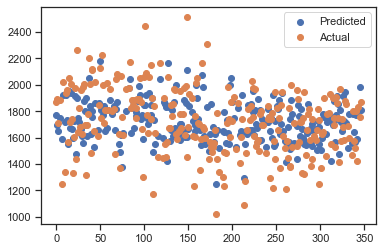

In [320]:
plt.scatter( X_train.index, model_22_32.predict(X_train), label='Predicted')
plt.scatter( y_train.index, y_train, label='Actual')
plt.legend()

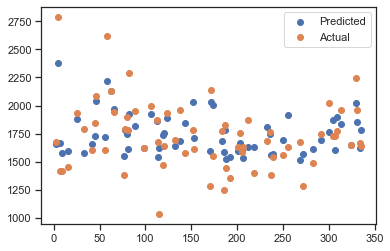

In [321]:
plt.scatter( X_test.index, model_22_32.predict(X_test), label='Predicted')
plt.scatter( y_test.index, y_test, label='Actual')
plt.legend()

In [322]:
#[246,101,34,190] is outliers in training set
#get data
df_22_train = df_22.merge(df_32['EFW_32'], left_index= True, right_index=True) #join based on left index and right index
df_22_train = pd.get_dummies(df_22_train, drop_first=True)
X = df_22_train.drop('EFW_32', axis=1)
y = df_22_train['EFW_32']

#best model to predict Wk32 using Wk22
wk_22_cols = ['GA(Day)_22', 'IUGR_22_1', 'Baby Gender_22_M', 'EFW_22', 'CM_22', 'Va_22', 'Nuchal fold_22']
X = X[wk_22_cols].drop(['IUGR_22_1', 'Baby Gender_22_M'], axis=1)
X = X.drop([246,101,34,190])
y = y.drop([246,101,34,190])
model_22_32 = Ridge(alpha=5.820097823045092, normalize=False, fit_intercept=True, solver='sparse_cg')

#test split and 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
model_22_32.fit(X_train, y_train)

Ridge(alpha=5.820097823045092, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='sparse_cg', tol=0.001)

In [323]:
visualize(X_train, y_train)

,GA(Day)_22,EFW_22,CM_22,Va_22,Nuchal fold_22,predicted,actual,diff,square_error
115,151,386,4.0,6.4,4.66,1584.329370,1033.0,551.329370,303964.073982
174,153,509,6.7,5.2,5.48,2034.956169,1548.0,486.956169,237126.310992
171,156,499,5.2,5.2,5.09,1836.533072,2308.0,471.466928,222281.064572
73,150,382,5.2,7.7,2.86,1626.427305,2067.0,440.572695,194104.299224
30,159,460,5.5,6.1,3.87,1566.139301,1981.0,414.860699,172109.399361
...,...,...,...,...,...,...,...,...,...
139,157,439,8.4,6.6,5.18,1648.029236,1652.0,3.970764,15.766967
242,159,505,5.6,5.0,5.79,1751.533092,1754.0,2.466908,6.085637
36,154,462,5.1,6.8,5.11,1779.267288,1778.0,1.267288,1.606019
93,156,503,6.2,6.2,5.55,1880.786961,1882.0,1.213039,1.471463


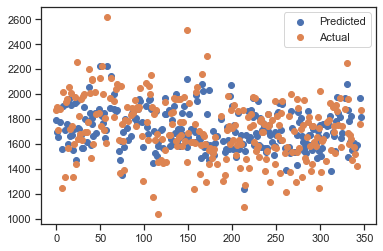

In [324]:
plt.scatter( X_train.index, model_22_32.predict(X_train), label='Predicted')
plt.scatter( y_train.index, y_train, label='Actual')
plt.legend()

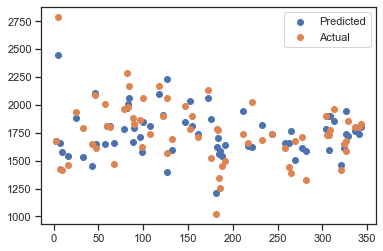

In [325]:
plt.scatter( X_test.index, model_22_32.predict(X_test), label='Predicted')
plt.scatter( y_test.index, y_test, label='Actual')
plt.legend()

In [ ]:
#this show that if GA is large, then EFW32 is small

In [246]:
#test outliers
#https://datascience.stackexchange.com/questions/54808/how-to-remove-outliers-using-box-plot
# Q1 = X['EFW_32'].quantile(0.25)
# Q3 = X['EFW_32'].quantile(0.75)
# IQR = Q3 - Q1    #IQR is interquartile range. 

# filter = (X['EFW_32'] >= Q1 - 1.5 * IQR) & (X['EFW_32'] <= Q3 + 1.5 *IQR)
# X_temp = X.loc[filter]
#This method results in better RMSE, ~185, but lower r2, ~0.33

In [332]:
#ori
df_22_train = df_22.merge(df_32['EFW_32'], left_index= True, right_index=True) #join based on left index and right index
df_22_train = pd.get_dummies(df_22_train, drop_first=True)
wk_22_cols_cross = ['GA(Day)_22', 'IUGR_22_1', 'Baby Gender_22_M', 'EFW_22', 'CM_22', 'Va_22', 'Nuchal fold_22', 'EFW_32']
df_22_train = df_22_train[wk_22_cols_cross]

model_22_32 = [Ridge(alpha=5.820097823045092, normalize=False, fit_intercept=True, solver='sparse_cg')]

In [333]:
cross_validate_models(model_22_32, df_22_train[my_cols].drop(['IUGR_22_1', 'Baby Gender_22_M'], axis=1), label_name)

Cross validation Result for EFW_32:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"Ridge(alpha=5.820097823045092, copy_X=True, fi...",0.398983,0.134947,0.445262,0.030787,-193.507701,22.016059,0.113774,-189.652307,5.510318,0.408856,0.13236,1724.60241


The best model is 
 Ridge(alpha=5.820097823045092, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='sparse_cg', tol=0.001) 
 with rmse score: -193.50770117031027
The error:11.200000000000001%
11.200000000000001


(Ridge(alpha=5.820097823045092, copy_X=True, fit_intercept=True, max_iter=None,
       normalize=False, random_state=None, solver='sparse_cg', tol=0.001),
 -193.50770117031027)

In [334]:
#to prove removing those 4 rows with high out square error helpful:
df_22_train = df_22.merge(df_32['EFW_32'], left_index= True, right_index=True) #join based on left index and right index
df_22_train = pd.get_dummies(df_22_train, drop_first=True)
df_22_train = df_22_train.drop([246,101,34,190])
wk_22_cols_cross = ['GA(Day)_22', 'IUGR_22_1', 'Baby Gender_22_M', 'EFW_22', 'CM_22', 'Va_22', 'Nuchal fold_22', 'EFW_32']
df_22_train = df_22_train[wk_22_cols_cross]

model_22_32 = [Ridge(alpha=5.820097823045092, normalize=False, fit_intercept=True, solver='sparse_cg')]

In [336]:
cross_validate_models(model_22_32, df_22_train[my_cols].drop(['IUGR_22_1', 'Baby Gender_22_M'], axis=1), 'EFW_32')

Cross validation Result for EFW_32:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"Ridge(alpha=5.820097823045092, copy_X=True, fi...",0.444375,0.105649,0.489122,0.024623,-181.93999,16.424283,0.090273,-177.982149,4.123835,0.456465,0.103526,1726.679878


The best model is 
 Ridge(alpha=5.820097823045092, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='sparse_cg', tol=0.001) 
 with rmse score: -181.9399895036154
The error:10.5%
10.5


(Ridge(alpha=5.820097823045092, copy_X=True, fit_intercept=True, max_iter=None,
       normalize=False, random_state=None, solver='sparse_cg', tol=0.001),
 -181.9399895036154)

# Wk22 + Wk32 --> Wk35

In [53]:
#get data
df_22_32_train = df_22_32.merge(df_35['EFW_35'], left_index= True, right_index=True) #join based on left index and right index
df_22_32_train = pd.get_dummies(df_22_32_train, drop_first=True)

wk22_wk32_cols = ['EFW_32', 'HC_GA_32', 'AFI_32', 'CM_22', 'Ut PI_22', 'Age_22', 'EFW_35']

X = df_22_32_train[wk22_wk32_cols].drop('EFW_35', axis=1)
y = df_22_32_train['EFW_35']

#best model to predict Wk35 using Wk22 + WK32
model_22_32_35 = [LinearRegression(normalize=False, fit_intercept=True), 
                  make_pipeline(StandardScaler(), SVR(kernel='linear', C=100, epsilon=10, gamma='scale')), 
                  Ridge(alpha=0.053121562366700195,fit_intercept=True, normalize=False, solver='cholesky'),
                  Lasso(alpha=0.27980636354454624, fit_intercept=True, normalize=False, selection='random'),
                 ]

#test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
model_22_32_35[1].fit(X_train, y_train) #best using SVR

#ori result
cross_validate_models(model_22_32_35, df_22_32_train[wk22_wk32_cols], 'EFW_35')

Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.648394,0.141143,0.682001,0.041015,-232.515781,68.780384,0.295810,-229.504709,20.382644,0.656200,0.140985,2200.417431
1,"(StandardScaler(copy=True, with_mean=True, wit...",0.667085,0.136849,0.678073,0.041439,-226.018214,67.987424,0.300805,-230.913594,20.417217,0.673344,0.137269,2200.417431
2,"Ridge(alpha=0.053121562366700195, copy_X=True,...",0.649382,0.149171,0.680026,0.041352,-231.610619,70.919016,0.306199,-230.212429,20.444088,0.657218,0.148817,2200.417431
3,"Lasso(alpha=0.27980636354454624, copy_X=True, ...",0.648545,0.145203,0.681564,0.041002,-232.212555,69.892011,0.300983,-229.663101,20.364360,0.656380,0.144962,2200.417431


The best model is 
 Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=10,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False) 
 with rmse score: -226.0182136963184
The error:10.299999999999999%
10.299999999999999


(Pipeline(memory=None,
          steps=[('standardscaler',
                  StandardScaler(copy=True, with_mean=True, with_std=True)),
                 ('svr',
                  SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=10,
                      gamma='scale', kernel='linear', max_iter=-1,
                      shrinking=True, tol=0.001, verbose=False))],
          verbose=False),
 -226.0182136963184)

In [54]:
df_35['EFW_35'].describe()

count     223.000000
mean     2192.439462
std       408.090107
min       296.000000
25%      1964.000000
50%      2131.000000
75%      2333.000000
max      3818.000000
Name: EFW_35, dtype: float64

In [56]:
visualize_model_performance(X_train, y_train, model_22_32_35[1])

,EFW_32,HC_GA_32,AFI_32,CM_22,Ut PI_22,Age_22,predicted,actual,diff,square_error
132,1695.0,1.225551,16.000000,3.4,1.12,28,2182.102026,296.0,1886.102026,3.557381e+06
44,2018.0,1.305333,15.300000,4.2,0.56,25,2690.755409,3615.0,924.244591,8.542281e+05
154,1898.0,1.379018,13.600000,6.7,0.97,28,2650.706292,3421.0,770.293708,5.933524e+05
12,1964.0,1.277876,12.900000,7.3,0.73,29,2467.541944,1888.0,579.541944,3.358689e+05
18,1744.0,1.304444,18.700000,5.1,0.35,37,2484.708629,3012.0,527.291371,2.780362e+05
...,...,...,...,...,...,...,...,...,...,...
163,1356.0,1.245794,7.000000,5.4,0.54,26,1751.331568,1757.0,5.668432,3.213112e+01
114,1678.0,1.279111,13.300000,4.5,0.63,22,2248.322504,2252.0,3.677496,1.352398e+01
20,1601.0,1.258667,11.100000,4.8,0.77,35,2098.791291,2096.0,2.791291,7.791307e+00
108,1740.0,1.300439,12.632277,8.3,1.05,36,2268.938315,2268.0,0.938315,8.804358e-01


In [57]:
visualize_model_performance(X_test, y_test, model_22_32_35[1])

,EFW_32,HC_GA_32,AFI_32,CM_22,Ut PI_22,Age_22,predicted,actual,diff,square_error
141,1778.0,1.309692,14.300000,5.8,0.92,35,2412.207126,3008.0,595.792874,354969.149140
58,2621.0,1.352632,23.200000,5.0,1.08,30,3475.182394,3818.0,342.817606,117523.910815
323,1574.0,1.316290,12.819155,3.4,0.88,31,2251.347461,1918.0,333.347461,111120.529857
137,1586.0,1.257965,11.400000,4.0,0.76,27,2090.463485,1797.0,293.463485,86120.816937
246,1220.0,1.306280,16.700000,5.7,1.21,28,1864.072617,2139.0,274.927383,75585.065968
146,1621.0,1.315179,10.900000,5.1,0.74,26,2229.947947,2002.0,227.947947,51960.266389
306,1462.0,1.279736,14.100000,8.4,0.70,26,1969.850893,2189.0,219.149107,48026.331136
112,1632.0,1.293750,12.820500,4.6,0.81,32,2235.263509,2031.0,204.263509,41723.581033
281,1949.0,1.243220,16.900000,4.5,0.24,38,2534.359913,2335.0,199.359913,39744.374910
33,1789.0,1.313596,13.100000,4.6,0.61,29,2447.871568,2254.0,193.871568,37586.184809


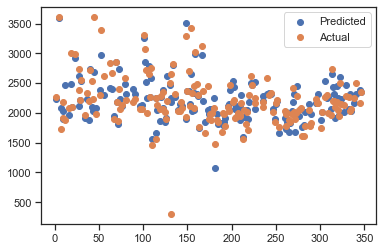

In [59]:
plt.scatter( X_train.index, model_22_32_35[1].predict(X_train), label='Predicted')
plt.scatter( y_train.index, y_train, label='Actual')
plt.legend()

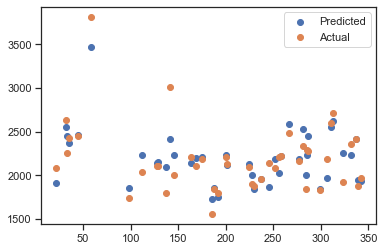

In [60]:
plt.scatter( X_test.index, model_22_32_35[1].predict(X_test), label='Predicted')
plt.scatter( y_test.index, y_test, label='Actual')
plt.legend()

In [70]:
#drop outliers [132,44,154]
#get data
df_22_32_train = df_22_32.merge(df_35['EFW_35'], left_index= True, right_index=True) #join based on left index and right index
df_22_32_train = pd.get_dummies(df_22_32_train, drop_first=True)
df_22_32_train.drop([132,44,154], axis=0, inplace=True)

wk22_wk32_cols = ['EFW_32', 'HC_GA_32', 'AFI_32', 'CM_22', 'Ut PI_22', 'Age_22', 'EFW_35']

X = df_22_32_train[wk22_wk32_cols].drop('EFW_35', axis=1)
y = df_22_32_train['EFW_35']

#best model to predict Wk35 using Wk22 + WK32
model_22_32_35 = [LinearRegression(normalize=False, fit_intercept=True), 
                  make_pipeline(StandardScaler(), SVR(kernel='linear', C=100, epsilon=10, gamma='scale')), 
                  Ridge(alpha=0.053121562366700195,fit_intercept=True, normalize=False, solver='cholesky'),
                  Lasso(alpha=0.27980636354454624, fit_intercept=True, normalize=False, selection='random'),
                 ]

#test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
model_22_32_35[1].fit(X_train, y_train) #best using SVR
#ridge second best
model_22_32_35[2].fit(X_train, y_train) #best using SVR

#result after removing outliers
cross_validate_models(model_22_32_35, df_22_32_train[wk22_wk32_cols], 'EFW_35')

Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.733233,0.093173,0.774393,0.018030,-181.033903,20.394121,0.112654,-174.514172,4.978536,0.739491,0.092611,2197.018605
1,"(StandardScaler(copy=True, with_mean=True, wit...",0.735888,0.093029,0.770629,0.018257,-179.933316,19.114151,0.106229,-175.963446,4.928944,0.741635,0.092586,2197.018605
2,"Ridge(alpha=0.053121562366700195, copy_X=True,...",0.732605,0.095690,0.773076,0.018158,-181.121720,21.640317,0.119479,-175.022977,5.010707,0.739205,0.095253,2197.018605
3,"Lasso(alpha=0.27980636354454624, copy_X=True, ...",0.732569,0.094800,0.773851,0.018047,-181.187727,21.271268,0.117399,-174.724076,4.968611,0.739040,0.094317,2197.018605


The best model is 
 Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=10,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False) 
 with rmse score: -179.9333163883205
The error:8.200000000000001%
8.200000000000001


(Pipeline(memory=None,
          steps=[('standardscaler',
                  StandardScaler(copy=True, with_mean=True, with_std=True)),
                 ('svr',
                  SVR(C=100, cache_size=200, coef0=0.0, degree=3, epsilon=10,
                      gamma='scale', kernel='linear', max_iter=-1,
                      shrinking=True, tol=0.001, verbose=False))],
          verbose=False),
 -179.9333163883205)

In [71]:
visualize_model_performance(X_train, y_train, model_22_32_35[1])

,EFW_32,HC_GA_32,AFI_32,CM_22,Ut PI_22,Age_22,predicted,actual,diff,square_error
12,1964.0,1.277876,12.900000,7.3,0.73,29,2483.726516,1888.0,595.726516,354890.081959
18,1744.0,1.304444,18.700000,5.1,0.35,37,2496.474665,3012.0,515.525335,265766.370603
42,1602.0,1.286239,11.500000,6.4,1.48,34,2088.985601,2537.0,448.014399,200716.902060
127,2058.0,1.318534,11.000000,7.3,0.79,27,2628.508935,2199.0,429.508935,184477.925602
157,1603.0,1.255947,8.500000,4.9,0.85,31,2031.887904,2457.0,425.112096,180720.293838
...,...,...,...,...,...,...,...,...,...,...
29,1631.0,1.281250,12.700000,4.6,0.66,38,2217.092661,2213.0,4.092661,16.749875
108,1740.0,1.300439,12.632277,8.3,1.05,36,2270.158883,2268.0,2.158883,4.660775
20,1601.0,1.258667,11.100000,4.8,0.77,35,2094.241712,2096.0,1.758288,3.091575
346,1868.0,1.291228,7.600000,6.0,0.73,32,2350.133514,2349.0,1.133514,1.284853


In [72]:
visualize_model_performance(X_test, y_test, model_22_32_35[1])

,EFW_32,HC_GA_32,AFI_32,CM_22,Ut PI_22,Age_22,predicted,actual,diff,square_error
141,1778.0,1.309692,14.300000,5.8,0.92,35,2415.298004,3008.0,592.701996,351295.656260
63,1805.0,1.295633,14.100000,6.3,0.48,39,2428.944660,2839.0,410.055340,168145.382226
202,1911.0,1.321053,11.100000,5.0,0.87,27,2526.999120,2186.0,340.999120,116280.399849
323,1574.0,1.316290,12.819155,3.4,0.88,31,2239.240999,1918.0,321.240999,103195.779607
305,1733.0,1.386222,14.100000,6.3,0.85,32,2521.968017,2262.0,259.968017,67583.369714
149,2516.0,1.434667,18.600000,5.3,0.79,34,3536.397227,3296.0,240.397227,57790.826887
203,1753.0,1.324779,14.900000,6.3,0.73,34,2432.455708,2211.0,221.455708,49042.630546
306,1462.0,1.279736,14.100000,8.4,0.70,26,1970.205007,2189.0,218.794993,47871.249155
190,1231.0,1.312000,12.680451,6.6,1.56,32,1774.733568,1992.0,217.266432,47204.702511
33,1789.0,1.313596,13.100000,4.6,0.61,29,2446.896068,2254.0,192.896068,37208.893059


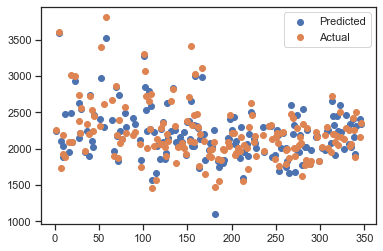

In [390]:
plt.scatter( X_train.index, model_22_32_35[1].predict(X_train), label='Predicted')
plt.scatter( y_train.index, y_train, label='Actual')
plt.legend()

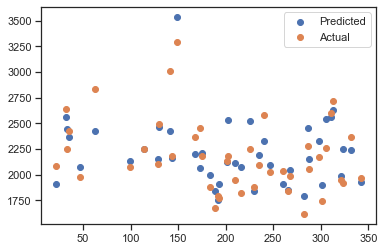

In [391]:
plt.scatter( X_test.index, model_22_32_35[1].predict(X_test), label='Predicted')
plt.scatter( y_test.index, y_test, label='Actual')
plt.legend()

In [408]:
#coef in ridge (approximate to SVR)
my_df = pd.DataFrame(model_22_32_35[2].coef_, X.columns, columns=['coef'])
my_df['mean'] = X_train.mean()
my_df

,coef,mean
EFW_32,1.037510,1661.366279
HC_GA_32,1740.193359,1.283977
AFI_32,19.923814,12.073608
CM_22,-17.722954,5.490116
Ut PI_22,-18.513140,1.001453
Age_22,2.031047,31.470930


# Further post-hoc after removing outliers (features changed) - Stage 2

- After removing the outliers, the feature selections method generated different results

## Wk22 -> Wk32

In [40]:
df_22_train = df_22.drop([246,101,34,190])#outliers
df_22_train = df_22_train.merge(df_32['EFW_32'], left_index= True, right_index=True) #join based on left index and right index

#1-hot encoding
df_22_train = pd.get_dummies(df_22_train, drop_first=True)
df_22_train = df_22_train.drop('IUGR_22_1', axis=1)

wk22_cols = ['EFW_22', 'GA(Day)_22', 'Baby Gender_22_M', 'CM_22', 'Ut PI_22', 'Va_22', 'Nuchal fold_22', 'Hem_22', 'BPD_22', 'EFW_32'] #IUGR not possible

X = df_22_train[wk22_cols].drop('EFW_32', axis=1)
y = df_22_train['EFW_32']


models_22 = [LinearRegression(normalize=True, fit_intercept=True), 
          Ridge(alpha=12.340769010376022, normalize=False, fit_intercept=True, solver='auto'),
          Lasso(alpha=1.0405895699434454e-05, normalize=False, fit_intercept=True, selection='cyclic'),
          make_pipeline(StandardScaler(), SVR(kernel='linear', C=1000, epsilon=100, gamma='scale')),
         ]

print('Prediction of WK32 using WK22 my elimination after tuning.')
# cross_validate_models(models, X[my_cols], label_name)
cross_validate_models(models_22, df_22_train[wk22_cols], 'EFW_32')

#conclude:
#with IUGR and baby gender:  best rmse
#with baby gender: better
#nothing: worse

Prediction of WK32 using WK22 my elimination after tuning.
Cross validation Result for EFW_32:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.472853,0.097627,0.529201,0.022460,-177.370887,17.020830,0.095962,-170.867243,4.262828,0.486333,0.095395,1726.679878
1,"Ridge(alpha=12.340769010376022, copy_X=True, f...",0.474197,0.097946,0.528072,0.022499,-177.135768,16.999321,0.095968,-171.071945,4.259545,0.487447,0.095685,1726.679878
2,"Lasso(alpha=1.0405895699434454e-05, copy_X=Tru...",0.472853,0.097627,0.529201,0.022460,-177.370887,17.020829,0.095962,-170.867243,4.262828,0.486333,0.095395,1726.679878
3,"(StandardScaler(copy=True, with_mean=True, wit...",0.480197,0.095346,0.526101,0.022671,-176.130056,16.727602,0.094973,-171.428575,4.285289,0.492354,0.094185,1726.679878


The best model is 
 Pipeline(memory=None,
         steps=[('standardscaler',
                 StandardScaler(copy=True, with_mean=True, with_std=True)),
                ('svr',
                 SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=100,
                     gamma='scale', kernel='linear', max_iter=-1,
                     shrinking=True, tol=0.001, verbose=False))],
         verbose=False) 
 with rmse score: -176.13005629435443
The error:10.2%
10.2


(Pipeline(memory=None,
          steps=[('standardscaler',
                  StandardScaler(copy=True, with_mean=True, with_std=True)),
                 ('svr',
                  SVR(C=1000, cache_size=200, coef0=0.0, degree=3, epsilon=100,
                      gamma='scale', kernel='linear', max_iter=-1,
                      shrinking=True, tol=0.001, verbose=False))],
          verbose=False),
 -176.13005629435443)

In [41]:
#test split and 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
models_22[1].fit(X_train, y_train) #train ridge as SVM do not have coef params.

Ridge(alpha=12.340769010376022, copy_X=True, fit_intercept=True, max_iter=None,
      normalize=False, random_state=None, solver='auto', tol=0.001)

In [45]:
X_train.describe()

,EFW_22,GA(Day)_22,Baby Gender_22_M,CM_22,Ut PI_22,Va_22,Nuchal fold_22,Hem_22,BPD_22
count,262.000000,262.000000,262.000000,262.000000,262.000000,262.000000,262.000000,262.000000,262.000000
mean,435.603053,153.179389,0.465649,5.645802,0.971011,6.505382,4.483855,25.405191,52.638550
std,66.769826,4.655392,0.499773,1.237706,0.432739,0.835867,0.779891,2.071894,3.475288
min,284.000000,141.000000,0.000000,1.900000,0.240000,4.100000,2.300000,20.700000,32.000000
25%,392.250000,150.250000,0.000000,4.800000,0.732500,5.900000,3.952500,24.100000,50.800000
50%,429.500000,152.000000,0.000000,5.500000,0.880000,6.500000,4.505000,25.400000,52.300000
75%,467.750000,156.000000,1.000000,6.400000,1.050000,7.100000,5.027500,26.575000,54.500000
max,779.000000,181.000000,1.000000,10.000000,3.160000,8.800000,6.660000,32.500000,64.800000


In [55]:
y_train

193    1482.0
17     2008.0
24     1639.0
140    1957.0
121    1446.0
        ...  
198    1873.0
77     1386.0
113    1872.0
286    1777.0
109    1898.0
Name: EFW_32, Length: 262, dtype: float64

In [46]:
X_train

,EFW_22,GA(Day)_22,Baby Gender_22_M,CM_22,Ut PI_22,Va_22,Nuchal fold_22,Hem_22,BPD_22
193,386,152,1,4.9,1.56,6.1,3.53,23.2,49.5
17,486,153,1,4.8,0.88,6.7,5.99,26.3,54.8
24,420,151,0,4.4,0.89,5.1,5.30,23.1,49.0
140,419,152,0,4.5,0.97,6.6,4.56,23.5,50.0
121,363,150,0,5.0,0.74,5.8,5.20,24.0,50.5
...,...,...,...,...,...,...,...,...,...
198,463,148,1,6.9,1.27,6.4,5.67,25.6,53.8
77,529,165,0,5.3,2.67,5.9,3.20,30.6,60.6
113,445,151,1,6.4,1.07,6.7,5.05,27.4,54.3
286,508,156,0,5.1,1.04,7.1,4.18,24.5,49.9


In [62]:
X_train.iloc[0] @  models_22[1].coef_ + models_22[1].intercept_ #predict formula

1475.325251364071

In [54]:
models_22[1].predict(X_train.iloc[0:1])

array([1475.32525136])

In [48]:
models_22[1].coef_

array([  3.84437225, -40.73452298, -68.20054835,  25.12895133,
       -50.13980392,  12.94470423,  20.55123018, -10.35799101,
         4.98152765])

In [61]:
models_22[1].intercept_

6048.543070462445

In [109]:
#coef in ridge (approximate to SVR)
my_df = pd.DataFrame(models_22[1].coef_, X_train.columns, columns=['coef'])
my_df['mean'] = X_train.mean()
display(my_df)
print('intercept:', models_22[1].intercept_)
print(f"Formula: \n\
{X_train.columns[0]}*{my_df['coef'][0]:.3f} + \
{X_train.columns[1]}*{my_df['coef'][1]:.3f} + \
{X_train.columns[2]}*{my_df['coef'][2]:.3f} + \
{X_train.columns[3]}*{my_df['coef'][3]:.3f} + \
{X_train.columns[4]}*{my_df['coef'][4]:.3f} + \
{X_train.columns[5]}*{my_df['coef'][5]:.3f} + \
{X_train.columns[6]}*{my_df['coef'][6]:.3f} + \
{X_train.columns[7]}*{my_df['coef'][7]:.3f} + \
{X_train.columns[8]}*{my_df['coef'][8]:.3f} + \
{models_22[1].intercept_:.3f}")

,coef,mean
EFW_22,3.844372,435.603053
GA(Day)_22,-40.734523,153.179389
Baby Gender_22_M,-68.200548,0.465649
CM_22,25.128951,5.645802
Ut PI_22,-50.139804,0.971011
Va_22,12.944704,6.505382
Nuchal fold_22,20.551230,4.483855
Hem_22,-10.357991,25.405191
BPD_22,4.981528,52.638550


intercept: 6048.543070462445
Formula: 
EFW_22*3.844 + GA(Day)_22*-40.735 + Baby Gender_22_M*-68.201 + CM_22*25.129 + Ut PI_22*-50.140 + Va_22*12.945 + Nuchal fold_22*20.551 + Hem_22*-10.358 + BPD_22*4.982 + 6048.543


In [71]:
my_df['coef'][0]

3.844372250682724

## Wk22 + Wk32 -> Wk35

In [110]:
#drop the outliers [132,44,154]
df_22_32_train = df_22_32.drop([132,44,154])
df_22_32_train = df_22_32_train.merge(df_35['EFW_35'], left_index= True, right_index=True) #join based on left index and right index

#1-hot encoding
df_22_32_train = pd.get_dummies(df_22_32_train, drop_first=True)

wk22_wk32_cols = ['EFW_32', 'HC_GA_32', 'AFI_32', 'FL/HC_32', 'FEMUR_32', 'CM_22', 'Nuchal fold_22', 'Va_22', 'Hem_22', 'Age_22', 'EFW_35']

X = df_22_32_train[wk22_wk32_cols].drop('EFW_35', axis=1)
y = df_22_32_train['EFW_35']

model_22_32 = [LinearRegression(normalize=False, fit_intercept=True), 
               make_pipeline(StandardScaler(), SVR(kernel='linear', C=1000, epsilon=100, gamma='scale')), 
               Ridge(alpha=0.000706258210160292,fit_intercept=True, normalize=False, solver='svd'),
               Lasso(alpha=0.00047745705399706933, fit_intercept=True, normalize=True, selection='cyclic'),
              ]

print('After Tuning:')
cross_validate_models(model_22_32, df_22_32_train[wk22_wk32_cols], 'EFW_35')

After Tuning:
Cross validation Result for EFW_35:


,Models,test_r2_mean,test_r2_std,train_r2_mean,train_r2_std,test_neg_rmse_mean,test_neg_rmse_std,coef_var_rmse,train_neg_rmse_mean,train_neg_rmse_std,test_explained_variance_mean,test_explained_variance_std,y_mean
0,"LinearRegression(copy_X=True, fit_intercept=Tr...",0.739008,0.096910,0.789430,0.018170,-178.580304,21.517129,0.120490,-168.564853,5.225793,0.745211,0.097068,2197.018605
1,"(StandardScaler(copy=True, with_mean=True, wit...",0.738555,0.096172,0.784176,0.019086,-178.964248,22.437911,0.125377,-170.647500,5.558305,0.744959,0.096888,2197.018605
2,"Ridge(alpha=0.000706258210160292, copy_X=True,...",0.739432,0.095779,0.789191,0.018163,-178.502385,21.324106,0.119461,-168.661388,5.215844,0.745716,0.095836,2197.018605
3,"Lasso(alpha=0.00047745705399706933, copy_X=Tru...",0.739012,0.096909,0.789430,0.018170,-178.579187,21.516535,0.120487,-168.564855,5.225793,0.745214,0.097067,2197.018605


The best model is 
 Ridge(alpha=0.000706258210160292, copy_X=True, fit_intercept=True,
      max_iter=None, normalize=False, random_state=None, solver='svd',
      tol=0.001) 
 with rmse score: -178.50238495982714
The error:8.1%
8.1


(Ridge(alpha=0.000706258210160292, copy_X=True, fit_intercept=True,
       max_iter=None, normalize=False, random_state=None, solver='svd',
       tol=0.001),
 -178.50238495982714)

In [111]:
#test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)
model_22_32[2].fit(X_train, y_train) #best using Ridge

Ridge(alpha=0.000706258210160292, copy_X=True, fit_intercept=True,
      max_iter=None, normalize=False, random_state=None, solver='svd',
      tol=0.001)

In [114]:
#coef in ridge (approximate to SVR)
my_df = pd.DataFrame(model_22_32[2].coef_, X.columns, columns=['coef'])
my_df['mean'] = X_train.mean()
display(my_df)
print('intercept:',model_22_32[2].intercept_)
print(f"Formula: \n\
{X_train.columns[0]}*{my_df['coef'][0]:.3f} + \
{X_train.columns[1]}*{my_df['coef'][1]:.3f} + \
{X_train.columns[2]}*{my_df['coef'][2]:.3f} + \
{X_train.columns[3]}*{my_df['coef'][3]:.3f} + \
{X_train.columns[4]}*{my_df['coef'][4]:.3f} + \
{X_train.columns[5]}*{my_df['coef'][5]:.3f} + \
{X_train.columns[6]}*{my_df['coef'][6]:.3f} + \
{X_train.columns[7]}*{my_df['coef'][7]:.3f} + \
{X_train.columns[8]}*{my_df['coef'][8]:.3f} + \
{model_22_32[2].intercept_:.3f}")

,coef,mean
EFW_32,1.023821,1657.354651
HC_GA_32,2345.285404,1.283648
AFI_32,20.200291,12.183727
FL/HC_32,6373.742359,0.206395
FEMUR_32,-12.136391,59.403488
CM_22,-15.389824,5.401163
Nuchal fold_22,49.576761,4.421512
Va_22,44.385685,6.509186
Hem_22,-9.774726,25.192442
Age_22,1.923715,31.482558


intercept: -3587.6956452400373
Formula: 
EFW_32*1.024 + HC_GA_32*2345.285 + AFI_32*20.200 + FL/HC_32*6373.742 + FEMUR_32*-12.136 + CM_22*-15.390 + Nuchal fold_22*49.577 + Va_22*44.386 + Hem_22*-9.775 + -3587.696


In [113]:
df_22[['Baby Gender_22', 'EFW_22']].groupby('Baby Gender_22').mean()

,EFW_22
Baby Gender_22,
F,424.913978
M,448.956522


In [53]:
test_df = pd.DataFrame()
test_df['Baby Gender_22'] = df_22['Baby Gender_22']
test_df['EFW_32'] = df_32['EFW_32']

test_df.groupby('Baby Gender_22').sum()

,EFW_32
Baby Gender_22,
F,176
M,156


## Some thoughts to be implemented in future

1. Research for extra datasets in different country (currently only in Singapore)
2. Feature engineer some interesting features.

# Ends

In [ ]:
raise Exception 

# Testing Area

In [ ]:
#normal way
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

#create regressor object 
regressor = RandomForestRegressor(n_estimators = 100, random_state = 42) 
  
#fit the regressor with x and y data 
regressor.fit(X_train, y_train)

#predict
y_pred = regressor.predict(X_test)

#evaluate model 
print('Score:', regressor.score(X_test, y_test))
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

In [ ]:
linearReg = LinearRegression()
cv_linearReg = cross_validate(linearReg, X, y, cv=9)
print(cv['test_score'])
print(cv['test_score'].mean())

In [ ]:
linearReg_pred

In [ ]:
regressor.train(X, y)

In [ ]:
#K folds
score = []

kf = KFold(n_splits=10, random_state=None, shuffle=True)
for train_index, test_index in kf.split(X):
#     print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X.values[train_index], X.values[test_index]
    y_train, y_test = y.values[train_index], y.values[test_index]
    
    #create regressor object 
    regressor = RandomForestRegressor(n_estimators = 100, random_state = None) 

    #fit the regressor with x and y data 
    regressor.fit(X_train, y_train)
    
    #predict
    y_pred = regressor.predict(X_test)
    score.append(regressor.score(X_test, y_test))
    #evaluate model 
#     print('Score:', regressor.score(X_test, y_test))
#     print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
#     print('Mean Squared Error:', metrics.mean_squared_error(y_test, y_pred))
#     print('Root Mean Squared Error:', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

In [ ]:
'''
Yi Chong

1.	Pre-processing Data (Week 2 – Week 4)
    a.	Trying to find the correlation between data and filter out the useful features.
    b.	Standardize the data.
        i.	Scaling or Normalize (if needed by model)
    c.	Filling the missing data with machine learning model too (Random Forest).
    
2.	Train+evaluating various models (Week 5 – Week 12)
    a.	Week 22 features as input – to predict FW/percentile in week 22, 32, 35
    b.	Week 22 and week 32 features as input – to predict BW in week 35 (increase accuracy)
    c.	May consider to use deep learning.
    
3.	Report Writing (Week 13 – Week 14)

Findings:

Why need to estimate fetal weight? 
    - Let doctor to take action if the weight is abnormal in particular gestational age
    - detection of growth abnormalities may  help to prevent  fetal demise and manage perinatal complications 
      more appropriately , monitoring of fetal growth is an important part of antepartum care.

    Hadlock formulae – Uses Head circumference, abdominal circumference, femur length, biparietal diameter, humerus length to estimate Fetal Weight.
    Shepard: Log 10 (weight) = -1.7492+ 0.166*BPD +0.046*AC - 2.646*(AC*BPD)/1,000
    Hadlock 1: Log 10 (weight) = 1.304+0.05281*Ac+0.1938*FL -0.004*AC*FL
    Hadlock 2: Log 10 (weight) = 1.335-0.0034*AC*FL+ 0.0316*BPD+0.0457*AC +0.1623*FL
    Hadlock 3: Log 10 (weight) =1.326-0.00326 *AC*FL+0.0107*HC +0.0438*AC + 0.158*FL
    Hadlock 4: Log10 (weight) =1.3596 -0.00386* AC * FL+0.0064*HC+0.00061*BPD*AC+ 0.0424*AC+0.174*FL

    The Hadlock A formula remains the most reliable regression method, producing the smallest random errors.
    (unable to check exactly the amount of errors - the pdf of the citation need to pay.)
    
    (2018 Feb) ultrasound calculation of EFW consistently producing random errors below 10%, 
    
    - This machine learning method can make the random errors lesser (experimenting)
    - The Doctors will no need to consider so many formulae to predict the estimated fetal weight

'''

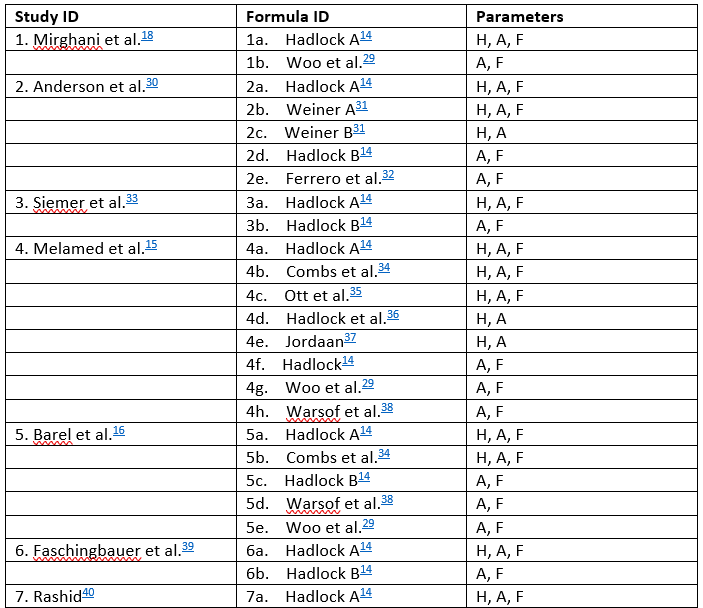

# Notes

In [ ]:
#tmr
'''
1. Fill in those missing value by training models - Done
2. Apply all pre-processing techniques (like standardize or normalize) on the machine learning algo and 
   get the highest accuracy as possible (by plotting a graph)
3. Test various tweaking in the algo.
4. Select K best

19/04/2021
5. Improve the model and learn what others people do to improve
6. Stepwise backward elimination

25/04/2021
7. Forward elimination
8. Feature importances using random forest

28/04/2021
9. Remove all unnecessary info!

17/05/2021

imputation techniques r2
which to imputate - only wk32
result - improve abit ~0.05 r2

standard deviation error
feature selection - correlation, manually filter.
outliers, medians
find reasons behind r2 and rmse, ways to improve them

21/05/2021
10. Test all combination of features

31/5/2021

-Ensemble Learning in Machine Learning
-Use the best model and manually investigate - create a model, then go deep into the data
-- plot graph - y = error / actual data
-- anymore possible graph
-SHAP value?

remove IUGR22 & baby gender
To know which rows error alot, then analysis which part make it.
Outliers: eat durians to improve the growth
Relationship of EFW and GA since GA is diff for each baby

11/06/2021

outliers - remove or not? 
coef_ - find out that how the coef is relatable, logical, find paper behind to support.
SHAP analysis - how to apply

12/07/2021
Plot the RMSE of each CV against each model? maybe using Leave one Out LOOCV techniques.

'''